In [1]:
%matplotlib inline

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
import glob
import h5py

In [4]:
import os
import sys
import time
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# pytorch
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader, SubsetRandomSampler, random_split

# sklearn functions
from sklearn.metrics import accuracy_score, roc_auc_score
from sklearn.model_selection import train_test_split, KFold, GroupShuffleSplit

# load functions from nitorch
sys.path.insert(0,"/analysis/fabiane/phd/nitorch/")
from nitorch.data import load_nifti
from nitorch.transforms import  ToTensor, SagittalTranslate, SagittalFlip, \
                                AxialTranslate, normalization_factors, Normalize, \
                                IntensityRescale
from nitorch.callbacks import EarlyStopping, ModelCheckpoint
from nitorch.trainer import Trainer
from nitorch.initialization import weights_init
from nitorch.metrics import balanced_accuracy, sensitivity, specificity
from nitorch.utils import count_parameters

In [5]:
import random
from models_ukb import ModelLiu
from hyperparameter_options import params_liu as hyperparams

In [6]:
torch.__version__

'1.0.0'

In [7]:
gpu = 4
multi_gpus = None #[5, 6]
zero_one_normalize = False
dtype = np.float64

In [8]:
# load mask
mask = None

In [9]:
table = "/ritter/share/projects/UKbiobank/Eitel_ICD/tables/participants_transMRI_T1-ICD10_G_binary-under.csv"

In [10]:
# load dataset and show first 5 rows
df = pd.read_csv(table)
df.head()

,Unnamed: 0,PTID,file_path,T2,Encoded anonymised participant ID,T1 structural brain images - NIFTI Index: 2.0,T2 FLAIR structural brain images - NIFTI Index: 2.0,Functional brain images - task - NIFTI Index: 2.0,Sex,ICD10_F_cat,...,Illness2Years2,MoodSwings_diff,Sensitivity_diff,Nervous_diff,Worrier_diff,TenseHighlyStung_diff,Loneliness_diff,RiskTaking_diff,Happiness_diff,FamilyRelation_diff
0,0,1100042,/analysis/ritter/data/UKbiobank/UKBiobank_BIDS...,/analysis/ritter/data/UKbiobank/UKBiobank_BIDS...,1100042,20252_2_0,20253_2_0,20249_2_0,Female,[],...,0None,0YY,0YY,1NN,0YY,1NN,1NN,1NN,9Na,9Na
1,1,1100675,/analysis/ritter/data/UKbiobank/UKBiobank_BIDS...,/analysis/ritter/data/UKbiobank/UKBiobank_BIDS...,1100675,20252_2_0,20253_2_0,20249_2_0,Female,[],...,0None,1NN,9else,1NN,0YY,9else,1NN,9else,9Na,9Na
2,2,1180478,/analysis/ritter/data/UKbiobank/UKBiobank_BIDS...,/analysis/ritter/data/UKbiobank/UKBiobank_BIDS...,1180478,20252_2_0,20253_2_0,20249_2_0,Female,[],...,0None,0YY,0YY,1NN,2YN,0YY,1NN,0YY,9Na,9Na
3,3,1112124,/analysis/ritter/data/UKbiobank/UKBiobank_BIDS...,/analysis/ritter/data/UKbiobank/UKBiobank_BIDS...,1112124,20252_2_0,20253_2_0,20249_2_0,Male,[],...,0None,9else,0YY,0YY,0YY,9else,1NN,1NN,9Na,9Na
4,4,1148079,/analysis/ritter/data/UKbiobank/UKBiobank_BIDS...,/analysis/ritter/data/UKbiobank/UKBiobank_BIDS...,1148079,20252_2_0,20253_2_0,20249_2_0,Female,[],...,3SitY,3NY,0YY,3NY,0YY,3NY,1NN,1NN,9Na,9Na


In [11]:
# shuffle the dataset
df = df.sample(frac=0.2, random_state=23)
df.head()

,Unnamed: 0,PTID,file_path,T2,Encoded anonymised participant ID,T1 structural brain images - NIFTI Index: 2.0,T2 FLAIR structural brain images - NIFTI Index: 2.0,Functional brain images - task - NIFTI Index: 2.0,Sex,ICD10_F_cat,...,Illness2Years2,MoodSwings_diff,Sensitivity_diff,Nervous_diff,Worrier_diff,TenseHighlyStung_diff,Loneliness_diff,RiskTaking_diff,Happiness_diff,FamilyRelation_diff
791,791,1109592,/analysis/ritter/data/UKbiobank/UKBiobank_BIDS...,/analysis/ritter/data/UKbiobank/UKBiobank_BIDS...,1109592,20252_2_0,20253_2_0,20249_2_0,Female,[],...,0None,1NN,3NY,1NN,0YY,1NN,1NN,3NY,MH.VH,VH.VH
1705,1705,1197086,/analysis/ritter/data/UKbiobank/UKBiobank_BIDS...,/analysis/ritter/data/UKbiobank/UKBiobank_BIDS...,1197086,20252_2_0,20253_2_0,20249_2_0,Male,[],...,0None,0YY,0YY,9else,2YN,3NY,0YY,1NN,9Na,9Na
167,167,1092621,/analysis/ritter/data/UKbiobank/UKBiobank_BIDS...,/analysis/ritter/data/UKbiobank/UKBiobank_BIDS...,1092621,20252_2_0,20253_2_0,20249_2_0,Female,[],...,"4SitR,5DocR",2YN,1NN,1NN,1NN,1NN,3NY,1NN,9Na,9Na
331,331,1037619,/analysis/ritter/data/UKbiobank/UKBiobank_BIDS...,/analysis/ritter/data/UKbiobank/UKBiobank_BIDS...,1037619,20252_2_0,20253_2_0,20249_2_0,Male,[],...,0None,2YN,0YY,3NY,3NY,1NN,1NN,0YY,9Na,9Na
651,651,1161652,/analysis/ritter/data/UKbiobank/UKBiobank_BIDS...,/analysis/ritter/data/UKbiobank/UKBiobank_BIDS...,1161652,20252_2_0,20253_2_0,20249_2_0,Male,[],...,0None,3NY,3NY,1NN,0YY,1NN,3NY,2YN,9Na,9Na


In [12]:
df.groupby(["Sex"])["PTID"].count()

Sex
Female    202
Male      169
Name: PTID, dtype: int64

In [13]:
# instantiate ToTensor object
to_tensor = ToTensor()

def draw_patch(img, patch_size, all_locs=False):
    """
    Draw a patch from the image based on the specified size. 
    By default draws randomly but setting all_locs = True
    returns all possible patches in a batch.
    
    Params:
        all_locs - set to True returns all patches
    """
    img_shape = img.shape
    patch_pot_locs = [[0, int(patch_size[dim]*0.5), patch_size[dim]] for dim in range(len(img_shape))]
    # check correct size
    for dim in range(len(img_shape)):
        assert(np.max(patch_pot_locs[dim]) + patch_size[dim] <= img_shape[dim])
        
    if all_locs:
        # return all locations
        patches = []
        #num_patches_per_dim = [reduce((lambda x, y: x*y), dim_list) for dim_list in patch_pot_locs]
        #num_patches_per_dim = [len(dim_list) for dim_list in patch_pot_locs]
        all_locs = list(product(*patch_pot_locs))
        for patch_locs in all_locs:
            patch = img[patch_locs[0]:patch_locs[0]+patch_size[0],
                    patch_locs[1]:patch_locs[1]+patch_size[1],
                    patch_locs[2]:patch_locs[2]+patch_size[2]]
            patches.append(patch)
        return patches
    else:
        # return random location
        patch_locs = [random.choice(patch_pot_locs[dim]) for dim in range(len(img_shape))]
        #patch_locs = [patch_pot_locs[dim][1] for dim in range(len(img_shape))] ### Use the same patch each round
        patch = img[patch_locs[0]:patch_locs[0]+patch_size[0],
                    patch_locs[1]:patch_locs[1]+patch_size[1],
                    patch_locs[2]:patch_locs[2]+patch_size[2]]
        return patch

class UKBGDataset(Dataset):
    def __init__(self, dataframe, transform=None, mask=None, z_factor=None, patched=False, all_locs=False):
        self.df = dataframe
        self.transform = transform
        self.mask = mask
        self.z_factor = z_factor
        self.patched = patched
        self.all_locs = all_locs
        
    def __len__(self):
        return len(self.df)
    
    def __getitem__(self, idx):
        if isinstance(idx, torch.FloatTensor):
            idx = idx.item()
        idx = int(idx)
        
        path = self.df.iloc[idx]['file_path']
        path = path.replace("/analysis/ritter", "/ritter/share")
        image = load_nifti(path, mask=self.mask, z_factor=self.z_factor)
        
        label = self.df.iloc[idx]['Sex']
        label = torch.FloatTensor([int(label == "Male")])
        
        if self.transform:
            image = self.transform(image)
        
        if self.patched:
            reshaped_img = image[15:160,25:196,5:155]
            #reshaped_img = image[8:85,10:105,5:85]
            patch_size = [s//k for s, k in zip(reshaped_img.shape, [2, 3, 2])]
            image = draw_patch(reshaped_img, patch_size, all_locs=self.all_locs)
        
        # normalize by max
        image /= np.max(image)
        
        image = to_tensor(image)
            
        sample = {"image" : image,
                 "label" : label}
        return sample

In [14]:
augmentations = [SagittalTranslate(dist=(4))]

In [15]:
ukb_data_train = UKBGDataset(df, transform=transforms.Compose(augmentations), mask=mask, patched=False)#, z_factor=0.525)

In [16]:
img = ukb_data_train[0]["image"]

In [17]:
img.shape

torch.Size([1, 182, 218, 182])

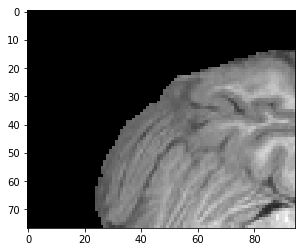

In [18]:
plt.imshow(img[0][8:85,10:105,50], cmap='gray')

# Define the classifier

In [19]:
def pick_model(name):
    if name == "ModelA":
        net = ModelA()
    elif name == "ModelB":
        net = ModelB()
    elif name == "ModelAPIF":
        net = ModelAPIF()
    elif name == "ModelBPIF":
        net = ModelBPIF()
    elif name == "ModelLiu":
        net = ModelLiu()
    return net

def update_outer_scores(outer_fold_best, report, retain_metric, selected_hyperparams, inner_fold_idx):
    outer_fold_best["final_acc"] = report["val_metrics"][retain_metric][-1]
    print(len(report["val_metrics"][retain_metric]))
    print(report["val_metrics"][retain_metric])
    outer_fold_best["best_acc"] = np.max(report["val_metrics"][retain_metric]) # removed starting from ignore epochs as we do not run validation in every iteration
    outer_fold_best["final_iter"] = len(report["val_metrics"][retain_metric])
    outer_fold_best["best_iter"] = outer_fold_best["final_iter"] - np.argmax(np.flip(np.copy(report["val_metrics"][retain_metric]), axis=0))
    outer_fold_best["params"] = selected_hyperparams
    outer_fold_best["inner_fold_idx"] = inner_fold_idx
    return outer_fold_best

# Training

In [20]:
def run(
    net,
    data,
    shape,
    callbacks=[],
    augmentations=[],
    masked=False,
    metrics=[],
    k_folds=None,
    b=None,
    num_epochs=35,
    retain_metric=None
):      
   
    fold_metric = []
    all_outer_bests = []
    best_metric = []
    models = []
    fold = 0
    initial_prepend = None
    
    random_states = np.arange(20, 30) # will be used again to split in testing phase
    
    for outer_fold, r in enumerate(random_states):
        print("###### Starting outer fold {}".format(outer_fold))
        # load new random data split each outer fold
        # separate new test set
        no_test_df = data.sample(frac=0.8, random_state=r) # split according 
         # split train/validation
        train_df = no_test_df.sample(frac=0.8, random_state=32) # can be the same r at each inner fold
        val_df = no_test_df[~no_test_df["PTID"].isin(train_df["PTID"])]
        
        if zero_one_normalize:
            intensity = IntensityRescale()
            ukb_data_train = UKBGDataset(train_df, transform=transforms.Compose(augmentations + [intensity]), mask=mask, patched=True)
            ukb_data_val = UKBGDataset(val_df, transform=transforms.Compose([intensity]), mask=mask, patched=True)
        else:
            ukb_data_train = UKBGDataset(train_df, transform=transforms.Compose(augmentations), mask=mask, patched=True)
            ukb_data_val = UKBGDataset(val_df, transform=None, mask=mask, patched=True)
        
        print(len(ukb_data_train))
        print(len(ukb_data_val))
        
        print("Shuffled the data..")
        
        outer_fold_best = {
            "final_acc" : 0,
            "best_acc" : 0,
            "final_iter" : 0,
            "best_iter" : 0,
            "params" : {},
            "inner_fold_idx" : 0
        }
        
        for inner_fold in range(5):
            print("###### Starting inner fold {}".format(inner_fold))
            # sample randomly from the hyperparameter options each inner fold
            model_name = "ModelLiu"
            b = random.choice(hyperparams["batch_size"])
            patience = random.choice(hyperparams["patience"]["small"])
            lr = random.choice(hyperparams["lr"])

            selected_hyperparams = {
                "model" : model_name,
                "batch_size" : b,
                "patience" : patience,
                "lr" : lr
                }
            print(selected_hyperparams)   
            
            # load model
            if multi_gpus is None:
                net = pick_model(model_name).cuda(gpu)
            else:
                net = torch.nn.DataParallel(pick_model(model_name), device_ids=multi_gpus).cuda(gpu)
            print("Trainable model parameters: {}".format(count_parameters(net)))
        
            callbacks = [EarlyStopping(patience=patience, ignore_before=ignore_epochs, retain_metric="loss", mode='min'),
                         ModelCheckpoint(path=output_dir,
                                         prepend="outer_{}_inner_{}".format(outer_fold, inner_fold),
                                         store_best=True,
                                         ignore_before=ignore_epochs,
                                         retain_metric=retain_metric)]
        
            # add current fold number to model checkpoint path
            if callbacks is not None:
                for idx, callback in enumerate(callbacks):
                    if isinstance(callback, ModelCheckpoint):
                        if initial_prepend is None:
                            initial_prepend = callbacks[idx].prepend
                        callbacks[idx].prepend = initial_prepend + "cv_fold_{}_".format(fold)
                        initial_prepend = None
            fold += 1

            # set optimizer
            wd = 1e-5 #0.008
            criterion = nn.BCEWithLogitsLoss().cuda(gpu)
            optimizer = optim.Adam(net.parameters(), lr=lr, weight_decay=wd)

            train_loader = DataLoader(
                ukb_data_train, batch_size=b, shuffle=True, num_workers=4
            )

            val_loader = DataLoader(
                ukb_data_val, batch_size=2, shuffle=True, num_workers=0
            )

            img = next(iter(train_loader))["image"][0]
            print(img.shape)
            plt.imshow(img[0][:,:,18], cmap='gray')
            plt.show()

            trainer = Trainer(
                net,
                criterion,
                optimizer,
                metrics=metrics,
                callbacks=callbacks,
                device=gpu
            )
            # train model and store results
            net, report = trainer.train_model(
                train_loader,
                val_loader,
                num_epochs=num_epochs,
                show_train_steps=5,
                show_validation_epochs=1,
            )
            # append validation score of the retain metric
            if isinstance(retain_metric, str):
                # use the average of the last 10 epochs
                best_val = np.mean(report["val_metrics"][retain_metric][-10:])
                fold_metric.append(report["val_metrics"][retain_metric][-1])
                best_metric.append(best_val)
                # replace best model for this outer_fold in case of improvement
                #if report["val_metrics"][retain_metric][-1] > outer_fold_best["final_acc"]:
                if report["val_metrics"][retain_metric][-1] > outer_fold_best["final_acc"]:
                    update_outer_scores(outer_fold_best, report, retain_metric, selected_hyperparams, inner_fold)
            else:
                # use the average of the last 10 epochs
                best_val = np.mean(report["val_metrics"][retain_metric.__name__][-10:])
                fold_metric.append(report["val_metrics"][retain_metric.__name__][-1])
                best_metric.append(best_val)
                # replace best model for this outer_fold in case of improvement
                #if report["val_metrics"][retain_metric.__name__][-1] > outer_fold_best["final_acc"]:
                if best_val > outer_fold_best["final_acc"]:
                    update_outer_scores(outer_fold_best, report, retain_metric.__name__, selected_hyperparams, inner_fold)

            models.append(net)
            print("Finished inner fold.")

            # visualize result
            trainer.visualize_training(report, metrics)
            trainer.evaluate_model(val_loader, gpu)
        print("Finished outer fold.")
        print(outer_fold_best)
        all_outer_bests.append(outer_fold_best)

    print("################################")
    print("################################")
    print("All accuracies: {}".format(fold_metric))
    print("Best accuracies mean: {} All :{}".format(np.mean(best_metric), best_metric))
    print(all_outer_bests)
    return fold_metric, models

In [21]:
num_epochs = 300
min_iters = 160
ignore_epochs = 160
normalize = False
retain_metric = balanced_accuracy
metrics = [accuracy_score, balanced_accuracy]

In [22]:
output_dir = "/ritter/share/projects/Methods/Eitel_local_filter/experiments_submission/models/UKB/20_percent/10xrandom_splits/liu_patches/"

###### Starting outer fold 0
238
59
Shuffled the data..
###### Starting inner fold 0
{'model': 'ModelLiu', 'batch_size': 32, 'patience': 12, 'lr': 5e-05}
Trainable model parameters: 116001
torch.Size([1, 72, 57, 75])


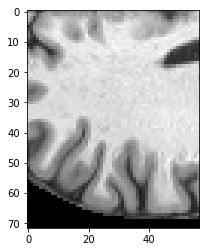

/home/fabiane/anaconda2/envs/mort1/lib/python3.6/site-packages/torch/nn/functional.py:1320: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")


[0,     5] loss: 0.69534
Time elapsed: 0h:0m:23s
train accuracy_score: 45.80 %
train balanced_accuracy: 51.33 %
val accuracy_score: 54.24 %
val balanced_accuracy: 50.00 %
Val loss: 0.691766
[1,     5] loss: 0.68961
Time elapsed: 0h:1m:8s
train accuracy_score: 57.98 %
train balanced_accuracy: 58.06 %
val accuracy_score: 45.76 %
val balanced_accuracy: 50.00 %
Val loss: 0.694979
[2,     5] loss: 0.68905
Time elapsed: 0h:1m:52s
train accuracy_score: 56.30 %
train balanced_accuracy: 51.61 %
val accuracy_score: 45.76 %
val balanced_accuracy: 50.00 %
Val loss: 0.700045
[3,     5] loss: 0.68971
Time elapsed: 0h:2m:36s
train accuracy_score: 54.62 %
train balanced_accuracy: 48.62 %
val accuracy_score: 45.76 %
val balanced_accuracy: 50.00 %
Val loss: 0.704578
[4,     5] loss: 0.68218
Time elapsed: 0h:3m:21s
train accuracy_score: 56.30 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.76 %
val balanced_accuracy: 50.00 %
Val loss: 0.703708
[5,     5] loss: 0.68493
Time elapsed: 0h:4m:6s
tra

[43,     5] loss: 0.68741
Time elapsed: 0h:33m:59s
train accuracy_score: 56.30 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.76 %
val balanced_accuracy: 50.00 %
Val loss: 0.709481
[44,     5] loss: 0.68626
Time elapsed: 0h:34m:44s
train accuracy_score: 56.30 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.76 %
val balanced_accuracy: 50.00 %
Val loss: 0.705871
[45,     5] loss: 0.68338
Time elapsed: 0h:35m:28s
train accuracy_score: 56.72 %
train balanced_accuracy: 50.48 %
val accuracy_score: 45.76 %
val balanced_accuracy: 50.00 %
Val loss: 0.708392
[46,     5] loss: 0.69720
Time elapsed: 0h:36m:12s
train accuracy_score: 55.88 %
train balanced_accuracy: 49.63 %
val accuracy_score: 45.76 %
val balanced_accuracy: 50.00 %
Val loss: 0.714989
[47,     5] loss: 0.68991
Time elapsed: 0h:36m:56s
train accuracy_score: 55.46 %
train balanced_accuracy: 49.25 %
val accuracy_score: 45.76 %
val balanced_accuracy: 50.00 %
Val loss: 0.719830
[48,     5] loss: 0.68998
Time elapsed: 

[86,     5] loss: 0.67960
Time elapsed: 1h:6m:26s
train accuracy_score: 55.46 %
train balanced_accuracy: 49.47 %
val accuracy_score: 45.76 %
val balanced_accuracy: 50.00 %
Val loss: 0.708315
[87,     5] loss: 0.68127
Time elapsed: 1h:7m:11s
train accuracy_score: 55.04 %
train balanced_accuracy: 48.88 %
val accuracy_score: 45.76 %
val balanced_accuracy: 50.00 %
Val loss: 0.706394
[88,     5] loss: 0.68455
Time elapsed: 1h:7m:57s
train accuracy_score: 56.30 %
train balanced_accuracy: 50.22 %
val accuracy_score: 45.76 %
val balanced_accuracy: 50.00 %
Val loss: 0.705043
[89,     5] loss: 0.68309
Time elapsed: 1h:8m:42s
train accuracy_score: 56.30 %
train balanced_accuracy: 50.22 %
val accuracy_score: 45.76 %
val balanced_accuracy: 50.00 %
Val loss: 0.714971
[90,     5] loss: 0.68286
Time elapsed: 1h:9m:27s
train accuracy_score: 55.88 %
train balanced_accuracy: 49.73 %
val accuracy_score: 45.76 %
val balanced_accuracy: 50.00 %
Val loss: 0.705013
[91,     5] loss: 0.68636
Time elapsed: 1h:10

val accuracy_score: 44.07 %
val balanced_accuracy: 47.57 %
Val loss: 0.705661
[129,     5] loss: 0.68639
Time elapsed: 1h:38m:57s
train accuracy_score: 55.46 %
train balanced_accuracy: 50.65 %
val accuracy_score: 52.54 %
val balanced_accuracy: 55.96 %
Val loss: 0.693664
[130,     5] loss: 0.68469
Time elapsed: 1h:39m:42s
train accuracy_score: 52.52 %
train balanced_accuracy: 47.83 %
val accuracy_score: 47.46 %
val balanced_accuracy: 51.56 %
Val loss: 0.713075
[131,     5] loss: 0.68570
Time elapsed: 1h:40m:28s
train accuracy_score: 56.30 %
train balanced_accuracy: 51.18 %
val accuracy_score: 49.15 %
val balanced_accuracy: 53.12 %
Val loss: 0.690707
[132,     5] loss: 0.67793
Time elapsed: 1h:41m:14s
train accuracy_score: 57.14 %
train balanced_accuracy: 51.39 %
val accuracy_score: 47.46 %
val balanced_accuracy: 51.56 %
Val loss: 0.717171
[133,     5] loss: 0.68696
Time elapsed: 1h:41m:59s
train accuracy_score: 53.78 %
train balanced_accuracy: 48.41 %
val accuracy_score: 45.76 %
val bal

val accuracy_score: 45.76 %
val balanced_accuracy: 49.71 %
Val loss: 0.716937
[172,     5] loss: 0.67288
Time elapsed: 2h:11m:23s
train accuracy_score: 54.62 %
train balanced_accuracy: 48.94 %
val accuracy_score: 45.76 %
val balanced_accuracy: 50.00 %
Val loss: 0.721112
[173,     5] loss: 0.67324
Time elapsed: 2h:12m:8s
train accuracy_score: 56.72 %
train balanced_accuracy: 50.91 %
val accuracy_score: 42.37 %
val balanced_accuracy: 46.30 %
Val loss: 0.708889
[174,     5] loss: 0.68383
Time elapsed: 2h:12m:54s
train accuracy_score: 57.98 %
train balanced_accuracy: 52.57 %
val accuracy_score: 44.07 %
val balanced_accuracy: 48.15 %
Val loss: 0.707298
[175,     5] loss: 0.68541
Time elapsed: 2h:13m:37s
train accuracy_score: 57.98 %
train balanced_accuracy: 52.35 %
val accuracy_score: 47.46 %
val balanced_accuracy: 51.56 %
Val loss: 0.716819
Early stopping in epoch 176
Total time elapsed: 2h:13m:58s
Writing model to disk...
Best result during training: 0.52. Saving model..
176
[0.5, 0.5, 0.

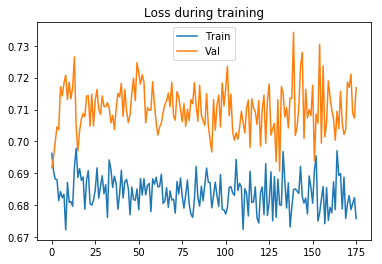

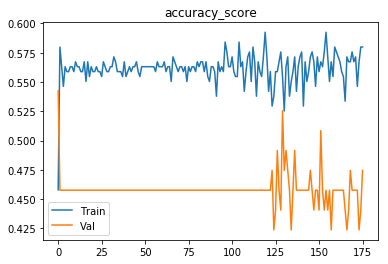

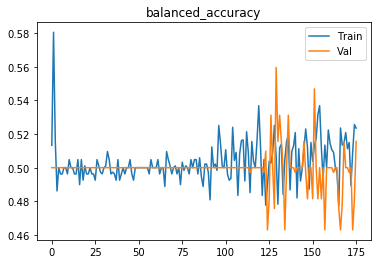

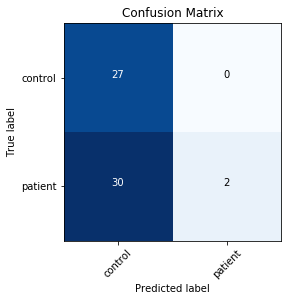

###### Starting inner fold 1
{'model': 'ModelLiu', 'batch_size': 12, 'patience': 12, 'lr': 0.0001}
Trainable model parameters: 116001
torch.Size([1, 72, 57, 75])


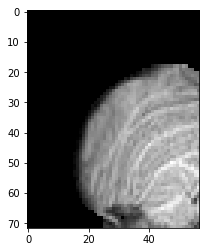

[0,     5] loss: 0.70973
[0,    10] loss: 0.69684
[0,    15] loss: 0.68234
Time elapsed: 0h:0m:22s
train accuracy_score: 44.12 %
train balanced_accuracy: 44.88 %
val accuracy_score: 45.76 %
val balanced_accuracy: 50.00 %
Val loss: 0.698905
[1,     5] loss: 0.68213
[1,    10] loss: 0.67960
[1,    15] loss: 0.67884
Time elapsed: 0h:1m:5s
train accuracy_score: 56.30 %
train balanced_accuracy: 50.22 %
val accuracy_score: 45.76 %
val balanced_accuracy: 50.00 %
Val loss: 0.714851
[2,     5] loss: 0.69174
[2,    10] loss: 0.68674
[2,    15] loss: 0.68903
Time elapsed: 0h:1m:49s
train accuracy_score: 56.30 %
train balanced_accuracy: 50.22 %
val accuracy_score: 45.76 %
val balanced_accuracy: 50.00 %
Val loss: 0.712268
[3,     5] loss: 0.67257
[3,    10] loss: 0.70313
[3,    15] loss: 0.66335
Time elapsed: 0h:2m:33s
train accuracy_score: 57.98 %
train balanced_accuracy: 52.14 %
val accuracy_score: 45.76 %
val balanced_accuracy: 50.00 %
Val loss: 0.708946
[4,     5] loss: 0.69496
[4,    10] loss:

[34,     5] loss: 0.70248
[34,    10] loss: 0.68433
[34,    15] loss: 0.68327
Time elapsed: 0h:24m:55s
train accuracy_score: 55.04 %
train balanced_accuracy: 48.99 %
val accuracy_score: 45.76 %
val balanced_accuracy: 50.00 %
Val loss: 0.711163
[35,     5] loss: 0.65668
[35,    10] loss: 0.68636
[35,    15] loss: 0.67770
Time elapsed: 0h:25m:38s
train accuracy_score: 55.04 %
train balanced_accuracy: 49.31 %
val accuracy_score: 45.76 %
val balanced_accuracy: 50.00 %
Val loss: 0.713728
[36,     5] loss: 0.67432
[36,    10] loss: 0.69817
[36,    15] loss: 0.67981
Time elapsed: 0h:26m:22s
train accuracy_score: 56.72 %
train balanced_accuracy: 50.91 %
val accuracy_score: 45.76 %
val balanced_accuracy: 50.00 %
Val loss: 0.715528
[37,     5] loss: 0.66359
[37,    10] loss: 0.66964
[37,    15] loss: 0.68170
Time elapsed: 0h:27m:5s
train accuracy_score: 54.20 %
train balanced_accuracy: 49.00 %
val accuracy_score: 45.76 %
val balanced_accuracy: 50.00 %
Val loss: 0.717460
[38,     5] loss: 0.69827

val accuracy_score: 45.76 %
val balanced_accuracy: 50.00 %
Val loss: 0.718708
[68,     5] loss: 0.66423
[68,    10] loss: 0.71769
[68,    15] loss: 0.66286
Time elapsed: 0h:49m:18s
train accuracy_score: 62.18 %
train balanced_accuracy: 57.70 %
val accuracy_score: 55.93 %
val balanced_accuracy: 59.38 %
Val loss: 0.695665
[69,     5] loss: 0.69536
[69,    10] loss: 0.68934
[69,    15] loss: 0.67186
Time elapsed: 0h:50m:0s
train accuracy_score: 55.88 %
train balanced_accuracy: 52.10 %
val accuracy_score: 47.46 %
val balanced_accuracy: 51.56 %
Val loss: 0.709501
[70,     5] loss: 0.69351
[70,    10] loss: 0.65566
[70,    15] loss: 0.69659
Time elapsed: 0h:50m:43s
train accuracy_score: 54.62 %
train balanced_accuracy: 49.05 %
val accuracy_score: 45.76 %
val balanced_accuracy: 49.42 %
Val loss: 0.711305
[71,     5] loss: 0.66818
[71,    10] loss: 0.67846
[71,    15] loss: 0.66974
Time elapsed: 0h:51m:26s
train accuracy_score: 56.30 %
train balanced_accuracy: 51.40 %
val accuracy_score: 50.85

Time elapsed: 1h:14m:32s
train accuracy_score: 57.14 %
train balanced_accuracy: 52.58 %
val accuracy_score: 45.76 %
val balanced_accuracy: 49.13 %
Val loss: 0.705759
[102,     5] loss: 0.69077
[102,    10] loss: 0.68597
[102,    15] loss: 0.66531
Time elapsed: 1h:15m:25s
train accuracy_score: 53.78 %
train balanced_accuracy: 49.38 %
val accuracy_score: 47.46 %
val balanced_accuracy: 51.56 %
Val loss: 0.704847
[103,     5] loss: 0.69442
[103,    10] loss: 0.67361
[103,    15] loss: 0.67268
Time elapsed: 1h:16m:17s
train accuracy_score: 57.56 %
train balanced_accuracy: 52.63 %
val accuracy_score: 44.07 %
val balanced_accuracy: 48.15 %
Val loss: 0.713612
[104,     5] loss: 0.67733
[104,    10] loss: 0.68708
[104,    15] loss: 0.61729
Time elapsed: 1h:17m:11s
train accuracy_score: 56.72 %
train balanced_accuracy: 51.34 %
val accuracy_score: 45.76 %
val balanced_accuracy: 50.00 %
Val loss: 0.731207
[105,     5] loss: 0.68579
[105,    10] loss: 0.66994
[105,    15] loss: 0.67258
Time elapsed

val accuracy_score: 44.07 %
val balanced_accuracy: 47.57 %
Val loss: 0.721521
[135,     5] loss: 0.66490
[135,    10] loss: 0.66380
[135,    15] loss: 0.64818
Time elapsed: 1h:42m:55s
train accuracy_score: 58.82 %
train balanced_accuracy: 54.50 %
val accuracy_score: 50.85 %
val balanced_accuracy: 54.40 %
Val loss: 0.717020
[136,     5] loss: 0.69095
[136,    10] loss: 0.65999
[136,    15] loss: 0.69592
Time elapsed: 1h:43m:37s
train accuracy_score: 58.40 %
train balanced_accuracy: 54.02 %
val accuracy_score: 54.24 %
val balanced_accuracy: 56.37 %
Val loss: 0.696322
[137,     5] loss: 0.67190
[137,    10] loss: 0.67893
[137,    15] loss: 0.68164
Time elapsed: 1h:44m:21s
train accuracy_score: 59.66 %
train balanced_accuracy: 57.18 %
val accuracy_score: 38.98 %
val balanced_accuracy: 41.72 %
Val loss: 0.736485
[138,     5] loss: 0.68282
[138,    10] loss: 0.61492
[138,    15] loss: 0.68826
Time elapsed: 1h:45m:4s
train accuracy_score: 57.14 %
train balanced_accuracy: 52.36 %
val accuracy_

[168,     5] loss: 0.68927
[168,    10] loss: 0.64941
[168,    15] loss: 0.65497
Time elapsed: 2h:8m:33s
train accuracy_score: 57.98 %
train balanced_accuracy: 53.65 %
val accuracy_score: 47.46 %
val balanced_accuracy: 50.69 %
Val loss: 0.747512
[169,     5] loss: 0.65666
[169,    10] loss: 0.65684
[169,    15] loss: 0.66352
Time elapsed: 2h:9m:16s
train accuracy_score: 57.14 %
train balanced_accuracy: 54.19 %
val accuracy_score: 59.32 %
val balanced_accuracy: 61.92 %
Val loss: 0.686295
[170,     5] loss: 0.69901
[170,    10] loss: 0.64689
[170,    15] loss: 0.66388
Time elapsed: 2h:9m:59s
train accuracy_score: 56.72 %
train balanced_accuracy: 55.65 %
val accuracy_score: 49.15 %
val balanced_accuracy: 52.55 %
Val loss: 0.710916
[171,     5] loss: 0.66112
[171,    10] loss: 0.68692
[171,    15] loss: 0.61589
Time elapsed: 2h:10m:43s
train accuracy_score: 60.50 %
train balanced_accuracy: 55.67 %
val accuracy_score: 47.46 %
val balanced_accuracy: 48.96 %
Val loss: 0.695910
[172,     5] lo

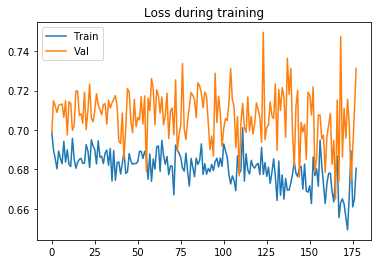

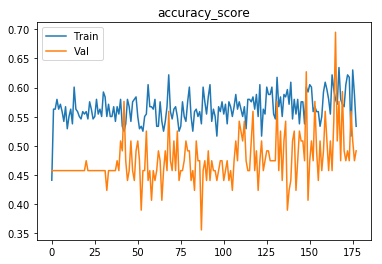

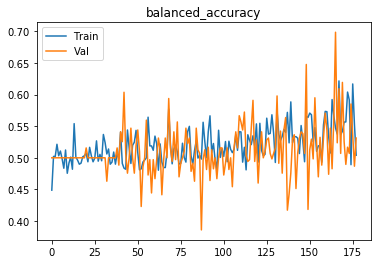

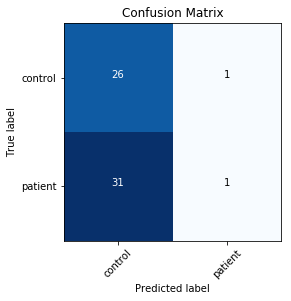

###### Starting inner fold 2
{'model': 'ModelLiu', 'batch_size': 32, 'patience': 12, 'lr': 5e-05}
Trainable model parameters: 116001
torch.Size([1, 72, 57, 75])


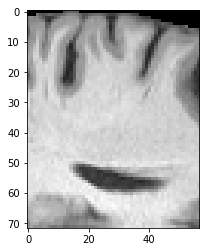

[0,     5] loss: 0.69172
Time elapsed: 0h:0m:25s
train accuracy_score: 53.36 %
train balanced_accuracy: 50.29 %
val accuracy_score: 45.76 %
val balanced_accuracy: 50.00 %
Val loss: 0.695847
[1,     5] loss: 0.69034
Time elapsed: 0h:1m:14s
train accuracy_score: 55.46 %
train balanced_accuracy: 49.58 %
val accuracy_score: 45.76 %
val balanced_accuracy: 50.00 %
Val loss: 0.698834
[2,     5] loss: 0.68610
Time elapsed: 0h:2m:0s
train accuracy_score: 56.30 %
train balanced_accuracy: 50.11 %
val accuracy_score: 45.76 %
val balanced_accuracy: 50.00 %
Val loss: 0.703917
[3,     5] loss: 0.68633
Time elapsed: 0h:2m:47s
train accuracy_score: 55.88 %
train balanced_accuracy: 49.63 %
val accuracy_score: 45.76 %
val balanced_accuracy: 50.00 %
Val loss: 0.703114
[4,     5] loss: 0.68332
Time elapsed: 0h:3m:33s
train accuracy_score: 56.30 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.76 %
val balanced_accuracy: 50.00 %
Val loss: 0.706754
[5,     5] loss: 0.67942
Time elapsed: 0h:4m:19s
tr

[43,     5] loss: 0.68690
Time elapsed: 0h:35m:43s
train accuracy_score: 56.30 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.76 %
val balanced_accuracy: 50.00 %
Val loss: 0.715816
[44,     5] loss: 0.68701
Time elapsed: 0h:36m:29s
train accuracy_score: 56.30 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.76 %
val balanced_accuracy: 50.00 %
Val loss: 0.710823
[45,     5] loss: 0.67875
Time elapsed: 0h:37m:16s
train accuracy_score: 56.72 %
train balanced_accuracy: 50.48 %
val accuracy_score: 45.76 %
val balanced_accuracy: 50.00 %
Val loss: 0.707651
[46,     5] loss: 0.68223
Time elapsed: 0h:38m:1s
train accuracy_score: 56.30 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.76 %
val balanced_accuracy: 50.00 %
Val loss: 0.705984
[47,     5] loss: 0.68748
Time elapsed: 0h:38m:46s
train accuracy_score: 56.30 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.76 %
val balanced_accuracy: 50.00 %
Val loss: 0.707325
[48,     5] loss: 0.69028
Time elapsed: 0

[86,     5] loss: 0.68841
Time elapsed: 1h:8m:2s
train accuracy_score: 55.88 %
train balanced_accuracy: 49.63 %
val accuracy_score: 45.76 %
val balanced_accuracy: 50.00 %
Val loss: 0.718233
[87,     5] loss: 0.68126
Time elapsed: 1h:8m:46s
train accuracy_score: 56.30 %
train balanced_accuracy: 50.11 %
val accuracy_score: 45.76 %
val balanced_accuracy: 50.00 %
Val loss: 0.720331
[88,     5] loss: 0.68527
Time elapsed: 1h:9m:31s
train accuracy_score: 55.88 %
train balanced_accuracy: 49.63 %
val accuracy_score: 45.76 %
val balanced_accuracy: 50.00 %
Val loss: 0.718504
[89,     5] loss: 0.67805
Time elapsed: 1h:10m:15s
train accuracy_score: 57.14 %
train balanced_accuracy: 50.96 %
val accuracy_score: 45.76 %
val balanced_accuracy: 50.00 %
Val loss: 0.711527
[90,     5] loss: 0.68631
Time elapsed: 1h:11m:0s
train accuracy_score: 55.88 %
train balanced_accuracy: 49.63 %
val accuracy_score: 45.76 %
val balanced_accuracy: 50.00 %
Val loss: 0.711781
[91,     5] loss: 0.69501
Time elapsed: 1h:11

val accuracy_score: 45.76 %
val balanced_accuracy: 50.00 %
Val loss: 0.708160
[129,     5] loss: 0.68543
Time elapsed: 1h:40m:27s
train accuracy_score: 55.46 %
train balanced_accuracy: 49.79 %
val accuracy_score: 45.76 %
val balanced_accuracy: 50.00 %
Val loss: 0.712342
[130,     5] loss: 0.68543
Time elapsed: 1h:41m:16s
train accuracy_score: 57.14 %
train balanced_accuracy: 51.50 %
val accuracy_score: 45.76 %
val balanced_accuracy: 50.00 %
Val loss: 0.708040
[131,     5] loss: 0.67575
Time elapsed: 1h:42m:4s
train accuracy_score: 57.98 %
train balanced_accuracy: 51.92 %
val accuracy_score: 45.76 %
val balanced_accuracy: 50.00 %
Val loss: 0.729206
[132,     5] loss: 0.67888
Time elapsed: 1h:42m:50s
train accuracy_score: 56.30 %
train balanced_accuracy: 50.32 %
val accuracy_score: 45.76 %
val balanced_accuracy: 50.00 %
Val loss: 0.697001
[133,     5] loss: 0.68634
Time elapsed: 1h:43m:38s
train accuracy_score: 57.14 %
train balanced_accuracy: 51.39 %
val accuracy_score: 45.76 %
val bala

val accuracy_score: 45.76 %
val balanced_accuracy: 50.00 %
Val loss: 0.707215
[172,     5] loss: 0.67845
Time elapsed: 2h:14m:52s
train accuracy_score: 56.30 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.76 %
val balanced_accuracy: 50.00 %
Val loss: 0.710981
[173,     5] loss: 0.68797
Time elapsed: 2h:15m:40s
train accuracy_score: 56.30 %
train balanced_accuracy: 50.32 %
val accuracy_score: 45.76 %
val balanced_accuracy: 50.00 %
Val loss: 0.708620
[174,     5] loss: 0.68308
Time elapsed: 2h:16m:27s
train accuracy_score: 55.88 %
train balanced_accuracy: 49.63 %
val accuracy_score: 45.76 %
val balanced_accuracy: 50.00 %
Val loss: 0.715198
[175,     5] loss: 0.68257
Time elapsed: 2h:17m:13s
train accuracy_score: 55.88 %
train balanced_accuracy: 49.63 %
val accuracy_score: 45.76 %
val balanced_accuracy: 50.00 %
Val loss: 0.715074
[176,     5] loss: 0.68213
Time elapsed: 2h:17m:59s
train accuracy_score: 56.72 %
train balanced_accuracy: 50.48 %
val accuracy_score: 45.76 %
val bal

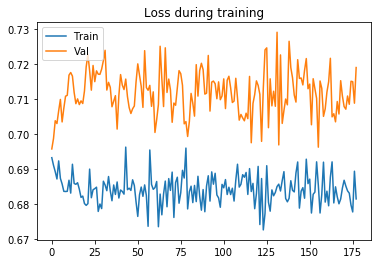

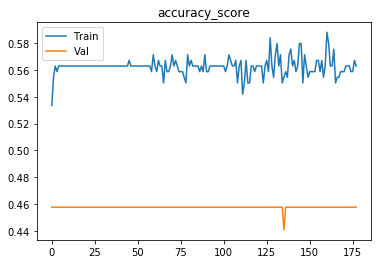

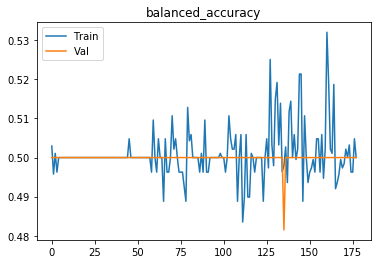

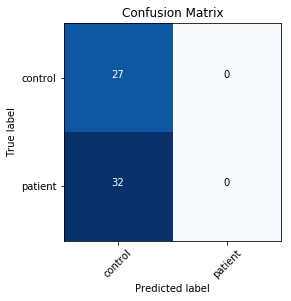

###### Starting inner fold 3
{'model': 'ModelLiu', 'batch_size': 32, 'patience': 12, 'lr': 0.0001}
Trainable model parameters: 116001
torch.Size([1, 72, 57, 75])


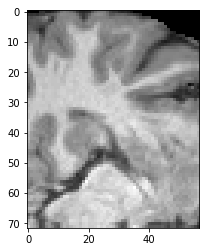

[0,     5] loss: 0.69215
Time elapsed: 0h:0m:24s
train accuracy_score: 50.84 %
train balanced_accuracy: 51.28 %
val accuracy_score: 45.76 %
val balanced_accuracy: 50.00 %
Val loss: 0.695321
[1,     5] loss: 0.69118
Time elapsed: 0h:1m:10s
train accuracy_score: 55.88 %
train balanced_accuracy: 51.13 %
val accuracy_score: 45.76 %
val balanced_accuracy: 50.00 %
Val loss: 0.702604
[2,     5] loss: 0.68399
Time elapsed: 0h:1m:57s
train accuracy_score: 55.88 %
train balanced_accuracy: 49.63 %
val accuracy_score: 45.76 %
val balanced_accuracy: 50.00 %
Val loss: 0.718049
[3,     5] loss: 0.68927
Time elapsed: 0h:2m:43s
train accuracy_score: 55.88 %
train balanced_accuracy: 49.63 %
val accuracy_score: 45.76 %
val balanced_accuracy: 50.00 %
Val loss: 0.719266
[4,     5] loss: 0.69421
Time elapsed: 0h:3m:30s
train accuracy_score: 56.30 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.76 %
val balanced_accuracy: 50.00 %
Val loss: 0.716907
[5,     5] loss: 0.69757
Time elapsed: 0h:4m:17s
t

[43,     5] loss: 0.67899
Time elapsed: 0h:33m:39s
train accuracy_score: 56.72 %
train balanced_accuracy: 50.48 %
val accuracy_score: 45.76 %
val balanced_accuracy: 50.00 %
Val loss: 0.709920
[44,     5] loss: 0.69826
Time elapsed: 0h:34m:23s
train accuracy_score: 55.04 %
train balanced_accuracy: 48.99 %
val accuracy_score: 45.76 %
val balanced_accuracy: 50.00 %
Val loss: 0.708694
[45,     5] loss: 0.68714
Time elapsed: 0h:35m:8s
train accuracy_score: 55.04 %
train balanced_accuracy: 49.10 %
val accuracy_score: 45.76 %
val balanced_accuracy: 50.00 %
Val loss: 0.701366
[46,     5] loss: 0.69111
Time elapsed: 0h:35m:52s
train accuracy_score: 57.14 %
train balanced_accuracy: 51.18 %
val accuracy_score: 45.76 %
val balanced_accuracy: 50.00 %
Val loss: 0.705600
[47,     5] loss: 0.69242
Time elapsed: 0h:36m:52s
train accuracy_score: 57.56 %
train balanced_accuracy: 51.44 %
val accuracy_score: 45.76 %
val balanced_accuracy: 50.00 %
Val loss: 0.718054
[48,     5] loss: 0.68631
Time elapsed: 0

[86,     5] loss: 0.66136
Time elapsed: 1h:7m:5s
train accuracy_score: 59.66 %
train balanced_accuracy: 55.25 %
val accuracy_score: 47.46 %
val balanced_accuracy: 50.69 %
Val loss: 0.703194
[87,     5] loss: 0.68413
Time elapsed: 1h:7m:51s
train accuracy_score: 54.62 %
train balanced_accuracy: 49.48 %
val accuracy_score: 47.46 %
val balanced_accuracy: 50.98 %
Val loss: 0.735977
[88,     5] loss: 0.70121
Time elapsed: 1h:8m:36s
train accuracy_score: 50.84 %
train balanced_accuracy: 46.01 %
val accuracy_score: 44.07 %
val balanced_accuracy: 47.28 %
Val loss: 0.700435
[89,     5] loss: 0.68657
Time elapsed: 1h:9m:23s
train accuracy_score: 52.94 %
train balanced_accuracy: 48.74 %
val accuracy_score: 47.46 %
val balanced_accuracy: 50.41 %
Val loss: 0.705991
[90,     5] loss: 0.66785
Time elapsed: 1h:10m:9s
train accuracy_score: 57.56 %
train balanced_accuracy: 52.63 %
val accuracy_score: 45.76 %
val balanced_accuracy: 50.00 %
Val loss: 0.718718
[91,     5] loss: 0.68138
Time elapsed: 1h:10m

val accuracy_score: 44.07 %
val balanced_accuracy: 46.99 %
Val loss: 0.742850
[129,     5] loss: 0.67727
Time elapsed: 1h:40m:39s
train accuracy_score: 55.46 %
train balanced_accuracy: 52.27 %
val accuracy_score: 55.93 %
val balanced_accuracy: 58.80 %
Val loss: 0.692041
[130,     5] loss: 0.67855
Time elapsed: 1h:41m:26s
train accuracy_score: 54.20 %
train balanced_accuracy: 51.04 %
val accuracy_score: 42.37 %
val balanced_accuracy: 45.43 %
Val loss: 0.703697
[131,     5] loss: 0.66761
Time elapsed: 1h:42m:12s
train accuracy_score: 56.72 %
train balanced_accuracy: 52.20 %
val accuracy_score: 54.24 %
val balanced_accuracy: 57.81 %
Val loss: 0.727521
[132,     5] loss: 0.69100
Time elapsed: 1h:42m:59s
train accuracy_score: 56.30 %
train balanced_accuracy: 51.08 %
val accuracy_score: 50.85 %
val balanced_accuracy: 54.40 %
Val loss: 0.710031
[133,     5] loss: 0.67050
Time elapsed: 1h:43m:45s
train accuracy_score: 55.88 %
train balanced_accuracy: 50.81 %
val accuracy_score: 47.46 %
val bal

val accuracy_score: 44.07 %
val balanced_accuracy: 46.70 %
Val loss: 0.716814
[172,     5] loss: 0.67626
Time elapsed: 2h:13m:53s
train accuracy_score: 58.82 %
train balanced_accuracy: 55.36 %
val accuracy_score: 44.07 %
val balanced_accuracy: 47.28 %
Val loss: 0.717245
Early stopping in epoch 173
Total time elapsed: 2h:14m:13s
Writing model to disk...
Best result during training: 0.56. Saving model..
Finished inner fold.


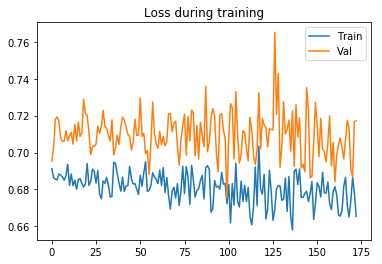

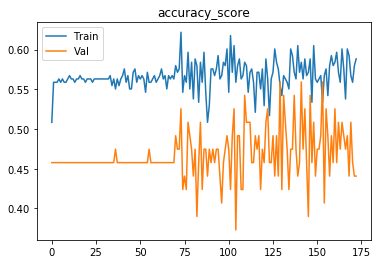

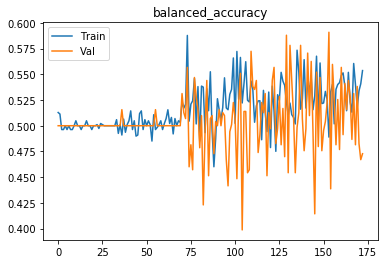

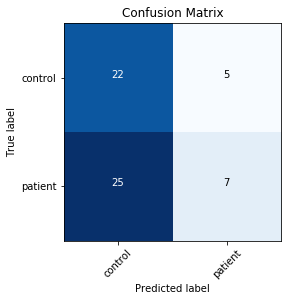

###### Starting inner fold 4
{'model': 'ModelLiu', 'batch_size': 16, 'patience': 12, 'lr': 0.0001}
Trainable model parameters: 116001
torch.Size([1, 72, 57, 75])


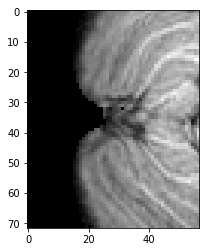

[0,     5] loss: 0.69008
[0,    10] loss: 0.68390
Time elapsed: 0h:0m:25s
train accuracy_score: 55.88 %
train balanced_accuracy: 49.63 %
val accuracy_score: 45.76 %
val balanced_accuracy: 50.00 %
Val loss: 0.700801
[1,     5] loss: 0.69241
[1,    10] loss: 0.68642
Time elapsed: 0h:1m:8s
train accuracy_score: 56.30 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.76 %
val balanced_accuracy: 50.00 %
Val loss: 0.703059
[2,     5] loss: 0.69642
[2,    10] loss: 0.68759
Time elapsed: 0h:1m:51s
train accuracy_score: 56.30 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.76 %
val balanced_accuracy: 50.00 %
Val loss: 0.710184
[3,     5] loss: 0.69451
[3,    10] loss: 0.68621
Time elapsed: 0h:2m:34s
train accuracy_score: 56.30 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.76 %
val balanced_accuracy: 50.00 %
Val loss: 0.713236
[4,     5] loss: 0.67570
[4,    10] loss: 0.69885
Time elapsed: 0h:3m:20s
train accuracy_score: 56.30 %
train balanced_accuracy: 50.00 %
val 

[38,     5] loss: 0.67539
[38,    10] loss: 0.70001
Time elapsed: 0h:28m:17s
train accuracy_score: 56.30 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.76 %
val balanced_accuracy: 50.00 %
Val loss: 0.712497
[39,     5] loss: 0.68105
[39,    10] loss: 0.68352
Time elapsed: 0h:29m:2s
train accuracy_score: 56.30 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.76 %
val balanced_accuracy: 50.00 %
Val loss: 0.707984
[40,     5] loss: 0.67764
[40,    10] loss: 0.68660
Time elapsed: 0h:29m:44s
train accuracy_score: 56.30 %
train balanced_accuracy: 50.00 %
val accuracy_score: 45.76 %
val balanced_accuracy: 50.00 %
Val loss: 0.714102
[41,     5] loss: 0.67806
[41,    10] loss: 0.68781
Time elapsed: 0h:30m:27s
train accuracy_score: 56.72 %
train balanced_accuracy: 50.48 %
val accuracy_score: 45.76 %
val balanced_accuracy: 50.00 %
Val loss: 0.720108
[42,     5] loss: 0.69606
[42,    10] loss: 0.68398
Time elapsed: 0h:31m:10s
train accuracy_score: 55.88 %
train balanced_accurac

val accuracy_score: 49.15 %
val balanced_accuracy: 51.97 %
Val loss: 0.715473
[76,     5] loss: 0.67900
[76,    10] loss: 0.72531
Time elapsed: 0h:55m:54s
train accuracy_score: 53.36 %
train balanced_accuracy: 49.22 %
val accuracy_score: 49.15 %
val balanced_accuracy: 52.55 %
Val loss: 0.697877
[77,     5] loss: 0.69797
[77,    10] loss: 0.69753
Time elapsed: 0h:56m:39s
train accuracy_score: 55.46 %
train balanced_accuracy: 50.98 %
val accuracy_score: 50.85 %
val balanced_accuracy: 54.69 %
Val loss: 0.696426
[78,     5] loss: 0.66269
[78,    10] loss: 0.66115
Time elapsed: 0h:57m:22s
train accuracy_score: 60.08 %
train balanced_accuracy: 54.76 %
val accuracy_score: 42.37 %
val balanced_accuracy: 45.72 %
Val loss: 0.735602
[79,     5] loss: 0.66977
[79,    10] loss: 0.68528
Time elapsed: 0h:58m:7s
train accuracy_score: 57.56 %
train balanced_accuracy: 53.60 %
val accuracy_score: 54.24 %
val balanced_accuracy: 56.37 %
Val loss: 0.694192
[80,     5] loss: 0.67473
[80,    10] loss: 0.69106

Time elapsed: 1h:23m:42s
train accuracy_score: 56.72 %
train balanced_accuracy: 51.99 %
val accuracy_score: 49.15 %
val balanced_accuracy: 52.84 %
Val loss: 0.710420
[114,     5] loss: 0.69417
[114,    10] loss: 0.68749
Time elapsed: 1h:24m:27s
train accuracy_score: 56.72 %
train balanced_accuracy: 51.23 %
val accuracy_score: 54.24 %
val balanced_accuracy: 57.52 %
Val loss: 0.705501
[115,     5] loss: 0.66900
[115,    10] loss: 0.68198
Time elapsed: 1h:25m:13s
train accuracy_score: 57.98 %
train balanced_accuracy: 53.11 %
val accuracy_score: 49.15 %
val balanced_accuracy: 52.84 %
Val loss: 0.704782
[116,     5] loss: 0.66355
[116,    10] loss: 0.66359
Time elapsed: 1h:25m:58s
train accuracy_score: 59.66 %
train balanced_accuracy: 54.81 %
val accuracy_score: 47.46 %
val balanced_accuracy: 51.27 %
Val loss: 0.708324
[117,     5] loss: 0.63296
[117,    10] loss: 0.67067
Time elapsed: 1h:26m:43s
train accuracy_score: 61.76 %
train balanced_accuracy: 56.90 %
val accuracy_score: 52.54 %
val 

val accuracy_score: 55.93 %
val balanced_accuracy: 57.64 %
Val loss: 0.692457
[151,     5] loss: 0.64557
[151,    10] loss: 0.69096
Time elapsed: 1h:52m:29s
train accuracy_score: 58.82 %
train balanced_accuracy: 55.25 %
val accuracy_score: 61.02 %
val balanced_accuracy: 60.88 %
Val loss: 0.674161
[152,     5] loss: 0.67754
[152,    10] loss: 0.67537
Time elapsed: 1h:53m:14s
train accuracy_score: 59.24 %
train balanced_accuracy: 59.61 %
val accuracy_score: 50.85 %
val balanced_accuracy: 54.40 %
Val loss: 0.705562
[153,     5] loss: 0.73295
[153,    10] loss: 0.61438
Time elapsed: 1h:53m:59s
train accuracy_score: 59.66 %
train balanced_accuracy: 54.06 %
val accuracy_score: 49.15 %
val balanced_accuracy: 52.84 %
Val loss: 0.708900
[154,     5] loss: 0.64349
[154,    10] loss: 0.67160
Time elapsed: 1h:54m:46s
train accuracy_score: 61.34 %
train balanced_accuracy: 58.14 %
val accuracy_score: 52.54 %
val balanced_accuracy: 54.22 %
Val loss: 0.705673
[155,     5] loss: 0.67368
[155,    10] lo

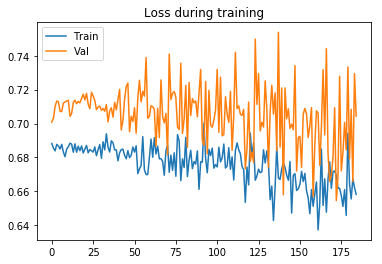

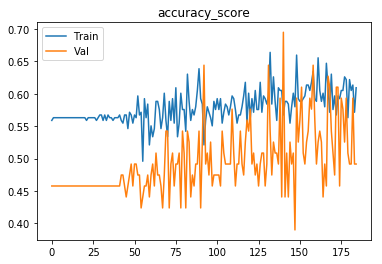

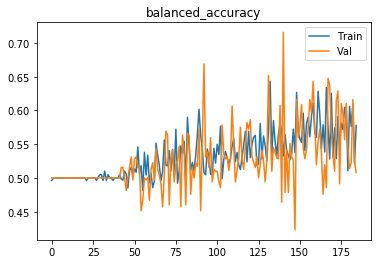

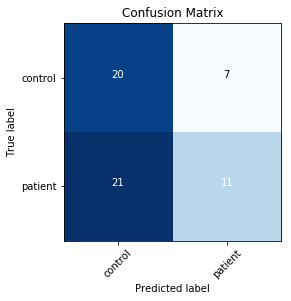

Finished outer fold.
{'final_acc': 0.50810185185185186, 'best_acc': 0.7158564814814814, 'final_iter': 185, 'best_iter': 141, 'params': {'model': 'ModelLiu', 'batch_size': 16, 'patience': 12, 'lr': 0.0001}, 'inner_fold_idx': 4}
###### Starting outer fold 1
238
59
Shuffled the data..
###### Starting inner fold 0
{'model': 'ModelLiu', 'batch_size': 12, 'patience': 16, 'lr': 0.0001}
Trainable model parameters: 116001
torch.Size([1, 72, 57, 75])


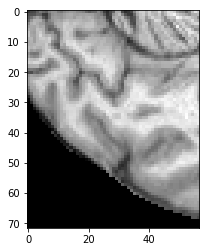

[0,     5] loss: 0.69398
[0,    10] loss: 0.69783
[0,    15] loss: 0.69026
Time elapsed: 0h:0m:23s
train accuracy_score: 49.16 %
train balanced_accuracy: 50.68 %
val accuracy_score: 57.63 %
val balanced_accuracy: 50.00 %
Val loss: 0.691745
[1,     5] loss: 0.69757
[1,    10] loss: 0.69684
[1,    15] loss: 0.69299
Time elapsed: 0h:1m:8s
train accuracy_score: 47.90 %
train balanced_accuracy: 44.90 %
val accuracy_score: 57.63 %
val balanced_accuracy: 50.00 %
Val loss: 0.686380
[2,     5] loss: 0.69258
[2,    10] loss: 0.70182
[2,    15] loss: 0.69346
Time elapsed: 0h:1m:53s
train accuracy_score: 51.26 %
train balanced_accuracy: 47.78 %
val accuracy_score: 57.63 %
val balanced_accuracy: 50.00 %
Val loss: 0.687018
[3,     5] loss: 0.69291
[3,    10] loss: 0.69882
[3,    15] loss: 0.67418
Time elapsed: 0h:2m:37s
train accuracy_score: 52.94 %
train balanced_accuracy: 49.12 %
val accuracy_score: 57.63 %
val balanced_accuracy: 50.00 %
Val loss: 0.680943
[4,     5] loss: 0.67791
[4,    10] loss:

[34,     5] loss: 0.69449
[34,    10] loss: 0.68628
[34,    15] loss: 0.69278
Time elapsed: 0h:25m:21s
train accuracy_score: 55.04 %
train balanced_accuracy: 51.27 %
val accuracy_score: 57.63 %
val balanced_accuracy: 50.00 %
Val loss: 0.685768
[35,     5] loss: 0.68966
[35,    10] loss: 0.69320
[35,    15] loss: 0.68899
Time elapsed: 0h:26m:5s
train accuracy_score: 53.36 %
train balanced_accuracy: 49.79 %
val accuracy_score: 57.63 %
val balanced_accuracy: 50.00 %
Val loss: 0.683000
[36,     5] loss: 0.68990
[36,    10] loss: 0.68545
[36,    15] loss: 0.70823
Time elapsed: 0h:26m:49s
train accuracy_score: 54.20 %
train balanced_accuracy: 50.07 %
val accuracy_score: 57.63 %
val balanced_accuracy: 50.00 %
Val loss: 0.682367
[37,     5] loss: 0.67647
[37,    10] loss: 0.71375
[37,    15] loss: 0.69578
Time elapsed: 0h:27m:32s
train accuracy_score: 54.20 %
train balanced_accuracy: 50.07 %
val accuracy_score: 57.63 %
val balanced_accuracy: 50.00 %
Val loss: 0.683808
[38,     5] loss: 0.67721

val accuracy_score: 55.93 %
val balanced_accuracy: 49.59 %
Val loss: 0.684337
[68,     5] loss: 0.69254
[68,    10] loss: 0.66781
[68,    15] loss: 0.69768
Time elapsed: 0h:50m:17s
train accuracy_score: 56.30 %
train balanced_accuracy: 52.51 %
val accuracy_score: 57.63 %
val balanced_accuracy: 50.00 %
Val loss: 0.669995
[69,     5] loss: 0.68884
[69,    10] loss: 0.68437
[69,    15] loss: 0.69148
Time elapsed: 0h:51m:0s
train accuracy_score: 55.46 %
train balanced_accuracy: 51.80 %
val accuracy_score: 61.02 %
val balanced_accuracy: 54.00 %
Val loss: 0.682207
[70,     5] loss: 0.70179
[70,    10] loss: 0.67572
[70,    15] loss: 0.68652
Time elapsed: 0h:51m:44s
train accuracy_score: 53.78 %
train balanced_accuracy: 50.25 %
val accuracy_score: 61.02 %
val balanced_accuracy: 54.00 %
Val loss: 0.687785
[71,     5] loss: 0.67442
[71,    10] loss: 0.69575
[71,    15] loss: 0.67289
Time elapsed: 0h:52m:28s
train accuracy_score: 55.04 %
train balanced_accuracy: 51.42 %
val accuracy_score: 54.24

Time elapsed: 1h:14m:27s
train accuracy_score: 57.14 %
train balanced_accuracy: 53.92 %
val accuracy_score: 50.85 %
val balanced_accuracy: 44.12 %
Val loss: 0.684967
[102,     5] loss: 0.67446
[102,    10] loss: 0.70504
[102,    15] loss: 0.66236
Time elapsed: 1h:15m:11s
train accuracy_score: 56.72 %
train balanced_accuracy: 53.46 %
val accuracy_score: 57.63 %
val balanced_accuracy: 51.59 %
Val loss: 0.678644
[103,     5] loss: 0.68982
[103,    10] loss: 0.64004
[103,    15] loss: 0.69254
Time elapsed: 1h:15m:54s
train accuracy_score: 56.72 %
train balanced_accuracy: 55.03 %
val accuracy_score: 54.24 %
val balanced_accuracy: 50.24 %
Val loss: 0.663997
[104,     5] loss: 0.69292
[104,    10] loss: 0.67424
[104,    15] loss: 0.69596
Time elapsed: 1h:16m:37s
train accuracy_score: 53.78 %
train balanced_accuracy: 51.60 %
val accuracy_score: 59.32 %
val balanced_accuracy: 55.71 %
Val loss: 0.668132
[105,     5] loss: 0.69435
[105,    10] loss: 0.68020
[105,    15] loss: 0.68205
Time elapsed

val accuracy_score: 57.63 %
val balanced_accuracy: 53.71 %
Val loss: 0.678186
[135,     5] loss: 0.69097
[135,    10] loss: 0.66264
[135,    15] loss: 0.69769
Time elapsed: 1h:39m:18s
train accuracy_score: 53.78 %
train balanced_accuracy: 53.10 %
val accuracy_score: 47.46 %
val balanced_accuracy: 44.88 %
Val loss: 0.686659
[136,     5] loss: 0.68189
[136,    10] loss: 0.67016
[136,    15] loss: 0.65767
Time elapsed: 1h:40m:2s
train accuracy_score: 60.50 %
train balanced_accuracy: 58.94 %
val accuracy_score: 47.46 %
val balanced_accuracy: 42.76 %
Val loss: 0.701605
[137,     5] loss: 0.68095
[137,    10] loss: 0.68827
[137,    15] loss: 0.67719
Time elapsed: 1h:40m:46s
train accuracy_score: 57.14 %
train balanced_accuracy: 54.28 %
val accuracy_score: 54.24 %
val balanced_accuracy: 49.18 %
Val loss: 0.677244
[138,     5] loss: 0.68128
[138,    10] loss: 0.67086
[138,    15] loss: 0.69819
Time elapsed: 1h:41m:30s
train accuracy_score: 54.20 %
train balanced_accuracy: 52.77 %
val accuracy_

[168,     5] loss: 0.67527
[168,    10] loss: 0.67225
[168,    15] loss: 0.66812
Time elapsed: 2h:3m:30s
train accuracy_score: 57.56 %
train balanced_accuracy: 55.38 %
val accuracy_score: 67.80 %
val balanced_accuracy: 64.65 %
Val loss: 0.648516
[169,     5] loss: 0.68146
[169,    10] loss: 0.68915
[169,    15] loss: 0.66524
Time elapsed: 2h:4m:15s
train accuracy_score: 55.88 %
train balanced_accuracy: 55.53 %
val accuracy_score: 66.10 %
val balanced_accuracy: 62.12 %
Val loss: 0.655746
[170,     5] loss: 0.67610
[170,    10] loss: 0.68096
[170,    15] loss: 0.66347
Time elapsed: 2h:4m:59s
train accuracy_score: 59.24 %
train balanced_accuracy: 56.86 %
val accuracy_score: 54.24 %
val balanced_accuracy: 49.71 %
Val loss: 0.666560
[171,     5] loss: 0.68913
[171,    10] loss: 0.68885
[171,    15] loss: 0.66187
Time elapsed: 2h:5m:43s
train accuracy_score: 54.62 %
train balanced_accuracy: 52.73 %
val accuracy_score: 62.71 %
val balanced_accuracy: 56.00 %
Val loss: 0.666903
[172,     5] los

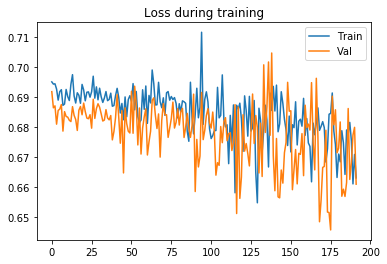

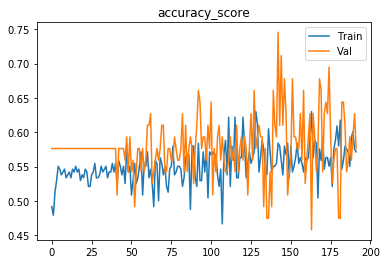

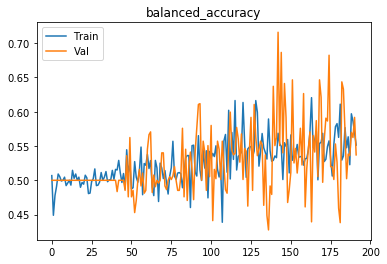

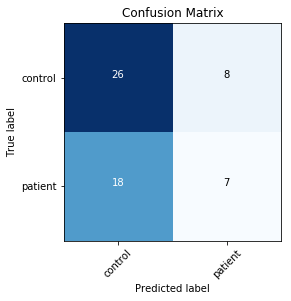

###### Starting inner fold 1
{'model': 'ModelLiu', 'batch_size': 16, 'patience': 16, 'lr': 5e-05}
Trainable model parameters: 116001
torch.Size([1, 72, 57, 75])


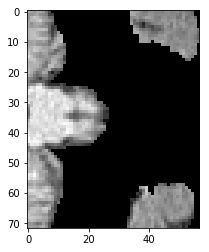

[0,     5] loss: 0.69614
[0,    10] loss: 0.69414
Time elapsed: 0h:0m:23s
train accuracy_score: 44.54 %
train balanced_accuracy: 45.71 %
val accuracy_score: 57.63 %
val balanced_accuracy: 50.00 %
Val loss: 0.692681
[1,     5] loss: 0.69150
[1,    10] loss: 0.69168
Time elapsed: 0h:1m:9s
train accuracy_score: 50.84 %
train balanced_accuracy: 47.68 %
val accuracy_score: 57.63 %
val balanced_accuracy: 50.00 %
Val loss: 0.689283
[2,     5] loss: 0.69501
[2,    10] loss: 0.68472
Time elapsed: 0h:1m:54s
train accuracy_score: 52.94 %
train balanced_accuracy: 49.41 %
val accuracy_score: 57.63 %
val balanced_accuracy: 50.00 %
Val loss: 0.688681
[3,     5] loss: 0.69070
[3,    10] loss: 0.69388
Time elapsed: 0h:2m:41s
train accuracy_score: 53.36 %
train balanced_accuracy: 49.30 %
val accuracy_score: 57.63 %
val balanced_accuracy: 50.00 %
Val loss: 0.685700
[4,     5] loss: 0.68520
[4,    10] loss: 0.70320
Time elapsed: 0h:3m:26s
train accuracy_score: 54.62 %
train balanced_accuracy: 50.60 %
val 

[38,     5] loss: 0.69055
[38,    10] loss: 0.69336
Time elapsed: 0h:29m:18s
train accuracy_score: 54.62 %
train balanced_accuracy: 50.60 %
val accuracy_score: 57.63 %
val balanced_accuracy: 50.00 %
Val loss: 0.688853
[39,     5] loss: 0.68204
[39,    10] loss: 0.69311
Time elapsed: 0h:30m:3s
train accuracy_score: 55.88 %
train balanced_accuracy: 51.91 %
val accuracy_score: 57.63 %
val balanced_accuracy: 50.00 %
Val loss: 0.679434
[40,     5] loss: 0.69726
[40,    10] loss: 0.68186
Time elapsed: 0h:30m:48s
train accuracy_score: 55.04 %
train balanced_accuracy: 50.99 %
val accuracy_score: 57.63 %
val balanced_accuracy: 50.00 %
Val loss: 0.683475
[41,     5] loss: 0.68812
[41,    10] loss: 0.68538
Time elapsed: 0h:31m:34s
train accuracy_score: 54.62 %
train balanced_accuracy: 50.53 %
val accuracy_score: 57.63 %
val balanced_accuracy: 50.00 %
Val loss: 0.681280
[42,     5] loss: 0.70092
[42,    10] loss: 0.68197
Time elapsed: 0h:32m:20s
train accuracy_score: 53.36 %
train balanced_accurac

val accuracy_score: 55.93 %
val balanced_accuracy: 49.06 %
Val loss: 0.684585
[76,     5] loss: 0.69072
[76,    10] loss: 0.67351
Time elapsed: 0h:58m:9s
train accuracy_score: 56.30 %
train balanced_accuracy: 53.22 %
val accuracy_score: 50.85 %
val balanced_accuracy: 44.12 %
Val loss: 0.683629
[77,     5] loss: 0.68497
[77,    10] loss: 0.69865
Time elapsed: 0h:58m:55s
train accuracy_score: 55.46 %
train balanced_accuracy: 52.37 %
val accuracy_score: 55.93 %
val balanced_accuracy: 49.06 %
Val loss: 0.685983
[78,     5] loss: 0.69631
[78,    10] loss: 0.67583
Time elapsed: 0h:59m:41s
train accuracy_score: 53.78 %
train balanced_accuracy: 50.61 %
val accuracy_score: 55.93 %
val balanced_accuracy: 48.53 %
Val loss: 0.682808
[79,     5] loss: 0.68596
[79,    10] loss: 0.69625
Time elapsed: 1h:0m:26s
train accuracy_score: 55.04 %
train balanced_accuracy: 51.63 %
val accuracy_score: 57.63 %
val balanced_accuracy: 51.06 %
Val loss: 0.673839
[80,     5] loss: 0.69269
[80,    10] loss: 0.68277


Time elapsed: 1h:26m:13s
train accuracy_score: 51.26 %
train balanced_accuracy: 48.92 %
val accuracy_score: 57.63 %
val balanced_accuracy: 51.06 %
Val loss: 0.686647
[114,     5] loss: 0.68139
[114,    10] loss: 0.67306
Time elapsed: 1h:26m:59s
train accuracy_score: 58.82 %
train balanced_accuracy: 56.33 %
val accuracy_score: 47.46 %
val balanced_accuracy: 42.24 %
Val loss: 0.697038
[115,     5] loss: 0.70305
[115,    10] loss: 0.69908
Time elapsed: 1h:27m:45s
train accuracy_score: 47.06 %
train balanced_accuracy: 44.55 %
val accuracy_score: 44.07 %
val balanced_accuracy: 39.29 %
Val loss: 0.697164
[116,     5] loss: 0.68698
[116,    10] loss: 0.67578
Time elapsed: 1h:28m:30s
train accuracy_score: 55.04 %
train balanced_accuracy: 53.19 %
val accuracy_score: 50.85 %
val balanced_accuracy: 45.71 %
Val loss: 0.691231
[117,     5] loss: 0.68577
[117,    10] loss: 0.68460
Time elapsed: 1h:29m:16s
train accuracy_score: 52.52 %
train balanced_accuracy: 50.37 %
val accuracy_score: 52.54 %
val 

val accuracy_score: 55.93 %
val balanced_accuracy: 52.24 %
Val loss: 0.685997
[151,     5] loss: 0.67592
[151,    10] loss: 0.68792
Time elapsed: 1h:55m:10s
train accuracy_score: 54.62 %
train balanced_accuracy: 52.52 %
val accuracy_score: 59.32 %
val balanced_accuracy: 54.12 %
Val loss: 0.681180
[152,     5] loss: 0.67124
[152,    10] loss: 0.69171
Time elapsed: 1h:55m:55s
train accuracy_score: 56.30 %
train balanced_accuracy: 53.57 %
val accuracy_score: 57.63 %
val balanced_accuracy: 51.59 %
Val loss: 0.675362
[153,     5] loss: 0.68615
[153,    10] loss: 0.69087
Time elapsed: 1h:56m:41s
train accuracy_score: 52.52 %
train balanced_accuracy: 49.66 %
val accuracy_score: 67.80 %
val balanced_accuracy: 63.59 %
Val loss: 0.655404
[154,     5] loss: 0.69307
[154,    10] loss: 0.69219
Time elapsed: 1h:57m:26s
train accuracy_score: 53.78 %
train balanced_accuracy: 51.11 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.12 %
Val loss: 0.668180
[155,     5] loss: 0.69566
[155,    10] lo

[188,     5] loss: 0.67741
[188,    10] loss: 0.68540
Time elapsed: 2h:23m:21s
train accuracy_score: 56.30 %
train balanced_accuracy: 53.43 %
val accuracy_score: 62.71 %
val balanced_accuracy: 57.06 %
Val loss: 0.664147
[189,     5] loss: 0.67877
[189,    10] loss: 0.69211
Time elapsed: 2h:24m:7s
train accuracy_score: 53.36 %
train balanced_accuracy: 50.22 %
val accuracy_score: 52.54 %
val balanced_accuracy: 46.12 %
Val loss: 0.682013
Early stopping in epoch 190
Total time elapsed: 2h:24m:28s
Writing model to disk...
Best result during training: 0.62. Saving model..
Finished inner fold.


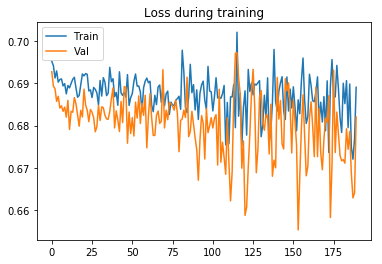

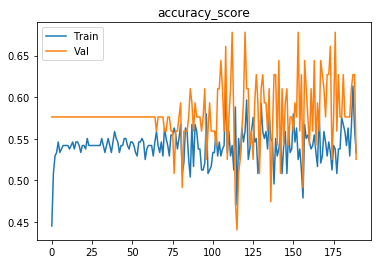

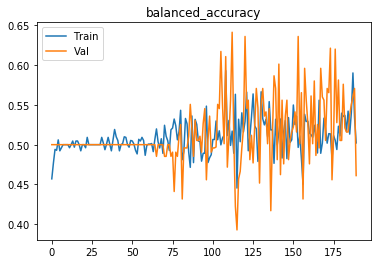

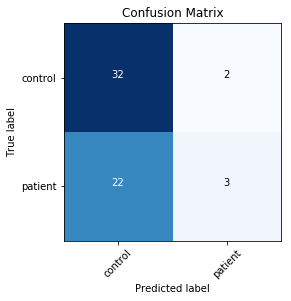

###### Starting inner fold 2
{'model': 'ModelLiu', 'batch_size': 32, 'patience': 12, 'lr': 0.0001}
Trainable model parameters: 116001
torch.Size([1, 72, 57, 75])


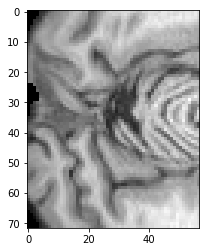

[0,     5] loss: 0.69724
Time elapsed: 0h:0m:23s
train accuracy_score: 47.90 %
train balanced_accuracy: 51.72 %
val accuracy_score: 42.37 %
val balanced_accuracy: 48.41 %
Val loss: 0.694288
[1,     5] loss: 0.69312
Time elapsed: 0h:1m:9s
train accuracy_score: 48.32 %
train balanced_accuracy: 47.49 %
val accuracy_score: 59.32 %
val balanced_accuracy: 52.00 %
Val loss: 0.683382
[2,     5] loss: 0.68943
Time elapsed: 0h:1m:55s
train accuracy_score: 55.88 %
train balanced_accuracy: 52.19 %
val accuracy_score: 57.63 %
val balanced_accuracy: 50.00 %
Val loss: 0.677510
[3,     5] loss: 0.69011
Time elapsed: 0h:2m:41s
train accuracy_score: 55.04 %
train balanced_accuracy: 50.92 %
val accuracy_score: 57.63 %
val balanced_accuracy: 50.00 %
Val loss: 0.685128
[4,     5] loss: 0.68938
Time elapsed: 0h:3m:27s
train accuracy_score: 54.20 %
train balanced_accuracy: 50.00 %
val accuracy_score: 57.63 %
val balanced_accuracy: 50.00 %
Val loss: 0.680467
[5,     5] loss: 0.69228
Time elapsed: 0h:4m:12s
tr

[43,     5] loss: 0.68041
Time elapsed: 0h:33m:12s
train accuracy_score: 54.20 %
train balanced_accuracy: 50.92 %
val accuracy_score: 57.63 %
val balanced_accuracy: 50.00 %
Val loss: 0.686983
[44,     5] loss: 0.69267
Time elapsed: 0h:34m:4s
train accuracy_score: 52.52 %
train balanced_accuracy: 49.45 %
val accuracy_score: 45.76 %
val balanced_accuracy: 39.71 %
Val loss: 0.688203
[45,     5] loss: 0.69140
Time elapsed: 0h:34m:50s
train accuracy_score: 58.82 %
train balanced_accuracy: 56.89 %
val accuracy_score: 61.02 %
val balanced_accuracy: 57.71 %
Val loss: 0.676623
[46,     5] loss: 0.68864
Time elapsed: 0h:35m:34s
train accuracy_score: 52.94 %
train balanced_accuracy: 50.05 %
val accuracy_score: 59.32 %
val balanced_accuracy: 53.59 %
Val loss: 0.682980
[47,     5] loss: 0.68362
Time elapsed: 0h:36m:17s
train accuracy_score: 55.04 %
train balanced_accuracy: 52.62 %
val accuracy_score: 62.71 %
val balanced_accuracy: 58.12 %
Val loss: 0.675474
[48,     5] loss: 0.68613
Time elapsed: 0

[86,     5] loss: 0.67790
Time elapsed: 1h:5m:34s
train accuracy_score: 52.52 %
train balanced_accuracy: 49.87 %
val accuracy_score: 62.71 %
val balanced_accuracy: 56.00 %
Val loss: 0.668418
[87,     5] loss: 0.69947
Time elapsed: 1h:6m:19s
train accuracy_score: 52.10 %
train balanced_accuracy: 49.06 %
val accuracy_score: 62.71 %
val balanced_accuracy: 58.65 %
Val loss: 0.679744
[88,     5] loss: 0.68658
Time elapsed: 1h:7m:4s
train accuracy_score: 54.62 %
train balanced_accuracy: 53.09 %
val accuracy_score: 64.41 %
val balanced_accuracy: 58.53 %
Val loss: 0.682599
[89,     5] loss: 0.68903
Time elapsed: 1h:7m:49s
train accuracy_score: 52.52 %
train balanced_accuracy: 50.44 %
val accuracy_score: 54.24 %
val balanced_accuracy: 47.06 %
Val loss: 0.677080
[90,     5] loss: 0.68560
Time elapsed: 1h:8m:34s
train accuracy_score: 52.94 %
train balanced_accuracy: 49.98 %
val accuracy_score: 55.93 %
val balanced_accuracy: 48.53 %
Val loss: 0.671891
[91,     5] loss: 0.68213
Time elapsed: 1h:9m:

val accuracy_score: 52.54 %
val balanced_accuracy: 47.18 %
Val loss: 0.694216
[129,     5] loss: 0.68483
Time elapsed: 1h:37m:12s
train accuracy_score: 56.30 %
train balanced_accuracy: 54.50 %
val accuracy_score: 50.85 %
val balanced_accuracy: 48.88 %
Val loss: 0.681148
[130,     5] loss: 0.67029
Time elapsed: 1h:37m:56s
train accuracy_score: 56.30 %
train balanced_accuracy: 55.78 %
val accuracy_score: 50.85 %
val balanced_accuracy: 46.24 %
Val loss: 0.694719
[131,     5] loss: 0.68259
Time elapsed: 1h:38m:40s
train accuracy_score: 52.94 %
train balanced_accuracy: 51.33 %
val accuracy_score: 59.32 %
val balanced_accuracy: 53.59 %
Val loss: 0.685899
[132,     5] loss: 0.68520
Time elapsed: 1h:39m:24s
train accuracy_score: 55.88 %
train balanced_accuracy: 53.19 %
val accuracy_score: 57.63 %
val balanced_accuracy: 52.12 %
Val loss: 0.684115
[133,     5] loss: 0.68124
Time elapsed: 1h:40m:9s
train accuracy_score: 52.10 %
train balanced_accuracy: 49.70 %
val accuracy_score: 64.41 %
val bala

Time elapsed: 2h:8m:7s
train accuracy_score: 56.72 %
train balanced_accuracy: 55.03 %
val accuracy_score: 54.24 %
val balanced_accuracy: 51.29 %
Val loss: 0.680979
[172,     5] loss: 0.69181
Time elapsed: 2h:8m:52s
train accuracy_score: 53.36 %
train balanced_accuracy: 53.14 %
val accuracy_score: 61.02 %
val balanced_accuracy: 58.24 %
Val loss: 0.668158
[173,     5] loss: 0.67613
Time elapsed: 2h:9m:37s
train accuracy_score: 60.08 %
train balanced_accuracy: 57.84 %
val accuracy_score: 54.24 %
val balanced_accuracy: 49.18 %
Val loss: 0.655077
[174,     5] loss: 0.68632
Time elapsed: 2h:10m:20s
train accuracy_score: 53.36 %
train balanced_accuracy: 50.79 %
val accuracy_score: 59.32 %
val balanced_accuracy: 54.12 %
Val loss: 0.662916
[175,     5] loss: 0.68089
Time elapsed: 2h:11m:2s
train accuracy_score: 57.56 %
train balanced_accuracy: 55.52 %
val accuracy_score: 57.63 %
val balanced_accuracy: 52.65 %
Val loss: 0.657489
[176,     5] loss: 0.67550
Time elapsed: 2h:11m:46s
train accuracy_

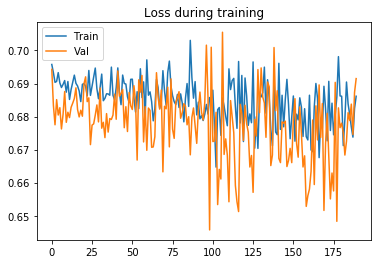

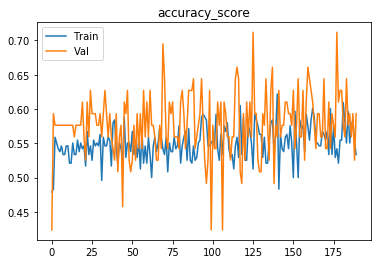

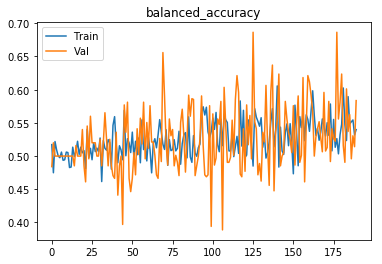

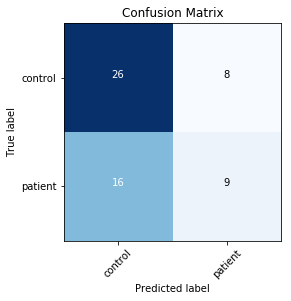

###### Starting inner fold 3
{'model': 'ModelLiu', 'batch_size': 12, 'patience': 16, 'lr': 0.0001}
Trainable model parameters: 116001
torch.Size([1, 72, 57, 75])


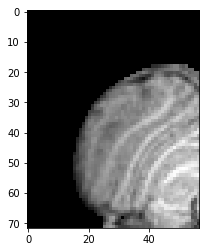

[0,     5] loss: 0.69758
[0,    10] loss: 0.68916
[0,    15] loss: 0.69206
Time elapsed: 0h:0m:23s
train accuracy_score: 46.22 %
train balanced_accuracy: 43.63 %
val accuracy_score: 57.63 %
val balanced_accuracy: 50.00 %
Val loss: 0.685529
[1,     5] loss: 0.68803
[1,    10] loss: 0.69170
[1,    15] loss: 0.69277
Time elapsed: 0h:1m:5s
train accuracy_score: 54.62 %
train balanced_accuracy: 50.89 %
val accuracy_score: 57.63 %
val balanced_accuracy: 50.00 %
Val loss: 0.686119
[2,     5] loss: 0.69141
[2,    10] loss: 0.68634
[2,    15] loss: 0.69186
Time elapsed: 0h:1m:46s
train accuracy_score: 52.94 %
train balanced_accuracy: 48.91 %
val accuracy_score: 57.63 %
val balanced_accuracy: 50.00 %
Val loss: 0.686716
[3,     5] loss: 0.68420
[3,    10] loss: 0.68957
[3,    15] loss: 0.68334
Time elapsed: 0h:2m:28s
train accuracy_score: 54.62 %
train balanced_accuracy: 50.53 %
val accuracy_score: 57.63 %
val balanced_accuracy: 50.00 %
Val loss: 0.683716
[4,     5] loss: 0.69136
[4,    10] loss:

[34,     5] loss: 0.68016
[34,    10] loss: 0.69089
[34,    15] loss: 0.69406
Time elapsed: 0h:24m:26s
train accuracy_score: 57.14 %
train balanced_accuracy: 53.42 %
val accuracy_score: 55.93 %
val balanced_accuracy: 49.06 %
Val loss: 0.680933
[35,     5] loss: 0.66985
[35,    10] loss: 0.71221
[35,    15] loss: 0.66409
Time elapsed: 0h:25m:8s
train accuracy_score: 54.62 %
train balanced_accuracy: 51.03 %
val accuracy_score: 55.93 %
val balanced_accuracy: 48.53 %
Val loss: 0.688225
[36,     5] loss: 0.69221
[36,    10] loss: 0.66976
[36,    15] loss: 0.71424
Time elapsed: 0h:25m:50s
train accuracy_score: 52.52 %
train balanced_accuracy: 48.95 %
val accuracy_score: 54.24 %
val balanced_accuracy: 47.59 %
Val loss: 0.688915
[37,     5] loss: 0.69282
[37,    10] loss: 0.69711
[37,    15] loss: 0.67373
Time elapsed: 0h:26m:32s
train accuracy_score: 57.14 %
train balanced_accuracy: 55.06 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.65 %
Val loss: 0.683739
[38,     5] loss: 0.68938

val accuracy_score: 61.02 %
val balanced_accuracy: 55.06 %
Val loss: 0.661842
[68,     5] loss: 0.68669
[68,    10] loss: 0.69044
[68,    15] loss: 0.66932
Time elapsed: 0h:48m:24s
train accuracy_score: 56.72 %
train balanced_accuracy: 54.17 %
val accuracy_score: 69.49 %
val balanced_accuracy: 65.59 %
Val loss: 0.661078
[69,     5] loss: 0.70650
[69,    10] loss: 0.67772
[69,    15] loss: 0.66206
Time elapsed: 0h:49m:6s
train accuracy_score: 58.40 %
train balanced_accuracy: 55.58 %
val accuracy_score: 55.93 %
val balanced_accuracy: 49.06 %
Val loss: 0.680390
[70,     5] loss: 0.68934
[70,    10] loss: 0.67251
[70,    15] loss: 0.66547
Time elapsed: 0h:49m:48s
train accuracy_score: 55.88 %
train balanced_accuracy: 53.90 %
val accuracy_score: 54.24 %
val balanced_accuracy: 50.24 %
Val loss: 0.691765
[71,     5] loss: 0.66576
[71,    10] loss: 0.67607
[71,    15] loss: 0.73052
Time elapsed: 0h:50m:30s
train accuracy_score: 56.30 %
train balanced_accuracy: 53.79 %
val accuracy_score: 57.63

Time elapsed: 1h:11m:44s
train accuracy_score: 52.52 %
train balanced_accuracy: 50.30 %
val accuracy_score: 64.41 %
val balanced_accuracy: 61.71 %
Val loss: 0.670020
[102,     5] loss: 0.69630
[102,    10] loss: 0.67489
[102,    15] loss: 0.70924
Time elapsed: 1h:12m:27s
train accuracy_score: 54.62 %
train balanced_accuracy: 52.24 %
val accuracy_score: 54.24 %
val balanced_accuracy: 48.12 %
Val loss: 0.686937
[103,     5] loss: 0.70036
[103,    10] loss: 0.68284
[103,    15] loss: 0.69104
Time elapsed: 1h:13m:10s
train accuracy_score: 53.36 %
train balanced_accuracy: 50.79 %
val accuracy_score: 50.85 %
val balanced_accuracy: 46.76 %
Val loss: 0.692032
[104,     5] loss: 0.68299
[104,    10] loss: 0.68345
[104,    15] loss: 0.70092
Time elapsed: 1h:13m:53s
train accuracy_score: 52.10 %
train balanced_accuracy: 49.56 %
val accuracy_score: 52.54 %
val balanced_accuracy: 47.71 %
Val loss: 0.686100
[105,     5] loss: 0.67450
[105,    10] loss: 0.70271
[105,    15] loss: 0.69324
Time elapsed

val accuracy_score: 59.32 %
val balanced_accuracy: 56.24 %
Val loss: 0.670733
[135,     5] loss: 0.69338
[135,    10] loss: 0.64549
[135,    15] loss: 0.68062
Time elapsed: 1h:35m:58s
train accuracy_score: 57.98 %
train balanced_accuracy: 57.26 %
val accuracy_score: 57.63 %
val balanced_accuracy: 53.71 %
Val loss: 0.657490
[136,     5] loss: 0.64586
[136,    10] loss: 0.69658
[136,    15] loss: 0.70737
Time elapsed: 1h:36m:40s
train accuracy_score: 55.88 %
train balanced_accuracy: 53.33 %
val accuracy_score: 64.41 %
val balanced_accuracy: 61.71 %
Val loss: 0.658946
[137,     5] loss: 0.65970
[137,    10] loss: 0.67311
[137,    15] loss: 0.67899
Time elapsed: 1h:37m:23s
train accuracy_score: 57.14 %
train balanced_accuracy: 56.48 %
val accuracy_score: 59.32 %
val balanced_accuracy: 58.88 %
Val loss: 0.685519
[138,     5] loss: 0.66752
[138,    10] loss: 0.69791
[138,    15] loss: 0.69251
Time elapsed: 1h:38m:6s
train accuracy_score: 53.36 %
train balanced_accuracy: 52.35 %
val accuracy_

[168,     5] loss: 0.67512
[168,    10] loss: 0.66092
[168,    15] loss: 0.69714
Time elapsed: 1h:59m:16s
train accuracy_score: 53.36 %
train balanced_accuracy: 53.92 %
val accuracy_score: 61.02 %
val balanced_accuracy: 58.76 %
Val loss: 0.669722
[169,     5] loss: 0.70373
[169,    10] loss: 0.67513
[169,    15] loss: 0.69286
Time elapsed: 1h:59m:57s
train accuracy_score: 53.78 %
train balanced_accuracy: 51.53 %
val accuracy_score: 57.63 %
val balanced_accuracy: 52.65 %
Val loss: 0.661175
[170,     5] loss: 0.70157
[170,    10] loss: 0.66753
[170,    15] loss: 0.69282
Time elapsed: 2h:0m:38s
train accuracy_score: 53.78 %
train balanced_accuracy: 52.10 %
val accuracy_score: 52.54 %
val balanced_accuracy: 49.82 %
Val loss: 0.661068
[171,     5] loss: 0.69161
[171,    10] loss: 0.68432
[171,    15] loss: 0.70643
Time elapsed: 2h:1m:19s
train accuracy_score: 52.10 %
train balanced_accuracy: 49.91 %
val accuracy_score: 62.71 %
val balanced_accuracy: 58.65 %
Val loss: 0.670669
[172,     5] l

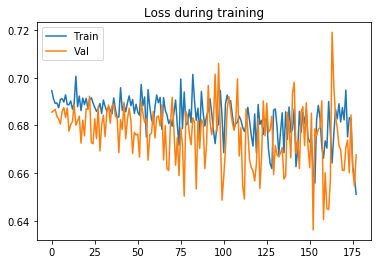

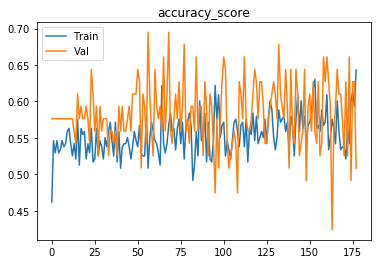

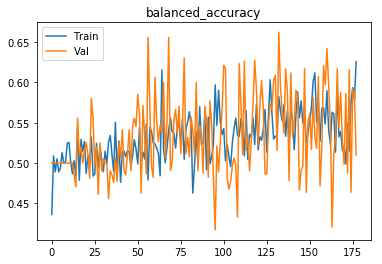

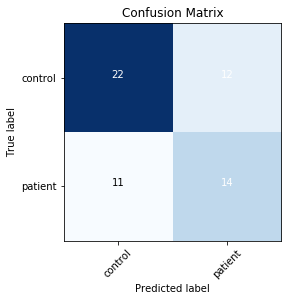

###### Starting inner fold 4
{'model': 'ModelLiu', 'batch_size': 16, 'patience': 12, 'lr': 0.0001}
Trainable model parameters: 116001
torch.Size([1, 72, 57, 75])


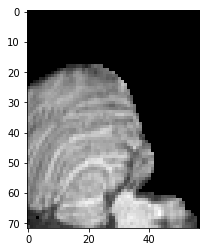

[0,     5] loss: 0.69792
[0,    10] loss: 0.69485
Time elapsed: 0h:0m:22s
train accuracy_score: 47.06 %
train balanced_accuracy: 48.82 %
val accuracy_score: 47.46 %
val balanced_accuracy: 43.29 %
Val loss: 0.691379
[1,     5] loss: 0.69246
[1,    10] loss: 0.69664
Time elapsed: 0h:1m:6s
train accuracy_score: 50.84 %
train balanced_accuracy: 47.89 %
val accuracy_score: 57.63 %
val balanced_accuracy: 50.00 %
Val loss: 0.685351
[2,     5] loss: 0.69650
[2,    10] loss: 0.69225
Time elapsed: 0h:1m:48s
train accuracy_score: 52.94 %
train balanced_accuracy: 49.98 %
val accuracy_score: 55.93 %
val balanced_accuracy: 48.53 %
Val loss: 0.688798
[3,     5] loss: 0.68149
[3,    10] loss: 0.70622
Time elapsed: 0h:2m:31s
train accuracy_score: 54.62 %
train balanced_accuracy: 50.53 %
val accuracy_score: 57.63 %
val balanced_accuracy: 50.00 %
Val loss: 0.678392
[4,     5] loss: 0.68811
[4,    10] loss: 0.68259
Time elapsed: 0h:3m:15s
train accuracy_score: 54.20 %
train balanced_accuracy: 50.36 %
val 

[38,     5] loss: 0.68547
[38,    10] loss: 0.69682
Time elapsed: 0h:27m:54s
train accuracy_score: 53.36 %
train balanced_accuracy: 50.50 %
val accuracy_score: 55.93 %
val balanced_accuracy: 49.06 %
Val loss: 0.682397
[39,     5] loss: 0.67007
[39,    10] loss: 0.69104
Time elapsed: 0h:28m:38s
train accuracy_score: 54.20 %
train balanced_accuracy: 50.50 %
val accuracy_score: 57.63 %
val balanced_accuracy: 50.53 %
Val loss: 0.671024
[40,     5] loss: 0.67732
[40,    10] loss: 0.70876
Time elapsed: 0h:29m:22s
train accuracy_score: 52.52 %
train balanced_accuracy: 49.23 %
val accuracy_score: 54.24 %
val balanced_accuracy: 48.12 %
Val loss: 0.684401
[41,     5] loss: 0.69072
[41,    10] loss: 0.68776
Time elapsed: 0h:30m:6s
train accuracy_score: 54.62 %
train balanced_accuracy: 53.52 %
val accuracy_score: 61.02 %
val balanced_accuracy: 58.76 %
Val loss: 0.678818
[42,     5] loss: 0.68445
[42,    10] loss: 0.69555
Time elapsed: 0h:30m:50s
train accuracy_score: 51.26 %
train balanced_accurac

val accuracy_score: 57.63 %
val balanced_accuracy: 52.65 %
Val loss: 0.666132
[76,     5] loss: 0.68799
[76,    10] loss: 0.69085
Time elapsed: 0h:55m:36s
train accuracy_score: 51.26 %
train balanced_accuracy: 49.06 %
val accuracy_score: 59.32 %
val balanced_accuracy: 55.71 %
Val loss: 0.676893
[77,     5] loss: 0.69903
[77,    10] loss: 0.69290
Time elapsed: 0h:56m:19s
train accuracy_score: 49.16 %
train balanced_accuracy: 47.41 %
val accuracy_score: 59.32 %
val balanced_accuracy: 53.06 %
Val loss: 0.679258
[78,     5] loss: 0.69745
[78,    10] loss: 0.68861
Time elapsed: 0h:57m:1s
train accuracy_score: 51.26 %
train balanced_accuracy: 48.99 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.12 %
Val loss: 0.685076
[79,     5] loss: 0.68484
[79,    10] loss: 0.70536
Time elapsed: 0h:57m:45s
train accuracy_score: 52.52 %
train balanced_accuracy: 49.02 %
val accuracy_score: 61.02 %
val balanced_accuracy: 54.00 %
Val loss: 0.668900
[80,     5] loss: 0.69137
[80,    10] loss: 0.68241

Time elapsed: 1h:38m:52s
train accuracy_score: 58.40 %
train balanced_accuracy: 56.51 %
val accuracy_score: 67.80 %
val balanced_accuracy: 64.12 %
Val loss: 0.669195
[114,     5] loss: 0.68084
[114,    10] loss: 0.68598
Time elapsed: 1h:39m:38s
train accuracy_score: 54.20 %
train balanced_accuracy: 51.64 %
val accuracy_score: 57.63 %
val balanced_accuracy: 52.12 %
Val loss: 0.670512
[115,     5] loss: 0.65499
[115,    10] loss: 0.70455
Time elapsed: 1h:40m:23s
train accuracy_score: 54.20 %
train balanced_accuracy: 51.07 %
val accuracy_score: 67.80 %
val balanced_accuracy: 63.59 %
Val loss: 0.652753
[116,     5] loss: 0.69425
[116,    10] loss: 0.68964
Time elapsed: 1h:41m:9s
train accuracy_score: 52.10 %
train balanced_accuracy: 52.54 %
val accuracy_score: 61.02 %
val balanced_accuracy: 59.29 %
Val loss: 0.682142
[117,     5] loss: 0.67187
[117,    10] loss: 0.66240
Time elapsed: 1h:41m:55s
train accuracy_score: 60.92 %
train balanced_accuracy: 59.76 %
val accuracy_score: 52.54 %
val b

val accuracy_score: 64.41 %
val balanced_accuracy: 58.00 %
Val loss: 0.663417
[151,     5] loss: 0.66854
[151,    10] loss: 0.69643
Time elapsed: 2h:7m:52s
train accuracy_score: 55.46 %
train balanced_accuracy: 52.87 %
val accuracy_score: 59.32 %
val balanced_accuracy: 57.82 %
Val loss: 0.670944
[152,     5] loss: 0.68297
[152,    10] loss: 0.67838
Time elapsed: 2h:8m:38s
train accuracy_score: 56.72 %
train balanced_accuracy: 55.67 %
val accuracy_score: 59.32 %
val balanced_accuracy: 55.71 %
Val loss: 0.683439
[153,     5] loss: 0.69762
[153,    10] loss: 0.68520
Time elapsed: 2h:9m:24s
train accuracy_score: 54.20 %
train balanced_accuracy: 52.99 %
val accuracy_score: 49.15 %
val balanced_accuracy: 46.88 %
Val loss: 0.703737
[154,     5] loss: 0.68728
[154,    10] loss: 0.68734
Time elapsed: 2h:10m:11s
train accuracy_score: 55.46 %
train balanced_accuracy: 53.30 %
val accuracy_score: 50.85 %
val balanced_accuracy: 46.24 %
Val loss: 0.675887
[155,     5] loss: 0.67420
[155,    10] loss:

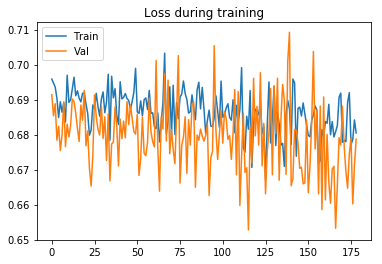

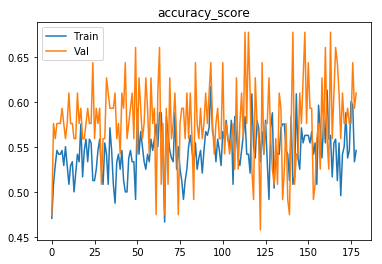

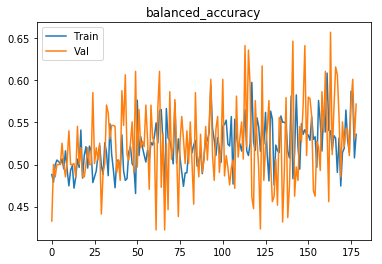

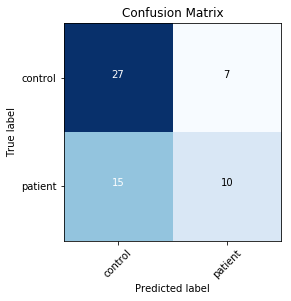

Finished outer fold.
{'final_acc': 0.58352941176470585, 'best_acc': 0.68647058823529417, 'final_iter': 190, 'best_iter': 178, 'params': {'model': 'ModelLiu', 'batch_size': 32, 'patience': 12, 'lr': 0.0001}, 'inner_fold_idx': 2}
###### Starting outer fold 2
238
59
Shuffled the data..
###### Starting inner fold 0
{'model': 'ModelLiu', 'batch_size': 16, 'patience': 16, 'lr': 0.0001}
Trainable model parameters: 116001
torch.Size([1, 72, 57, 75])


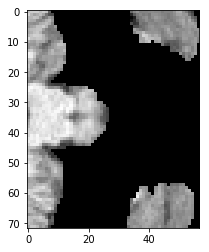

[0,     5] loss: 0.68602
[0,    10] loss: 0.67896
Time elapsed: 0h:0m:23s
train accuracy_score: 57.56 %
train balanced_accuracy: 50.00 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.688541
[1,     5] loss: 0.67827
[1,    10] loss: 0.67826
Time elapsed: 0h:1m:9s
train accuracy_score: 57.56 %
train balanced_accuracy: 50.00 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.684238
[2,     5] loss: 0.69399
[2,    10] loss: 0.67924
Time elapsed: 0h:1m:55s
train accuracy_score: 57.56 %
train balanced_accuracy: 50.00 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.686102
[3,     5] loss: 0.67898
[3,    10] loss: 0.70053
Time elapsed: 0h:2m:41s
train accuracy_score: 57.56 %
train balanced_accuracy: 50.00 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.687426
[4,     5] loss: 0.66843
[4,    10] loss: 0.67948
Time elapsed: 0h:3m:27s
train accuracy_score: 57.56 %
train balanced_accuracy: 50.00 %
val 

[38,     5] loss: 0.70149
[38,    10] loss: 0.67457
Time elapsed: 0h:29m:8s
train accuracy_score: 57.56 %
train balanced_accuracy: 50.00 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.679488
[39,     5] loss: 0.67331
[39,    10] loss: 0.68769
Time elapsed: 0h:29m:54s
train accuracy_score: 57.56 %
train balanced_accuracy: 50.00 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.687862
[40,     5] loss: 0.68746
[40,    10] loss: 0.66034
Time elapsed: 0h:30m:39s
train accuracy_score: 57.56 %
train balanced_accuracy: 50.00 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.683698
[41,     5] loss: 0.70059
[41,    10] loss: 0.66671
Time elapsed: 0h:31m:25s
train accuracy_score: 57.56 %
train balanced_accuracy: 50.00 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.682491
[42,     5] loss: 0.68536
[42,    10] loss: 0.67854
Time elapsed: 0h:32m:10s
train accuracy_score: 57.56 %
train balanced_accurac

val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.678225
[76,     5] loss: 0.66873
[76,    10] loss: 0.65502
Time elapsed: 0h:57m:12s
train accuracy_score: 57.56 %
train balanced_accuracy: 50.00 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.686721
[77,     5] loss: 0.66194
[77,    10] loss: 0.69365
Time elapsed: 0h:57m:56s
train accuracy_score: 57.56 %
train balanced_accuracy: 50.00 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.688968
[78,     5] loss: 0.64628
[78,    10] loss: 0.71436
Time elapsed: 0h:58m:41s
train accuracy_score: 57.56 %
train balanced_accuracy: 50.00 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.688532
[79,     5] loss: 0.68612
[79,    10] loss: 0.68036
Time elapsed: 0h:59m:27s
train accuracy_score: 57.14 %
train balanced_accuracy: 49.64 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.689817
[80,     5] loss: 0.66348
[80,    10] loss: 0.6885

Time elapsed: 1h:24m:33s
train accuracy_score: 58.82 %
train balanced_accuracy: 52.01 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.667943
[114,     5] loss: 0.66708
[114,    10] loss: 0.66750
Time elapsed: 1h:25m:17s
train accuracy_score: 56.72 %
train balanced_accuracy: 49.27 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.693257
[115,     5] loss: 0.65615
[115,    10] loss: 0.68741
Time elapsed: 1h:26m:2s
train accuracy_score: 55.88 %
train balanced_accuracy: 48.54 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.674374
[116,     5] loss: 0.67861
[116,    10] loss: 0.65671
Time elapsed: 1h:26m:46s
train accuracy_score: 59.24 %
train balanced_accuracy: 52.24 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.668465
[117,     5] loss: 0.68573
[117,    10] loss: 0.66937
Time elapsed: 1h:27m:30s
train accuracy_score: 56.72 %
train balanced_accuracy: 49.53 %
val accuracy_score: 55.93 %
val b

val accuracy_score: 57.63 %
val balanced_accuracy: 52.33 %
Val loss: 0.687632
[151,     5] loss: 0.67198
[151,    10] loss: 0.66475
Time elapsed: 1h:53m:35s
train accuracy_score: 60.08 %
train balanced_accuracy: 53.75 %
val accuracy_score: 54.24 %
val balanced_accuracy: 48.89 %
Val loss: 0.667484
[152,     5] loss: 0.68124
[152,    10] loss: 0.63583
Time elapsed: 1h:54m:25s
train accuracy_score: 57.98 %
train balanced_accuracy: 51.54 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.690361
[153,     5] loss: 0.66154
[153,    10] loss: 0.68373
Time elapsed: 1h:55m:18s
train accuracy_score: 59.24 %
train balanced_accuracy: 54.32 %
val accuracy_score: 61.02 %
val balanced_accuracy: 56.59 %
Val loss: 0.654885
[154,     5] loss: 0.66417
[154,    10] loss: 0.65409
Time elapsed: 1h:56m:9s
train accuracy_score: 60.50 %
train balanced_accuracy: 54.25 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.41 %
Val loss: 0.680955
[155,     5] loss: 0.66238
[155,    10] los

[188,     5] loss: 0.64993
[188,    10] loss: 0.68991
Time elapsed: 2h:21m:59s
train accuracy_score: 56.30 %
train balanced_accuracy: 53.20 %
val accuracy_score: 61.02 %
val balanced_accuracy: 58.62 %
Val loss: 0.652624
[189,     5] loss: 0.66303
[189,    10] loss: 0.65005
Time elapsed: 2h:22m:44s
train accuracy_score: 61.76 %
train balanced_accuracy: 55.47 %
val accuracy_score: 57.63 %
val balanced_accuracy: 51.92 %
Val loss: 0.647752
[190,     5] loss: 0.65634
[190,    10] loss: 0.69172
Time elapsed: 2h:23m:30s
train accuracy_score: 57.98 %
train balanced_accuracy: 53.36 %
val accuracy_score: 59.32 %
val balanced_accuracy: 58.33 %
Val loss: 0.666606
[191,     5] loss: 0.65927
[191,    10] loss: 0.71921
Time elapsed: 2h:24m:15s
train accuracy_score: 57.56 %
train balanced_accuracy: 54.42 %
val accuracy_score: 54.24 %
val balanced_accuracy: 48.89 %
Val loss: 0.682909
[192,     5] loss: 0.63506
[192,    10] loss: 0.69884
Time elapsed: 2h:25m:1s
train accuracy_score: 57.14 %
train balanc

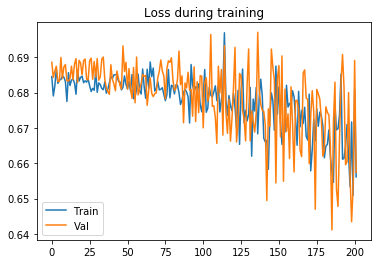

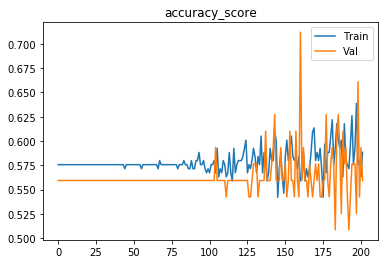

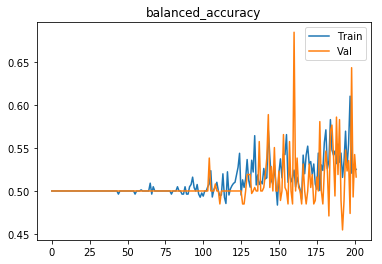

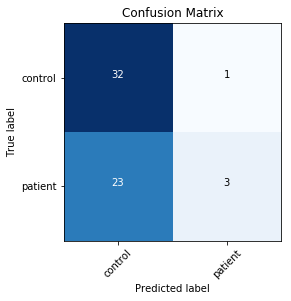

###### Starting inner fold 1
{'model': 'ModelLiu', 'batch_size': 32, 'patience': 16, 'lr': 0.0001}
Trainable model parameters: 116001
torch.Size([1, 72, 57, 75])


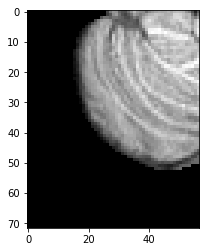

[0,     5] loss: 0.69107
Time elapsed: 0h:0m:23s
train accuracy_score: 53.36 %
train balanced_accuracy: 48.04 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.688787
[1,     5] loss: 0.68507
Time elapsed: 0h:1m:9s
train accuracy_score: 57.56 %
train balanced_accuracy: 50.00 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.686131
[2,     5] loss: 0.68451
Time elapsed: 0h:1m:55s
train accuracy_score: 57.56 %
train balanced_accuracy: 50.00 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.679383
[3,     5] loss: 0.68160
Time elapsed: 0h:2m:41s
train accuracy_score: 57.56 %
train balanced_accuracy: 50.00 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.686538
[4,     5] loss: 0.68893
Time elapsed: 0h:3m:27s
train accuracy_score: 57.56 %
train balanced_accuracy: 50.00 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.684901
[5,     5] loss: 0.67077
Time elapsed: 0h:4m:14s
tr

[43,     5] loss: 0.67538
Time elapsed: 0h:33m:18s
train accuracy_score: 57.56 %
train balanced_accuracy: 50.00 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.679597
[44,     5] loss: 0.67785
Time elapsed: 0h:34m:4s
train accuracy_score: 57.56 %
train balanced_accuracy: 50.00 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.687505
[45,     5] loss: 0.68685
Time elapsed: 0h:34m:50s
train accuracy_score: 57.56 %
train balanced_accuracy: 50.00 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.687616
[46,     5] loss: 0.69415
Time elapsed: 0h:35m:35s
train accuracy_score: 57.56 %
train balanced_accuracy: 50.00 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.688218
[47,     5] loss: 0.68625
Time elapsed: 0h:36m:21s
train accuracy_score: 57.56 %
train balanced_accuracy: 50.00 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.679140
[48,     5] loss: 0.68587
Time elapsed: 0

[86,     5] loss: 0.69949
Time elapsed: 1h:6m:14s
train accuracy_score: 57.56 %
train balanced_accuracy: 50.00 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.684661
[87,     5] loss: 0.68258
Time elapsed: 1h:7m:0s
train accuracy_score: 57.56 %
train balanced_accuracy: 50.00 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.689995
[88,     5] loss: 0.67520
Time elapsed: 1h:7m:46s
train accuracy_score: 57.56 %
train balanced_accuracy: 50.00 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.687313
[89,     5] loss: 0.67479
Time elapsed: 1h:8m:32s
train accuracy_score: 57.56 %
train balanced_accuracy: 50.00 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.690158
[90,     5] loss: 0.69536
Time elapsed: 1h:9m:18s
train accuracy_score: 57.56 %
train balanced_accuracy: 50.00 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.686140
[91,     5] loss: 0.68542
Time elapsed: 1h:10m

val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.678716
[129,     5] loss: 0.68311
Time elapsed: 1h:39m:3s
train accuracy_score: 58.82 %
train balanced_accuracy: 51.62 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.677390
[130,     5] loss: 0.68246
Time elapsed: 1h:39m:49s
train accuracy_score: 56.72 %
train balanced_accuracy: 49.27 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.687699
[131,     5] loss: 0.67913
Time elapsed: 1h:40m:34s
train accuracy_score: 57.98 %
train balanced_accuracy: 50.50 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.696761
[132,     5] loss: 0.67901
Time elapsed: 1h:41m:19s
train accuracy_score: 57.98 %
train balanced_accuracy: 50.50 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.691690
[133,     5] loss: 0.68679
Time elapsed: 1h:42m:4s
train accuracy_score: 57.56 %
train balanced_accuracy: 50.00 %
val accuracy_score: 55.93 %
val balan

val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.683187
[172,     5] loss: 0.66484
Time elapsed: 2h:11m:45s
train accuracy_score: 57.56 %
train balanced_accuracy: 50.39 %
val accuracy_score: 57.63 %
val balanced_accuracy: 51.92 %
Val loss: 0.675376
[173,     5] loss: 0.66998
Time elapsed: 2h:12m:31s
train accuracy_score: 60.92 %
train balanced_accuracy: 56.04 %
val accuracy_score: 64.41 %
val balanced_accuracy: 60.84 %
Val loss: 0.669759
[174,     5] loss: 0.66426
Time elapsed: 2h:13m:17s
train accuracy_score: 61.34 %
train balanced_accuracy: 56.28 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.668290
[175,     5] loss: 0.66569
Time elapsed: 2h:14m:4s
train accuracy_score: 60.92 %
train balanced_accuracy: 54.48 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.685368
[176,     5] loss: 0.68468
Time elapsed: 2h:14m:49s
train accuracy_score: 56.72 %
train balanced_accuracy: 50.31 %
val accuracy_score: 59.32 %
val bala

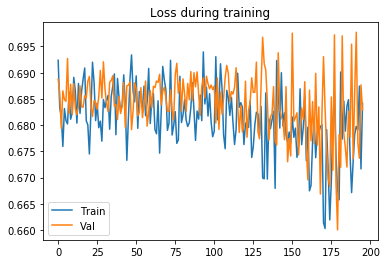

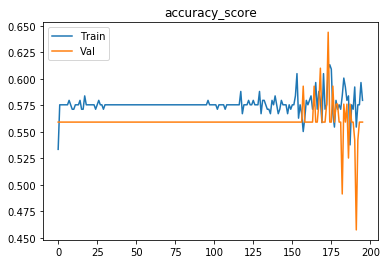

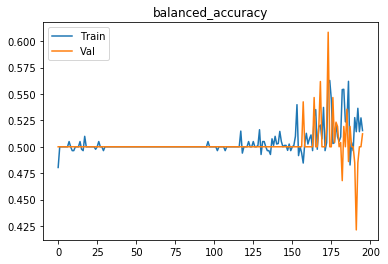

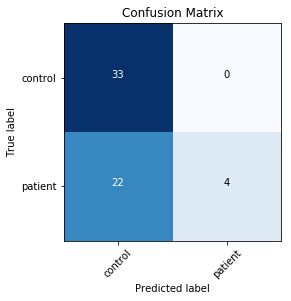

###### Starting inner fold 2
{'model': 'ModelLiu', 'batch_size': 32, 'patience': 16, 'lr': 5e-05}
Trainable model parameters: 116001
torch.Size([1, 72, 57, 75])


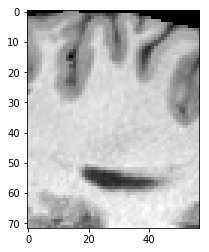

[0,     5] loss: 0.71291
Time elapsed: 0h:0m:24s
train accuracy_score: 42.44 %
train balanced_accuracy: 50.00 %
val accuracy_score: 44.07 %
val balanced_accuracy: 50.00 %
Val loss: 0.699719
[1,     5] loss: 0.69778
Time elapsed: 0h:1m:9s
train accuracy_score: 42.44 %
train balanced_accuracy: 49.35 %
val accuracy_score: 44.07 %
val balanced_accuracy: 50.00 %
Val loss: 0.696537
[2,     5] loss: 0.69674
Time elapsed: 0h:1m:56s
train accuracy_score: 46.64 %
train balanced_accuracy: 50.27 %
val accuracy_score: 57.63 %
val balanced_accuracy: 53.96 %
Val loss: 0.689560
[3,     5] loss: 0.68921
Time elapsed: 0h:2m:41s
train accuracy_score: 56.30 %
train balanced_accuracy: 52.68 %
val accuracy_score: 57.63 %
val balanced_accuracy: 51.92 %
Val loss: 0.689502
[4,     5] loss: 0.68280
Time elapsed: 0h:3m:27s
train accuracy_score: 56.30 %
train balanced_accuracy: 49.69 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.684944
[5,     5] loss: 0.68183
Time elapsed: 0h:4m:13s
tr

[43,     5] loss: 0.68692
Time elapsed: 0h:33m:16s
train accuracy_score: 57.14 %
train balanced_accuracy: 49.77 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.694426
[44,     5] loss: 0.69228
Time elapsed: 0h:34m:2s
train accuracy_score: 57.14 %
train balanced_accuracy: 49.64 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.687867
[45,     5] loss: 0.67605
Time elapsed: 0h:34m:48s
train accuracy_score: 56.72 %
train balanced_accuracy: 49.27 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.681863
[46,     5] loss: 0.68477
Time elapsed: 0h:35m:34s
train accuracy_score: 57.14 %
train balanced_accuracy: 49.64 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.673697
[47,     5] loss: 0.66624
Time elapsed: 0h:36m:20s
train accuracy_score: 57.98 %
train balanced_accuracy: 50.50 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.687858
[48,     5] loss: 0.68533
Time elapsed: 0

[86,     5] loss: 0.68133
Time elapsed: 1h:6m:6s
train accuracy_score: 54.62 %
train balanced_accuracy: 47.58 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.690734
[87,     5] loss: 0.69542
Time elapsed: 1h:6m:52s
train accuracy_score: 58.40 %
train balanced_accuracy: 51.38 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.690694
[88,     5] loss: 0.68306
Time elapsed: 1h:7m:38s
train accuracy_score: 57.14 %
train balanced_accuracy: 49.64 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.690231
[89,     5] loss: 0.68324
Time elapsed: 1h:8m:24s
train accuracy_score: 57.56 %
train balanced_accuracy: 50.00 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.691871
[90,     5] loss: 0.68288
Time elapsed: 1h:9m:10s
train accuracy_score: 57.56 %
train balanced_accuracy: 50.00 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.681779
[91,     5] loss: 0.68371
Time elapsed: 1h:9m:

val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.684559
[129,     5] loss: 0.68606
Time elapsed: 1h:38m:49s
train accuracy_score: 57.14 %
train balanced_accuracy: 49.77 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.678814
[130,     5] loss: 0.69047
Time elapsed: 1h:39m:34s
train accuracy_score: 57.56 %
train balanced_accuracy: 50.26 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.692672
[131,     5] loss: 0.68120
Time elapsed: 1h:40m:20s
train accuracy_score: 57.56 %
train balanced_accuracy: 50.00 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.689106
[132,     5] loss: 0.68160
Time elapsed: 1h:41m:5s
train accuracy_score: 57.14 %
train balanced_accuracy: 49.77 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.681643
[133,     5] loss: 0.67916
Time elapsed: 1h:41m:52s
train accuracy_score: 57.56 %
train balanced_accuracy: 50.13 %
val accuracy_score: 55.93 %
val bala

val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.682469
[172,     5] loss: 0.67268
Time elapsed: 2h:11m:25s
train accuracy_score: 57.14 %
train balanced_accuracy: 49.64 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.685271
[173,     5] loss: 0.67899
Time elapsed: 2h:12m:11s
train accuracy_score: 56.72 %
train balanced_accuracy: 49.53 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.679159
[174,     5] loss: 0.68816
Time elapsed: 2h:12m:57s
train accuracy_score: 58.82 %
train balanced_accuracy: 52.14 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.677544
[175,     5] loss: 0.68040
Time elapsed: 2h:13m:42s
train accuracy_score: 55.88 %
train balanced_accuracy: 49.19 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.682316
[176,     5] loss: 0.67969
Time elapsed: 2h:14m:27s
train accuracy_score: 56.30 %
train balanced_accuracy: 49.30 %
val accuracy_score: 55.93 %
val bal

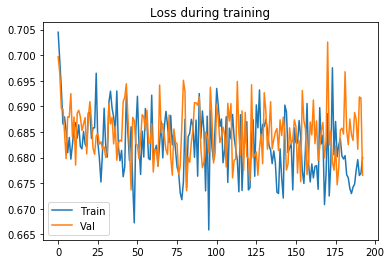

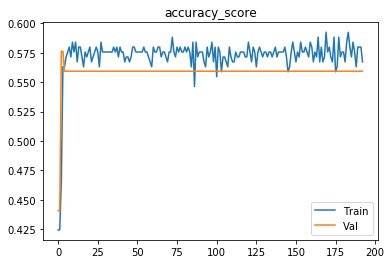

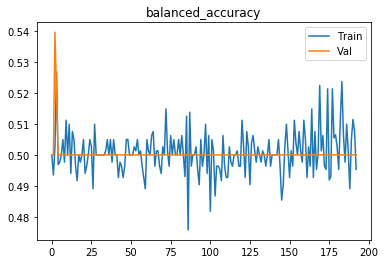

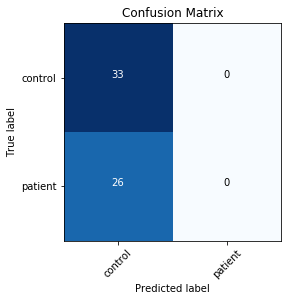

###### Starting inner fold 3
{'model': 'ModelLiu', 'batch_size': 16, 'patience': 12, 'lr': 5e-05}
Trainable model parameters: 116001
torch.Size([1, 72, 57, 75])


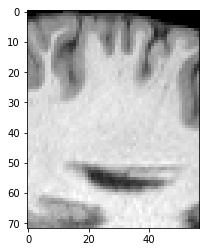

[0,     5] loss: 0.69224
[0,    10] loss: 0.68757
Time elapsed: 0h:0m:23s
train accuracy_score: 57.56 %
train balanced_accuracy: 50.00 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.685423
[1,     5] loss: 0.68891
[1,    10] loss: 0.66572
Time elapsed: 0h:1m:8s
train accuracy_score: 57.56 %
train balanced_accuracy: 50.00 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.684607
[2,     5] loss: 0.67837
[2,    10] loss: 0.68184
Time elapsed: 0h:1m:54s
train accuracy_score: 57.56 %
train balanced_accuracy: 50.00 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.683806
[3,     5] loss: 0.67185
[3,    10] loss: 0.68108
Time elapsed: 0h:2m:39s
train accuracy_score: 57.56 %
train balanced_accuracy: 50.00 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.683600
[4,     5] loss: 0.68839
[4,    10] loss: 0.67055
Time elapsed: 0h:3m:24s
train accuracy_score: 57.56 %
train balanced_accuracy: 50.00 %
val 

[38,     5] loss: 0.68031
[38,    10] loss: 0.68048
Time elapsed: 0h:28m:59s
train accuracy_score: 57.56 %
train balanced_accuracy: 50.00 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.688045
[39,     5] loss: 0.67588
[39,    10] loss: 0.68594
Time elapsed: 0h:29m:45s
train accuracy_score: 57.56 %
train balanced_accuracy: 50.00 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.682757
[40,     5] loss: 0.68965
[40,    10] loss: 0.66778
Time elapsed: 0h:30m:30s
train accuracy_score: 57.56 %
train balanced_accuracy: 50.00 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.688428
[41,     5] loss: 0.68165
[41,    10] loss: 0.69301
Time elapsed: 0h:31m:16s
train accuracy_score: 57.56 %
train balanced_accuracy: 50.00 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.682296
[42,     5] loss: 0.67894
[42,    10] loss: 0.69482
Time elapsed: 0h:32m:2s
train accuracy_score: 57.56 %
train balanced_accurac

val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.682929
[76,     5] loss: 0.68471
[76,    10] loss: 0.66324
Time elapsed: 0h:57m:37s
train accuracy_score: 57.56 %
train balanced_accuracy: 50.00 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.688484
[77,     5] loss: 0.69492
[77,    10] loss: 0.67163
Time elapsed: 0h:58m:22s
train accuracy_score: 57.56 %
train balanced_accuracy: 50.00 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.678006
[78,     5] loss: 0.64094
[78,    10] loss: 0.69953
Time elapsed: 0h:59m:7s
train accuracy_score: 57.56 %
train balanced_accuracy: 50.00 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.686136
[79,     5] loss: 0.67951
[79,    10] loss: 0.67548
Time elapsed: 0h:59m:52s
train accuracy_score: 57.56 %
train balanced_accuracy: 50.00 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.683727
[80,     5] loss: 0.66942
[80,    10] loss: 0.68156

Time elapsed: 1h:25m:34s
train accuracy_score: 57.56 %
train balanced_accuracy: 50.00 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.682152
[114,     5] loss: 0.68652
[114,    10] loss: 0.66617
Time elapsed: 1h:26m:20s
train accuracy_score: 57.56 %
train balanced_accuracy: 50.00 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.671334
[115,     5] loss: 0.68640
[115,    10] loss: 0.68907
Time elapsed: 1h:27m:7s
train accuracy_score: 57.56 %
train balanced_accuracy: 50.00 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.683195
[116,     5] loss: 0.68668
[116,    10] loss: 0.66276
Time elapsed: 1h:27m:53s
train accuracy_score: 57.98 %
train balanced_accuracy: 50.50 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.682021
[117,     5] loss: 0.64953
[117,    10] loss: 0.68434
Time elapsed: 1h:28m:39s
train accuracy_score: 57.56 %
train balanced_accuracy: 50.00 %
val accuracy_score: 55.93 %
val b

val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.692568
[151,     5] loss: 0.67662
[151,    10] loss: 0.67816
Time elapsed: 1h:54m:24s
train accuracy_score: 57.56 %
train balanced_accuracy: 50.00 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.674283
[152,     5] loss: 0.68553
[152,    10] loss: 0.69221
Time elapsed: 1h:55m:10s
train accuracy_score: 57.98 %
train balanced_accuracy: 50.50 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.682576
[153,     5] loss: 0.68013
[153,    10] loss: 0.70038
Time elapsed: 1h:55m:55s
train accuracy_score: 57.98 %
train balanced_accuracy: 50.50 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.678002
[154,     5] loss: 0.69701
[154,    10] loss: 0.67139
Time elapsed: 1h:56m:41s
train accuracy_score: 58.40 %
train balanced_accuracy: 51.12 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.684354
[155,     5] loss: 0.66505
[155,    10] lo

[188,     5] loss: 0.65900
[188,    10] loss: 0.70106
Time elapsed: 2h:22m:8s
train accuracy_score: 59.66 %
train balanced_accuracy: 53.00 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.668440
[189,     5] loss: 0.69671
[189,    10] loss: 0.69823
Time elapsed: 2h:22m:53s
train accuracy_score: 56.30 %
train balanced_accuracy: 50.08 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.678307
[190,     5] loss: 0.68434
[190,    10] loss: 0.66956
Time elapsed: 2h:23m:38s
train accuracy_score: 57.56 %
train balanced_accuracy: 50.39 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.679077
[191,     5] loss: 0.70076
[191,    10] loss: 0.68005
Time elapsed: 2h:24m:22s
train accuracy_score: 56.30 %
train balanced_accuracy: 49.69 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.684570
Early stopping in epoch 192
Total time elapsed: 2h:24m:44s
Writing model to disk...
Best result during training: 0.50. Sa

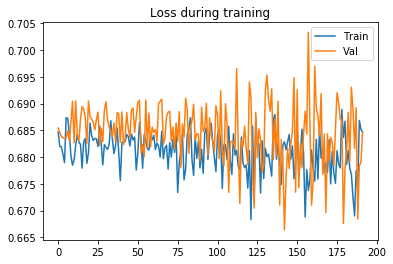

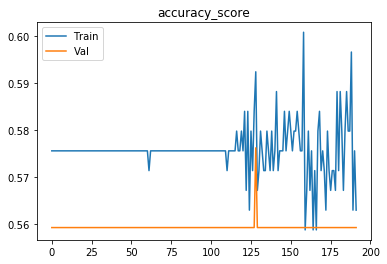

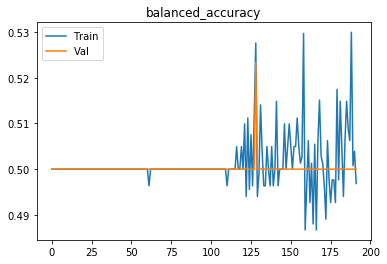

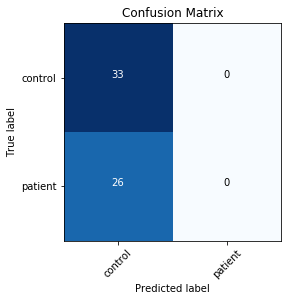

###### Starting inner fold 4
{'model': 'ModelLiu', 'batch_size': 32, 'patience': 16, 'lr': 0.0001}
Trainable model parameters: 116001
torch.Size([1, 72, 57, 75])


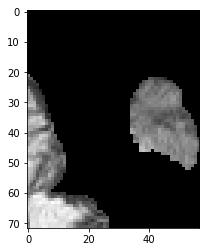

[0,     5] loss: 0.68279
Time elapsed: 0h:0m:23s
train accuracy_score: 57.56 %
train balanced_accuracy: 50.00 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.687854
[1,     5] loss: 0.68066
Time elapsed: 0h:1m:8s
train accuracy_score: 57.56 %
train balanced_accuracy: 50.00 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.680833
[2,     5] loss: 0.68635
Time elapsed: 0h:1m:53s
train accuracy_score: 57.56 %
train balanced_accuracy: 50.00 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.682394
[3,     5] loss: 0.68022
Time elapsed: 0h:2m:37s
train accuracy_score: 57.56 %
train balanced_accuracy: 50.00 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.683079
[4,     5] loss: 0.67474
Time elapsed: 0h:3m:23s
train accuracy_score: 57.56 %
train balanced_accuracy: 50.00 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.683785
[5,     5] loss: 0.67613
Time elapsed: 0h:4m:8s
tra

[43,     5] loss: 0.68255
Time elapsed: 0h:33m:7s
train accuracy_score: 57.56 %
train balanced_accuracy: 50.00 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.680685
[44,     5] loss: 0.67809
Time elapsed: 0h:33m:54s
train accuracy_score: 57.56 %
train balanced_accuracy: 50.00 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.690629
[45,     5] loss: 0.69068
Time elapsed: 0h:34m:40s
train accuracy_score: 57.56 %
train balanced_accuracy: 50.00 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.682728
[46,     5] loss: 0.67651
Time elapsed: 0h:35m:26s
train accuracy_score: 57.56 %
train balanced_accuracy: 50.00 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.694042
[47,     5] loss: 0.68057
Time elapsed: 0h:36m:13s
train accuracy_score: 57.56 %
train balanced_accuracy: 50.00 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.673880
[48,     5] loss: 0.68606
Time elapsed: 0

[86,     5] loss: 0.68073
Time elapsed: 1h:5m:55s
train accuracy_score: 56.30 %
train balanced_accuracy: 50.34 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.682436
[87,     5] loss: 0.67235
Time elapsed: 1h:6m:41s
train accuracy_score: 57.56 %
train balanced_accuracy: 51.30 %
val accuracy_score: 54.24 %
val balanced_accuracy: 48.48 %
Val loss: 0.696030
[88,     5] loss: 0.68833
Time elapsed: 1h:7m:27s
train accuracy_score: 57.56 %
train balanced_accuracy: 51.30 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.663881
[89,     5] loss: 0.67453
Time elapsed: 1h:8m:13s
train accuracy_score: 57.98 %
train balanced_accuracy: 51.41 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.669691
[90,     5] loss: 0.66182
Time elapsed: 1h:8m:59s
train accuracy_score: 57.14 %
train balanced_accuracy: 50.81 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.675583
[91,     5] loss: 0.67430
Time elapsed: 1h:9m

val accuracy_score: 44.07 %
val balanced_accuracy: 40.21 %
Val loss: 0.704814
[129,     5] loss: 0.65964
Time elapsed: 1h:38m:48s
train accuracy_score: 61.76 %
train balanced_accuracy: 56.51 %
val accuracy_score: 59.32 %
val balanced_accuracy: 55.07 %
Val loss: 0.684358
[130,     5] loss: 0.68471
Time elapsed: 1h:39m:34s
train accuracy_score: 54.62 %
train balanced_accuracy: 52.00 %
val accuracy_score: 61.02 %
val balanced_accuracy: 56.59 %
Val loss: 0.646347
[131,     5] loss: 0.65054
Time elapsed: 1h:40m:20s
train accuracy_score: 62.61 %
train balanced_accuracy: 56.46 %
val accuracy_score: 54.24 %
val balanced_accuracy: 48.48 %
Val loss: 0.690799
[132,     5] loss: 0.66824
Time elapsed: 1h:41m:6s
train accuracy_score: 58.40 %
train balanced_accuracy: 54.11 %
val accuracy_score: 57.63 %
val balanced_accuracy: 56.41 %
Val loss: 0.688146
[133,     5] loss: 0.65889
Time elapsed: 1h:41m:52s
train accuracy_score: 61.76 %
train balanced_accuracy: 58.72 %
val accuracy_score: 59.32 %
val bala

val accuracy_score: 55.93 %
val balanced_accuracy: 52.04 %
Val loss: 0.649311
[172,     5] loss: 0.65970
Time elapsed: 2h:11m:37s
train accuracy_score: 61.34 %
train balanced_accuracy: 57.19 %
val accuracy_score: 61.02 %
val balanced_accuracy: 55.77 %
Val loss: 0.665728
[173,     5] loss: 0.68023
Time elapsed: 2h:12m:22s
train accuracy_score: 57.98 %
train balanced_accuracy: 52.06 %
val accuracy_score: 54.24 %
val balanced_accuracy: 50.52 %
Val loss: 0.680428
[174,     5] loss: 0.66284
Time elapsed: 2h:13m:8s
train accuracy_score: 65.55 %
train balanced_accuracy: 62.01 %
val accuracy_score: 67.80 %
val balanced_accuracy: 64.69 %
Val loss: 0.657868
[175,     5] loss: 0.67006
Time elapsed: 2h:13m:53s
train accuracy_score: 60.08 %
train balanced_accuracy: 56.74 %
val accuracy_score: 66.10 %
val balanced_accuracy: 63.17 %
Val loss: 0.632794
[176,     5] loss: 0.66479
Time elapsed: 2h:14m:39s
train accuracy_score: 61.76 %
train balanced_accuracy: 56.77 %
val accuracy_score: 49.15 %
val bala

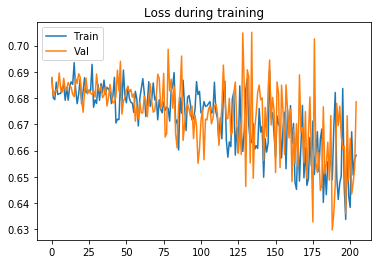

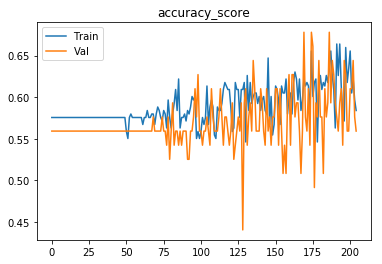

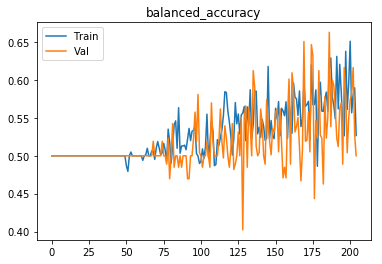

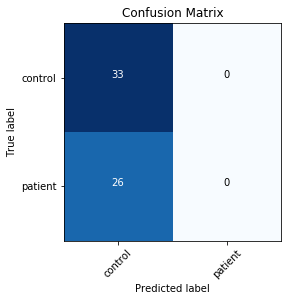

Finished outer fold.
{'final_acc': 0.5, 'best_acc': 0.6631701631701632, 'final_iter': 205, 'best_iter': 187, 'params': {'model': 'ModelLiu', 'batch_size': 32, 'patience': 16, 'lr': 0.0001}, 'inner_fold_idx': 4}
###### Starting outer fold 3
238
59
Shuffled the data..
###### Starting inner fold 0
{'model': 'ModelLiu', 'batch_size': 16, 'patience': 12, 'lr': 0.0001}
Trainable model parameters: 116001
torch.Size([1, 72, 57, 75])


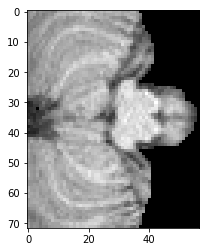

[0,     5] loss: 0.69724
[0,    10] loss: 0.69179
Time elapsed: 0h:0m:23s
train accuracy_score: 47.06 %
train balanced_accuracy: 50.03 %
val accuracy_score: 47.46 %
val balanced_accuracy: 49.83 %
Val loss: 0.695007
[1,     5] loss: 0.69252
[1,    10] loss: 0.70048
Time elapsed: 0h:1m:9s
train accuracy_score: 53.78 %
train balanced_accuracy: 48.52 %
val accuracy_score: 47.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.698791
[2,     5] loss: 0.67997
[2,    10] loss: 0.69937
Time elapsed: 0h:1m:54s
train accuracy_score: 55.88 %
train balanced_accuracy: 50.10 %
val accuracy_score: 47.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.705770
[3,     5] loss: 0.68196
[3,    10] loss: 0.69856
Time elapsed: 0h:2m:39s
train accuracy_score: 55.88 %
train balanced_accuracy: 50.00 %
val accuracy_score: 47.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.699935
[4,     5] loss: 0.69916
[4,    10] loss: 0.68466
Time elapsed: 0h:3m:24s
train accuracy_score: 55.46 %
train balanced_accuracy: 49.62 %
val 

[38,     5] loss: 0.68461
[38,    10] loss: 0.69431
Time elapsed: 0h:29m:6s
train accuracy_score: 57.56 %
train balanced_accuracy: 51.90 %
val accuracy_score: 47.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.704119
[39,     5] loss: 0.68128
[39,    10] loss: 0.69678
Time elapsed: 0h:29m:51s
train accuracy_score: 55.88 %
train balanced_accuracy: 50.10 %
val accuracy_score: 47.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.706777
[40,     5] loss: 0.69148
[40,    10] loss: 0.69163
Time elapsed: 0h:30m:38s
train accuracy_score: 55.46 %
train balanced_accuracy: 49.82 %
val accuracy_score: 47.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.700626
[41,     5] loss: 0.68177
[41,    10] loss: 0.68028
Time elapsed: 0h:31m:23s
train accuracy_score: 55.04 %
train balanced_accuracy: 49.25 %
val accuracy_score: 47.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.708450
[42,     5] loss: 0.70377
[42,    10] loss: 0.68328
Time elapsed: 0h:32m:8s
train accuracy_score: 55.46 %
train balanced_accuracy

val accuracy_score: 47.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.709656
[76,     5] loss: 0.65068
[76,    10] loss: 0.72108
Time elapsed: 0h:57m:59s
train accuracy_score: 55.88 %
train balanced_accuracy: 50.10 %
val accuracy_score: 47.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.705664
[77,     5] loss: 0.69236
[77,    10] loss: 0.68041
Time elapsed: 0h:58m:45s
train accuracy_score: 56.72 %
train balanced_accuracy: 50.95 %
val accuracy_score: 47.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.694483
[78,     5] loss: 0.67174
[78,    10] loss: 0.69035
Time elapsed: 0h:59m:30s
train accuracy_score: 55.88 %
train balanced_accuracy: 50.10 %
val accuracy_score: 47.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.701700
[79,     5] loss: 0.67973
[79,    10] loss: 0.69595
Time elapsed: 1h:0m:15s
train accuracy_score: 57.56 %
train balanced_accuracy: 52.01 %
val accuracy_score: 47.46 %
val balanced_accuracy: 49.83 %
Val loss: 0.691208
[80,     5] loss: 0.69005
[80,    10] loss: 0.68878

Time elapsed: 1h:25m:46s
train accuracy_score: 53.78 %
train balanced_accuracy: 49.02 %
val accuracy_score: 57.63 %
val balanced_accuracy: 59.68 %
Val loss: 0.680629
[114,     5] loss: 0.67522
[114,    10] loss: 0.72945
Time elapsed: 1h:26m:30s
train accuracy_score: 54.20 %
train balanced_accuracy: 48.80 %
val accuracy_score: 49.15 %
val balanced_accuracy: 51.61 %
Val loss: 0.697320
[115,     5] loss: 0.68015
[115,    10] loss: 0.69914
Time elapsed: 1h:27m:15s
train accuracy_score: 53.78 %
train balanced_accuracy: 48.22 %
val accuracy_score: 47.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.691847
[116,     5] loss: 0.66924
[116,    10] loss: 0.69971
Time elapsed: 1h:28m:0s
train accuracy_score: 55.04 %
train balanced_accuracy: 49.45 %
val accuracy_score: 47.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.703030
[117,     5] loss: 0.67111
[117,    10] loss: 0.69862
Time elapsed: 1h:28m:44s
train accuracy_score: 58.82 %
train balanced_accuracy: 53.83 %
val accuracy_score: 54.24 %
val b

val accuracy_score: 49.15 %
val balanced_accuracy: 50.75 %
Val loss: 0.696216
[151,     5] loss: 0.68901
[151,    10] loss: 0.68655
Time elapsed: 1h:53m:58s
train accuracy_score: 52.10 %
train balanced_accuracy: 48.82 %
val accuracy_score: 49.15 %
val balanced_accuracy: 50.58 %
Val loss: 0.699565
[152,     5] loss: 0.67227
[152,    10] loss: 0.65196
Time elapsed: 1h:54m:42s
train accuracy_score: 55.46 %
train balanced_accuracy: 52.03 %
val accuracy_score: 47.46 %
val balanced_accuracy: 49.65 %
Val loss: 0.681104
[153,     5] loss: 0.67108
[153,    10] loss: 0.68606
Time elapsed: 1h:55m:27s
train accuracy_score: 55.04 %
train balanced_accuracy: 52.76 %
val accuracy_score: 50.85 %
val balanced_accuracy: 51.15 %
Val loss: 0.688895
[154,     5] loss: 0.66061
[154,    10] loss: 0.67860
Time elapsed: 1h:56m:11s
train accuracy_score: 60.92 %
train balanced_accuracy: 57.52 %
val accuracy_score: 55.93 %
val balanced_accuracy: 58.06 %
Val loss: 0.687029
[155,     5] loss: 0.69441
[155,    10] lo

[188,     5] loss: 0.68899
[188,    10] loss: 0.66763
Time elapsed: 2h:21m:27s
train accuracy_score: 55.04 %
train balanced_accuracy: 53.06 %
val accuracy_score: 67.80 %
val balanced_accuracy: 67.11 %
Val loss: 0.657878
[189,     5] loss: 0.66357
[189,    10] loss: 0.68916
Time elapsed: 2h:22m:13s
train accuracy_score: 56.72 %
train balanced_accuracy: 53.46 %
val accuracy_score: 47.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.720160
Early stopping in epoch 190
Total time elapsed: 2h:22m:34s
Writing model to disk...
Best result during training: 0.72. Saving model..
190
[0.49827188940092165, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.49827188

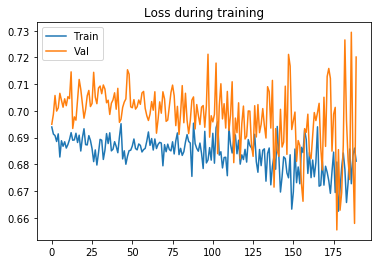

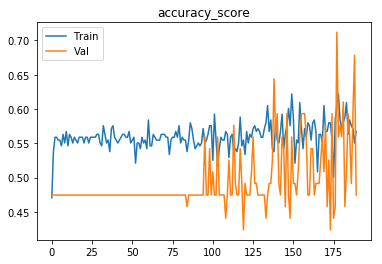

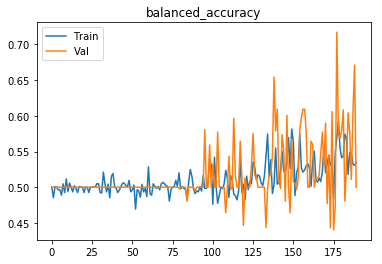

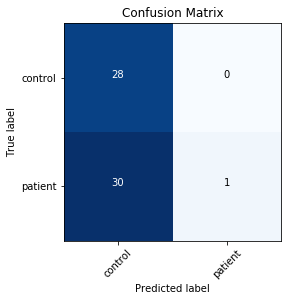

###### Starting inner fold 1
{'model': 'ModelLiu', 'batch_size': 16, 'patience': 16, 'lr': 0.0001}
Trainable model parameters: 116001
torch.Size([1, 72, 57, 75])


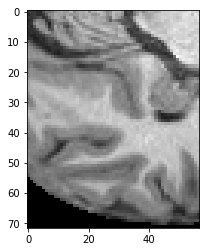

[0,     5] loss: 0.69535
[0,    10] loss: 0.69242
Time elapsed: 0h:0m:22s
train accuracy_score: 50.84 %
train balanced_accuracy: 49.80 %
val accuracy_score: 47.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.694824
[1,     5] loss: 0.68940
[1,    10] loss: 0.68146
Time elapsed: 0h:1m:8s
train accuracy_score: 56.72 %
train balanced_accuracy: 51.25 %
val accuracy_score: 47.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.700130
[2,     5] loss: 0.67860
[2,    10] loss: 0.68642
Time elapsed: 0h:1m:53s
train accuracy_score: 55.46 %
train balanced_accuracy: 49.62 %
val accuracy_score: 47.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.707807
[3,     5] loss: 0.68286
[3,    10] loss: 0.70740
Time elapsed: 0h:2m:37s
train accuracy_score: 55.88 %
train balanced_accuracy: 50.00 %
val accuracy_score: 47.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.696210
[4,     5] loss: 0.69131
[4,    10] loss: 0.68776
Time elapsed: 0h:3m:22s
train accuracy_score: 55.04 %
train balanced_accuracy: 49.25 %
val 

[38,     5] loss: 0.68167
[38,    10] loss: 0.67337
Time elapsed: 0h:28m:52s
train accuracy_score: 55.88 %
train balanced_accuracy: 50.00 %
val accuracy_score: 47.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.701656
[39,     5] loss: 0.69457
[39,    10] loss: 0.66313
Time elapsed: 0h:29m:37s
train accuracy_score: 60.92 %
train balanced_accuracy: 55.71 %
val accuracy_score: 47.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.705206
[40,     5] loss: 0.66595
[40,    10] loss: 0.72011
Time elapsed: 0h:30m:22s
train accuracy_score: 56.72 %
train balanced_accuracy: 51.15 %
val accuracy_score: 47.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.706257
[41,     5] loss: 0.66666
[41,    10] loss: 0.69809
Time elapsed: 0h:31m:7s
train accuracy_score: 55.88 %
train balanced_accuracy: 50.30 %
val accuracy_score: 47.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.700364
[42,     5] loss: 0.67832
[42,    10] loss: 0.68278
Time elapsed: 0h:31m:53s
train accuracy_score: 54.62 %
train balanced_accurac

val accuracy_score: 50.85 %
val balanced_accuracy: 52.53 %
Val loss: 0.699663
[76,     5] loss: 0.68071
[76,    10] loss: 0.67702
Time elapsed: 0h:57m:15s
train accuracy_score: 54.20 %
train balanced_accuracy: 51.00 %
val accuracy_score: 57.63 %
val balanced_accuracy: 58.99 %
Val loss: 0.679330
[77,     5] loss: 0.70268
[77,    10] loss: 0.67165
Time elapsed: 0h:58m:1s
train accuracy_score: 55.88 %
train balanced_accuracy: 53.01 %
val accuracy_score: 59.32 %
val balanced_accuracy: 60.94 %
Val loss: 0.684422
[78,     5] loss: 0.67422
[78,    10] loss: 0.68125
Time elapsed: 0h:58m:47s
train accuracy_score: 61.34 %
train balanced_accuracy: 56.89 %
val accuracy_score: 50.85 %
val balanced_accuracy: 53.23 %
Val loss: 0.702393
[79,     5] loss: 0.66765
[79,    10] loss: 0.66683
Time elapsed: 0h:59m:31s
train accuracy_score: 58.40 %
train balanced_accuracy: 53.76 %
val accuracy_score: 50.85 %
val balanced_accuracy: 53.23 %
Val loss: 0.686022
[80,     5] loss: 0.67534
[80,    10] loss: 0.71280

Time elapsed: 1h:24m:54s
train accuracy_score: 59.24 %
train balanced_accuracy: 54.91 %
val accuracy_score: 54.24 %
val balanced_accuracy: 56.28 %
Val loss: 0.694299
[114,     5] loss: 0.69171
[114,    10] loss: 0.65068
Time elapsed: 1h:25m:38s
train accuracy_score: 59.66 %
train balanced_accuracy: 57.19 %
val accuracy_score: 55.93 %
val balanced_accuracy: 57.55 %
Val loss: 0.693850
[115,     5] loss: 0.67206
[115,    10] loss: 0.68074
Time elapsed: 1h:26m:23s
train accuracy_score: 56.72 %
train balanced_accuracy: 53.06 %
val accuracy_score: 52.54 %
val balanced_accuracy: 54.32 %
Val loss: 0.684931
[116,     5] loss: 0.65953
[116,    10] loss: 0.67975
Time elapsed: 1h:27m:8s
train accuracy_score: 57.14 %
train balanced_accuracy: 54.14 %
val accuracy_score: 50.85 %
val balanced_accuracy: 51.50 %
Val loss: 0.690028
[117,     5] loss: 0.63567
[117,    10] loss: 0.66156
Time elapsed: 1h:27m:52s
train accuracy_score: 60.08 %
train balanced_accuracy: 57.27 %
val accuracy_score: 47.46 %
val b

val accuracy_score: 69.49 %
val balanced_accuracy: 70.28 %
Val loss: 0.653679
[151,     5] loss: 0.64505
[151,    10] loss: 0.71150
Time elapsed: 1h:53m:10s
train accuracy_score: 56.30 %
train balanced_accuracy: 51.88 %
val accuracy_score: 54.24 %
val balanced_accuracy: 55.07 %
Val loss: 0.665327
[152,     5] loss: 0.66940
[152,    10] loss: 0.67292
Time elapsed: 1h:53m:54s
train accuracy_score: 60.08 %
train balanced_accuracy: 59.77 %
val accuracy_score: 64.41 %
val balanced_accuracy: 65.61 %
Val loss: 0.670207
[153,     5] loss: 0.63874
[153,    10] loss: 0.69292
Time elapsed: 1h:54m:39s
train accuracy_score: 58.82 %
train balanced_accuracy: 53.93 %
val accuracy_score: 74.58 %
val balanced_accuracy: 75.29 %
Val loss: 0.636509
[154,     5] loss: 0.68396
[154,    10] loss: 0.68298
Time elapsed: 1h:55m:24s
train accuracy_score: 57.56 %
train balanced_accuracy: 57.62 %
val accuracy_score: 62.71 %
val balanced_accuracy: 62.96 %
Val loss: 0.655402
[155,     5] loss: 0.67214
[155,    10] lo

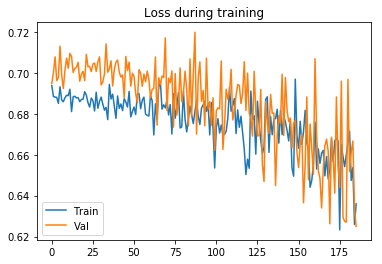

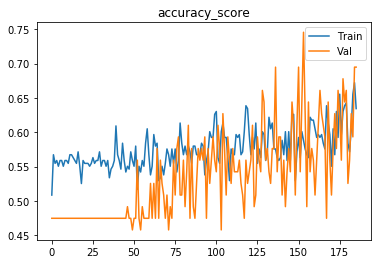

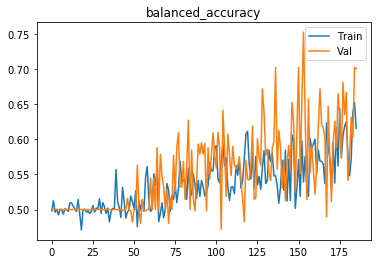

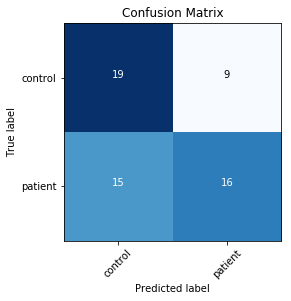

###### Starting inner fold 2
{'model': 'ModelLiu', 'batch_size': 16, 'patience': 12, 'lr': 5e-05}
Trainable model parameters: 116001
torch.Size([1, 72, 57, 75])


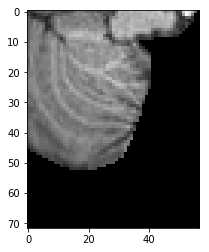

[0,     5] loss: 0.68960
[0,    10] loss: 0.69188
Time elapsed: 0h:0m:23s
train accuracy_score: 50.00 %
train balanced_accuracy: 47.74 %
val accuracy_score: 47.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.693337
[1,     5] loss: 0.68729
[1,    10] loss: 0.69826
Time elapsed: 0h:1m:7s
train accuracy_score: 55.88 %
train balanced_accuracy: 51.40 %
val accuracy_score: 47.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.695441
[2,     5] loss: 0.69174
[2,    10] loss: 0.68941
Time elapsed: 0h:1m:52s
train accuracy_score: 56.30 %
train balanced_accuracy: 51.18 %
val accuracy_score: 47.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.694585
[3,     5] loss: 0.69540
[3,    10] loss: 0.68598
Time elapsed: 0h:2m:37s
train accuracy_score: 55.88 %
train balanced_accuracy: 50.10 %
val accuracy_score: 47.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.698378
[4,     5] loss: 0.69187
[4,    10] loss: 0.69675
Time elapsed: 0h:3m:21s
train accuracy_score: 55.88 %
train balanced_accuracy: 50.00 %
val 

[38,     5] loss: 0.67067
[38,    10] loss: 0.69504
Time elapsed: 0h:28m:38s
train accuracy_score: 55.88 %
train balanced_accuracy: 50.00 %
val accuracy_score: 47.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.710227
[39,     5] loss: 0.67890
[39,    10] loss: 0.67957
Time elapsed: 0h:29m:22s
train accuracy_score: 55.88 %
train balanced_accuracy: 50.00 %
val accuracy_score: 47.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.704161
[40,     5] loss: 0.68727
[40,    10] loss: 0.68211
Time elapsed: 0h:30m:7s
train accuracy_score: 55.88 %
train balanced_accuracy: 50.00 %
val accuracy_score: 47.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.700787
[41,     5] loss: 0.68287
[41,    10] loss: 0.68146
Time elapsed: 0h:30m:51s
train accuracy_score: 55.88 %
train balanced_accuracy: 50.00 %
val accuracy_score: 47.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.700963
[42,     5] loss: 0.70943
[42,    10] loss: 0.66399
Time elapsed: 0h:31m:36s
train accuracy_score: 55.88 %
train balanced_accurac

val accuracy_score: 47.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.692712
[76,     5] loss: 0.68167
[76,    10] loss: 0.69360
Time elapsed: 0h:56m:39s
train accuracy_score: 55.88 %
train balanced_accuracy: 50.00 %
val accuracy_score: 47.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.695439
[77,     5] loss: 0.66937
[77,    10] loss: 0.68411
Time elapsed: 0h:57m:22s
train accuracy_score: 56.30 %
train balanced_accuracy: 50.48 %
val accuracy_score: 47.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.700284
[78,     5] loss: 0.68360
[78,    10] loss: 0.70428
Time elapsed: 0h:58m:6s
train accuracy_score: 55.88 %
train balanced_accuracy: 50.10 %
val accuracy_score: 47.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.703098
[79,     5] loss: 0.67981
[79,    10] loss: 0.69711
Time elapsed: 0h:58m:50s
train accuracy_score: 56.30 %
train balanced_accuracy: 50.78 %
val accuracy_score: 47.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.707516
[80,     5] loss: 0.68050
[80,    10] loss: 0.68314

Time elapsed: 1h:23m:33s
train accuracy_score: 54.20 %
train balanced_accuracy: 49.90 %
val accuracy_score: 49.15 %
val balanced_accuracy: 51.61 %
Val loss: 0.693809
[114,     5] loss: 0.67668
[114,    10] loss: 0.67778
Time elapsed: 1h:24m:19s
train accuracy_score: 55.88 %
train balanced_accuracy: 51.90 %
val accuracy_score: 47.46 %
val balanced_accuracy: 49.14 %
Val loss: 0.695849
[115,     5] loss: 0.67482
[115,    10] loss: 0.67534
Time elapsed: 1h:25m:4s
train accuracy_score: 60.50 %
train balanced_accuracy: 56.64 %
val accuracy_score: 49.15 %
val balanced_accuracy: 50.92 %
Val loss: 0.694513
[116,     5] loss: 0.68891
[116,    10] loss: 0.65587
Time elapsed: 1h:25m:47s
train accuracy_score: 57.56 %
train balanced_accuracy: 53.61 %
val accuracy_score: 57.63 %
val balanced_accuracy: 59.33 %
Val loss: 0.678040
[117,     5] loss: 0.70668
[117,    10] loss: 0.67424
Time elapsed: 1h:26m:31s
train accuracy_score: 54.20 %
train balanced_accuracy: 49.70 %
val accuracy_score: 50.85 %
val b

val accuracy_score: 49.15 %
val balanced_accuracy: 51.61 %
Val loss: 0.689896
[151,     5] loss: 0.68780
[151,    10] loss: 0.69638
Time elapsed: 1h:51m:16s
train accuracy_score: 55.04 %
train balanced_accuracy: 49.75 %
val accuracy_score: 50.85 %
val balanced_accuracy: 53.23 %
Val loss: 0.689192
[152,     5] loss: 0.65896
[152,    10] loss: 0.66787
Time elapsed: 1h:51m:58s
train accuracy_score: 55.88 %
train balanced_accuracy: 50.50 %
val accuracy_score: 47.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.696516
[153,     5] loss: 0.67958
[153,    10] loss: 0.69499
Time elapsed: 1h:52m:42s
train accuracy_score: 57.98 %
train balanced_accuracy: 52.68 %
val accuracy_score: 54.24 %
val balanced_accuracy: 56.28 %
Val loss: 0.686452
[154,     5] loss: 0.69795
[154,    10] loss: 0.69259
Time elapsed: 1h:53m:26s
train accuracy_score: 52.94 %
train balanced_accuracy: 48.57 %
val accuracy_score: 52.54 %
val balanced_accuracy: 54.49 %
Val loss: 0.691961
[155,     5] loss: 0.69584
[155,    10] lo

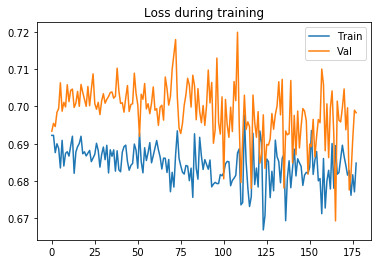

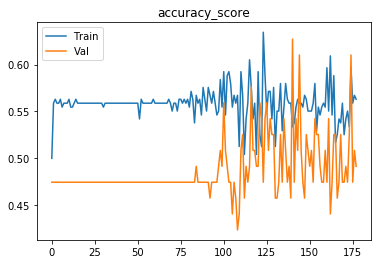

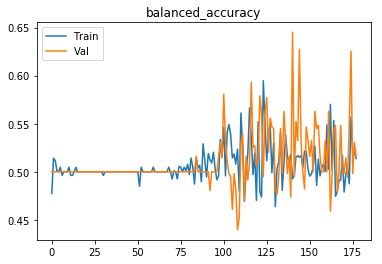

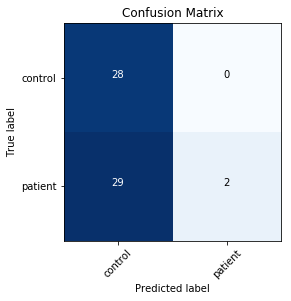

###### Starting inner fold 3
{'model': 'ModelLiu', 'batch_size': 16, 'patience': 16, 'lr': 0.0001}
Trainable model parameters: 116001
torch.Size([1, 72, 57, 75])


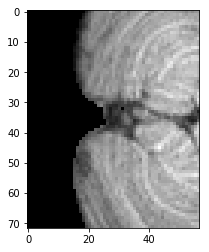

[0,     5] loss: 0.70319
[0,    10] loss: 0.69983
Time elapsed: 0h:0m:23s
train accuracy_score: 43.70 %
train balanced_accuracy: 46.32 %
val accuracy_score: 47.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.695314
[1,     5] loss: 0.67999
[1,    10] loss: 0.69196
Time elapsed: 0h:1m:8s
train accuracy_score: 56.30 %
train balanced_accuracy: 50.78 %
val accuracy_score: 47.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.713368
[2,     5] loss: 0.66713
[2,    10] loss: 0.70060
Time elapsed: 0h:1m:51s
train accuracy_score: 55.88 %
train balanced_accuracy: 50.10 %
val accuracy_score: 47.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.708876
[3,     5] loss: 0.70547
[3,    10] loss: 0.69240
Time elapsed: 0h:2m:36s
train accuracy_score: 50.00 %
train balanced_accuracy: 45.44 %
val accuracy_score: 47.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.696362
[4,     5] loss: 0.68745
[4,    10] loss: 0.68490
Time elapsed: 0h:3m:18s
train accuracy_score: 54.20 %
train balanced_accuracy: 49.20 %
val 

[38,     5] loss: 0.69081
[38,    10] loss: 0.68014
Time elapsed: 0h:28m:2s
train accuracy_score: 55.46 %
train balanced_accuracy: 49.62 %
val accuracy_score: 47.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.702557
[39,     5] loss: 0.68000
[39,    10] loss: 0.67605
Time elapsed: 0h:28m:46s
train accuracy_score: 56.72 %
train balanced_accuracy: 51.05 %
val accuracy_score: 47.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.703142
[40,     5] loss: 0.70195
[40,    10] loss: 0.67881
Time elapsed: 0h:29m:30s
train accuracy_score: 54.62 %
train balanced_accuracy: 49.27 %
val accuracy_score: 47.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.700811
[41,     5] loss: 0.68190
[41,    10] loss: 0.66510
Time elapsed: 0h:30m:15s
train accuracy_score: 55.46 %
train balanced_accuracy: 49.72 %
val accuracy_score: 47.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.710372
[42,     5] loss: 0.68611
[42,    10] loss: 0.68618
Time elapsed: 0h:30m:59s
train accuracy_score: 55.46 %
train balanced_accurac

val accuracy_score: 42.37 %
val balanced_accuracy: 44.12 %
Val loss: 0.696907
[76,     5] loss: 0.67737
[76,    10] loss: 0.66397
Time elapsed: 0h:55m:44s
train accuracy_score: 55.46 %
train balanced_accuracy: 50.23 %
val accuracy_score: 47.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.716367
[77,     5] loss: 0.70051
[77,    10] loss: 0.65850
Time elapsed: 0h:56m:26s
train accuracy_score: 55.88 %
train balanced_accuracy: 50.10 %
val accuracy_score: 47.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.706642
[78,     5] loss: 0.67214
[78,    10] loss: 0.67555
Time elapsed: 0h:57m:9s
train accuracy_score: 55.46 %
train balanced_accuracy: 49.72 %
val accuracy_score: 47.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.714495
[79,     5] loss: 0.69288
[79,    10] loss: 0.70131
Time elapsed: 0h:57m:53s
train accuracy_score: 55.04 %
train balanced_accuracy: 49.55 %
val accuracy_score: 50.85 %
val balanced_accuracy: 53.23 %
Val loss: 0.695588
[80,     5] loss: 0.69571
[80,    10] loss: 0.67483

Time elapsed: 1h:22m:39s
train accuracy_score: 55.04 %
train balanced_accuracy: 49.45 %
val accuracy_score: 47.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.706041
[114,     5] loss: 0.69715
[114,    10] loss: 0.68256
Time elapsed: 1h:23m:22s
train accuracy_score: 57.14 %
train balanced_accuracy: 52.03 %
val accuracy_score: 47.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.698584
[115,     5] loss: 0.67725
[115,    10] loss: 0.70748
Time elapsed: 1h:24m:5s
train accuracy_score: 54.20 %
train balanced_accuracy: 48.50 %
val accuracy_score: 47.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.704665
[116,     5] loss: 0.69118
[116,    10] loss: 0.68520
Time elapsed: 1h:24m:48s
train accuracy_score: 57.14 %
train balanced_accuracy: 51.83 %
val accuracy_score: 47.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.690582
[117,     5] loss: 0.69196
[117,    10] loss: 0.67473
Time elapsed: 1h:25m:31s
train accuracy_score: 55.88 %
train balanced_accuracy: 50.40 %
val accuracy_score: 47.46 %
val b

val accuracy_score: 59.32 %
val balanced_accuracy: 60.77 %
Val loss: 0.691395
[151,     5] loss: 0.66266
[151,    10] loss: 0.69186
Time elapsed: 1h:50m:15s
train accuracy_score: 60.50 %
train balanced_accuracy: 56.84 %
val accuracy_score: 49.15 %
val balanced_accuracy: 51.61 %
Val loss: 0.708650
[152,     5] loss: 0.65815
[152,    10] loss: 0.69571
Time elapsed: 1h:50m:58s
train accuracy_score: 55.88 %
train balanced_accuracy: 50.80 %
val accuracy_score: 47.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.709085
[153,     5] loss: 0.67977
[153,    10] loss: 0.67945
Time elapsed: 1h:51m:43s
train accuracy_score: 55.04 %
train balanced_accuracy: 52.96 %
val accuracy_score: 59.32 %
val balanced_accuracy: 59.91 %
Val loss: 0.680575
[154,     5] loss: 0.69262
[154,    10] loss: 0.68766
Time elapsed: 1h:52m:27s
train accuracy_score: 56.30 %
train balanced_accuracy: 52.58 %
val accuracy_score: 49.15 %
val balanced_accuracy: 51.09 %
Val loss: 0.675783
[155,     5] loss: 0.67304
[155,    10] lo

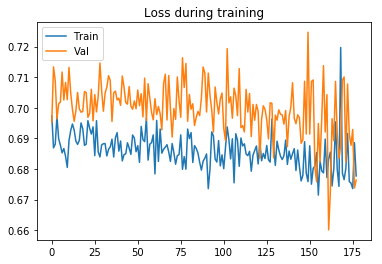

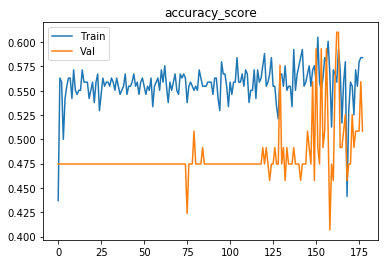

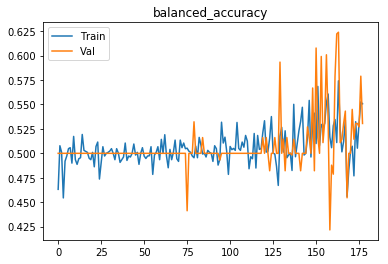

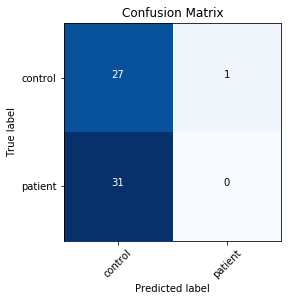

###### Starting inner fold 4
{'model': 'ModelLiu', 'batch_size': 16, 'patience': 12, 'lr': 5e-05}
Trainable model parameters: 116001
torch.Size([1, 72, 57, 75])


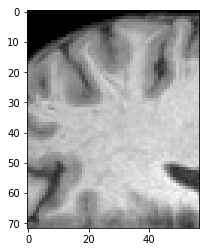

[0,     5] loss: 0.69830
[0,    10] loss: 0.69560
Time elapsed: 0h:0m:22s
train accuracy_score: 43.70 %
train balanced_accuracy: 46.32 %
val accuracy_score: 49.15 %
val balanced_accuracy: 51.27 %
Val loss: 0.693422
[1,     5] loss: 0.68945
[1,    10] loss: 0.69424
Time elapsed: 0h:1m:6s
train accuracy_score: 56.30 %
train balanced_accuracy: 52.68 %
val accuracy_score: 47.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.695174
[2,     5] loss: 0.68548
[2,    10] loss: 0.69657
Time elapsed: 0h:1m:49s
train accuracy_score: 57.14 %
train balanced_accuracy: 51.63 %
val accuracy_score: 47.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.698513
[3,     5] loss: 0.69368
[3,    10] loss: 0.67009
Time elapsed: 0h:2m:33s
train accuracy_score: 55.46 %
train balanced_accuracy: 49.62 %
val accuracy_score: 47.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.704698
[4,     5] loss: 0.68462
[4,    10] loss: 0.68154
Time elapsed: 0h:3m:17s
train accuracy_score: 55.04 %
train balanced_accuracy: 49.25 %
val 

[38,     5] loss: 0.69182
[38,    10] loss: 0.68468
Time elapsed: 0h:28m:12s
train accuracy_score: 55.88 %
train balanced_accuracy: 50.00 %
val accuracy_score: 47.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.697525
[39,     5] loss: 0.69664
[39,    10] loss: 0.69714
Time elapsed: 0h:28m:56s
train accuracy_score: 55.46 %
train balanced_accuracy: 49.72 %
val accuracy_score: 47.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.702427
[40,     5] loss: 0.67624
[40,    10] loss: 0.70220
Time elapsed: 0h:29m:40s
train accuracy_score: 55.88 %
train balanced_accuracy: 50.10 %
val accuracy_score: 47.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.700767
[41,     5] loss: 0.69062
[41,    10] loss: 0.66627
Time elapsed: 0h:30m:23s
train accuracy_score: 56.72 %
train balanced_accuracy: 51.05 %
val accuracy_score: 47.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.698675
[42,     5] loss: 0.68347
[42,    10] loss: 0.68035
Time elapsed: 0h:31m:5s
train accuracy_score: 55.04 %
train balanced_accurac

val accuracy_score: 47.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.695396
[76,     5] loss: 0.69016
[76,    10] loss: 0.68324
Time elapsed: 0h:55m:45s
train accuracy_score: 56.72 %
train balanced_accuracy: 51.05 %
val accuracy_score: 47.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.699825
[77,     5] loss: 0.68792
[77,    10] loss: 0.68238
Time elapsed: 0h:56m:28s
train accuracy_score: 55.88 %
train balanced_accuracy: 50.10 %
val accuracy_score: 47.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.706143
[78,     5] loss: 0.67151
[78,    10] loss: 0.70473
Time elapsed: 0h:57m:12s
train accuracy_score: 55.88 %
train balanced_accuracy: 50.00 %
val accuracy_score: 47.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.701120
[79,     5] loss: 0.68779
[79,    10] loss: 0.68559
Time elapsed: 0h:57m:56s
train accuracy_score: 56.72 %
train balanced_accuracy: 51.25 %
val accuracy_score: 47.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.696994
[80,     5] loss: 0.68516
[80,    10] loss: 0.6807

Time elapsed: 1h:22m:31s
train accuracy_score: 55.46 %
train balanced_accuracy: 49.62 %
val accuracy_score: 47.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.716395
[114,     5] loss: 0.70713
[114,    10] loss: 0.67301
Time elapsed: 1h:23m:15s
train accuracy_score: 56.30 %
train balanced_accuracy: 50.48 %
val accuracy_score: 47.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.705731
[115,     5] loss: 0.69522
[115,    10] loss: 0.66124
Time elapsed: 1h:23m:58s
train accuracy_score: 56.30 %
train balanced_accuracy: 50.48 %
val accuracy_score: 47.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.703339
[116,     5] loss: 0.68164
[116,    10] loss: 0.67475
Time elapsed: 1h:24m:40s
train accuracy_score: 55.88 %
train balanced_accuracy: 50.00 %
val accuracy_score: 47.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.699865
[117,     5] loss: 0.69625
[117,    10] loss: 0.68089
Time elapsed: 1h:25m:24s
train accuracy_score: 55.04 %
train balanced_accuracy: 49.25 %
val accuracy_score: 47.46 %
val 

val accuracy_score: 47.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.696872
[151,     5] loss: 0.68291
[151,    10] loss: 0.67928
Time elapsed: 1h:50m:4s
train accuracy_score: 57.56 %
train balanced_accuracy: 51.90 %
val accuracy_score: 47.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.708234
[152,     5] loss: 0.69101
[152,    10] loss: 0.68328
Time elapsed: 1h:50m:48s
train accuracy_score: 55.88 %
train balanced_accuracy: 50.30 %
val accuracy_score: 47.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.702271
[153,     5] loss: 0.68794
[153,    10] loss: 0.68881
Time elapsed: 1h:51m:32s
train accuracy_score: 55.46 %
train balanced_accuracy: 49.72 %
val accuracy_score: 47.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.713447
[154,     5] loss: 0.70382
[154,    10] loss: 0.68592
Time elapsed: 1h:52m:15s
train accuracy_score: 55.88 %
train balanced_accuracy: 50.10 %
val accuracy_score: 47.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.699678
[155,     5] loss: 0.67654
[155,    10] los

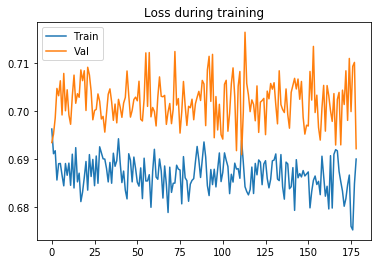

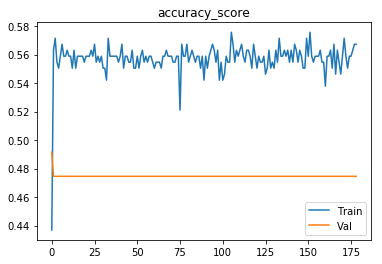

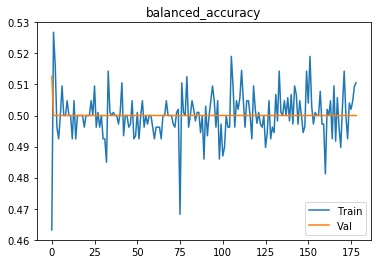

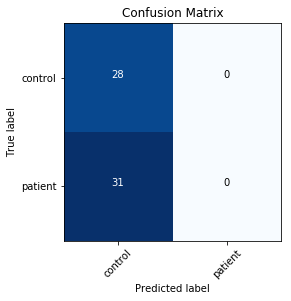

Finished outer fold.
{'final_acc': 0.70103686635944706, 'best_acc': 0.75288018433179726, 'final_iter': 186, 'best_iter': 154, 'params': {'model': 'ModelLiu', 'batch_size': 16, 'patience': 16, 'lr': 0.0001}, 'inner_fold_idx': 1}
###### Starting outer fold 4
238
59
Shuffled the data..
###### Starting inner fold 0
{'model': 'ModelLiu', 'batch_size': 12, 'patience': 12, 'lr': 5e-05}
Trainable model parameters: 116001
torch.Size([1, 72, 57, 75])


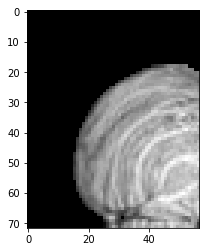

[0,     5] loss: 0.69751
[0,    10] loss: 0.69614
[0,    15] loss: 0.69218
Time elapsed: 0h:0m:21s
train accuracy_score: 46.22 %
train balanced_accuracy: 45.99 %
val accuracy_score: 54.24 %
val balanced_accuracy: 50.00 %
Val loss: 0.692072
[1,     5] loss: 0.68925
[1,    10] loss: 0.69378
[1,    15] loss: 0.68565
Time elapsed: 0h:1m:4s
train accuracy_score: 55.04 %
train balanced_accuracy: 51.25 %
val accuracy_score: 54.24 %
val balanced_accuracy: 50.00 %
Val loss: 0.688666
[2,     5] loss: 0.68968
[2,    10] loss: 0.67980
[2,    15] loss: 0.69939
Time elapsed: 0h:1m:47s
train accuracy_score: 54.62 %
train balanced_accuracy: 50.00 %
val accuracy_score: 54.24 %
val balanced_accuracy: 50.00 %
Val loss: 0.687045
[3,     5] loss: 0.68896
[3,    10] loss: 0.68244
[3,    15] loss: 0.69712
Time elapsed: 0h:2m:31s
train accuracy_score: 53.78 %
train balanced_accuracy: 49.31 %
val accuracy_score: 54.24 %
val balanced_accuracy: 50.00 %
Val loss: 0.691203
[4,     5] loss: 0.69466
[4,    10] loss:

[34,     5] loss: 0.66134
[34,    10] loss: 0.67710
[34,    15] loss: 0.72219
Time elapsed: 0h:24m:52s
train accuracy_score: 53.36 %
train balanced_accuracy: 48.85 %
val accuracy_score: 54.24 %
val balanced_accuracy: 50.00 %
Val loss: 0.683224
[35,     5] loss: 0.67539
[35,    10] loss: 0.68405
[35,    15] loss: 0.72128
Time elapsed: 0h:25m:35s
train accuracy_score: 53.78 %
train balanced_accuracy: 49.86 %
val accuracy_score: 55.93 %
val balanced_accuracy: 52.14 %
Val loss: 0.676204
[36,     5] loss: 0.68155
[36,    10] loss: 0.69016
[36,    15] loss: 0.68246
Time elapsed: 0h:26m:19s
train accuracy_score: 54.62 %
train balanced_accuracy: 51.18 %
val accuracy_score: 57.63 %
val balanced_accuracy: 53.70 %
Val loss: 0.676794
[37,     5] loss: 0.66510
[37,    10] loss: 0.69142
[37,    15] loss: 0.71910
Time elapsed: 0h:27m:3s
train accuracy_score: 54.20 %
train balanced_accuracy: 49.85 %
val accuracy_score: 54.24 %
val balanced_accuracy: 50.00 %
Val loss: 0.679169
[38,     5] loss: 0.67302

val accuracy_score: 55.93 %
val balanced_accuracy: 53.01 %
Val loss: 0.684194
[68,     5] loss: 0.65903
[68,    10] loss: 0.68229
[68,    15] loss: 0.68856
Time elapsed: 0h:49m:35s
train accuracy_score: 57.98 %
train balanced_accuracy: 54.41 %
val accuracy_score: 52.54 %
val balanced_accuracy: 48.73 %
Val loss: 0.692533
[69,     5] loss: 0.67887
[69,    10] loss: 0.67841
[69,    15] loss: 0.67916
Time elapsed: 0h:50m:19s
train accuracy_score: 57.56 %
train balanced_accuracy: 54.65 %
val accuracy_score: 57.63 %
val balanced_accuracy: 54.28 %
Val loss: 0.672628
[70,     5] loss: 0.67920
[70,    10] loss: 0.69568
[70,    15] loss: 0.67932
Time elapsed: 0h:51m:2s
train accuracy_score: 54.62 %
train balanced_accuracy: 52.35 %
val accuracy_score: 66.10 %
val balanced_accuracy: 64.41 %
Val loss: 0.676658
[71,     5] loss: 0.67390
[71,    10] loss: 0.69597
[71,    15] loss: 0.67601
Time elapsed: 0h:51m:46s
train accuracy_score: 52.94 %
train balanced_accuracy: 50.42 %
val accuracy_score: 57.63

Time elapsed: 1h:13m:34s
train accuracy_score: 56.30 %
train balanced_accuracy: 53.73 %
val accuracy_score: 57.63 %
val balanced_accuracy: 54.86 %
Val loss: 0.691477
[102,     5] loss: 0.67933
[102,    10] loss: 0.66067
[102,    15] loss: 0.67865
Time elapsed: 1h:14m:18s
train accuracy_score: 57.14 %
train balanced_accuracy: 54.74 %
val accuracy_score: 57.63 %
val balanced_accuracy: 54.86 %
Val loss: 0.686927
[103,     5] loss: 0.67070
[103,    10] loss: 0.68655
[103,    15] loss: 0.67977
Time elapsed: 1h:15m:1s
train accuracy_score: 53.78 %
train balanced_accuracy: 51.11 %
val accuracy_score: 61.02 %
val balanced_accuracy: 57.99 %
Val loss: 0.680347
[104,     5] loss: 0.66117
[104,    10] loss: 0.69339
[104,    15] loss: 0.67918
Time elapsed: 1h:15m:44s
train accuracy_score: 53.78 %
train balanced_accuracy: 51.66 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.75 %
Val loss: 0.688970
[105,     5] loss: 0.67188
[105,    10] loss: 0.69544
[105,    15] loss: 0.68380
Time elapsed:

[153,     5] loss: 0.67284
[153,    10] loss: 0.63989
[153,    15] loss: 0.67410
Time elapsed: 1h:51m:36s
train accuracy_score: 58.82 %
train balanced_accuracy: 56.59 %
val accuracy_score: 55.93 %
val balanced_accuracy: 51.85 %
Val loss: 0.709682
[154,     5] loss: 0.69295
[154,    10] loss: 0.66879
[154,    15] loss: 0.66864
Time elapsed: 1h:52m:19s
train accuracy_score: 58.40 %
train balanced_accuracy: 56.13 %
val accuracy_score: 50.85 %
val balanced_accuracy: 47.74 %
Val loss: 0.682358
[155,     5] loss: 0.68789
[155,    10] loss: 0.69586
[155,    15] loss: 0.67294
Time elapsed: 1h:53m:2s
train accuracy_score: 53.36 %
train balanced_accuracy: 51.27 %
val accuracy_score: 55.93 %
val balanced_accuracy: 53.88 %
Val loss: 0.692706
[156,     5] loss: 0.66883
[156,    10] loss: 0.68943
[156,    15] loss: 0.69419
Time elapsed: 1h:53m:45s
train accuracy_score: 55.04 %
train balanced_accuracy: 53.13 %
val accuracy_score: 52.54 %
val balanced_accuracy: 49.31 %
Val loss: 0.683540
[157,     5] 

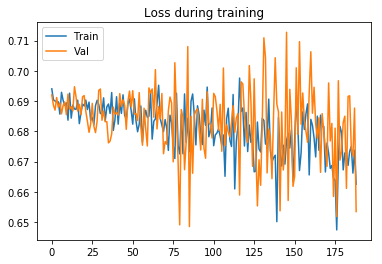

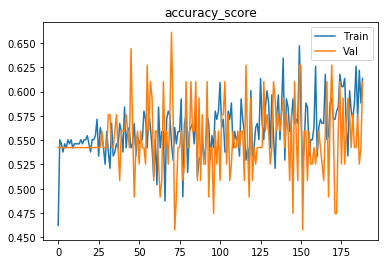

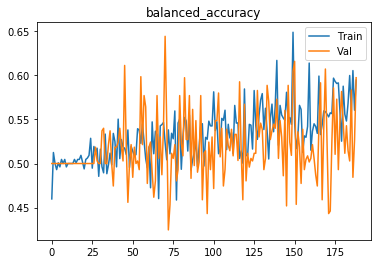

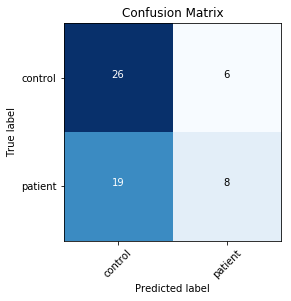

###### Starting inner fold 1
{'model': 'ModelLiu', 'batch_size': 16, 'patience': 12, 'lr': 0.0001}
Trainable model parameters: 116001
torch.Size([1, 72, 57, 75])


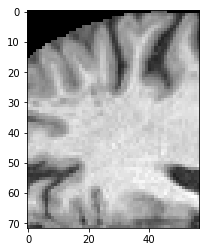

[0,     5] loss: 0.69422
[0,    10] loss: 0.69558
Time elapsed: 0h:0m:23s
train accuracy_score: 44.96 %
train balanced_accuracy: 46.09 %
val accuracy_score: 55.93 %
val balanced_accuracy: 51.85 %
Val loss: 0.689903
[1,     5] loss: 0.69025
[1,    10] loss: 0.68550
Time elapsed: 0h:1m:7s
train accuracy_score: 53.78 %
train balanced_accuracy: 50.48 %
val accuracy_score: 54.24 %
val balanced_accuracy: 50.00 %
Val loss: 0.686535
[2,     5] loss: 0.67693
[2,    10] loss: 0.69461
Time elapsed: 0h:1m:52s
train accuracy_score: 55.04 %
train balanced_accuracy: 50.54 %
val accuracy_score: 54.24 %
val balanced_accuracy: 50.00 %
Val loss: 0.688119
[3,     5] loss: 0.69365
[3,    10] loss: 0.68930
Time elapsed: 0h:2m:37s
train accuracy_score: 55.46 %
train balanced_accuracy: 51.24 %
val accuracy_score: 54.24 %
val balanced_accuracy: 50.00 %
Val loss: 0.689636
[4,     5] loss: 0.68954
[4,    10] loss: 0.69142
Time elapsed: 0h:3m:21s
train accuracy_score: 54.20 %
train balanced_accuracy: 49.93 %
val 

[38,     5] loss: 0.67140
[38,    10] loss: 0.69379
Time elapsed: 0h:28m:51s
train accuracy_score: 56.72 %
train balanced_accuracy: 53.10 %
val accuracy_score: 55.93 %
val balanced_accuracy: 51.85 %
Val loss: 0.682793
[39,     5] loss: 0.68888
[39,    10] loss: 0.70476
Time elapsed: 0h:29m:36s
train accuracy_score: 54.62 %
train balanced_accuracy: 51.57 %
val accuracy_score: 52.54 %
val balanced_accuracy: 49.02 %
Val loss: 0.687540
[40,     5] loss: 0.68673
[40,    10] loss: 0.68127
Time elapsed: 0h:30m:22s
train accuracy_score: 56.72 %
train balanced_accuracy: 54.51 %
val accuracy_score: 50.85 %
val balanced_accuracy: 46.88 %
Val loss: 0.683643
[41,     5] loss: 0.71893
[41,    10] loss: 0.69560
Time elapsed: 0h:31m:8s
train accuracy_score: 53.36 %
train balanced_accuracy: 49.32 %
val accuracy_score: 54.24 %
val balanced_accuracy: 50.00 %
Val loss: 0.695286
[42,     5] loss: 0.67238
[42,    10] loss: 0.71264
Time elapsed: 0h:31m:52s
train accuracy_score: 55.46 %
train balanced_accurac

val accuracy_score: 55.93 %
val balanced_accuracy: 54.46 %
Val loss: 0.696697
[76,     5] loss: 0.69634
[76,    10] loss: 0.69789
Time elapsed: 0h:57m:27s
train accuracy_score: 50.00 %
train balanced_accuracy: 48.35 %
val accuracy_score: 61.02 %
val balanced_accuracy: 57.99 %
Val loss: 0.676476
[77,     5] loss: 0.68482
[77,    10] loss: 0.66330
Time elapsed: 0h:58m:12s
train accuracy_score: 56.30 %
train balanced_accuracy: 52.56 %
val accuracy_score: 55.93 %
val balanced_accuracy: 52.43 %
Val loss: 0.684027
[78,     5] loss: 0.66624
[78,    10] loss: 0.67745
Time elapsed: 0h:58m:57s
train accuracy_score: 57.56 %
train balanced_accuracy: 55.59 %
val accuracy_score: 55.93 %
val balanced_accuracy: 54.75 %
Val loss: 0.685858
[79,     5] loss: 0.64670
[79,    10] loss: 0.68696
Time elapsed: 0h:59m:43s
train accuracy_score: 55.46 %
train balanced_accuracy: 52.65 %
val accuracy_score: 50.85 %
val balanced_accuracy: 46.88 %
Val loss: 0.688466
[80,     5] loss: 0.67219
[80,    10] loss: 0.6780

[118,     5] loss: 0.67035
[118,    10] loss: 0.67606
Time elapsed: 1h:29m:12s
train accuracy_score: 60.50 %
train balanced_accuracy: 59.77 %
val accuracy_score: 54.24 %
val balanced_accuracy: 51.45 %
Val loss: 0.700175
[119,     5] loss: 0.65824
[119,    10] loss: 0.68837
Time elapsed: 1h:29m:56s
train accuracy_score: 57.56 %
train balanced_accuracy: 54.34 %
val accuracy_score: 52.54 %
val balanced_accuracy: 49.02 %
Val loss: 0.674504
[120,     5] loss: 0.65189
[120,    10] loss: 0.67463
Time elapsed: 1h:30m:41s
train accuracy_score: 56.72 %
train balanced_accuracy: 54.43 %
val accuracy_score: 47.46 %
val balanced_accuracy: 47.80 %
Val loss: 0.681064
[121,     5] loss: 0.62926
[121,    10] loss: 0.65850
Time elapsed: 1h:31m:26s
train accuracy_score: 63.45 %
train balanced_accuracy: 61.99 %
val accuracy_score: 54.24 %
val balanced_accuracy: 50.87 %
Val loss: 0.672001
[122,     5] loss: 0.68265
[122,    10] loss: 0.64831
Time elapsed: 1h:32m:11s
train accuracy_score: 57.98 %
train balan

val accuracy_score: 59.32 %
val balanced_accuracy: 57.00 %
Val loss: 0.652762
[156,     5] loss: 0.66156
[156,    10] loss: 0.65662
Time elapsed: 1h:57m:28s
train accuracy_score: 62.18 %
train balanced_accuracy: 59.43 %
val accuracy_score: 57.63 %
val balanced_accuracy: 55.44 %
Val loss: 0.693597
[157,     5] loss: 0.66780
[157,    10] loss: 0.62885
Time elapsed: 1h:58m:12s
train accuracy_score: 65.55 %
train balanced_accuracy: 65.56 %
val accuracy_score: 50.85 %
val balanced_accuracy: 49.19 %
Val loss: 0.684832
[158,     5] loss: 0.65536
[158,    10] loss: 0.64177
Time elapsed: 1h:58m:56s
train accuracy_score: 58.82 %
train balanced_accuracy: 56.43 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.75 %
Val loss: 0.709427
[159,     5] loss: 0.68489
[159,    10] loss: 0.66938
Time elapsed: 1h:59m:41s
train accuracy_score: 58.40 %
train balanced_accuracy: 57.93 %
val accuracy_score: 57.63 %
val balanced_accuracy: 55.73 %
Val loss: 0.666490
[160,     5] loss: 0.67606
[160,    10] lo

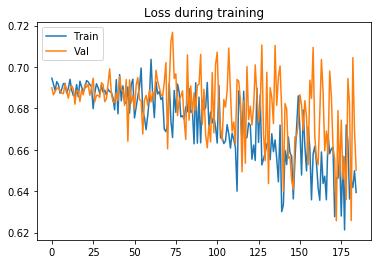

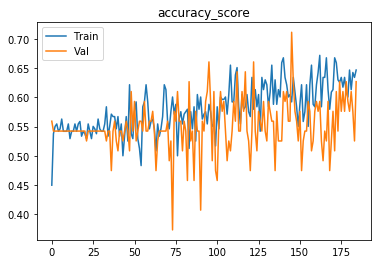

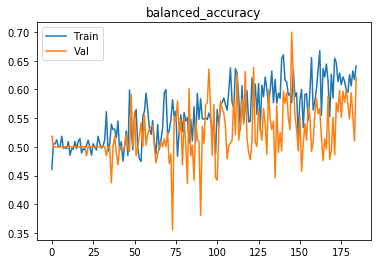

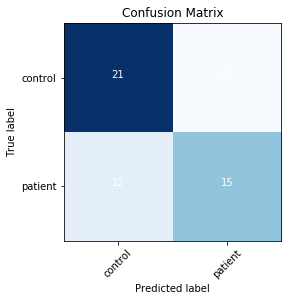

###### Starting inner fold 2
{'model': 'ModelLiu', 'batch_size': 16, 'patience': 16, 'lr': 5e-05}
Trainable model parameters: 116001
torch.Size([1, 72, 57, 75])


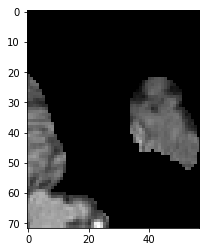

[0,     5] loss: 0.68827
[0,    10] loss: 0.68309
Time elapsed: 0h:0m:23s
train accuracy_score: 54.62 %
train balanced_accuracy: 50.00 %
val accuracy_score: 54.24 %
val balanced_accuracy: 50.00 %
Val loss: 0.688387
[1,     5] loss: 0.69243
[1,    10] loss: 0.69452
Time elapsed: 0h:1m:7s
train accuracy_score: 54.62 %
train balanced_accuracy: 50.00 %
val accuracy_score: 54.24 %
val balanced_accuracy: 50.00 %
Val loss: 0.690438
[2,     5] loss: 0.69318
[2,    10] loss: 0.69055
Time elapsed: 0h:1m:51s
train accuracy_score: 54.62 %
train balanced_accuracy: 50.00 %
val accuracy_score: 54.24 %
val balanced_accuracy: 50.00 %
Val loss: 0.688802
[3,     5] loss: 0.69444
[3,    10] loss: 0.67865
Time elapsed: 0h:2m:36s
train accuracy_score: 54.62 %
train balanced_accuracy: 50.00 %
val accuracy_score: 54.24 %
val balanced_accuracy: 50.00 %
Val loss: 0.688414
[4,     5] loss: 0.69077
[4,    10] loss: 0.68175
Time elapsed: 0h:3m:21s
train accuracy_score: 54.62 %
train balanced_accuracy: 50.00 %
val 

[38,     5] loss: 0.67181
[38,    10] loss: 0.68964
Time elapsed: 0h:28m:40s
train accuracy_score: 54.62 %
train balanced_accuracy: 50.00 %
val accuracy_score: 54.24 %
val balanced_accuracy: 50.00 %
Val loss: 0.690842
[39,     5] loss: 0.69332
[39,    10] loss: 0.68598
Time elapsed: 0h:29m:25s
train accuracy_score: 55.04 %
train balanced_accuracy: 50.46 %
val accuracy_score: 54.24 %
val balanced_accuracy: 50.00 %
Val loss: 0.693718
[40,     5] loss: 0.69263
[40,    10] loss: 0.67364
Time elapsed: 0h:30m:9s
train accuracy_score: 54.62 %
train balanced_accuracy: 50.00 %
val accuracy_score: 54.24 %
val balanced_accuracy: 50.00 %
Val loss: 0.691931
[41,     5] loss: 0.69097
[41,    10] loss: 0.68447
Time elapsed: 0h:30m:54s
train accuracy_score: 54.62 %
train balanced_accuracy: 50.00 %
val accuracy_score: 54.24 %
val balanced_accuracy: 50.00 %
Val loss: 0.687945
[42,     5] loss: 0.66811
[42,    10] loss: 0.70473
Time elapsed: 0h:31m:38s
train accuracy_score: 55.04 %
train balanced_accurac

val accuracy_score: 54.24 %
val balanced_accuracy: 50.00 %
Val loss: 0.694127
[76,     5] loss: 0.70035
[76,    10] loss: 0.67742
Time elapsed: 0h:57m:7s
train accuracy_score: 55.88 %
train balanced_accuracy: 52.33 %
val accuracy_score: 54.24 %
val balanced_accuracy: 50.00 %
Val loss: 0.691350
[77,     5] loss: 0.69106
[77,    10] loss: 0.67450
Time elapsed: 0h:57m:52s
train accuracy_score: 58.82 %
train balanced_accuracy: 55.41 %
val accuracy_score: 54.24 %
val balanced_accuracy: 50.00 %
Val loss: 0.681213
[78,     5] loss: 0.69700
[78,    10] loss: 0.67222
Time elapsed: 0h:58m:38s
train accuracy_score: 53.36 %
train balanced_accuracy: 49.08 %
val accuracy_score: 55.93 %
val balanced_accuracy: 51.85 %
Val loss: 0.693302
[79,     5] loss: 0.68657
[79,    10] loss: 0.68813
Time elapsed: 0h:59m:23s
train accuracy_score: 54.62 %
train balanced_accuracy: 50.71 %
val accuracy_score: 54.24 %
val balanced_accuracy: 50.58 %
Val loss: 0.694706
[80,     5] loss: 0.69450
[80,    10] loss: 0.68441

Time elapsed: 1h:24m:54s
train accuracy_score: 55.46 %
train balanced_accuracy: 51.79 %
val accuracy_score: 54.24 %
val balanced_accuracy: 50.00 %
Val loss: 0.661073
[114,     5] loss: 0.68114
[114,    10] loss: 0.68196
Time elapsed: 1h:25m:39s
train accuracy_score: 54.62 %
train balanced_accuracy: 52.35 %
val accuracy_score: 55.93 %
val balanced_accuracy: 53.30 %
Val loss: 0.680445
[115,     5] loss: 0.68209
[115,    10] loss: 0.68139
Time elapsed: 1h:26m:24s
train accuracy_score: 51.26 %
train balanced_accuracy: 48.41 %
val accuracy_score: 52.54 %
val balanced_accuracy: 48.73 %
Val loss: 0.700899
[116,     5] loss: 0.69826
[116,    10] loss: 0.68664
Time elapsed: 1h:27m:9s
train accuracy_score: 56.72 %
train balanced_accuracy: 53.41 %
val accuracy_score: 52.54 %
val balanced_accuracy: 49.31 %
Val loss: 0.679702
[117,     5] loss: 0.66782
[117,    10] loss: 0.67439
Time elapsed: 1h:27m:54s
train accuracy_score: 55.88 %
train balanced_accuracy: 53.35 %
val accuracy_score: 57.63 %
val b

val accuracy_score: 57.63 %
val balanced_accuracy: 53.70 %
Val loss: 0.669249
[151,     5] loss: 0.68884
[151,    10] loss: 0.69494
Time elapsed: 1h:53m:18s
train accuracy_score: 55.46 %
train balanced_accuracy: 52.26 %
val accuracy_score: 61.02 %
val balanced_accuracy: 57.99 %
Val loss: 0.679638
[152,     5] loss: 0.68335
[152,    10] loss: 0.68259
Time elapsed: 1h:54m:2s
train accuracy_score: 54.62 %
train balanced_accuracy: 51.88 %
val accuracy_score: 55.93 %
val balanced_accuracy: 52.14 %
Val loss: 0.690986
[153,     5] loss: 0.69166
[153,    10] loss: 0.68564
Time elapsed: 1h:54m:46s
train accuracy_score: 59.66 %
train balanced_accuracy: 55.95 %
val accuracy_score: 54.24 %
val balanced_accuracy: 50.29 %
Val loss: 0.681952
[154,     5] loss: 0.68259
[154,    10] loss: 0.68681
Time elapsed: 1h:55m:30s
train accuracy_score: 59.24 %
train balanced_accuracy: 55.88 %
val accuracy_score: 57.63 %
val balanced_accuracy: 54.28 %
Val loss: 0.673433
[155,     5] loss: 0.70513
[155,    10] los

[188,     5] loss: 0.69780
[188,    10] loss: 0.65196
Time elapsed: 2h:20m:45s
train accuracy_score: 52.10 %
train balanced_accuracy: 49.89 %
val accuracy_score: 54.24 %
val balanced_accuracy: 50.58 %
Val loss: 0.693787
[189,     5] loss: 0.67027
[189,    10] loss: 0.70852
Time elapsed: 2h:21m:30s
train accuracy_score: 57.98 %
train balanced_accuracy: 54.49 %
val accuracy_score: 52.54 %
val balanced_accuracy: 48.44 %
Val loss: 0.694875
[190,     5] loss: 0.69017
[190,    10] loss: 0.66752
Time elapsed: 2h:22m:14s
train accuracy_score: 52.10 %
train balanced_accuracy: 48.63 %
val accuracy_score: 54.24 %
val balanced_accuracy: 50.87 %
Val loss: 0.690252
[191,     5] loss: 0.68730
[191,    10] loss: 0.69642
Time elapsed: 2h:22m:58s
train accuracy_score: 52.94 %
train balanced_accuracy: 50.81 %
val accuracy_score: 52.54 %
val balanced_accuracy: 49.88 %
Val loss: 0.671445
[192,     5] loss: 0.68040
[192,    10] loss: 0.68872
Time elapsed: 2h:23m:43s
train accuracy_score: 56.72 %
train balan

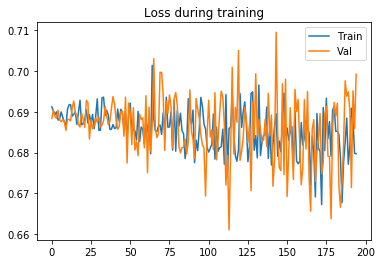

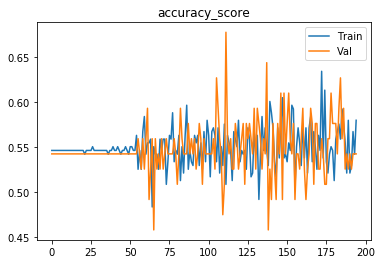

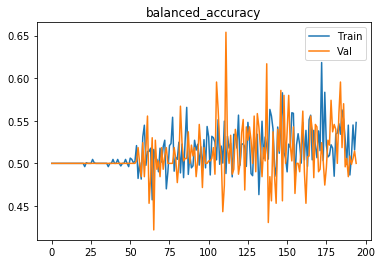

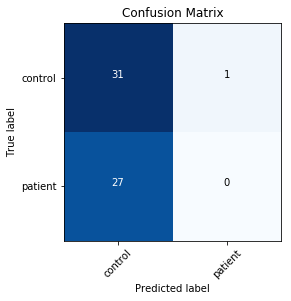

###### Starting inner fold 3
{'model': 'ModelLiu', 'batch_size': 16, 'patience': 12, 'lr': 0.0001}
Trainable model parameters: 116001
torch.Size([1, 72, 57, 75])


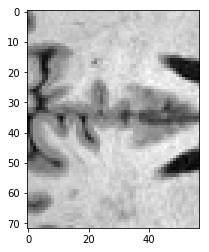

[0,     5] loss: 0.68692
[0,    10] loss: 0.69376
Time elapsed: 0h:0m:23s
train accuracy_score: 54.62 %
train balanced_accuracy: 50.00 %
val accuracy_score: 54.24 %
val balanced_accuracy: 50.00 %
Val loss: 0.688262
[1,     5] loss: 0.68289
[1,    10] loss: 0.68867
Time elapsed: 0h:1m:7s
train accuracy_score: 54.62 %
train balanced_accuracy: 50.00 %
val accuracy_score: 54.24 %
val balanced_accuracy: 50.00 %
Val loss: 0.687649
[2,     5] loss: 0.68880
[2,    10] loss: 0.68961
Time elapsed: 0h:1m:53s
train accuracy_score: 54.62 %
train balanced_accuracy: 50.00 %
val accuracy_score: 54.24 %
val balanced_accuracy: 50.00 %
Val loss: 0.690751
[3,     5] loss: 0.68373
[3,    10] loss: 0.69176
Time elapsed: 0h:2m:37s
train accuracy_score: 54.62 %
train balanced_accuracy: 50.00 %
val accuracy_score: 54.24 %
val balanced_accuracy: 50.00 %
Val loss: 0.688102
[4,     5] loss: 0.69096
[4,    10] loss: 0.67588
Time elapsed: 0h:3m:22s
train accuracy_score: 54.62 %
train balanced_accuracy: 50.00 %
val 

[38,     5] loss: 0.68532
[38,    10] loss: 0.69236
Time elapsed: 0h:28m:45s
train accuracy_score: 55.46 %
train balanced_accuracy: 50.93 %
val accuracy_score: 54.24 %
val balanced_accuracy: 50.00 %
Val loss: 0.688170
[39,     5] loss: 0.68253
[39,    10] loss: 0.67727
Time elapsed: 0h:29m:30s
train accuracy_score: 55.04 %
train balanced_accuracy: 50.54 %
val accuracy_score: 54.24 %
val balanced_accuracy: 50.00 %
Val loss: 0.692898
[40,     5] loss: 0.69054
[40,    10] loss: 0.67669
Time elapsed: 0h:30m:14s
train accuracy_score: 55.04 %
train balanced_accuracy: 50.70 %
val accuracy_score: 54.24 %
val balanced_accuracy: 50.00 %
Val loss: 0.688313
[41,     5] loss: 0.68807
[41,    10] loss: 0.69160
Time elapsed: 0h:30m:59s
train accuracy_score: 53.36 %
train balanced_accuracy: 48.92 %
val accuracy_score: 54.24 %
val balanced_accuracy: 50.00 %
Val loss: 0.692488
[42,     5] loss: 0.69642
[42,    10] loss: 0.67590
Time elapsed: 0h:31m:44s
train accuracy_score: 55.04 %
train balanced_accura

val accuracy_score: 47.46 %
val balanced_accuracy: 44.91 %
Val loss: 0.687519
[76,     5] loss: 0.69331
[76,    10] loss: 0.68445
Time elapsed: 0h:57m:19s
train accuracy_score: 53.36 %
train balanced_accuracy: 51.35 %
val accuracy_score: 54.24 %
val balanced_accuracy: 50.29 %
Val loss: 0.687918
[77,     5] loss: 0.68203
[77,    10] loss: 0.68874
Time elapsed: 0h:58m:3s
train accuracy_score: 57.14 %
train balanced_accuracy: 53.25 %
val accuracy_score: 54.24 %
val balanced_accuracy: 50.29 %
Val loss: 0.693320
[78,     5] loss: 0.67293
[78,    10] loss: 0.66085
Time elapsed: 0h:58m:48s
train accuracy_score: 54.62 %
train balanced_accuracy: 50.24 %
val accuracy_score: 54.24 %
val balanced_accuracy: 50.00 %
Val loss: 0.697428
[79,     5] loss: 0.67044
[79,    10] loss: 0.69311
Time elapsed: 0h:59m:32s
train accuracy_score: 56.30 %
train balanced_accuracy: 52.24 %
val accuracy_score: 54.24 %
val balanced_accuracy: 50.58 %
Val loss: 0.679770
[80,     5] loss: 0.69200
[80,    10] loss: 0.67483

Time elapsed: 1h:24m:55s
train accuracy_score: 58.82 %
train balanced_accuracy: 57.14 %
val accuracy_score: 49.15 %
val balanced_accuracy: 45.89 %
Val loss: 0.695203
[114,     5] loss: 0.68350
[114,    10] loss: 0.67128
Time elapsed: 1h:25m:41s
train accuracy_score: 58.82 %
train balanced_accuracy: 56.98 %
val accuracy_score: 49.15 %
val balanced_accuracy: 46.47 %
Val loss: 0.682628
[115,     5] loss: 0.66767
[115,    10] loss: 0.71562
Time elapsed: 1h:26m:26s
train accuracy_score: 55.88 %
train balanced_accuracy: 52.88 %
val accuracy_score: 49.15 %
val balanced_accuracy: 46.18 %
Val loss: 0.696786
[116,     5] loss: 0.70950
[116,    10] loss: 0.64567
Time elapsed: 1h:27m:10s
train accuracy_score: 53.78 %
train balanced_accuracy: 52.83 %
val accuracy_score: 54.24 %
val balanced_accuracy: 53.47 %
Val loss: 0.674616
[117,     5] loss: 0.68912
[117,    10] loss: 0.68875
Time elapsed: 1h:27m:54s
train accuracy_score: 56.72 %
train balanced_accuracy: 54.59 %
val accuracy_score: 54.24 %
val 

val accuracy_score: 55.93 %
val balanced_accuracy: 54.75 %
Val loss: 0.677995
[151,     5] loss: 0.67566
[151,    10] loss: 0.68669
Time elapsed: 1h:53m:25s
train accuracy_score: 53.78 %
train balanced_accuracy: 53.62 %
val accuracy_score: 49.15 %
val balanced_accuracy: 48.21 %
Val loss: 0.690988
[152,     5] loss: 0.64410
[152,    10] loss: 0.66384
Time elapsed: 1h:54m:10s
train accuracy_score: 58.82 %
train balanced_accuracy: 55.96 %
val accuracy_score: 54.24 %
val balanced_accuracy: 50.29 %
Val loss: 0.672524
[153,     5] loss: 0.68269
[153,    10] loss: 0.65898
Time elapsed: 1h:54m:55s
train accuracy_score: 57.56 %
train balanced_accuracy: 54.57 %
val accuracy_score: 59.32 %
val balanced_accuracy: 56.42 %
Val loss: 0.663417
[154,     5] loss: 0.64391
[154,    10] loss: 0.69115
Time elapsed: 1h:55m:40s
train accuracy_score: 60.08 %
train balanced_accuracy: 58.45 %
val accuracy_score: 57.63 %
val balanced_accuracy: 56.31 %
Val loss: 0.664210
[155,     5] loss: 0.65021
[155,    10] lo

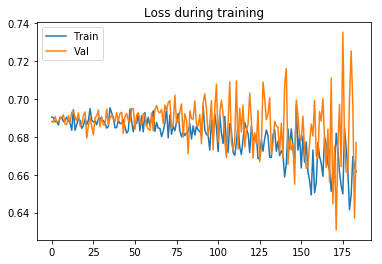

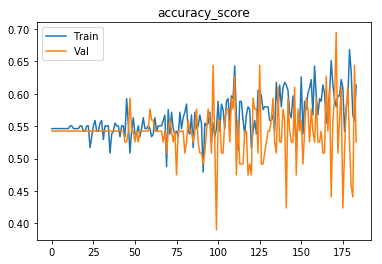

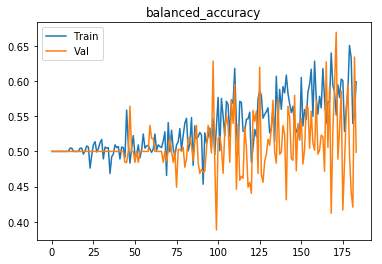

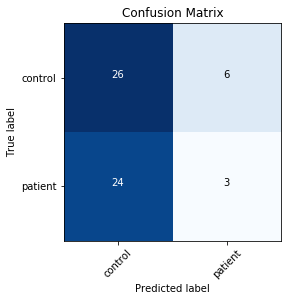

###### Starting inner fold 4
{'model': 'ModelLiu', 'batch_size': 16, 'patience': 12, 'lr': 0.0001}
Trainable model parameters: 116001
torch.Size([1, 72, 57, 75])


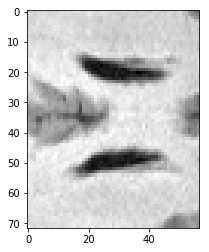

[0,     5] loss: 0.69740
[0,    10] loss: 0.68146
Time elapsed: 0h:0m:23s
train accuracy_score: 54.62 %
train balanced_accuracy: 50.00 %
val accuracy_score: 54.24 %
val balanced_accuracy: 50.00 %
Val loss: 0.688487
[1,     5] loss: 0.68266
[1,    10] loss: 0.70187
Time elapsed: 0h:1m:7s
train accuracy_score: 54.62 %
train balanced_accuracy: 50.00 %
val accuracy_score: 54.24 %
val balanced_accuracy: 50.00 %
Val loss: 0.691618
[2,     5] loss: 0.67630
[2,    10] loss: 0.69547
Time elapsed: 0h:1m:51s
train accuracy_score: 54.62 %
train balanced_accuracy: 50.00 %
val accuracy_score: 54.24 %
val balanced_accuracy: 50.00 %
Val loss: 0.687129
[3,     5] loss: 0.69654
[3,    10] loss: 0.69090
Time elapsed: 0h:2m:35s
train accuracy_score: 52.52 %
train balanced_accuracy: 48.23 %
val accuracy_score: 54.24 %
val balanced_accuracy: 50.00 %
Val loss: 0.691737
[4,     5] loss: 0.69148
[4,    10] loss: 0.69275
Time elapsed: 0h:3m:19s
train accuracy_score: 54.62 %
train balanced_accuracy: 50.00 %
val 

[38,     5] loss: 0.69252
[38,    10] loss: 0.68008
Time elapsed: 0h:28m:36s
train accuracy_score: 55.88 %
train balanced_accuracy: 51.55 %
val accuracy_score: 54.24 %
val balanced_accuracy: 50.00 %
Val loss: 0.689688
[39,     5] loss: 0.69070
[39,    10] loss: 0.69306
Time elapsed: 0h:29m:20s
train accuracy_score: 55.46 %
train balanced_accuracy: 51.47 %
val accuracy_score: 54.24 %
val balanced_accuracy: 50.00 %
Val loss: 0.689580
[40,     5] loss: 0.68249
[40,    10] loss: 0.70628
Time elapsed: 0h:30m:4s
train accuracy_score: 54.20 %
train balanced_accuracy: 50.16 %
val accuracy_score: 54.24 %
val balanced_accuracy: 50.00 %
Val loss: 0.684529
[41,     5] loss: 0.68337
[41,    10] loss: 0.69887
Time elapsed: 0h:30m:48s
train accuracy_score: 52.52 %
train balanced_accuracy: 48.31 %
val accuracy_score: 54.24 %
val balanced_accuracy: 50.00 %
Val loss: 0.686741
[42,     5] loss: 0.67966
[42,    10] loss: 0.69222
Time elapsed: 0h:31m:32s
train accuracy_score: 55.04 %
train balanced_accurac

val accuracy_score: 54.24 %
val balanced_accuracy: 50.00 %
Val loss: 0.684708
[76,     5] loss: 0.67293
[76,    10] loss: 0.69646
Time elapsed: 0h:56m:42s
train accuracy_score: 55.88 %
train balanced_accuracy: 52.02 %
val accuracy_score: 57.63 %
val balanced_accuracy: 53.70 %
Val loss: 0.686071
[77,     5] loss: 0.68558
[77,    10] loss: 0.69918
Time elapsed: 0h:57m:26s
train accuracy_score: 54.20 %
train balanced_accuracy: 50.32 %
val accuracy_score: 52.54 %
val balanced_accuracy: 49.59 %
Val loss: 0.692910
[78,     5] loss: 0.68368
[78,    10] loss: 0.67512
Time elapsed: 0h:58m:10s
train accuracy_score: 55.46 %
train balanced_accuracy: 52.41 %
val accuracy_score: 54.24 %
val balanced_accuracy: 50.00 %
Val loss: 0.675481
[79,     5] loss: 0.68494
[79,    10] loss: 0.68624
Time elapsed: 0h:58m:55s
train accuracy_score: 57.14 %
train balanced_accuracy: 54.19 %
val accuracy_score: 52.54 %
val balanced_accuracy: 49.02 %
Val loss: 0.688189
[80,     5] loss: 0.67845
[80,    10] loss: 0.6921

Time elapsed: 1h:24m:8s
train accuracy_score: 51.68 %
train balanced_accuracy: 48.25 %
val accuracy_score: 57.63 %
val balanced_accuracy: 53.99 %
Val loss: 0.658756
[114,     5] loss: 0.68972
[114,    10] loss: 0.68140
Time elapsed: 1h:24m:52s
train accuracy_score: 55.04 %
train balanced_accuracy: 52.26 %
val accuracy_score: 50.85 %
val balanced_accuracy: 47.45 %
Val loss: 0.690843
[115,     5] loss: 0.67746
[115,    10] loss: 0.66641
Time elapsed: 1h:25m:37s
train accuracy_score: 56.30 %
train balanced_accuracy: 53.58 %
val accuracy_score: 57.63 %
val balanced_accuracy: 53.70 %
Val loss: 0.683968
[116,     5] loss: 0.66153
[116,    10] loss: 0.66772
Time elapsed: 1h:26m:22s
train accuracy_score: 60.08 %
train balanced_accuracy: 57.27 %
val accuracy_score: 52.54 %
val balanced_accuracy: 49.31 %
Val loss: 0.681104
[117,     5] loss: 0.67139
[117,    10] loss: 0.67125
Time elapsed: 1h:27m:7s
train accuracy_score: 59.66 %
train balanced_accuracy: 57.28 %
val accuracy_score: 57.63 %
val ba

val accuracy_score: 47.46 %
val balanced_accuracy: 48.96 %
Val loss: 0.681957
[151,     5] loss: 0.67661
[151,    10] loss: 0.69051
Time elapsed: 1h:52m:19s
train accuracy_score: 57.98 %
train balanced_accuracy: 56.92 %
val accuracy_score: 55.93 %
val balanced_accuracy: 52.72 %
Val loss: 0.689579
[152,     5] loss: 0.68106
[152,    10] loss: 0.66008
Time elapsed: 1h:53m:4s
train accuracy_score: 56.72 %
train balanced_accuracy: 53.73 %
val accuracy_score: 54.24 %
val balanced_accuracy: 51.16 %
Val loss: 0.682613
[153,     5] loss: 0.66440
[153,    10] loss: 0.65484
Time elapsed: 1h:53m:49s
train accuracy_score: 59.66 %
train balanced_accuracy: 56.73 %
val accuracy_score: 55.93 %
val balanced_accuracy: 53.88 %
Val loss: 0.687737
[154,     5] loss: 0.65418
[154,    10] loss: 0.68229
Time elapsed: 1h:54m:33s
train accuracy_score: 60.92 %
train balanced_accuracy: 59.84 %
val accuracy_score: 55.93 %
val balanced_accuracy: 54.46 %
Val loss: 0.674355
[155,     5] loss: 0.65549
[155,    10] los

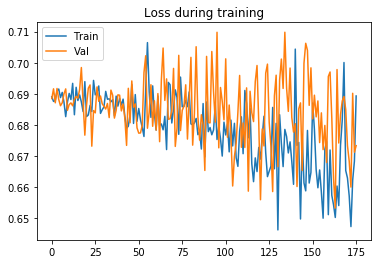

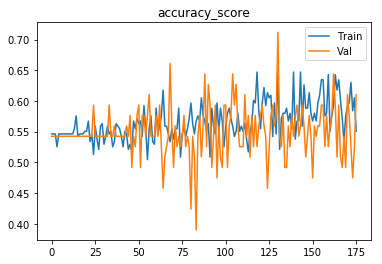

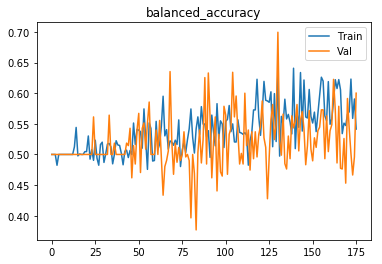

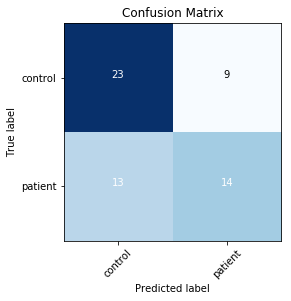

Finished outer fold.
{'final_acc': 0.59722222222222221, 'best_acc': 0.64409722222222221, 'final_iter': 189, 'best_iter': 71, 'params': {'model': 'ModelLiu', 'batch_size': 12, 'patience': 12, 'lr': 5e-05}, 'inner_fold_idx': 0}
###### Starting outer fold 5
238
59
Shuffled the data..
###### Starting inner fold 0
{'model': 'ModelLiu', 'batch_size': 16, 'patience': 12, 'lr': 0.0001}
Trainable model parameters: 116001
torch.Size([1, 72, 57, 75])


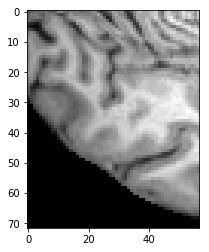

[0,     5] loss: 0.69384
[0,    10] loss: 0.68694
Time elapsed: 0h:0m:22s
train accuracy_score: 52.94 %
train balanced_accuracy: 45.65 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.690925
[1,     5] loss: 0.67946
[1,    10] loss: 0.68074
Time elapsed: 0h:1m:7s
train accuracy_score: 59.66 %
train balanced_accuracy: 50.52 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.692276
[2,     5] loss: 0.68827
[2,    10] loss: 0.67330
Time elapsed: 0h:1m:52s
train accuracy_score: 59.24 %
train balanced_accuracy: 50.00 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.693218
[3,     5] loss: 0.66735
[3,    10] loss: 0.70251
Time elapsed: 0h:2m:36s
train accuracy_score: 59.24 %
train balanced_accuracy: 50.00 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.701302
[4,     5] loss: 0.69046
[4,    10] loss: 0.68710
Time elapsed: 0h:3m:21s
train accuracy_score: 59.24 %
train balanced_accuracy: 50.00 %
val 

[38,     5] loss: 0.66836
[38,    10] loss: 0.69270
Time elapsed: 0h:28m:34s
train accuracy_score: 59.24 %
train balanced_accuracy: 50.00 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.698775
[39,     5] loss: 0.70081
[39,    10] loss: 0.66490
Time elapsed: 0h:29m:19s
train accuracy_score: 59.24 %
train balanced_accuracy: 50.00 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.683468
[40,     5] loss: 0.67909
[40,    10] loss: 0.68608
Time elapsed: 0h:30m:4s
train accuracy_score: 59.24 %
train balanced_accuracy: 50.00 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.706252
[41,     5] loss: 0.68822
[41,    10] loss: 0.62844
Time elapsed: 0h:30m:48s
train accuracy_score: 59.24 %
train balanced_accuracy: 50.00 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.686678
[42,     5] loss: 0.67204
[42,    10] loss: 0.68265
Time elapsed: 0h:31m:33s
train accuracy_score: 59.24 %
train balanced_accurac

val accuracy_score: 54.24 %
val balanced_accuracy: 51.79 %
Val loss: 0.690083
[76,     5] loss: 0.66414
[76,    10] loss: 0.66813
Time elapsed: 0h:56m:48s
train accuracy_score: 55.46 %
train balanced_accuracy: 47.29 %
val accuracy_score: 54.24 %
val balanced_accuracy: 51.79 %
Val loss: 0.694379
[77,     5] loss: 0.69607
[77,    10] loss: 0.64295
Time elapsed: 0h:57m:33s
train accuracy_score: 58.82 %
train balanced_accuracy: 50.45 %
val accuracy_score: 50.85 %
val balanced_accuracy: 48.39 %
Val loss: 0.711607
[78,     5] loss: 0.67435
[78,    10] loss: 0.65142
Time elapsed: 0h:58m:17s
train accuracy_score: 60.50 %
train balanced_accuracy: 51.87 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.17 %
Val loss: 0.681127
[79,     5] loss: 0.64255
[79,    10] loss: 0.67219
Time elapsed: 0h:59m:2s
train accuracy_score: 61.34 %
train balanced_accuracy: 52.90 %
val accuracy_score: 54.24 %
val balanced_accuracy: 51.79 %
Val loss: 0.673877
[80,     5] loss: 0.68429
[80,    10] loss: 0.68401

Time elapsed: 1h:24m:21s
train accuracy_score: 58.82 %
train balanced_accuracy: 49.81 %
val accuracy_score: 54.24 %
val balanced_accuracy: 51.79 %
Val loss: 0.690224
[114,     5] loss: 0.67202
[114,    10] loss: 0.69105
Time elapsed: 1h:25m:6s
train accuracy_score: 60.08 %
train balanced_accuracy: 51.03 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.687331
[115,     5] loss: 0.68063
[115,    10] loss: 0.67343
Time elapsed: 1h:25m:51s
train accuracy_score: 59.24 %
train balanced_accuracy: 50.64 %
val accuracy_score: 55.93 %
val balanced_accuracy: 53.57 %
Val loss: 0.684379
[116,     5] loss: 0.65984
[116,    10] loss: 0.65771
Time elapsed: 1h:26m:36s
train accuracy_score: 60.92 %
train balanced_accuracy: 52.71 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.701581
[117,     5] loss: 0.63067
[117,    10] loss: 0.67735
Time elapsed: 1h:27m:20s
train accuracy_score: 57.98 %
train balanced_accuracy: 48.94 %
val accuracy_score: 52.54 %
val b

val accuracy_score: 57.63 %
val balanced_accuracy: 55.36 %
Val loss: 0.688764
[151,     5] loss: 0.67339
[151,    10] loss: 0.65541
Time elapsed: 1h:52m:36s
train accuracy_score: 60.50 %
train balanced_accuracy: 52.67 %
val accuracy_score: 55.93 %
val balanced_accuracy: 53.92 %
Val loss: 0.681759
[152,     5] loss: 0.66170
[152,    10] loss: 0.68363
Time elapsed: 1h:53m:20s
train accuracy_score: 55.88 %
train balanced_accuracy: 48.13 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.35 %
Val loss: 0.688857
[153,     5] loss: 0.67208
[153,    10] loss: 0.64715
Time elapsed: 1h:54m:4s
train accuracy_score: 59.66 %
train balanced_accuracy: 51.96 %
val accuracy_score: 54.24 %
val balanced_accuracy: 52.13 %
Val loss: 0.673682
[154,     5] loss: 0.68181
[154,    10] loss: 0.66122
Time elapsed: 1h:54m:49s
train accuracy_score: 59.24 %
train balanced_accuracy: 51.93 %
val accuracy_score: 67.80 %
val balanced_accuracy: 66.24 %
Val loss: 0.667907
[155,     5] loss: 0.67279
[155,    10] los

[188,     5] loss: 0.64479
[188,    10] loss: 0.63550
Time elapsed: 2h:20m:2s
train accuracy_score: 62.18 %
train balanced_accuracy: 55.86 %
val accuracy_score: 57.63 %
val balanced_accuracy: 55.36 %
Val loss: 0.656525
[189,     5] loss: 0.63848
[189,    10] loss: 0.67318
Time elapsed: 2h:20m:46s
train accuracy_score: 59.66 %
train balanced_accuracy: 52.61 %
val accuracy_score: 66.10 %
val balanced_accuracy: 64.63 %
Val loss: 0.647025
[190,     5] loss: 0.68156
[190,    10] loss: 0.70169
Time elapsed: 2h:21m:31s
train accuracy_score: 62.18 %
train balanced_accuracy: 54.73 %
val accuracy_score: 61.02 %
val balanced_accuracy: 59.45 %
Val loss: 0.670503
[191,     5] loss: 0.65503
[191,    10] loss: 0.68369
Time elapsed: 2h:22m:16s
train accuracy_score: 58.82 %
train balanced_accuracy: 52.06 %
val accuracy_score: 54.24 %
val balanced_accuracy: 51.96 %
Val loss: 0.694174
[192,     5] loss: 0.67186
[192,    10] loss: 0.66336
Time elapsed: 2h:23m:0s
train accuracy_score: 60.50 %
train balance

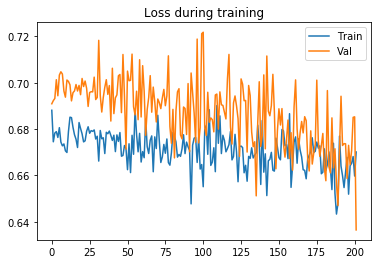

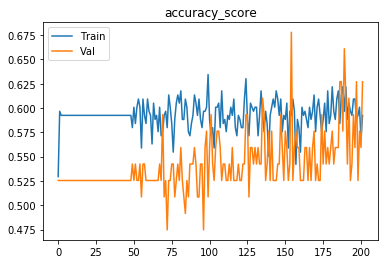

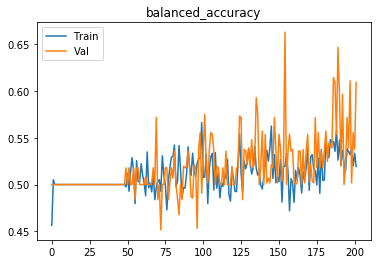

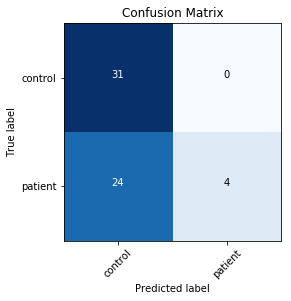

###### Starting inner fold 1
{'model': 'ModelLiu', 'batch_size': 32, 'patience': 12, 'lr': 0.0001}
Trainable model parameters: 116001
torch.Size([1, 72, 57, 75])


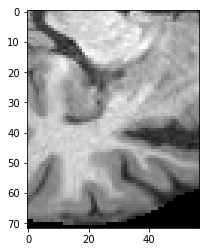

[0,     5] loss: 0.69165
Time elapsed: 0h:0m:23s
train accuracy_score: 54.20 %
train balanced_accuracy: 47.67 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.692246
[1,     5] loss: 0.68662
Time elapsed: 0h:1m:8s
train accuracy_score: 59.24 %
train balanced_accuracy: 50.16 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.692377
[2,     5] loss: 0.68201
Time elapsed: 0h:1m:52s
train accuracy_score: 59.24 %
train balanced_accuracy: 50.00 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.689578
[3,     5] loss: 0.67803
Time elapsed: 0h:2m:37s
train accuracy_score: 59.24 %
train balanced_accuracy: 50.00 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.701080
[4,     5] loss: 0.68279
Time elapsed: 0h:3m:21s
train accuracy_score: 59.24 %
train balanced_accuracy: 50.00 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.701485
[5,     5] loss: 0.67261
Time elapsed: 0h:4m:6s
tra

[43,     5] loss: 0.67716
Time elapsed: 0h:32m:30s
train accuracy_score: 59.24 %
train balanced_accuracy: 50.00 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.687715
[44,     5] loss: 0.67001
Time elapsed: 0h:33m:15s
train accuracy_score: 59.24 %
train balanced_accuracy: 50.00 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.707291
[45,     5] loss: 0.67600
Time elapsed: 0h:34m:0s
train accuracy_score: 59.24 %
train balanced_accuracy: 50.00 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.708164
[46,     5] loss: 0.66782
Time elapsed: 0h:34m:45s
train accuracy_score: 59.24 %
train balanced_accuracy: 50.00 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.695076
[47,     5] loss: 0.67327
Time elapsed: 0h:35m:30s
train accuracy_score: 59.24 %
train balanced_accuracy: 50.00 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.701482
[48,     5] loss: 0.68146
Time elapsed: 0

[86,     5] loss: 0.67763
Time elapsed: 1h:4m:35s
train accuracy_score: 59.24 %
train balanced_accuracy: 50.00 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.703555
[87,     5] loss: 0.66268
Time elapsed: 1h:5m:20s
train accuracy_score: 59.24 %
train balanced_accuracy: 50.00 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.703869
[88,     5] loss: 0.66876
Time elapsed: 1h:6m:5s
train accuracy_score: 59.24 %
train balanced_accuracy: 50.00 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.684557
[89,     5] loss: 0.69074
Time elapsed: 1h:6m:50s
train accuracy_score: 59.66 %
train balanced_accuracy: 50.52 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.691996
[90,     5] loss: 0.68499
Time elapsed: 1h:7m:34s
train accuracy_score: 58.82 %
train balanced_accuracy: 49.65 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.708551
[91,     5] loss: 0.67109
Time elapsed: 1h:8m:

[129,     5] loss: 0.67614
Time elapsed: 1h:36m:39s
train accuracy_score: 59.24 %
train balanced_accuracy: 50.00 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.687054
[130,     5] loss: 0.66648
Time elapsed: 1h:37m:24s
train accuracy_score: 59.24 %
train balanced_accuracy: 50.00 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.699958
[131,     5] loss: 0.68825
Time elapsed: 1h:38m:9s
train accuracy_score: 59.24 %
train balanced_accuracy: 50.00 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.694429
[132,     5] loss: 0.67160
Time elapsed: 1h:38m:54s
train accuracy_score: 59.24 %
train balanced_accuracy: 50.00 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.695670
[133,     5] loss: 0.67097
Time elapsed: 1h:39m:40s
train accuracy_score: 59.24 %
train balanced_accuracy: 50.00 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.695395
[134,     5] loss: 0.67208
Time elap

val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.688411
[172,     5] loss: 0.67005
Time elapsed: 2h:8m:46s
train accuracy_score: 60.08 %
train balanced_accuracy: 51.03 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.684235
[173,     5] loss: 0.66790
Time elapsed: 2h:9m:30s
train accuracy_score: 57.98 %
train balanced_accuracy: 49.42 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.691477
[174,     5] loss: 0.67679
Time elapsed: 2h:10m:15s
train accuracy_score: 58.82 %
train balanced_accuracy: 49.97 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.704202
[175,     5] loss: 0.66287
Time elapsed: 2h:11m:0s
train accuracy_score: 59.66 %
train balanced_accuracy: 50.52 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.690419
[176,     5] loss: 0.67785
Time elapsed: 2h:11m:44s
train accuracy_score: 58.40 %
train balanced_accuracy: 51.06 %
val accuracy_score: 57.63 %
val balanc

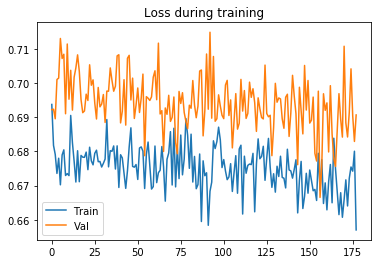

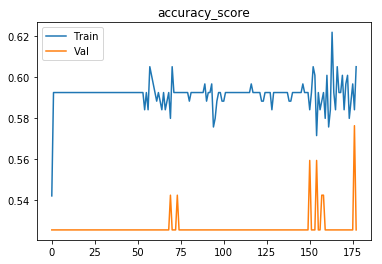

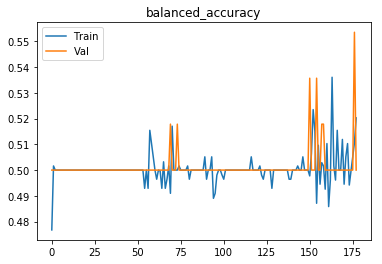

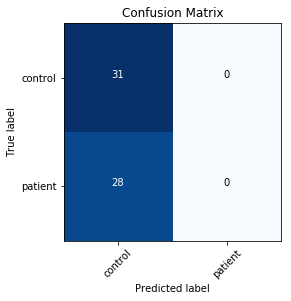

###### Starting inner fold 2
{'model': 'ModelLiu', 'batch_size': 16, 'patience': 16, 'lr': 0.0001}
Trainable model parameters: 116001
torch.Size([1, 72, 57, 75])


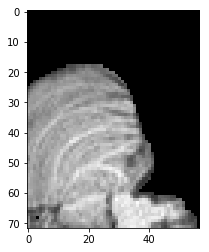

[0,     5] loss: 0.68960
[0,    10] loss: 0.68826
Time elapsed: 0h:0m:22s
train accuracy_score: 57.56 %
train balanced_accuracy: 51.80 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.694106
[1,     5] loss: 0.69249
[1,    10] loss: 0.66432
Time elapsed: 0h:1m:7s
train accuracy_score: 58.82 %
train balanced_accuracy: 49.65 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.696629
[2,     5] loss: 0.67672
[2,    10] loss: 0.67909
Time elapsed: 0h:1m:51s
train accuracy_score: 59.24 %
train balanced_accuracy: 50.00 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.704902
[3,     5] loss: 0.67559
[3,    10] loss: 0.67552
Time elapsed: 0h:2m:36s
train accuracy_score: 59.24 %
train balanced_accuracy: 50.00 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.693316
[4,     5] loss: 0.68513
[4,    10] loss: 0.69277
Time elapsed: 0h:3m:21s
train accuracy_score: 59.24 %
train balanced_accuracy: 50.00 %
val 

[38,     5] loss: 0.67128
[38,    10] loss: 0.66484
Time elapsed: 0h:28m:28s
train accuracy_score: 59.24 %
train balanced_accuracy: 50.00 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.699485
[39,     5] loss: 0.65874
[39,    10] loss: 0.67456
Time elapsed: 0h:29m:12s
train accuracy_score: 59.24 %
train balanced_accuracy: 50.00 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.687381
[40,     5] loss: 0.68855
[40,    10] loss: 0.66892
Time elapsed: 0h:29m:57s
train accuracy_score: 58.82 %
train balanced_accuracy: 49.65 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.699332
[41,     5] loss: 0.66919
[41,    10] loss: 0.65775
Time elapsed: 0h:30m:42s
train accuracy_score: 59.24 %
train balanced_accuracy: 50.00 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.693781
[42,     5] loss: 0.66187
[42,    10] loss: 0.70897
Time elapsed: 0h:31m:26s
train accuracy_score: 59.24 %
train balanced_accura

val accuracy_score: 50.85 %
val balanced_accuracy: 48.39 %
Val loss: 0.695993
[76,     5] loss: 0.67597
[76,    10] loss: 0.68161
Time elapsed: 0h:56m:38s
train accuracy_score: 59.66 %
train balanced_accuracy: 51.16 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.685282
[77,     5] loss: 0.68238
[77,    10] loss: 0.66637
Time elapsed: 0h:57m:22s
train accuracy_score: 59.66 %
train balanced_accuracy: 50.68 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.688636
[78,     5] loss: 0.66698
[78,    10] loss: 0.68724
Time elapsed: 0h:58m:6s
train accuracy_score: 59.24 %
train balanced_accuracy: 50.16 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.705973
[79,     5] loss: 0.67332
[79,    10] loss: 0.66380
Time elapsed: 0h:58m:51s
train accuracy_score: 59.24 %
train balanced_accuracy: 50.00 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.687781
[80,     5] loss: 0.69229
[80,    10] loss: 0.69608

Time elapsed: 1h:23m:59s
train accuracy_score: 60.50 %
train balanced_accuracy: 52.19 %
val accuracy_score: 55.93 %
val balanced_accuracy: 53.57 %
Val loss: 0.694850
[114,     5] loss: 0.68927
[114,    10] loss: 0.66582
Time elapsed: 1h:24m:43s
train accuracy_score: 59.66 %
train balanced_accuracy: 51.32 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.692128
[115,     5] loss: 0.65295
[115,    10] loss: 0.69225
Time elapsed: 1h:25m:27s
train accuracy_score: 57.14 %
train balanced_accuracy: 48.23 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.17 %
Val loss: 0.704990
[116,     5] loss: 0.68319
[116,    10] loss: 0.67321
Time elapsed: 1h:26m:12s
train accuracy_score: 57.98 %
train balanced_accuracy: 49.74 %
val accuracy_score: 54.24 %
val balanced_accuracy: 51.96 %
Val loss: 0.678876
[117,     5] loss: 0.67434
[117,    10] loss: 0.67849
Time elapsed: 1h:26m:56s
train accuracy_score: 57.56 %
train balanced_accuracy: 48.90 %
val accuracy_score: 52.54 %
val 

val accuracy_score: 54.24 %
val balanced_accuracy: 51.96 %
Val loss: 0.679475
[151,     5] loss: 0.66345
[151,    10] loss: 0.66686
Time elapsed: 1h:52m:8s
train accuracy_score: 60.92 %
train balanced_accuracy: 52.38 %
val accuracy_score: 50.85 %
val balanced_accuracy: 48.39 %
Val loss: 0.697071
[152,     5] loss: 0.65116
[152,    10] loss: 0.68593
Time elapsed: 1h:52m:53s
train accuracy_score: 60.50 %
train balanced_accuracy: 51.87 %
val accuracy_score: 50.85 %
val balanced_accuracy: 48.39 %
Val loss: 0.683810
[153,     5] loss: 0.68641
[153,    10] loss: 0.67508
Time elapsed: 1h:53m:38s
train accuracy_score: 57.14 %
train balanced_accuracy: 48.87 %
val accuracy_score: 54.24 %
val balanced_accuracy: 51.79 %
Val loss: 0.682183
[154,     5] loss: 0.65502
[154,    10] loss: 0.67759
Time elapsed: 1h:54m:22s
train accuracy_score: 60.08 %
train balanced_accuracy: 51.51 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.698245
[155,     5] loss: 0.67094
[155,    10] los

[188,     5] loss: 0.66812
[188,    10] loss: 0.67003
Time elapsed: 2h:19m:32s
train accuracy_score: 58.82 %
train balanced_accuracy: 50.29 %
val accuracy_score: 54.24 %
val balanced_accuracy: 51.79 %
Val loss: 0.679666
[189,     5] loss: 0.67858
[189,    10] loss: 0.66136
Time elapsed: 2h:20m:16s
train accuracy_score: 61.76 %
train balanced_accuracy: 55.34 %
val accuracy_score: 66.10 %
val balanced_accuracy: 64.63 %
Val loss: 0.652159
[190,     5] loss: 0.68837
[190,    10] loss: 0.65086
Time elapsed: 2h:21m:0s
train accuracy_score: 60.50 %
train balanced_accuracy: 53.15 %
val accuracy_score: 55.93 %
val balanced_accuracy: 53.57 %
Val loss: 0.670749
[191,     5] loss: 0.67140
[191,    10] loss: 0.63151
Time elapsed: 2h:21m:44s
train accuracy_score: 59.66 %
train balanced_accuracy: 51.80 %
val accuracy_score: 62.71 %
val balanced_accuracy: 60.89 %
Val loss: 0.647960
[192,     5] loss: 0.68249
[192,    10] loss: 0.64895
Time elapsed: 2h:22m:29s
train accuracy_score: 60.50 %
train balanc

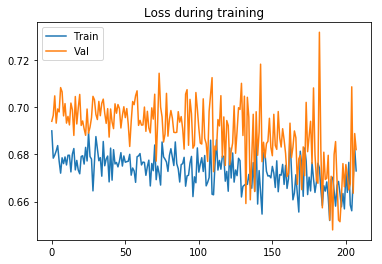

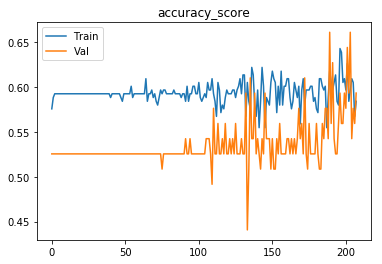

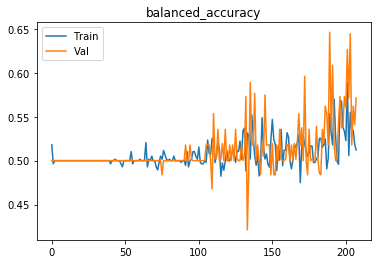

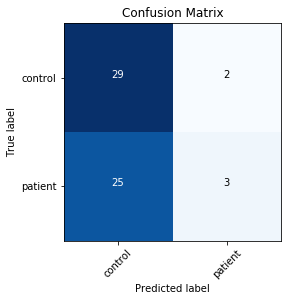

###### Starting inner fold 3
{'model': 'ModelLiu', 'batch_size': 16, 'patience': 16, 'lr': 0.0001}
Trainable model parameters: 116001
torch.Size([1, 72, 57, 75])


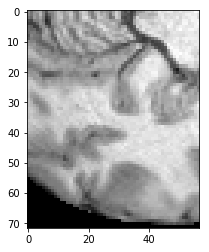

[0,     5] loss: 0.68844
[0,    10] loss: 0.68858
Time elapsed: 0h:0m:27s
train accuracy_score: 59.24 %
train balanced_accuracy: 50.00 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.693193
[1,     5] loss: 0.68719
[1,    10] loss: 0.68799
Time elapsed: 0h:1m:19s
train accuracy_score: 59.24 %
train balanced_accuracy: 50.00 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.698943
[2,     5] loss: 0.65689
[2,    10] loss: 0.66607
Time elapsed: 0h:2m:12s
train accuracy_score: 59.24 %
train balanced_accuracy: 50.00 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.700616
[3,     5] loss: 0.68979
[3,    10] loss: 0.70265
Time elapsed: 0h:3m:3s
train accuracy_score: 59.24 %
train balanced_accuracy: 50.00 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.695423
[4,     5] loss: 0.68954
[4,    10] loss: 0.66064
Time elapsed: 0h:3m:51s
train accuracy_score: 59.24 %
train balanced_accuracy: 50.00 %
val 

[38,     5] loss: 0.68637
[38,    10] loss: 0.65647
Time elapsed: 0h:29m:6s
train accuracy_score: 59.24 %
train balanced_accuracy: 50.16 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.702557
[39,     5] loss: 0.67498
[39,    10] loss: 0.67043
Time elapsed: 0h:29m:50s
train accuracy_score: 58.82 %
train balanced_accuracy: 49.97 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.687174
[40,     5] loss: 0.67898
[40,    10] loss: 0.69563
Time elapsed: 0h:30m:34s
train accuracy_score: 59.66 %
train balanced_accuracy: 50.84 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.690251
[41,     5] loss: 0.68176
[41,    10] loss: 0.66640
Time elapsed: 0h:31m:19s
train accuracy_score: 60.08 %
train balanced_accuracy: 51.03 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.695509
[42,     5] loss: 0.68061
[42,    10] loss: 0.63490
Time elapsed: 0h:32m:3s
train accuracy_score: 58.82 %
train balanced_accuracy

val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.691751
[76,     5] loss: 0.67753
[76,    10] loss: 0.67662
Time elapsed: 0h:57m:17s
train accuracy_score: 59.24 %
train balanced_accuracy: 50.00 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.700355
[77,     5] loss: 0.67995
[77,    10] loss: 0.70566
Time elapsed: 0h:58m:1s
train accuracy_score: 59.24 %
train balanced_accuracy: 50.00 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.706991
[78,     5] loss: 0.70284
[78,    10] loss: 0.65930
Time elapsed: 0h:58m:45s
train accuracy_score: 59.24 %
train balanced_accuracy: 50.00 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.686600
[79,     5] loss: 0.66325
[79,    10] loss: 0.67008
Time elapsed: 0h:59m:29s
train accuracy_score: 59.24 %
train balanced_accuracy: 50.00 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.681601
[80,     5] loss: 0.66501
[80,    10] loss: 0.67744

Time elapsed: 1h:24m:47s
train accuracy_score: 59.24 %
train balanced_accuracy: 50.00 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.688920
[114,     5] loss: 0.65752
[114,    10] loss: 0.66726
Time elapsed: 1h:25m:31s
train accuracy_score: 59.24 %
train balanced_accuracy: 50.00 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.687192
[115,     5] loss: 0.65335
[115,    10] loss: 0.67524
Time elapsed: 1h:26m:14s
train accuracy_score: 58.40 %
train balanced_accuracy: 49.45 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.686868
[116,     5] loss: 0.68956
[116,    10] loss: 0.64001
Time elapsed: 1h:26m:58s
train accuracy_score: 60.08 %
train balanced_accuracy: 51.03 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.692440
[117,     5] loss: 0.67260
[117,    10] loss: 0.68971
Time elapsed: 1h:27m:43s
train accuracy_score: 58.82 %
train balanced_accuracy: 50.13 %
val accuracy_score: 52.54 %
val 

val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.683929
[151,     5] loss: 0.68261
[151,    10] loss: 0.66096
Time elapsed: 1h:54m:28s
train accuracy_score: 58.82 %
train balanced_accuracy: 51.90 %
val accuracy_score: 49.15 %
val balanced_accuracy: 46.77 %
Val loss: 0.692459
[152,     5] loss: 0.64923
[152,    10] loss: 0.68126
Time elapsed: 1h:55m:13s
train accuracy_score: 60.50 %
train balanced_accuracy: 52.19 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.696005
[153,     5] loss: 0.64221
[153,    10] loss: 0.68228
Time elapsed: 1h:55m:57s
train accuracy_score: 59.66 %
train balanced_accuracy: 50.84 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.17 %
Val loss: 0.678150
[154,     5] loss: 0.66442
[154,    10] loss: 0.64781
Time elapsed: 1h:56m:42s
train accuracy_score: 61.34 %
train balanced_accuracy: 53.38 %
val accuracy_score: 55.93 %
val balanced_accuracy: 53.57 %
Val loss: 0.682710
[155,     5] loss: 0.67639
[155,    10] lo

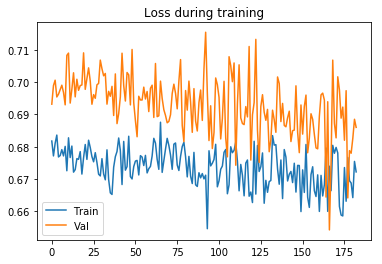

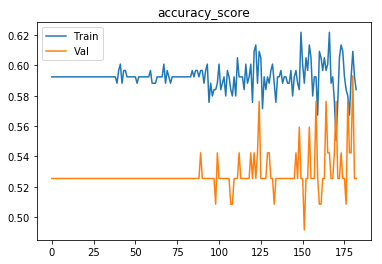

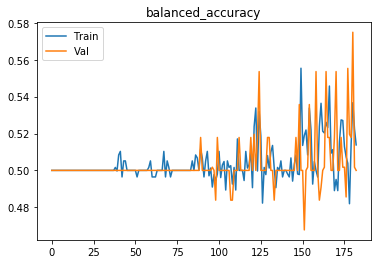

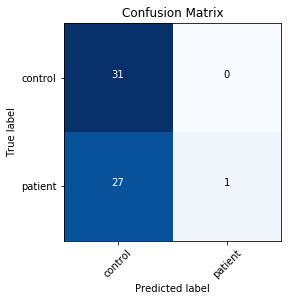

###### Starting inner fold 4
{'model': 'ModelLiu', 'batch_size': 12, 'patience': 16, 'lr': 5e-05}
Trainable model parameters: 116001
torch.Size([1, 72, 57, 75])


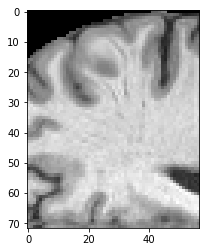

[0,     5] loss: 0.69714
[0,    10] loss: 0.69364
[0,    15] loss: 0.69242
Time elapsed: 0h:0m:21s
train accuracy_score: 50.84 %
train balanced_accuracy: 48.38 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.691306
[1,     5] loss: 0.69833
[1,    10] loss: 0.68832
[1,    15] loss: 0.68564
Time elapsed: 0h:1m:5s
train accuracy_score: 57.98 %
train balanced_accuracy: 48.94 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.694087
[2,     5] loss: 0.67745
[2,    10] loss: 0.66670
[2,    15] loss: 0.67862
Time elapsed: 0h:1m:49s
train accuracy_score: 59.24 %
train balanced_accuracy: 50.00 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.698808
[3,     5] loss: 0.69023
[3,    10] loss: 0.66045
[3,    15] loss: 0.66517
Time elapsed: 0h:2m:33s
train accuracy_score: 59.24 %
train balanced_accuracy: 50.00 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.697028
[4,     5] loss: 0.68862
[4,    10] loss:

[34,     5] loss: 0.69058
[34,    10] loss: 0.65606
[34,    15] loss: 0.68285
Time elapsed: 0h:24m:53s
train accuracy_score: 59.24 %
train balanced_accuracy: 50.00 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.696506
[35,     5] loss: 0.66591
[35,    10] loss: 0.69163
[35,    15] loss: 0.67225
Time elapsed: 0h:25m:36s
train accuracy_score: 59.24 %
train balanced_accuracy: 50.00 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.703024
[36,     5] loss: 0.66913
[36,    10] loss: 0.67546
[36,    15] loss: 0.67987
Time elapsed: 0h:26m:20s
train accuracy_score: 59.24 %
train balanced_accuracy: 50.00 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.695111
[37,     5] loss: 0.65808
[37,    10] loss: 0.68090
[37,    15] loss: 0.67791
Time elapsed: 0h:27m:2s
train accuracy_score: 59.24 %
train balanced_accuracy: 50.00 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.707334
[38,     5] loss: 0.66391

val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.693891
[68,     5] loss: 0.67927
[68,    10] loss: 0.69486
[68,    15] loss: 0.63010
Time elapsed: 0h:49m:15s
train accuracy_score: 58.40 %
train balanced_accuracy: 49.45 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.687537
[69,     5] loss: 0.67358
[69,    10] loss: 0.67538
[69,    15] loss: 0.66514
Time elapsed: 0h:49m:58s
train accuracy_score: 58.40 %
train balanced_accuracy: 49.45 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.696869
[70,     5] loss: 0.65433
[70,    10] loss: 0.71537
[70,    15] loss: 0.66589
Time elapsed: 0h:50m:41s
train accuracy_score: 57.98 %
train balanced_accuracy: 48.94 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.702902
[71,     5] loss: 0.68004
[71,    10] loss: 0.64831
[71,    15] loss: 0.68831
Time elapsed: 0h:51m:24s
train accuracy_score: 59.66 %
train balanced_accuracy: 50.52 %
val accuracy_score: 52.5

Time elapsed: 1h:12m:49s
train accuracy_score: 59.24 %
train balanced_accuracy: 50.00 %
val accuracy_score: 54.24 %
val balanced_accuracy: 51.79 %
Val loss: 0.693308
[102,     5] loss: 0.66844
[102,    10] loss: 0.69296
[102,    15] loss: 0.68406
Time elapsed: 1h:13m:31s
train accuracy_score: 58.82 %
train balanced_accuracy: 49.65 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.699710
[103,     5] loss: 0.70303
[103,    10] loss: 0.68662
[103,    15] loss: 0.62783
Time elapsed: 1h:14m:15s
train accuracy_score: 59.24 %
train balanced_accuracy: 50.00 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.690924
[104,     5] loss: 0.67545
[104,    10] loss: 0.68041
[104,    15] loss: 0.64582
Time elapsed: 1h:14m:59s
train accuracy_score: 59.66 %
train balanced_accuracy: 50.52 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.689231
[105,     5] loss: 0.67966
[105,    10] loss: 0.66698
[105,    15] loss: 0.71465
Time elapsed

val accuracy_score: 54.24 %
val balanced_accuracy: 51.79 %
Val loss: 0.687584
[135,     5] loss: 0.70378
[135,    10] loss: 0.65004
[135,    15] loss: 0.67594
Time elapsed: 1h:37m:8s
train accuracy_score: 60.92 %
train balanced_accuracy: 52.38 %
val accuracy_score: 54.24 %
val balanced_accuracy: 51.79 %
Val loss: 0.693641
[136,     5] loss: 0.64929
[136,    10] loss: 0.71473
[136,    15] loss: 0.72179
Time elapsed: 1h:37m:52s
train accuracy_score: 59.24 %
train balanced_accuracy: 50.32 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.688288
[137,     5] loss: 0.69245
[137,    10] loss: 0.66973
[137,    15] loss: 0.66440
Time elapsed: 1h:38m:34s
train accuracy_score: 62.18 %
train balanced_accuracy: 54.25 %
val accuracy_score: 54.24 %
val balanced_accuracy: 51.96 %
Val loss: 0.687871
[138,     5] loss: 0.69555
[138,    10] loss: 0.67634
[138,    15] loss: 0.69101
Time elapsed: 1h:39m:18s
train accuracy_score: 58.40 %
train balanced_accuracy: 50.26 %
val accuracy_

[168,     5] loss: 0.64402
[168,    10] loss: 0.67160
[168,    15] loss: 0.69513
Time elapsed: 2h:0m:55s
train accuracy_score: 58.40 %
train balanced_accuracy: 49.93 %
val accuracy_score: 55.93 %
val balanced_accuracy: 53.57 %
Val loss: 0.697545
[169,     5] loss: 0.67661
[169,    10] loss: 0.68022
[169,    15] loss: 0.67488
Time elapsed: 2h:1m:38s
train accuracy_score: 61.76 %
train balanced_accuracy: 53.41 %
val accuracy_score: 54.24 %
val balanced_accuracy: 51.79 %
Val loss: 0.680133
[170,     5] loss: 0.65175
[170,    10] loss: 0.65715
[170,    15] loss: 0.67302
Time elapsed: 2h:2m:21s
train accuracy_score: 59.66 %
train balanced_accuracy: 51.64 %
val accuracy_score: 55.93 %
val balanced_accuracy: 53.57 %
Val loss: 0.697592
[171,     5] loss: 0.65290
[171,    10] loss: 0.67134
[171,    15] loss: 0.66086
Time elapsed: 2h:3m:4s
train accuracy_score: 59.66 %
train balanced_accuracy: 51.16 %
val accuracy_score: 50.85 %
val balanced_accuracy: 48.56 %
Val loss: 0.703845
[172,     5] loss

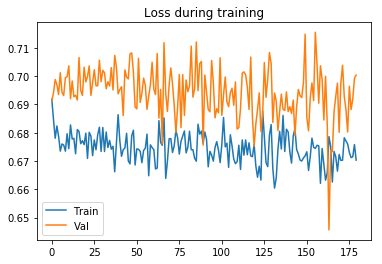

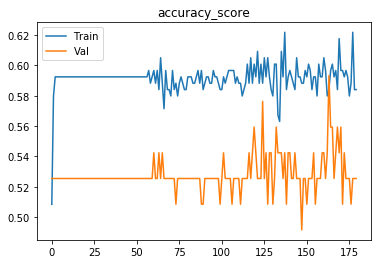

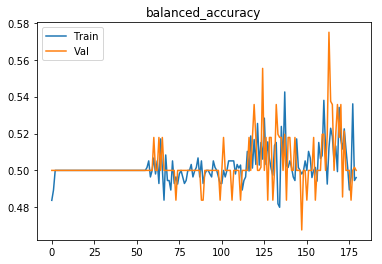

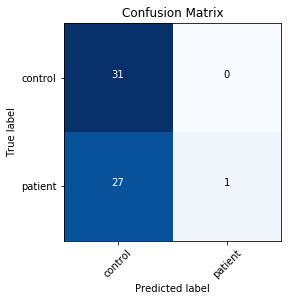

Finished outer fold.
{'final_acc': 0.6088709677419355, 'best_acc': 0.6624423963133641, 'final_iter': 202, 'best_iter': 155, 'params': {'model': 'ModelLiu', 'batch_size': 16, 'patience': 12, 'lr': 0.0001}, 'inner_fold_idx': 0}
###### Starting outer fold 6
238
59
Shuffled the data..
###### Starting inner fold 0
{'model': 'ModelLiu', 'batch_size': 12, 'patience': 16, 'lr': 5e-05}
Trainable model parameters: 116001
torch.Size([1, 72, 57, 75])


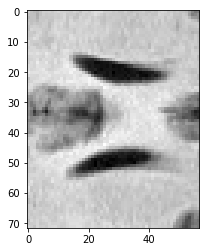

[0,     5] loss: 0.70026
[0,    10] loss: 0.70232
[0,    15] loss: 0.69598
Time elapsed: 0h:0m:22s
train accuracy_score: 44.96 %
train balanced_accuracy: 49.15 %
val accuracy_score: 50.85 %
val balanced_accuracy: 50.00 %
Val loss: 0.691297
[1,     5] loss: 0.69794
[1,    10] loss: 0.69058
[1,    15] loss: 0.69105
Time elapsed: 0h:1m:4s
train accuracy_score: 45.80 %
train balanced_accuracy: 45.61 %
val accuracy_score: 49.15 %
val balanced_accuracy: 49.94 %
Val loss: 0.693966
[2,     5] loss: 0.68395
[2,    10] loss: 0.68934
[2,    15] loss: 0.69419
Time elapsed: 0h:1m:48s
train accuracy_score: 53.78 %
train balanced_accuracy: 50.56 %
val accuracy_score: 49.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.694833
[3,     5] loss: 0.68801
[3,    10] loss: 0.69666
[3,    15] loss: 0.68797
Time elapsed: 0h:2m:32s
train accuracy_score: 53.78 %
train balanced_accuracy: 50.01 %
val accuracy_score: 49.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.693818
[4,     5] loss: 0.68343
[4,    10] loss:

[34,     5] loss: 0.68797
[34,    10] loss: 0.70416
[34,    15] loss: 0.68782
Time elapsed: 0h:24m:50s
train accuracy_score: 52.94 %
train balanced_accuracy: 48.62 %
val accuracy_score: 49.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.691912
[35,     5] loss: 0.69239
[35,    10] loss: 0.70973
[35,    15] loss: 0.69095
Time elapsed: 0h:25m:34s
train accuracy_score: 54.20 %
train balanced_accuracy: 49.93 %
val accuracy_score: 49.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.697995
[36,     5] loss: 0.70370
[36,    10] loss: 0.67445
[36,    15] loss: 0.68523
Time elapsed: 0h:26m:17s
train accuracy_score: 54.62 %
train balanced_accuracy: 50.47 %
val accuracy_score: 49.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.696583
[37,     5] loss: 0.68789
[37,    10] loss: 0.69077
[37,    15] loss: 0.68779
Time elapsed: 0h:27m:0s
train accuracy_score: 55.04 %
train balanced_accuracy: 50.54 %
val accuracy_score: 49.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.699163
[38,     5] loss: 0.68941

val accuracy_score: 49.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.698832
[68,     5] loss: 0.67217
[68,    10] loss: 0.69398
[68,    15] loss: 0.70217
Time elapsed: 0h:49m:18s
train accuracy_score: 53.78 %
train balanced_accuracy: 49.31 %
val accuracy_score: 49.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.700514
[69,     5] loss: 0.68517
[69,    10] loss: 0.69928
[69,    15] loss: 0.68288
Time elapsed: 0h:50m:1s
train accuracy_score: 52.52 %
train balanced_accuracy: 48.39 %
val accuracy_score: 49.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.694772
[70,     5] loss: 0.67606
[70,    10] loss: 0.69354
[70,    15] loss: 0.71389
Time elapsed: 0h:50m:44s
train accuracy_score: 52.10 %
train balanced_accuracy: 48.08 %
val accuracy_score: 49.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.698614
[71,     5] loss: 0.69443
[71,    10] loss: 0.69488
[71,    15] loss: 0.68990
Time elapsed: 0h:51m:27s
train accuracy_score: 51.68 %
train balanced_accuracy: 48.25 %
val accuracy_score: 47.46

Time elapsed: 1h:13m:13s
train accuracy_score: 52.52 %
train balanced_accuracy: 48.23 %
val accuracy_score: 49.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.696239
[102,     5] loss: 0.68437
[102,    10] loss: 0.70199
[102,    15] loss: 0.67340
Time elapsed: 1h:14m:0s
train accuracy_score: 57.14 %
train balanced_accuracy: 53.64 %
val accuracy_score: 50.85 %
val balanced_accuracy: 51.67 %
Val loss: 0.690671
[103,     5] loss: 0.66918
[103,    10] loss: 0.69167
[103,    15] loss: 0.71303
Time elapsed: 1h:14m:45s
train accuracy_score: 54.62 %
train balanced_accuracy: 50.78 %
val accuracy_score: 49.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.692850
[104,     5] loss: 0.66890
[104,    10] loss: 0.66988
[104,    15] loss: 0.72268
Time elapsed: 1h:15m:32s
train accuracy_score: 55.88 %
train balanced_accuracy: 52.09 %
val accuracy_score: 50.85 %
val balanced_accuracy: 51.67 %
Val loss: 0.692686
[105,     5] loss: 0.68546
[105,    10] loss: 0.68966
[105,    15] loss: 0.69811
Time elapsed:

val accuracy_score: 49.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.696217
[135,     5] loss: 0.71901
[135,    10] loss: 0.67569
[135,    15] loss: 0.68827
Time elapsed: 1h:40m:44s
train accuracy_score: 55.88 %
train balanced_accuracy: 53.50 %
val accuracy_score: 52.54 %
val balanced_accuracy: 53.28 %
Val loss: 0.695721
[136,     5] loss: 0.68300
[136,    10] loss: 0.65616
[136,    15] loss: 0.66536
Time elapsed: 1h:41m:38s
train accuracy_score: 58.82 %
train balanced_accuracy: 55.65 %
val accuracy_score: 49.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.695840
[137,     5] loss: 0.71269
[137,    10] loss: 0.66381
[137,    15] loss: 0.67129
Time elapsed: 1h:42m:21s
train accuracy_score: 53.78 %
train balanced_accuracy: 50.01 %
val accuracy_score: 50.85 %
val balanced_accuracy: 51.67 %
Val loss: 0.687644
[138,     5] loss: 0.67401
[138,    10] loss: 0.66497
[138,    15] loss: 0.65815
Time elapsed: 1h:43m:3s
train accuracy_score: 57.56 %
train balanced_accuracy: 53.79 %
val accuracy_

[168,     5] loss: 0.70145
[168,    10] loss: 0.67877
[168,    15] loss: 0.67670
Time elapsed: 2h:4m:23s
train accuracy_score: 55.46 %
train balanced_accuracy: 53.98 %
val accuracy_score: 59.32 %
val balanced_accuracy: 59.89 %
Val loss: 0.679846
[169,     5] loss: 0.68907
[169,    10] loss: 0.67892
[169,    15] loss: 0.66993
Time elapsed: 2h:5m:6s
train accuracy_score: 55.04 %
train balanced_accuracy: 52.58 %
val accuracy_score: 54.24 %
val balanced_accuracy: 54.94 %
Val loss: 0.693013
[170,     5] loss: 0.66142
[170,    10] loss: 0.69741
[170,    15] loss: 0.68632
Time elapsed: 2h:5m:49s
train accuracy_score: 54.20 %
train balanced_accuracy: 51.10 %
val accuracy_score: 47.46 %
val balanced_accuracy: 48.16 %
Val loss: 0.690584
[171,     5] loss: 0.66817
[171,    10] loss: 0.67356
[171,    15] loss: 0.68016
Time elapsed: 2h:6m:33s
train accuracy_score: 60.92 %
train balanced_accuracy: 59.45 %
val accuracy_score: 49.15 %
val balanced_accuracy: 49.83 %
Val loss: 0.694227
[172,     5] loss

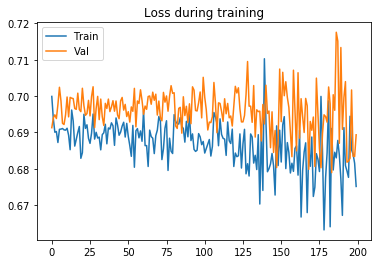

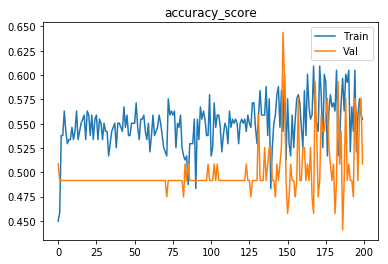

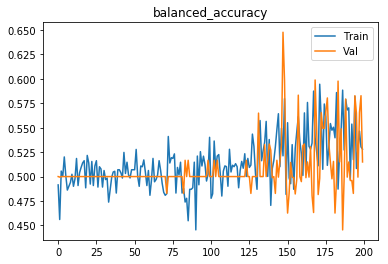

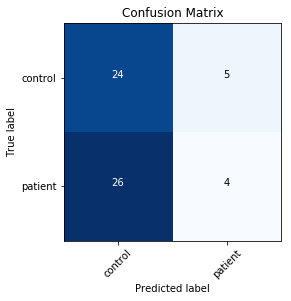

###### Starting inner fold 1
{'model': 'ModelLiu', 'batch_size': 12, 'patience': 16, 'lr': 5e-05}
Trainable model parameters: 116001
torch.Size([1, 72, 57, 75])


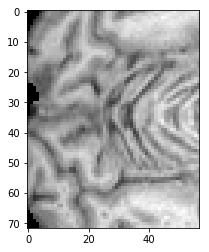

[0,     5] loss: 0.69775
[0,    10] loss: 0.69225
[0,    15] loss: 0.68748
Time elapsed: 0h:0m:22s
train accuracy_score: 52.10 %
train balanced_accuracy: 52.94 %
val accuracy_score: 49.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.691809
[1,     5] loss: 0.69349
[1,    10] loss: 0.69260
[1,    15] loss: 0.69910
Time elapsed: 0h:1m:5s
train accuracy_score: 51.68 %
train balanced_accuracy: 47.93 %
val accuracy_score: 49.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.692205
[2,     5] loss: 0.68599
[2,    10] loss: 0.68903
[2,    15] loss: 0.69907
Time elapsed: 0h:1m:49s
train accuracy_score: 54.62 %
train balanced_accuracy: 50.47 %
val accuracy_score: 49.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.695342
[3,     5] loss: 0.67971
[3,    10] loss: 0.69172
[3,    15] loss: 0.69927
Time elapsed: 0h:2m:32s
train accuracy_score: 54.20 %
train balanced_accuracy: 49.69 %
val accuracy_score: 49.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.699667
[4,     5] loss: 0.70018
[4,    10] loss:

[34,     5] loss: 0.68830
[34,    10] loss: 0.69100
[34,    15] loss: 0.68086
Time elapsed: 0h:25m:0s
train accuracy_score: 55.04 %
train balanced_accuracy: 50.46 %
val accuracy_score: 49.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.694854
[35,     5] loss: 0.68651
[35,    10] loss: 0.69008
[35,    15] loss: 0.66984
Time elapsed: 0h:25m:43s
train accuracy_score: 54.62 %
train balanced_accuracy: 50.24 %
val accuracy_score: 49.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.698495
[36,     5] loss: 0.67367
[36,    10] loss: 0.69120
[36,    15] loss: 0.67469
Time elapsed: 0h:26m:26s
train accuracy_score: 55.46 %
train balanced_accuracy: 50.93 %
val accuracy_score: 49.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.698168
[37,     5] loss: 0.67154
[37,    10] loss: 0.71258
[37,    15] loss: 0.70532
Time elapsed: 0h:27m:9s
train accuracy_score: 55.04 %
train balanced_accuracy: 50.46 %
val accuracy_score: 49.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.702186
[38,     5] loss: 0.70187


val accuracy_score: 49.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.697539
[68,     5] loss: 0.69237
[68,    10] loss: 0.68827
[68,    15] loss: 0.68609
Time elapsed: 0h:49m:42s
train accuracy_score: 55.04 %
train balanced_accuracy: 50.46 %
val accuracy_score: 49.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.698211
[69,     5] loss: 0.68649
[69,    10] loss: 0.68351
[69,    15] loss: 0.68291
Time elapsed: 0h:50m:26s
train accuracy_score: 54.62 %
train balanced_accuracy: 50.00 %
val accuracy_score: 49.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.707407
[70,     5] loss: 0.70245
[70,    10] loss: 0.65691
[70,    15] loss: 0.70257
Time elapsed: 0h:51m:8s
train accuracy_score: 54.20 %
train balanced_accuracy: 49.62 %
val accuracy_score: 49.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.704507
[71,     5] loss: 0.68332
[71,    10] loss: 0.68410
[71,    15] loss: 0.70131
Time elapsed: 0h:51m:51s
train accuracy_score: 55.04 %
train balanced_accuracy: 50.46 %
val accuracy_score: 49.15

Time elapsed: 1h:13m:37s
train accuracy_score: 55.04 %
train balanced_accuracy: 51.09 %
val accuracy_score: 49.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.702784
[102,     5] loss: 0.69743
[102,    10] loss: 0.67478
[102,    15] loss: 0.66499
Time elapsed: 1h:14m:21s
train accuracy_score: 53.78 %
train balanced_accuracy: 49.31 %
val accuracy_score: 49.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.703892
[103,     5] loss: 0.68680
[103,    10] loss: 0.68047
[103,    15] loss: 0.68292
Time elapsed: 1h:15m:6s
train accuracy_score: 54.62 %
train balanced_accuracy: 50.16 %
val accuracy_score: 49.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.707366
[104,     5] loss: 0.69477
[104,    10] loss: 0.68797
[104,    15] loss: 0.68548
Time elapsed: 1h:15m:52s
train accuracy_score: 54.62 %
train balanced_accuracy: 51.02 %
val accuracy_score: 47.46 %
val balanced_accuracy: 48.28 %
Val loss: 0.695574
[105,     5] loss: 0.68888
[105,    10] loss: 0.69832
[105,    15] loss: 0.66579
Time elapsed:

val accuracy_score: 50.85 %
val balanced_accuracy: 51.61 %
Val loss: 0.695959
[135,     5] loss: 0.70108
[135,    10] loss: 0.68507
[135,    15] loss: 0.68877
Time elapsed: 1h:38m:28s
train accuracy_score: 54.20 %
train balanced_accuracy: 50.95 %
val accuracy_score: 49.15 %
val balanced_accuracy: 49.94 %
Val loss: 0.687390
[136,     5] loss: 0.69436
[136,    10] loss: 0.69103
[136,    15] loss: 0.68306
Time elapsed: 1h:39m:10s
train accuracy_score: 55.46 %
train balanced_accuracy: 52.02 %
val accuracy_score: 47.46 %
val balanced_accuracy: 48.28 %
Val loss: 0.695931
[137,     5] loss: 0.70388
[137,    10] loss: 0.68897
[137,    15] loss: 0.68601
Time elapsed: 1h:39m:51s
train accuracy_score: 52.52 %
train balanced_accuracy: 48.78 %
val accuracy_score: 49.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.704862
[138,     5] loss: 0.68363
[138,    10] loss: 0.65596
[138,    15] loss: 0.69565
Time elapsed: 1h:40m:33s
train accuracy_score: 56.72 %
train balanced_accuracy: 52.55 %
val accuracy

[168,     5] loss: 0.70928
[168,    10] loss: 0.68358
[168,    15] loss: 0.66752
Time elapsed: 2h:2m:18s
train accuracy_score: 52.94 %
train balanced_accuracy: 50.03 %
val accuracy_score: 50.85 %
val balanced_accuracy: 51.67 %
Val loss: 0.699360
[169,     5] loss: 0.67195
[169,    10] loss: 0.65200
[169,    15] loss: 0.68337
Time elapsed: 2h:3m:2s
train accuracy_score: 54.20 %
train balanced_accuracy: 50.01 %
val accuracy_score: 50.85 %
val balanced_accuracy: 51.67 %
Val loss: 0.696517
[170,     5] loss: 0.68527
[170,    10] loss: 0.67258
[170,    15] loss: 0.69164
Time elapsed: 2h:3m:46s
train accuracy_score: 57.14 %
train balanced_accuracy: 53.95 %
val accuracy_score: 49.15 %
val balanced_accuracy: 49.89 %
Val loss: 0.694209
[171,     5] loss: 0.64866
[171,    10] loss: 0.67500
[171,    15] loss: 0.68424
Time elapsed: 2h:4m:29s
train accuracy_score: 56.72 %
train balanced_accuracy: 53.73 %
val accuracy_score: 40.68 %
val balanced_accuracy: 41.32 %
Val loss: 0.707554
[172,     5] loss

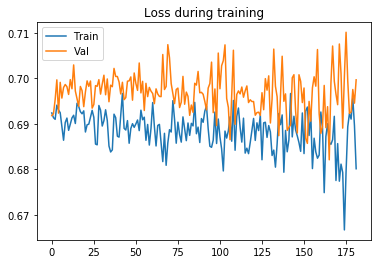

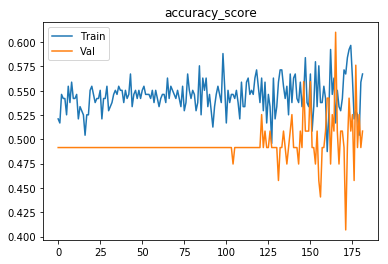

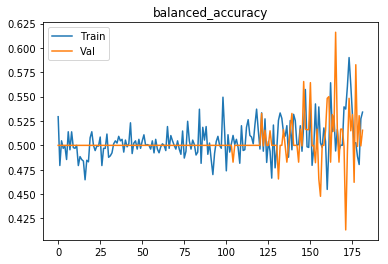

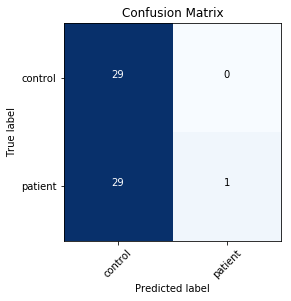

###### Starting inner fold 2
{'model': 'ModelLiu', 'batch_size': 32, 'patience': 16, 'lr': 0.0001}
Trainable model parameters: 116001
torch.Size([1, 72, 57, 75])


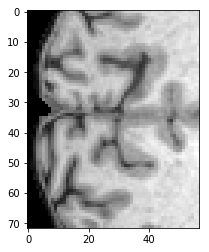

[0,     5] loss: 0.69098
Time elapsed: 0h:0m:23s
train accuracy_score: 54.62 %
train balanced_accuracy: 50.00 %
val accuracy_score: 49.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.697309
[1,     5] loss: 0.68689
Time elapsed: 0h:1m:7s
train accuracy_score: 54.62 %
train balanced_accuracy: 50.00 %
val accuracy_score: 49.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.701924
[2,     5] loss: 0.68791
Time elapsed: 0h:1m:52s
train accuracy_score: 54.62 %
train balanced_accuracy: 50.00 %
val accuracy_score: 49.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.699914
[3,     5] loss: 0.68830
Time elapsed: 0h:2m:37s
train accuracy_score: 54.62 %
train balanced_accuracy: 50.00 %
val accuracy_score: 49.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.695500
[4,     5] loss: 0.69040
Time elapsed: 0h:3m:21s
train accuracy_score: 54.62 %
train balanced_accuracy: 50.00 %
val accuracy_score: 49.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.697994
[5,     5] loss: 0.68297
Time elapsed: 0h:4m:5s
tra

[43,     5] loss: 0.68919
Time elapsed: 0h:32m:44s
train accuracy_score: 54.62 %
train balanced_accuracy: 50.00 %
val accuracy_score: 49.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.699119
[44,     5] loss: 0.69205
Time elapsed: 0h:33m:29s
train accuracy_score: 55.04 %
train balanced_accuracy: 50.54 %
val accuracy_score: 49.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.694896
[45,     5] loss: 0.68730
Time elapsed: 0h:34m:16s
train accuracy_score: 55.04 %
train balanced_accuracy: 50.46 %
val accuracy_score: 49.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.698296
[46,     5] loss: 0.68852
Time elapsed: 0h:35m:2s
train accuracy_score: 54.62 %
train balanced_accuracy: 50.08 %
val accuracy_score: 49.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.697285
[47,     5] loss: 0.68714
Time elapsed: 0h:35m:49s
train accuracy_score: 54.62 %
train balanced_accuracy: 50.08 %
val accuracy_score: 49.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.701235
[48,     5] loss: 0.69432
Time elapsed: 0

[86,     5] loss: 0.68480
Time elapsed: 1h:5m:17s
train accuracy_score: 58.40 %
train balanced_accuracy: 55.73 %
val accuracy_score: 40.68 %
val balanced_accuracy: 41.15 %
Val loss: 0.707259
[87,     5] loss: 0.66882
Time elapsed: 1h:6m:2s
train accuracy_score: 60.50 %
train balanced_accuracy: 58.99 %
val accuracy_score: 49.15 %
val balanced_accuracy: 49.89 %
Val loss: 0.719904
[88,     5] loss: 0.68574
Time elapsed: 1h:6m:47s
train accuracy_score: 55.46 %
train balanced_accuracy: 51.79 %
val accuracy_score: 49.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.706324
[89,     5] loss: 0.68124
Time elapsed: 1h:7m:32s
train accuracy_score: 54.20 %
train balanced_accuracy: 51.03 %
val accuracy_score: 44.07 %
val balanced_accuracy: 44.77 %
Val loss: 0.704461
[90,     5] loss: 0.68952
Time elapsed: 1h:8m:17s
train accuracy_score: 55.04 %
train balanced_accuracy: 52.26 %
val accuracy_score: 45.76 %
val balanced_accuracy: 46.32 %
Val loss: 0.697461
[91,     5] loss: 0.68549
Time elapsed: 1h:9m:

[129,     5] loss: 0.68983
Time elapsed: 1h:37m:42s
train accuracy_score: 59.66 %
train balanced_accuracy: 56.65 %
val accuracy_score: 55.93 %
val balanced_accuracy: 56.44 %
Val loss: 0.703420
[130,     5] loss: 0.67946
Time elapsed: 1h:38m:27s
train accuracy_score: 57.14 %
train balanced_accuracy: 54.42 %
val accuracy_score: 47.46 %
val balanced_accuracy: 47.82 %
Val loss: 0.689708
[131,     5] loss: 0.68960
Time elapsed: 1h:39m:12s
train accuracy_score: 52.94 %
train balanced_accuracy: 50.58 %
val accuracy_score: 59.32 %
val balanced_accuracy: 59.66 %
Val loss: 0.679932
[132,     5] loss: 0.69049
Time elapsed: 1h:39m:57s
train accuracy_score: 52.10 %
train balanced_accuracy: 51.06 %
val accuracy_score: 54.24 %
val balanced_accuracy: 54.60 %
Val loss: 0.695477
[133,     5] loss: 0.68181
Time elapsed: 1h:40m:42s
train accuracy_score: 56.72 %
train balanced_accuracy: 54.82 %
val accuracy_score: 54.24 %
val balanced_accuracy: 54.89 %
Val loss: 0.697063
[134,     5] loss: 0.68243
Time ela

val accuracy_score: 54.24 %
val balanced_accuracy: 54.43 %
Val loss: 0.685354
[172,     5] loss: 0.68006
Time elapsed: 2h:10m:1s
train accuracy_score: 57.14 %
train balanced_accuracy: 55.68 %
val accuracy_score: 61.02 %
val balanced_accuracy: 61.49 %
Val loss: 0.677545
[173,     5] loss: 0.65525
Time elapsed: 2h:10m:46s
train accuracy_score: 59.24 %
train balanced_accuracy: 56.74 %
val accuracy_score: 45.76 %
val balanced_accuracy: 46.21 %
Val loss: 0.707129
[174,     5] loss: 0.67516
Time elapsed: 2h:11m:30s
train accuracy_score: 57.14 %
train balanced_accuracy: 54.74 %
val accuracy_score: 55.93 %
val balanced_accuracy: 56.09 %
Val loss: 0.694708
[175,     5] loss: 0.66460
Time elapsed: 2h:12m:15s
train accuracy_score: 55.04 %
train balanced_accuracy: 53.99 %
val accuracy_score: 59.32 %
val balanced_accuracy: 59.66 %
Val loss: 0.671561
[176,     5] loss: 0.68003
Time elapsed: 2h:13m:1s
train accuracy_score: 52.52 %
train balanced_accuracy: 51.05 %
val accuracy_score: 64.41 %
val balan

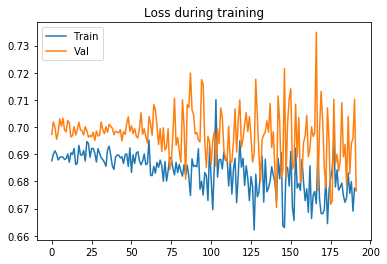

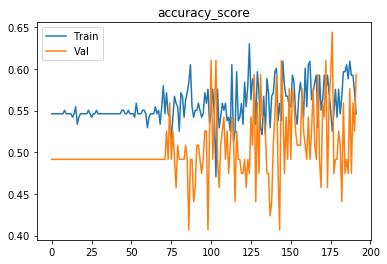

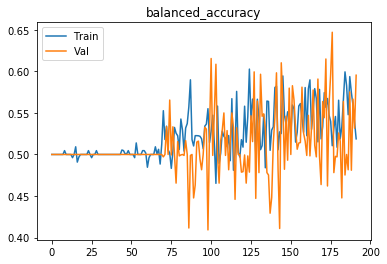

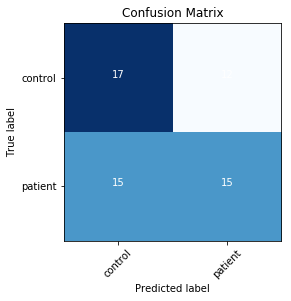

###### Starting inner fold 3
{'model': 'ModelLiu', 'batch_size': 12, 'patience': 16, 'lr': 5e-05}
Trainable model parameters: 116001
torch.Size([1, 72, 57, 75])


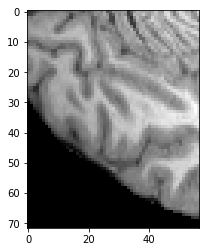

[0,     5] loss: 0.69393
[0,    10] loss: 0.69089
[0,    15] loss: 0.68908
Time elapsed: 0h:0m:22s
train accuracy_score: 54.62 %
train balanced_accuracy: 53.53 %
val accuracy_score: 49.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.693141
[1,     5] loss: 0.68824
[1,    10] loss: 0.69396
[1,    15] loss: 0.69102
Time elapsed: 0h:1m:5s
train accuracy_score: 54.20 %
train balanced_accuracy: 49.77 %
val accuracy_score: 49.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.695384
[2,     5] loss: 0.69915
[2,    10] loss: 0.68639
[2,    15] loss: 0.69163
Time elapsed: 0h:1m:49s
train accuracy_score: 54.62 %
train balanced_accuracy: 50.08 %
val accuracy_score: 49.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.696539
[3,     5] loss: 0.69072
[3,    10] loss: 0.69093
[3,    15] loss: 0.68233
Time elapsed: 0h:2m:33s
train accuracy_score: 55.46 %
train balanced_accuracy: 50.93 %
val accuracy_score: 49.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.697994
[4,     5] loss: 0.69573
[4,    10] loss:

[34,     5] loss: 0.68669
[34,    10] loss: 0.67030
[34,    15] loss: 0.72034
Time elapsed: 0h:24m:52s
train accuracy_score: 54.62 %
train balanced_accuracy: 50.00 %
val accuracy_score: 49.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.696847
[35,     5] loss: 0.69035
[35,    10] loss: 0.67402
[35,    15] loss: 0.71878
Time elapsed: 0h:25m:35s
train accuracy_score: 54.62 %
train balanced_accuracy: 50.00 %
val accuracy_score: 49.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.699402
[36,     5] loss: 0.69664
[36,    10] loss: 0.67918
[36,    15] loss: 0.69564
Time elapsed: 0h:26m:19s
train accuracy_score: 54.62 %
train balanced_accuracy: 50.16 %
val accuracy_score: 49.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.694339
[37,     5] loss: 0.69188
[37,    10] loss: 0.67475
[37,    15] loss: 0.67515
Time elapsed: 0h:27m:2s
train accuracy_score: 55.46 %
train balanced_accuracy: 50.93 %
val accuracy_score: 49.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.704833
[38,     5] loss: 0.68583

val accuracy_score: 49.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.700866
[68,     5] loss: 0.68759
[68,    10] loss: 0.67795
[68,    15] loss: 0.69311
Time elapsed: 0h:49m:28s
train accuracy_score: 55.04 %
train balanced_accuracy: 50.46 %
val accuracy_score: 49.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.697740
[69,     5] loss: 0.68869
[69,    10] loss: 0.68444
[69,    15] loss: 0.69635
Time elapsed: 0h:50m:11s
train accuracy_score: 55.46 %
train balanced_accuracy: 51.00 %
val accuracy_score: 49.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.692240
[70,     5] loss: 0.70278
[70,    10] loss: 0.67348
[70,    15] loss: 0.68922
Time elapsed: 0h:50m:54s
train accuracy_score: 54.62 %
train balanced_accuracy: 50.31 %
val accuracy_score: 49.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.694710
[71,     5] loss: 0.70175
[71,    10] loss: 0.68997
[71,    15] loss: 0.69198
Time elapsed: 0h:51m:37s
train accuracy_score: 52.52 %
train balanced_accuracy: 48.39 %
val accuracy_score: 49.1

Time elapsed: 1h:13m:16s
train accuracy_score: 54.20 %
train balanced_accuracy: 49.77 %
val accuracy_score: 49.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.696544
[102,     5] loss: 0.69708
[102,    10] loss: 0.68433
[102,    15] loss: 0.67768
Time elapsed: 1h:14m:0s
train accuracy_score: 53.36 %
train balanced_accuracy: 48.92 %
val accuracy_score: 49.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.689558
[103,     5] loss: 0.68623
[103,    10] loss: 0.68200
[103,    15] loss: 0.68360
Time elapsed: 1h:14m:43s
train accuracy_score: 55.04 %
train balanced_accuracy: 50.62 %
val accuracy_score: 49.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.696082
[104,     5] loss: 0.69454
[104,    10] loss: 0.67443
[104,    15] loss: 0.67942
Time elapsed: 1h:15m:26s
train accuracy_score: 55.04 %
train balanced_accuracy: 50.70 %
val accuracy_score: 49.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.695238
[105,     5] loss: 0.69870
[105,    10] loss: 0.68198
[105,    15] loss: 0.68990
Time elapsed:

val accuracy_score: 50.85 %
val balanced_accuracy: 51.61 %
Val loss: 0.690163
[135,     5] loss: 0.69597
[135,    10] loss: 0.67811
[135,    15] loss: 0.67193
Time elapsed: 1h:37m:45s
train accuracy_score: 52.94 %
train balanced_accuracy: 50.03 %
val accuracy_score: 45.76 %
val balanced_accuracy: 46.55 %
Val loss: 0.699411
[136,     5] loss: 0.69884
[136,    10] loss: 0.67573
[136,    15] loss: 0.67381
Time elapsed: 1h:38m:28s
train accuracy_score: 55.88 %
train balanced_accuracy: 52.72 %
val accuracy_score: 50.85 %
val balanced_accuracy: 51.44 %
Val loss: 0.694310
[137,     5] loss: 0.67930
[137,    10] loss: 0.68114
[137,    15] loss: 0.69414
Time elapsed: 1h:39m:11s
train accuracy_score: 53.78 %
train balanced_accuracy: 50.01 %
val accuracy_score: 50.85 %
val balanced_accuracy: 51.67 %
Val loss: 0.706524
[138,     5] loss: 0.70617
[138,    10] loss: 0.69126
[138,    15] loss: 0.68235
Time elapsed: 1h:39m:55s
train accuracy_score: 54.20 %
train balanced_accuracy: 51.10 %
val accuracy

[168,     5] loss: 0.68977
[168,    10] loss: 0.66995
[168,    15] loss: 0.69250
Time elapsed: 2h:1m:28s
train accuracy_score: 54.20 %
train balanced_accuracy: 50.71 %
val accuracy_score: 47.46 %
val balanced_accuracy: 48.28 %
Val loss: 0.699301
[169,     5] loss: 0.68901
[169,    10] loss: 0.70042
[169,    15] loss: 0.67961
Time elapsed: 2h:2m:12s
train accuracy_score: 51.26 %
train balanced_accuracy: 48.02 %
val accuracy_score: 49.15 %
val balanced_accuracy: 49.89 %
Val loss: 0.688716
[170,     5] loss: 0.68621
[170,    10] loss: 0.68037
[170,    15] loss: 0.67763
Time elapsed: 2h:2m:55s
train accuracy_score: 55.04 %
train balanced_accuracy: 51.79 %
val accuracy_score: 55.93 %
val balanced_accuracy: 56.67 %
Val loss: 0.697271
[171,     5] loss: 0.67958
[171,    10] loss: 0.66271
[171,    15] loss: 0.69927
Time elapsed: 2h:3m:38s
train accuracy_score: 54.62 %
train balanced_accuracy: 50.78 %
val accuracy_score: 49.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.705858
[172,     5] los

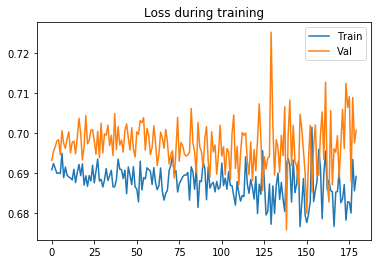

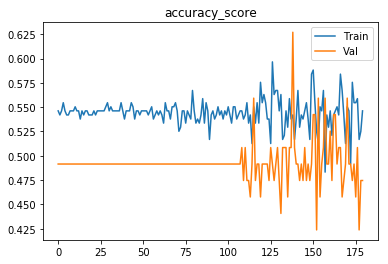

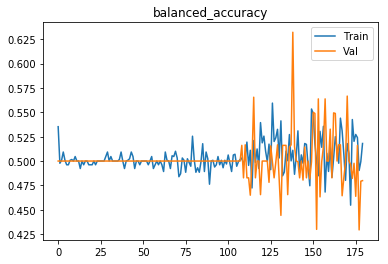

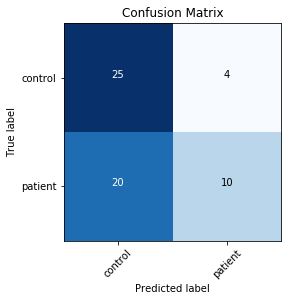

###### Starting inner fold 4
{'model': 'ModelLiu', 'batch_size': 12, 'patience': 12, 'lr': 5e-05}
Trainable model parameters: 116001
torch.Size([1, 72, 57, 75])


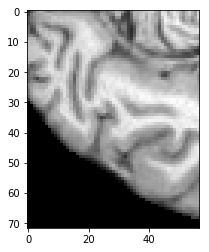

[0,     5] loss: 0.70162
[0,    10] loss: 0.70283
[0,    15] loss: 0.69046
Time elapsed: 0h:0m:21s
train accuracy_score: 42.86 %
train balanced_accuracy: 45.58 %
val accuracy_score: 49.15 %
val balanced_accuracy: 48.97 %
Val loss: 0.694758
[1,     5] loss: 0.68953
[1,    10] loss: 0.69242
[1,    15] loss: 0.69433
Time elapsed: 0h:1m:5s
train accuracy_score: 51.26 %
train balanced_accuracy: 50.84 %
val accuracy_score: 49.15 %
val balanced_accuracy: 49.94 %
Val loss: 0.692419
[2,     5] loss: 0.69642
[2,    10] loss: 0.68002
[2,    15] loss: 0.69575
Time elapsed: 0h:1m:48s
train accuracy_score: 48.74 %
train balanced_accuracy: 45.63 %
val accuracy_score: 50.85 %
val balanced_accuracy: 51.67 %
Val loss: 0.691092
[3,     5] loss: 0.69578
[3,    10] loss: 0.68340
[3,    15] loss: 0.69285
Time elapsed: 0h:2m:31s
train accuracy_score: 47.06 %
train balanced_accuracy: 43.94 %
val accuracy_score: 47.46 %
val balanced_accuracy: 48.28 %
Val loss: 0.694855
[4,     5] loss: 0.69051
[4,    10] loss:

[34,     5] loss: 0.68197
[34,    10] loss: 0.70023
[34,    15] loss: 0.70384
Time elapsed: 0h:24m:50s
train accuracy_score: 52.52 %
train balanced_accuracy: 48.31 %
val accuracy_score: 49.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.690236
[35,     5] loss: 0.69807
[35,    10] loss: 0.68586
[35,    15] loss: 0.68000
Time elapsed: 0h:25m:33s
train accuracy_score: 54.62 %
train balanced_accuracy: 50.78 %
val accuracy_score: 49.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.695535
[36,     5] loss: 0.68460
[36,    10] loss: 0.69602
[36,    15] loss: 0.71784
Time elapsed: 0h:26m:16s
train accuracy_score: 54.20 %
train balanced_accuracy: 49.93 %
val accuracy_score: 49.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.699909
[37,     5] loss: 0.70495
[37,    10] loss: 0.69446
[37,    15] loss: 0.69212
Time elapsed: 0h:26m:59s
train accuracy_score: 51.68 %
train balanced_accuracy: 47.70 %
val accuracy_score: 49.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.694955
[38,     5] loss: 0.6902

val accuracy_score: 49.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.697439
[68,     5] loss: 0.68293
[68,    10] loss: 0.69793
[68,    15] loss: 0.67892
Time elapsed: 0h:49m:17s
train accuracy_score: 54.20 %
train balanced_accuracy: 49.77 %
val accuracy_score: 49.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.701156
[69,     5] loss: 0.70667
[69,    10] loss: 0.67393
[69,    15] loss: 0.67919
Time elapsed: 0h:50m:0s
train accuracy_score: 56.72 %
train balanced_accuracy: 52.86 %
val accuracy_score: 49.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.693361
[70,     5] loss: 0.69733
[70,    10] loss: 0.68963
[70,    15] loss: 0.67121
Time elapsed: 0h:50m:43s
train accuracy_score: 54.62 %
train balanced_accuracy: 51.25 %
val accuracy_score: 49.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.694530
[71,     5] loss: 0.67121
[71,    10] loss: 0.68248
[71,    15] loss: 0.69975
Time elapsed: 0h:51m:27s
train accuracy_score: 57.14 %
train balanced_accuracy: 52.86 %
val accuracy_score: 49.15

Time elapsed: 1h:13m:0s
train accuracy_score: 52.10 %
train balanced_accuracy: 48.24 %
val accuracy_score: 49.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.696127
[102,     5] loss: 0.67027
[102,    10] loss: 0.65708
[102,    15] loss: 0.71393
Time elapsed: 1h:13m:43s
train accuracy_score: 55.88 %
train balanced_accuracy: 52.02 %
val accuracy_score: 47.46 %
val balanced_accuracy: 48.28 %
Val loss: 0.700761
[103,     5] loss: 0.68841
[103,    10] loss: 0.68939
[103,    15] loss: 0.70763
Time elapsed: 1h:14m:25s
train accuracy_score: 52.94 %
train balanced_accuracy: 50.50 %
val accuracy_score: 59.32 %
val balanced_accuracy: 59.83 %
Val loss: 0.676369
[104,     5] loss: 0.67965
[104,    10] loss: 0.71167
[104,    15] loss: 0.69196
Time elapsed: 1h:15m:7s
train accuracy_score: 54.62 %
train balanced_accuracy: 51.41 %
val accuracy_score: 49.15 %
val balanced_accuracy: 49.94 %
Val loss: 0.689080
[105,     5] loss: 0.68919
[105,    10] loss: 0.67592
[105,    15] loss: 0.68204
Time elapsed: 

val accuracy_score: 52.54 %
val balanced_accuracy: 53.22 %
Val loss: 0.682618
[135,     5] loss: 0.68723
[135,    10] loss: 0.67799
[135,    15] loss: 0.66732
Time elapsed: 1h:37m:12s
train accuracy_score: 57.14 %
train balanced_accuracy: 54.50 %
val accuracy_score: 47.46 %
val balanced_accuracy: 48.16 %
Val loss: 0.689396
[136,     5] loss: 0.69006
[136,    10] loss: 0.66587
[136,    15] loss: 0.67803
Time elapsed: 1h:37m:56s
train accuracy_score: 55.88 %
train balanced_accuracy: 52.49 %
val accuracy_score: 52.54 %
val balanced_accuracy: 53.33 %
Val loss: 0.670177
[137,     5] loss: 0.66217
[137,    10] loss: 0.66406
[137,    15] loss: 0.69653
Time elapsed: 1h:38m:39s
train accuracy_score: 55.04 %
train balanced_accuracy: 51.95 %
val accuracy_score: 50.85 %
val balanced_accuracy: 51.15 %
Val loss: 0.681033
[138,     5] loss: 0.67746
[138,    10] loss: 0.67682
[138,    15] loss: 0.69292
Time elapsed: 1h:39m:23s
train accuracy_score: 58.82 %
train balanced_accuracy: 57.45 %
val accuracy

[168,     5] loss: 0.68650
[168,    10] loss: 0.66912
[168,    15] loss: 0.67799
Time elapsed: 2h:0m:54s
train accuracy_score: 55.46 %
train balanced_accuracy: 53.43 %
val accuracy_score: 50.85 %
val balanced_accuracy: 51.32 %
Val loss: 0.681452
[169,     5] loss: 0.66178
[169,    10] loss: 0.69618
[169,    15] loss: 0.66216
Time elapsed: 2h:1m:38s
train accuracy_score: 58.40 %
train balanced_accuracy: 55.73 %
val accuracy_score: 45.76 %
val balanced_accuracy: 46.32 %
Val loss: 0.707555
[170,     5] loss: 0.66357
[170,    10] loss: 0.67096
[170,    15] loss: 0.65554
Time elapsed: 2h:2m:21s
train accuracy_score: 57.98 %
train balanced_accuracy: 55.66 %
val accuracy_score: 62.71 %
val balanced_accuracy: 63.16 %
Val loss: 0.673952
[171,     5] loss: 0.67558
[171,    10] loss: 0.66157
[171,    15] loss: 0.66968
Time elapsed: 2h:3m:4s
train accuracy_score: 54.62 %
train balanced_accuracy: 52.74 %
val accuracy_score: 59.32 %
val balanced_accuracy: 59.94 %
Val loss: 0.664243
[172,     5] loss

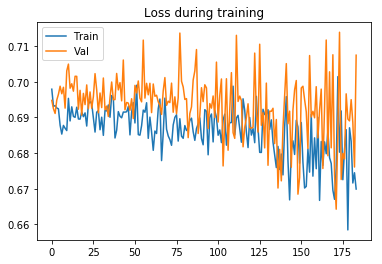

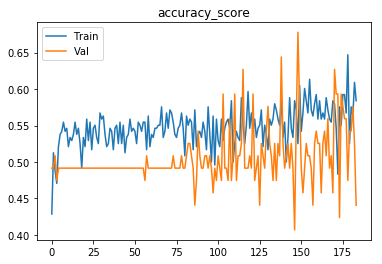

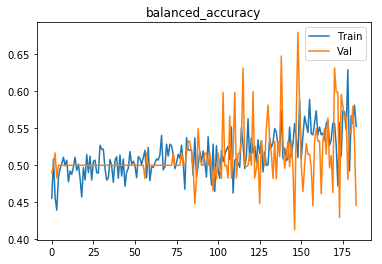

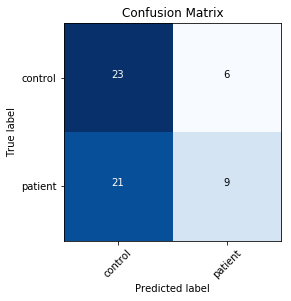

Finished outer fold.
{'final_acc': 0.59540229885057472, 'best_acc': 0.64712643678160919, 'final_iter': 192, 'best_iter': 177, 'params': {'model': 'ModelLiu', 'batch_size': 32, 'patience': 16, 'lr': 0.0001}, 'inner_fold_idx': 2}
###### Starting outer fold 7
238
59
Shuffled the data..
###### Starting inner fold 0
{'model': 'ModelLiu', 'batch_size': 16, 'patience': 12, 'lr': 5e-05}
Trainable model parameters: 116001
torch.Size([1, 72, 57, 75])


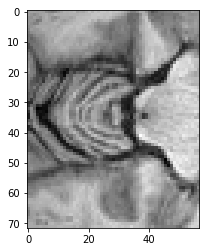

[0,     5] loss: 0.69826
[0,    10] loss: 0.68984
Time elapsed: 0h:0m:23s
train accuracy_score: 53.78 %
train balanced_accuracy: 56.07 %
val accuracy_score: 40.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.695066
[1,     5] loss: 0.69337
[1,    10] loss: 0.69284
Time elapsed: 0h:1m:7s
train accuracy_score: 52.52 %
train balanced_accuracy: 52.90 %
val accuracy_score: 57.63 %
val balanced_accuracy: 49.23 %
Val loss: 0.691561
[2,     5] loss: 0.68763
[2,    10] loss: 0.69421
Time elapsed: 0h:1m:52s
train accuracy_score: 52.94 %
train balanced_accuracy: 50.63 %
val accuracy_score: 59.32 %
val balanced_accuracy: 50.00 %
Val loss: 0.685464
[3,     5] loss: 0.69003
[3,    10] loss: 0.69552
Time elapsed: 0h:2m:37s
train accuracy_score: 53.36 %
train balanced_accuracy: 50.40 %
val accuracy_score: 59.32 %
val balanced_accuracy: 50.00 %
Val loss: 0.683836
[4,     5] loss: 0.70290
[4,    10] loss: 0.68821
Time elapsed: 0h:3m:21s
train accuracy_score: 53.36 %
train balanced_accuracy: 50.28 %
val 

[38,     5] loss: 0.69079
[38,    10] loss: 0.68883
Time elapsed: 0h:28m:38s
train accuracy_score: 50.00 %
train balanced_accuracy: 47.13 %
val accuracy_score: 59.32 %
val balanced_accuracy: 50.00 %
Val loss: 0.684072
[39,     5] loss: 0.68757
[39,    10] loss: 0.68120
Time elapsed: 0h:29m:22s
train accuracy_score: 53.36 %
train balanced_accuracy: 50.34 %
val accuracy_score: 59.32 %
val balanced_accuracy: 50.00 %
Val loss: 0.683071
[40,     5] loss: 0.68680
[40,    10] loss: 0.69199
Time elapsed: 0h:30m:6s
train accuracy_score: 53.36 %
train balanced_accuracy: 50.34 %
val accuracy_score: 59.32 %
val balanced_accuracy: 50.00 %
Val loss: 0.682003
[41,     5] loss: 0.69244
[41,    10] loss: 0.68378
Time elapsed: 0h:30m:52s
train accuracy_score: 55.04 %
train balanced_accuracy: 51.97 %
val accuracy_score: 59.32 %
val balanced_accuracy: 50.00 %
Val loss: 0.681680
[42,     5] loss: 0.68293
[42,    10] loss: 0.69842
Time elapsed: 0h:31m:37s
train accuracy_score: 55.88 %
train balanced_accurac

val accuracy_score: 55.93 %
val balanced_accuracy: 47.80 %
Val loss: 0.683070
[76,     5] loss: 0.69313
[76,    10] loss: 0.68993
Time elapsed: 0h:56m:50s
train accuracy_score: 54.62 %
train balanced_accuracy: 52.66 %
val accuracy_score: 54.24 %
val balanced_accuracy: 48.99 %
Val loss: 0.693694
[77,     5] loss: 0.67761
[77,    10] loss: 0.69740
Time elapsed: 0h:57m:35s
train accuracy_score: 55.46 %
train balanced_accuracy: 53.61 %
val accuracy_score: 61.02 %
val balanced_accuracy: 54.70 %
Val loss: 0.672441
[78,     5] loss: 0.67552
[78,    10] loss: 0.70847
Time elapsed: 0h:58m:19s
train accuracy_score: 52.94 %
train balanced_accuracy: 50.51 %
val accuracy_score: 59.32 %
val balanced_accuracy: 50.65 %
Val loss: 0.665649
[79,     5] loss: 0.66845
[79,    10] loss: 0.72041
Time elapsed: 0h:59m:3s
train accuracy_score: 52.94 %
train balanced_accuracy: 50.29 %
val accuracy_score: 62.71 %
val balanced_accuracy: 54.82 %
Val loss: 0.669585
[80,     5] loss: 0.68151
[80,    10] loss: 0.69192

Time elapsed: 1h:24m:23s
train accuracy_score: 52.94 %
train balanced_accuracy: 51.25 %
val accuracy_score: 59.32 %
val balanced_accuracy: 53.93 %
Val loss: 0.676918
[114,     5] loss: 0.67501
[114,    10] loss: 0.69510
Time elapsed: 1h:25m:8s
train accuracy_score: 50.84 %
train balanced_accuracy: 49.34 %
val accuracy_score: 61.02 %
val balanced_accuracy: 56.01 %
Val loss: 0.681510
[115,     5] loss: 0.70716
[115,    10] loss: 0.68259
Time elapsed: 1h:25m:52s
train accuracy_score: 53.78 %
train balanced_accuracy: 53.51 %
val accuracy_score: 59.32 %
val balanced_accuracy: 55.89 %
Val loss: 0.676710
[116,     5] loss: 0.68510
[116,    10] loss: 0.67352
Time elapsed: 1h:26m:37s
train accuracy_score: 55.88 %
train balanced_accuracy: 54.12 %
val accuracy_score: 55.93 %
val balanced_accuracy: 47.80 %
Val loss: 0.685127
[117,     5] loss: 0.70412
[117,    10] loss: 0.66379
Time elapsed: 1h:27m:21s
train accuracy_score: 57.14 %
train balanced_accuracy: 54.62 %
val accuracy_score: 64.41 %
val b

val accuracy_score: 55.93 %
val balanced_accuracy: 49.76 %
Val loss: 0.682563
[151,     5] loss: 0.68684
[151,    10] loss: 0.69938
Time elapsed: 1h:52m:37s
train accuracy_score: 52.52 %
train balanced_accuracy: 50.97 %
val accuracy_score: 59.32 %
val balanced_accuracy: 54.58 %
Val loss: 0.679885
[152,     5] loss: 0.68112
[152,    10] loss: 0.67167
Time elapsed: 1h:53m:22s
train accuracy_score: 59.24 %
train balanced_accuracy: 57.61 %
val accuracy_score: 50.85 %
val balanced_accuracy: 44.82 %
Val loss: 0.675311
[153,     5] loss: 0.69825
[153,    10] loss: 0.69905
Time elapsed: 1h:54m:6s
train accuracy_score: 53.36 %
train balanced_accuracy: 52.10 %
val accuracy_score: 55.93 %
val balanced_accuracy: 51.73 %
Val loss: 0.680648
[154,     5] loss: 0.67540
[154,    10] loss: 0.68512
Time elapsed: 1h:54m:51s
train accuracy_score: 52.10 %
train balanced_accuracy: 50.63 %
val accuracy_score: 57.63 %
val balanced_accuracy: 49.23 %
Val loss: 0.670143
[155,     5] loss: 0.68307
[155,    10] los

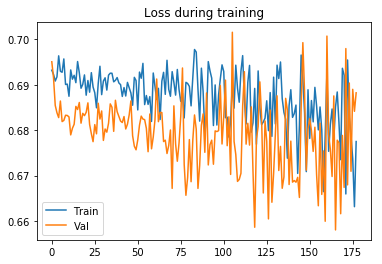

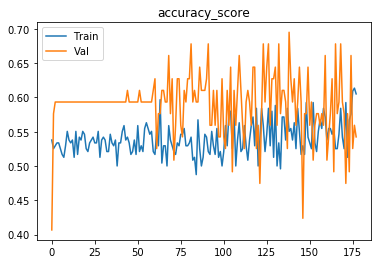

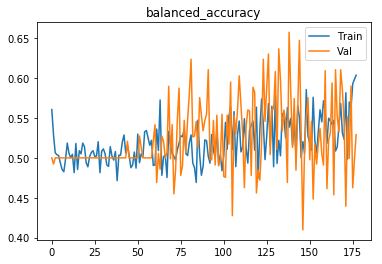

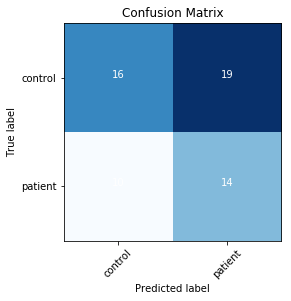

###### Starting inner fold 1
{'model': 'ModelLiu', 'batch_size': 16, 'patience': 12, 'lr': 0.0001}
Trainable model parameters: 116001
torch.Size([1, 72, 57, 75])


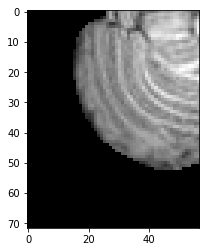

[0,     5] loss: 0.69523
[0,    10] loss: 0.68472
Time elapsed: 0h:0m:23s
train accuracy_score: 53.36 %
train balanced_accuracy: 50.00 %
val accuracy_score: 59.32 %
val balanced_accuracy: 50.00 %
Val loss: 0.678507
[1,     5] loss: 0.70604
[1,    10] loss: 0.67108
Time elapsed: 0h:1m:7s
train accuracy_score: 53.36 %
train balanced_accuracy: 50.00 %
val accuracy_score: 59.32 %
val balanced_accuracy: 50.00 %
Val loss: 0.678992
[2,     5] loss: 0.68285
[2,    10] loss: 0.69410
Time elapsed: 0h:1m:52s
train accuracy_score: 53.36 %
train balanced_accuracy: 50.00 %
val accuracy_score: 59.32 %
val balanced_accuracy: 50.00 %
Val loss: 0.679946
[3,     5] loss: 0.69505
[3,    10] loss: 0.68828
Time elapsed: 0h:2m:37s
train accuracy_score: 52.94 %
train balanced_accuracy: 49.72 %
val accuracy_score: 59.32 %
val balanced_accuracy: 50.00 %
Val loss: 0.685384
[4,     5] loss: 0.69558
[4,    10] loss: 0.68822
Time elapsed: 0h:3m:22s
train accuracy_score: 53.36 %
train balanced_accuracy: 50.00 %
val 

[38,     5] loss: 0.67690
[38,    10] loss: 0.69473
Time elapsed: 0h:28m:42s
train accuracy_score: 54.62 %
train balanced_accuracy: 51.86 %
val accuracy_score: 59.32 %
val balanced_accuracy: 50.00 %
Val loss: 0.683779
[39,     5] loss: 0.68420
[39,    10] loss: 0.69509
Time elapsed: 0h:29m:27s
train accuracy_score: 52.94 %
train balanced_accuracy: 50.34 %
val accuracy_score: 54.24 %
val balanced_accuracy: 45.71 %
Val loss: 0.687691
[40,     5] loss: 0.68155
[40,    10] loss: 0.69357
Time elapsed: 0h:30m:12s
train accuracy_score: 56.72 %
train balanced_accuracy: 54.06 %
val accuracy_score: 59.32 %
val balanced_accuracy: 50.00 %
Val loss: 0.668201
[41,     5] loss: 0.68322
[41,    10] loss: 0.70263
Time elapsed: 0h:30m:56s
train accuracy_score: 54.20 %
train balanced_accuracy: 51.70 %
val accuracy_score: 62.71 %
val balanced_accuracy: 56.79 %
Val loss: 0.685072
[42,     5] loss: 0.69917
[42,    10] loss: 0.69014
Time elapsed: 0h:31m:41s
train accuracy_score: 50.84 %
train balanced_accura

val accuracy_score: 55.93 %
val balanced_accuracy: 51.73 %
Val loss: 0.667350
[76,     5] loss: 0.70063
[76,    10] loss: 0.68135
Time elapsed: 0h:57m:1s
train accuracy_score: 53.36 %
train balanced_accuracy: 51.19 %
val accuracy_score: 57.63 %
val balanced_accuracy: 49.23 %
Val loss: 0.658151
[77,     5] loss: 0.67748
[77,    10] loss: 0.68702
Time elapsed: 0h:57m:45s
train accuracy_score: 55.04 %
train balanced_accuracy: 53.50 %
val accuracy_score: 47.46 %
val balanced_accuracy: 43.93 %
Val loss: 0.685710
[78,     5] loss: 0.67786
[78,    10] loss: 0.68129
Time elapsed: 0h:58m:30s
train accuracy_score: 52.94 %
train balanced_accuracy: 51.88 %
val accuracy_score: 52.54 %
val balanced_accuracy: 50.18 %
Val loss: 0.687229
[79,     5] loss: 0.66437
[79,    10] loss: 0.66598
Time elapsed: 0h:59m:14s
train accuracy_score: 58.40 %
train balanced_accuracy: 57.79 %
val accuracy_score: 55.93 %
val balanced_accuracy: 51.73 %
Val loss: 0.670727
[80,     5] loss: 0.65717
[80,    10] loss: 0.71892

Time elapsed: 1h:24m:36s
train accuracy_score: 52.52 %
train balanced_accuracy: 50.80 %
val accuracy_score: 52.54 %
val balanced_accuracy: 47.56 %
Val loss: 0.682111
[114,     5] loss: 0.67638
[114,    10] loss: 0.67321
Time elapsed: 1h:25m:21s
train accuracy_score: 55.04 %
train balanced_accuracy: 54.13 %
val accuracy_score: 59.32 %
val balanced_accuracy: 54.58 %
Val loss: 0.676975
[115,     5] loss: 0.66393
[115,    10] loss: 0.69659
Time elapsed: 1h:26m:7s
train accuracy_score: 59.24 %
train balanced_accuracy: 58.18 %
val accuracy_score: 61.02 %
val balanced_accuracy: 57.98 %
Val loss: 0.654114
[116,     5] loss: 0.70265
[116,    10] loss: 0.66646
Time elapsed: 1h:26m:52s
train accuracy_score: 55.46 %
train balanced_accuracy: 54.24 %
val accuracy_score: 61.02 %
val balanced_accuracy: 53.39 %
Val loss: 0.658210
[117,     5] loss: 0.66082
[117,    10] loss: 0.67348
Time elapsed: 1h:27m:37s
train accuracy_score: 58.40 %
train balanced_accuracy: 57.90 %
val accuracy_score: 66.10 %
val b

val accuracy_score: 64.41 %
val balanced_accuracy: 58.21 %
Val loss: 0.677398
[151,     5] loss: 0.70066
[151,    10] loss: 0.66800
Time elapsed: 1h:53m:17s
train accuracy_score: 58.40 %
train balanced_accuracy: 57.56 %
val accuracy_score: 59.32 %
val balanced_accuracy: 57.20 %
Val loss: 0.666162
[152,     5] loss: 0.65290
[152,    10] loss: 0.67414
Time elapsed: 1h:54m:2s
train accuracy_score: 61.76 %
train balanced_accuracy: 61.28 %
val accuracy_score: 59.32 %
val balanced_accuracy: 53.93 %
Val loss: 0.690898
[153,     5] loss: 0.66787
[153,    10] loss: 0.65221
Time elapsed: 1h:54m:47s
train accuracy_score: 59.24 %
train balanced_accuracy: 58.29 %
val accuracy_score: 59.32 %
val balanced_accuracy: 59.82 %
Val loss: 0.653312
[154,     5] loss: 0.65350
[154,    10] loss: 0.67099
Time elapsed: 1h:55m:32s
train accuracy_score: 63.45 %
train balanced_accuracy: 62.68 %
val accuracy_score: 61.02 %
val balanced_accuracy: 57.32 %
Val loss: 0.661480
[155,     5] loss: 0.65578
[155,    10] los

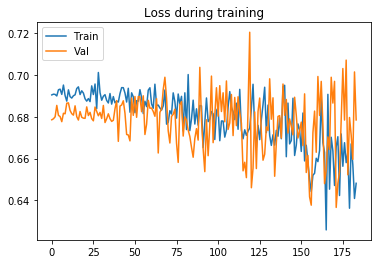

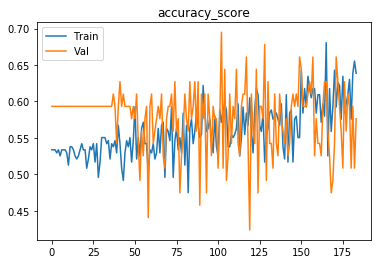

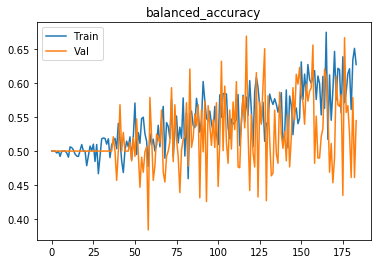

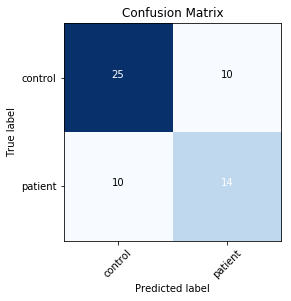

###### Starting inner fold 2
{'model': 'ModelLiu', 'batch_size': 12, 'patience': 16, 'lr': 5e-05}
Trainable model parameters: 116001
torch.Size([1, 72, 57, 75])


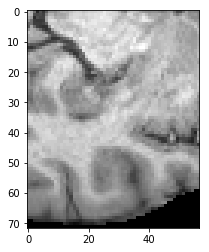

[0,     5] loss: 0.68761
[0,    10] loss: 0.69557
[0,    15] loss: 0.69802
Time elapsed: 0h:0m:21s
train accuracy_score: 52.10 %
train balanced_accuracy: 49.05 %
val accuracy_score: 59.32 %
val balanced_accuracy: 50.00 %
Val loss: 0.688801
[1,     5] loss: 0.68982
[1,    10] loss: 0.68754
[1,    15] loss: 0.69457
Time elapsed: 0h:1m:5s
train accuracy_score: 53.78 %
train balanced_accuracy: 50.68 %
val accuracy_score: 59.32 %
val balanced_accuracy: 50.00 %
Val loss: 0.685749
[2,     5] loss: 0.69307
[2,    10] loss: 0.69155
[2,    15] loss: 0.69513
Time elapsed: 0h:1m:49s
train accuracy_score: 52.52 %
train balanced_accuracy: 49.21 %
val accuracy_score: 59.32 %
val balanced_accuracy: 50.00 %
Val loss: 0.684776
[3,     5] loss: 0.69388
[3,    10] loss: 0.68977
[3,    15] loss: 0.69007
Time elapsed: 0h:2m:32s
train accuracy_score: 52.94 %
train balanced_accuracy: 49.72 %
val accuracy_score: 59.32 %
val balanced_accuracy: 50.00 %
Val loss: 0.683698
[4,     5] loss: 0.69222
[4,    10] loss:

[34,     5] loss: 0.67715
[34,    10] loss: 0.70128
[34,    15] loss: 0.69839
Time elapsed: 0h:24m:51s
train accuracy_score: 51.26 %
train balanced_accuracy: 49.51 %
val accuracy_score: 59.32 %
val balanced_accuracy: 53.93 %
Val loss: 0.674336
[35,     5] loss: 0.67309
[35,    10] loss: 0.67349
[35,    15] loss: 0.69616
Time elapsed: 0h:25m:34s
train accuracy_score: 53.78 %
train balanced_accuracy: 51.53 %
val accuracy_score: 67.80 %
val balanced_accuracy: 60.42 %
Val loss: 0.669695
[36,     5] loss: 0.69645
[36,    10] loss: 0.68100
[36,    15] loss: 0.68024
Time elapsed: 0h:26m:17s
train accuracy_score: 50.42 %
train balanced_accuracy: 48.10 %
val accuracy_score: 64.41 %
val balanced_accuracy: 56.90 %
Val loss: 0.679528
[37,     5] loss: 0.66292
[37,    10] loss: 0.68965
[37,    15] loss: 0.68498
Time elapsed: 0h:27m:0s
train accuracy_score: 54.62 %
train balanced_accuracy: 51.86 %
val accuracy_score: 57.63 %
val balanced_accuracy: 48.57 %
Val loss: 0.677064
[38,     5] loss: 0.67345

val accuracy_score: 57.63 %
val balanced_accuracy: 51.19 %
Val loss: 0.675886
[68,     5] loss: 0.69494
[68,    10] loss: 0.70188
[68,    15] loss: 0.70811
Time elapsed: 0h:49m:22s
train accuracy_score: 47.90 %
train balanced_accuracy: 46.41 %
val accuracy_score: 49.15 %
val balanced_accuracy: 44.05 %
Val loss: 0.680310
[69,     5] loss: 0.68340
[69,    10] loss: 0.68666
[69,    15] loss: 0.68572
Time elapsed: 0h:50m:5s
train accuracy_score: 56.72 %
train balanced_accuracy: 54.97 %
val accuracy_score: 52.54 %
val balanced_accuracy: 45.60 %
Val loss: 0.680530
[70,     5] loss: 0.66653
[70,    10] loss: 0.67135
[70,    15] loss: 0.71614
Time elapsed: 0h:50m:48s
train accuracy_score: 56.30 %
train balanced_accuracy: 54.34 %
val accuracy_score: 52.54 %
val balanced_accuracy: 48.21 %
Val loss: 0.685208
[71,     5] loss: 0.69998
[71,    10] loss: 0.66190
[71,    15] loss: 0.67551
Time elapsed: 0h:51m:31s
train accuracy_score: 55.46 %
train balanced_accuracy: 53.90 %
val accuracy_score: 49.15

Time elapsed: 1h:13m:14s
train accuracy_score: 60.08 %
train balanced_accuracy: 59.65 %
val accuracy_score: 55.93 %
val balanced_accuracy: 52.38 %
Val loss: 0.680990
[102,     5] loss: 0.63941
[102,    10] loss: 0.62847
[102,    15] loss: 0.67545
Time elapsed: 1h:13m:57s
train accuracy_score: 63.45 %
train balanced_accuracy: 62.00 %
val accuracy_score: 61.02 %
val balanced_accuracy: 58.63 %
Val loss: 0.660056
[103,     5] loss: 0.66723
[103,    10] loss: 0.68598
[103,    15] loss: 0.67161
Time elapsed: 1h:14m:41s
train accuracy_score: 57.56 %
train balanced_accuracy: 57.85 %
val accuracy_score: 59.32 %
val balanced_accuracy: 57.20 %
Val loss: 0.653272
[104,     5] loss: 0.67599
[104,    10] loss: 0.70936
[104,    15] loss: 0.66583
Time elapsed: 1h:15m:25s
train accuracy_score: 55.04 %
train balanced_accuracy: 54.19 %
val accuracy_score: 64.41 %
val balanced_accuracy: 64.76 %
Val loss: 0.664513
[105,     5] loss: 0.68232
[105,    10] loss: 0.67109
[105,    15] loss: 0.72593
Time elapsed

val accuracy_score: 69.49 %
val balanced_accuracy: 67.08 %
Val loss: 0.665359
[135,     5] loss: 0.63455
[135,    10] loss: 0.70668
[135,    15] loss: 0.67750
Time elapsed: 1h:37m:55s
train accuracy_score: 56.30 %
train balanced_accuracy: 54.17 %
val accuracy_score: 61.02 %
val balanced_accuracy: 54.70 %
Val loss: 0.664203
[136,     5] loss: 0.68812
[136,    10] loss: 0.62267
[136,    15] loss: 0.68326
Time elapsed: 1h:38m:38s
train accuracy_score: 61.76 %
train balanced_accuracy: 61.62 %
val accuracy_score: 66.10 %
val balanced_accuracy: 62.92 %
Val loss: 0.654748
[137,     5] loss: 0.67610
[137,    10] loss: 0.66056
[137,    15] loss: 0.62600
Time elapsed: 1h:39m:22s
train accuracy_score: 57.14 %
train balanced_accuracy: 55.76 %
val accuracy_score: 62.71 %
val balanced_accuracy: 60.71 %
Val loss: 0.669115
[138,     5] loss: 0.66119
[138,    10] loss: 0.63715
[138,    15] loss: 0.70176
Time elapsed: 1h:40m:6s
train accuracy_score: 62.61 %
train balanced_accuracy: 61.95 %
val accuracy_

[168,     5] loss: 0.64680
[168,    10] loss: 0.64321
[168,    15] loss: 0.62690
Time elapsed: 2h:1m:46s
train accuracy_score: 63.87 %
train balanced_accuracy: 62.96 %
val accuracy_score: 64.41 %
val balanced_accuracy: 58.21 %
Val loss: 0.636364
[169,     5] loss: 0.62936
[169,    10] loss: 0.64113
[169,    15] loss: 0.70542
Time elapsed: 2h:2m:28s
train accuracy_score: 59.24 %
train balanced_accuracy: 58.52 %
val accuracy_score: 54.24 %
val balanced_accuracy: 54.88 %
Val loss: 0.673133
[170,     5] loss: 0.64056
[170,    10] loss: 0.66807
[170,    15] loss: 0.58010
Time elapsed: 2h:3m:12s
train accuracy_score: 64.71 %
train balanced_accuracy: 64.09 %
val accuracy_score: 61.02 %
val balanced_accuracy: 54.05 %
Val loss: 0.628656
[171,     5] loss: 0.66363
[171,    10] loss: 0.62314
[171,    15] loss: 0.63092
Time elapsed: 2h:3m:56s
train accuracy_score: 60.92 %
train balanced_accuracy: 60.21 %
val accuracy_score: 55.93 %
val balanced_accuracy: 57.62 %
Val loss: 0.686665
[172,     5] los

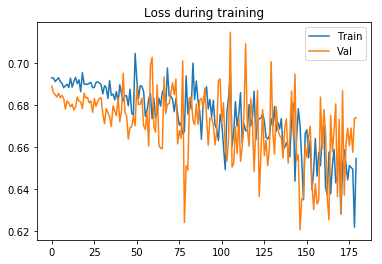

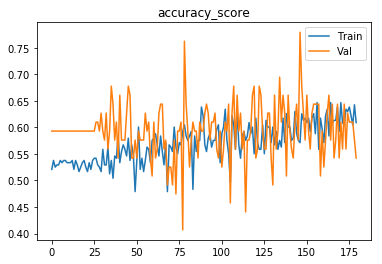

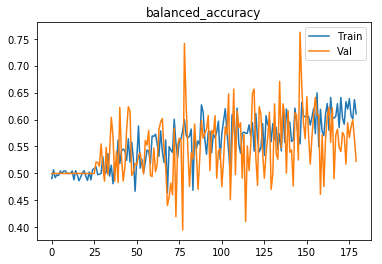

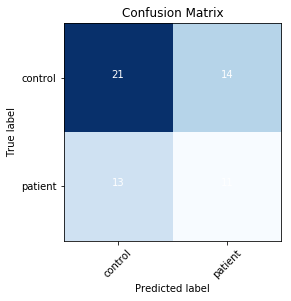

###### Starting inner fold 3
{'model': 'ModelLiu', 'batch_size': 16, 'patience': 16, 'lr': 0.0001}
Trainable model parameters: 116001
torch.Size([1, 72, 57, 75])


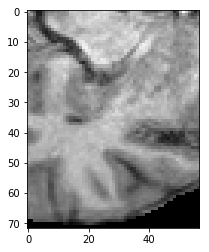

[0,     5] loss: 0.69609
[0,    10] loss: 0.69419
Time elapsed: 0h:0m:23s
train accuracy_score: 47.48 %
train balanced_accuracy: 48.18 %
val accuracy_score: 64.41 %
val balanced_accuracy: 56.25 %
Val loss: 0.691403
[1,     5] loss: 0.69084
[1,    10] loss: 0.68889
Time elapsed: 0h:1m:8s
train accuracy_score: 50.00 %
train balanced_accuracy: 48.04 %
val accuracy_score: 59.32 %
val balanced_accuracy: 50.00 %
Val loss: 0.683082
[2,     5] loss: 0.68691
[2,    10] loss: 0.70506
Time elapsed: 0h:1m:53s
train accuracy_score: 50.84 %
train balanced_accuracy: 47.98 %
val accuracy_score: 59.32 %
val balanced_accuracy: 50.00 %
Val loss: 0.689329
[3,     5] loss: 0.69005
[3,    10] loss: 0.69646
Time elapsed: 0h:2m:39s
train accuracy_score: 52.10 %
train balanced_accuracy: 49.10 %
val accuracy_score: 59.32 %
val balanced_accuracy: 50.00 %
Val loss: 0.684649
[4,     5] loss: 0.69742
[4,    10] loss: 0.69080
Time elapsed: 0h:3m:24s
train accuracy_score: 51.68 %
train balanced_accuracy: 48.94 %
val 

[38,     5] loss: 0.67412
[38,    10] loss: 0.68681
Time elapsed: 0h:28m:38s
train accuracy_score: 53.78 %
train balanced_accuracy: 51.24 %
val accuracy_score: 64.41 %
val balanced_accuracy: 58.21 %
Val loss: 0.664563
[39,     5] loss: 0.68169
[39,    10] loss: 0.69485
Time elapsed: 0h:29m:23s
train accuracy_score: 54.62 %
train balanced_accuracy: 53.11 %
val accuracy_score: 59.32 %
val balanced_accuracy: 54.58 %
Val loss: 0.677425
[40,     5] loss: 0.69111
[40,    10] loss: 0.67632
Time elapsed: 0h:30m:7s
train accuracy_score: 57.14 %
train balanced_accuracy: 55.93 %
val accuracy_score: 57.63 %
val balanced_accuracy: 52.50 %
Val loss: 0.682958
[41,     5] loss: 0.68091
[41,    10] loss: 0.69034
Time elapsed: 0h:30m:53s
train accuracy_score: 54.62 %
train balanced_accuracy: 52.54 %
val accuracy_score: 54.24 %
val balanced_accuracy: 47.68 %
Val loss: 0.678335
[42,     5] loss: 0.68966
[42,    10] loss: 0.69314
Time elapsed: 0h:31m:38s
train accuracy_score: 51.68 %
train balanced_accurac

val accuracy_score: 59.32 %
val balanced_accuracy: 53.27 %
Val loss: 0.674428
[76,     5] loss: 0.67445
[76,    10] loss: 0.67521
Time elapsed: 0h:57m:15s
train accuracy_score: 57.56 %
train balanced_accuracy: 55.30 %
val accuracy_score: 61.02 %
val balanced_accuracy: 56.01 %
Val loss: 0.678355
[77,     5] loss: 0.69390
[77,    10] loss: 0.67484
Time elapsed: 0h:58m:1s
train accuracy_score: 54.62 %
train balanced_accuracy: 53.56 %
val accuracy_score: 61.02 %
val balanced_accuracy: 57.32 %
Val loss: 0.681825
[78,     5] loss: 0.67270
[78,    10] loss: 0.70632
Time elapsed: 0h:58m:47s
train accuracy_score: 53.36 %
train balanced_accuracy: 52.21 %
val accuracy_score: 62.71 %
val balanced_accuracy: 58.10 %
Val loss: 0.669211
[79,     5] loss: 0.68182
[79,    10] loss: 0.69829
Time elapsed: 0h:59m:31s
train accuracy_score: 55.46 %
train balanced_accuracy: 55.09 %
val accuracy_score: 49.15 %
val balanced_accuracy: 47.32 %
Val loss: 0.696128
[80,     5] loss: 0.68950
[80,    10] loss: 0.68368

Time elapsed: 1h:25m:28s
train accuracy_score: 51.68 %
train balanced_accuracy: 50.58 %
val accuracy_score: 59.32 %
val balanced_accuracy: 54.58 %
Val loss: 0.675120
[114,     5] loss: 0.68376
[114,    10] loss: 0.64780
Time elapsed: 1h:26m:14s
train accuracy_score: 56.72 %
train balanced_accuracy: 54.80 %
val accuracy_score: 57.63 %
val balanced_accuracy: 52.50 %
Val loss: 0.683753
[115,     5] loss: 0.67862
[115,    10] loss: 0.66085
Time elapsed: 1h:26m:58s
train accuracy_score: 56.72 %
train balanced_accuracy: 55.76 %
val accuracy_score: 61.02 %
val balanced_accuracy: 58.63 %
Val loss: 0.662277
[116,     5] loss: 0.67441
[116,    10] loss: 0.69820
Time elapsed: 1h:27m:44s
train accuracy_score: 55.46 %
train balanced_accuracy: 54.18 %
val accuracy_score: 62.71 %
val balanced_accuracy: 60.71 %
Val loss: 0.664090
[117,     5] loss: 0.65695
[117,    10] loss: 0.66541
Time elapsed: 1h:28m:29s
train accuracy_score: 56.30 %
train balanced_accuracy: 55.25 %
val accuracy_score: 54.24 %
val 

val accuracy_score: 55.93 %
val balanced_accuracy: 47.80 %
Val loss: 0.662859
[151,     5] loss: 0.66155
[151,    10] loss: 0.67991
Time elapsed: 1h:54m:14s
train accuracy_score: 57.14 %
train balanced_accuracy: 55.02 %
val accuracy_score: 61.02 %
val balanced_accuracy: 58.63 %
Val loss: 0.673716
[152,     5] loss: 0.66864
[152,    10] loss: 0.69257
Time elapsed: 1h:54m:59s
train accuracy_score: 53.78 %
train balanced_accuracy: 55.33 %
val accuracy_score: 61.02 %
val balanced_accuracy: 58.63 %
Val loss: 0.665942
[153,     5] loss: 0.66949
[153,    10] loss: 0.70639
Time elapsed: 1h:55m:44s
train accuracy_score: 56.30 %
train balanced_accuracy: 53.95 %
val accuracy_score: 64.41 %
val balanced_accuracy: 56.25 %
Val loss: 0.668594
[154,     5] loss: 0.68615
[154,    10] loss: 0.69504
Time elapsed: 1h:56m:30s
train accuracy_score: 57.56 %
train balanced_accuracy: 56.55 %
val accuracy_score: 57.63 %
val balanced_accuracy: 57.74 %
Val loss: 0.671825
[155,     5] loss: 0.64254
[155,    10] lo

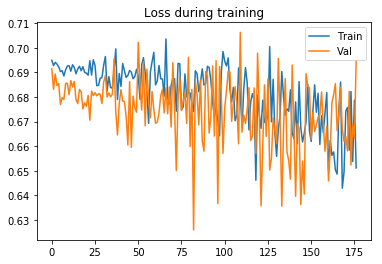

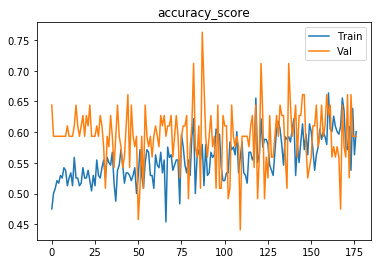

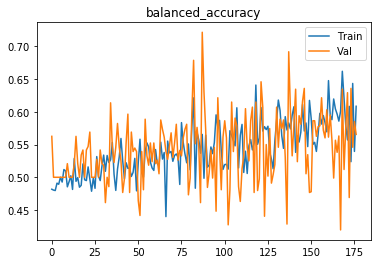

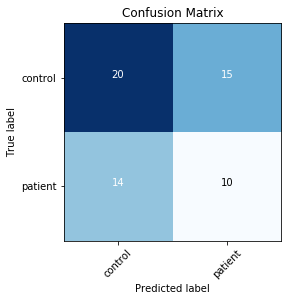

###### Starting inner fold 4
{'model': 'ModelLiu', 'batch_size': 32, 'patience': 16, 'lr': 0.0001}
Trainable model parameters: 116001
torch.Size([1, 72, 57, 75])


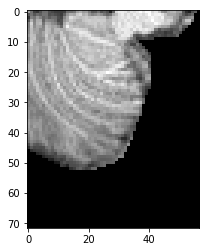

[0,     5] loss: 0.69643
Time elapsed: 0h:0m:23s
train accuracy_score: 47.90 %
train balanced_accuracy: 51.18 %
val accuracy_score: 40.68 %
val balanced_accuracy: 50.00 %
Val loss: 0.697576
[1,     5] loss: 0.69628
Time elapsed: 0h:1m:9s
train accuracy_score: 48.74 %
train balanced_accuracy: 49.70 %
val accuracy_score: 59.32 %
val balanced_accuracy: 51.31 %
Val loss: 0.690001
[2,     5] loss: 0.69107
Time elapsed: 0h:1m:55s
train accuracy_score: 50.84 %
train balanced_accuracy: 48.49 %
val accuracy_score: 59.32 %
val balanced_accuracy: 50.00 %
Val loss: 0.682818
[3,     5] loss: 0.69772
Time elapsed: 0h:2m:40s
train accuracy_score: 51.68 %
train balanced_accuracy: 48.48 %
val accuracy_score: 59.32 %
val balanced_accuracy: 50.00 %
Val loss: 0.678356
[4,     5] loss: 0.69634
Time elapsed: 0h:3m:26s
train accuracy_score: 49.16 %
train balanced_accuracy: 46.35 %
val accuracy_score: 59.32 %
val balanced_accuracy: 50.00 %
Val loss: 0.686585
[5,     5] loss: 0.69396
Time elapsed: 0h:4m:11s
tr

[43,     5] loss: 0.69391
Time elapsed: 0h:33m:6s
train accuracy_score: 54.62 %
train balanced_accuracy: 52.15 %
val accuracy_score: 61.02 %
val balanced_accuracy: 52.08 %
Val loss: 0.689790
[44,     5] loss: 0.69491
Time elapsed: 0h:33m:51s
train accuracy_score: 54.20 %
train balanced_accuracy: 51.81 %
val accuracy_score: 59.32 %
val balanced_accuracy: 50.00 %
Val loss: 0.685017
[45,     5] loss: 0.69249
Time elapsed: 0h:34m:37s
train accuracy_score: 55.04 %
train balanced_accuracy: 52.31 %
val accuracy_score: 59.32 %
val balanced_accuracy: 50.00 %
Val loss: 0.684238
[46,     5] loss: 0.69095
Time elapsed: 0h:35m:24s
train accuracy_score: 52.52 %
train balanced_accuracy: 49.67 %
val accuracy_score: 59.32 %
val balanced_accuracy: 50.00 %
Val loss: 0.676194
[47,     5] loss: 0.68918
Time elapsed: 0h:36m:10s
train accuracy_score: 54.62 %
train balanced_accuracy: 51.58 %
val accuracy_score: 59.32 %
val balanced_accuracy: 50.00 %
Val loss: 0.677264
[48,     5] loss: 0.68579
Time elapsed: 0

[86,     5] loss: 0.69489
Time elapsed: 1h:5m:48s
train accuracy_score: 50.00 %
train balanced_accuracy: 48.84 %
val accuracy_score: 59.32 %
val balanced_accuracy: 51.31 %
Val loss: 0.680326
[87,     5] loss: 0.68196
Time elapsed: 1h:6m:34s
train accuracy_score: 58.82 %
train balanced_accuracy: 57.05 %
val accuracy_score: 50.85 %
val balanced_accuracy: 44.17 %
Val loss: 0.684822
[88,     5] loss: 0.68477
Time elapsed: 1h:7m:20s
train accuracy_score: 52.10 %
train balanced_accuracy: 50.07 %
val accuracy_score: 64.41 %
val balanced_accuracy: 56.90 %
Val loss: 0.677001
[89,     5] loss: 0.67513
Time elapsed: 1h:8m:5s
train accuracy_score: 56.72 %
train balanced_accuracy: 55.02 %
val accuracy_score: 55.93 %
val balanced_accuracy: 49.11 %
Val loss: 0.675857
[90,     5] loss: 0.68308
Time elapsed: 1h:8m:51s
train accuracy_score: 55.04 %
train balanced_accuracy: 53.56 %
val accuracy_score: 55.93 %
val balanced_accuracy: 49.11 %
Val loss: 0.688543
[91,     5] loss: 0.69890
Time elapsed: 1h:9m:

val accuracy_score: 61.02 %
val balanced_accuracy: 56.67 %
Val loss: 0.669152
[129,     5] loss: 0.67181
Time elapsed: 1h:38m:30s
train accuracy_score: 59.66 %
train balanced_accuracy: 59.82 %
val accuracy_score: 42.37 %
val balanced_accuracy: 41.61 %
Val loss: 0.718280
[130,     5] loss: 0.67343
Time elapsed: 1h:39m:16s
train accuracy_score: 57.14 %
train balanced_accuracy: 58.20 %
val accuracy_score: 52.54 %
val balanced_accuracy: 48.21 %
Val loss: 0.694717
[131,     5] loss: 0.68074
Time elapsed: 1h:40m:2s
train accuracy_score: 56.72 %
train balanced_accuracy: 54.85 %
val accuracy_score: 59.32 %
val balanced_accuracy: 50.00 %
Val loss: 0.667737
[132,     5] loss: 0.66850
Time elapsed: 1h:40m:48s
train accuracy_score: 58.82 %
train balanced_accuracy: 56.42 %
val accuracy_score: 54.24 %
val balanced_accuracy: 48.33 %
Val loss: 0.679008
[133,     5] loss: 0.68525
Time elapsed: 1h:41m:33s
train accuracy_score: 53.78 %
train balanced_accuracy: 53.69 %
val accuracy_score: 44.07 %
val bala

val accuracy_score: 54.24 %
val balanced_accuracy: 50.95 %
Val loss: 0.683799
[172,     5] loss: 0.67577
Time elapsed: 2h:11m:18s
train accuracy_score: 56.72 %
train balanced_accuracy: 55.59 %
val accuracy_score: 59.32 %
val balanced_accuracy: 55.89 %
Val loss: 0.676009
[173,     5] loss: 0.65398
Time elapsed: 2h:12m:6s
train accuracy_score: 63.03 %
train balanced_accuracy: 62.69 %
val accuracy_score: 55.93 %
val balanced_accuracy: 55.00 %
Val loss: 0.685061
[174,     5] loss: 0.66304
Time elapsed: 2h:12m:54s
train accuracy_score: 63.45 %
train balanced_accuracy: 62.97 %
val accuracy_score: 54.24 %
val balanced_accuracy: 48.99 %
Val loss: 0.676152
[175,     5] loss: 0.69438
Time elapsed: 2h:13m:41s
train accuracy_score: 55.88 %
train balanced_accuracy: 54.06 %
val accuracy_score: 57.63 %
val balanced_accuracy: 53.15 %
Val loss: 0.687748
[176,     5] loss: 0.66498
Time elapsed: 2h:14m:28s
train accuracy_score: 60.08 %
train balanced_accuracy: 59.42 %
val accuracy_score: 50.85 %
val bala

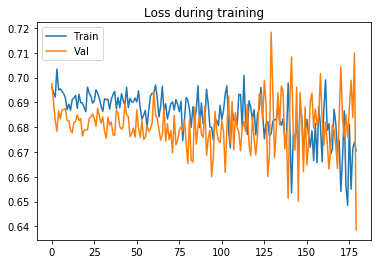

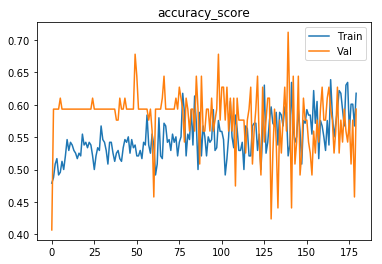

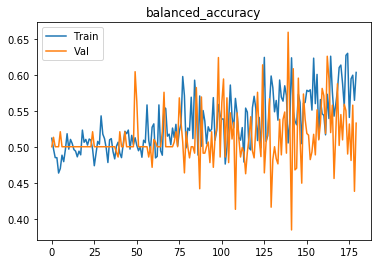

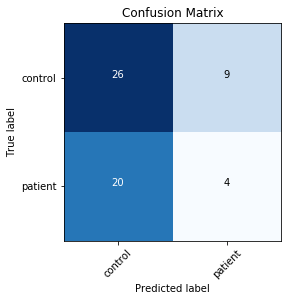

Finished outer fold.
{'final_acc': 0.56547619047619058, 'best_acc': 0.72142857142857142, 'final_iter': 177, 'best_iter': 88, 'params': {'model': 'ModelLiu', 'batch_size': 16, 'patience': 16, 'lr': 0.0001}, 'inner_fold_idx': 3}
###### Starting outer fold 8
238
59
Shuffled the data..
###### Starting inner fold 0
{'model': 'ModelLiu', 'batch_size': 32, 'patience': 16, 'lr': 5e-05}
Trainable model parameters: 116001
torch.Size([1, 72, 57, 75])


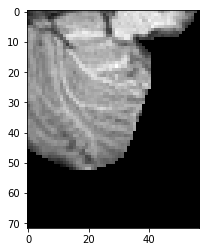

[0,     5] loss: 0.69797
Time elapsed: 0h:0m:25s
train accuracy_score: 46.64 %
train balanced_accuracy: 48.47 %
val accuracy_score: 35.59 %
val balanced_accuracy: 50.00 %
Val loss: 0.700850
[1,     5] loss: 0.69280
Time elapsed: 0h:1m:12s
train accuracy_score: 48.74 %
train balanced_accuracy: 50.35 %
val accuracy_score: 35.59 %
val balanced_accuracy: 50.00 %
Val loss: 0.696295
[2,     5] loss: 0.69506
Time elapsed: 0h:1m:59s
train accuracy_score: 51.26 %
train balanced_accuracy: 52.16 %
val accuracy_score: 37.29 %
val balanced_accuracy: 51.32 %
Val loss: 0.694738
[3,     5] loss: 0.69459
Time elapsed: 0h:2m:45s
train accuracy_score: 44.96 %
train balanced_accuracy: 45.09 %
val accuracy_score: 42.37 %
val balanced_accuracy: 37.16 %
Val loss: 0.694097
[4,     5] loss: 0.69234
Time elapsed: 0h:3m:32s
train accuracy_score: 53.36 %
train balanced_accuracy: 53.08 %
val accuracy_score: 62.71 %
val balanced_accuracy: 48.68 %
Val loss: 0.689583
[5,     5] loss: 0.69259
Time elapsed: 0h:4m:20s
t

[43,     5] loss: 0.69252
Time elapsed: 0h:34m:16s
train accuracy_score: 50.84 %
train balanced_accuracy: 49.14 %
val accuracy_score: 64.41 %
val balanced_accuracy: 50.00 %
Val loss: 0.678870
[44,     5] loss: 0.69345
Time elapsed: 0h:35m:3s
train accuracy_score: 54.20 %
train balanced_accuracy: 52.69 %
val accuracy_score: 64.41 %
val balanced_accuracy: 50.00 %
Val loss: 0.683884
[45,     5] loss: 0.69034
Time elapsed: 0h:35m:50s
train accuracy_score: 50.84 %
train balanced_accuracy: 49.67 %
val accuracy_score: 64.41 %
val balanced_accuracy: 50.00 %
Val loss: 0.683643
[46,     5] loss: 0.69248
Time elapsed: 0h:36m:37s
train accuracy_score: 49.16 %
train balanced_accuracy: 47.43 %
val accuracy_score: 64.41 %
val balanced_accuracy: 50.00 %
Val loss: 0.683282
[47,     5] loss: 0.69480
Time elapsed: 0h:37m:24s
train accuracy_score: 50.84 %
train balanced_accuracy: 49.46 %
val accuracy_score: 64.41 %
val balanced_accuracy: 50.00 %
Val loss: 0.684971
[48,     5] loss: 0.69023
Time elapsed: 0

[86,     5] loss: 0.68740
Time elapsed: 1h:7m:34s
train accuracy_score: 52.10 %
train balanced_accuracy: 51.03 %
val accuracy_score: 61.02 %
val balanced_accuracy: 50.56 %
Val loss: 0.680710
[87,     5] loss: 0.69342
Time elapsed: 1h:8m:20s
train accuracy_score: 51.68 %
train balanced_accuracy: 50.48 %
val accuracy_score: 66.10 %
val balanced_accuracy: 57.71 %
Val loss: 0.684302
[88,     5] loss: 0.69109
Time elapsed: 1h:9m:5s
train accuracy_score: 52.94 %
train balanced_accuracy: 52.15 %
val accuracy_score: 62.71 %
val balanced_accuracy: 52.94 %
Val loss: 0.680643
[89,     5] loss: 0.68685
Time elapsed: 1h:9m:51s
train accuracy_score: 55.46 %
train balanced_accuracy: 54.78 %
val accuracy_score: 64.41 %
val balanced_accuracy: 56.39 %
Val loss: 0.685891
[90,     5] loss: 0.69048
Time elapsed: 1h:10m:36s
train accuracy_score: 53.78 %
train balanced_accuracy: 52.92 %
val accuracy_score: 64.41 %
val balanced_accuracy: 56.39 %
Val loss: 0.681758
[91,     5] loss: 0.69078
Time elapsed: 1h:11

[129,     5] loss: 0.70121
Time elapsed: 1h:39m:52s
train accuracy_score: 47.90 %
train balanced_accuracy: 46.96 %
val accuracy_score: 64.41 %
val balanced_accuracy: 58.52 %
Val loss: 0.674923
[130,     5] loss: 0.69147
Time elapsed: 1h:40m:37s
train accuracy_score: 50.00 %
train balanced_accuracy: 49.08 %
val accuracy_score: 61.02 %
val balanced_accuracy: 50.56 %
Val loss: 0.682990
[131,     5] loss: 0.69045
Time elapsed: 1h:41m:22s
train accuracy_score: 55.46 %
train balanced_accuracy: 54.22 %
val accuracy_score: 59.32 %
val balanced_accuracy: 49.25 %
Val loss: 0.678405
[132,     5] loss: 0.69123
Time elapsed: 1h:42m:7s
train accuracy_score: 53.36 %
train balanced_accuracy: 52.06 %
val accuracy_score: 64.41 %
val balanced_accuracy: 52.13 %
Val loss: 0.680857
[133,     5] loss: 0.68994
Time elapsed: 1h:42m:51s
train accuracy_score: 50.42 %
train balanced_accuracy: 49.45 %
val accuracy_score: 74.58 %
val balanced_accuracy: 66.42 %
Val loss: 0.674842
[134,     5] loss: 0.69223
Time elap

val accuracy_score: 59.32 %
val balanced_accuracy: 53.51 %
Val loss: 0.676450
[172,     5] loss: 0.67810
Time elapsed: 2h:12m:9s
train accuracy_score: 56.30 %
train balanced_accuracy: 55.27 %
val accuracy_score: 59.32 %
val balanced_accuracy: 49.25 %
Val loss: 0.662931
[173,     5] loss: 0.69225
Time elapsed: 2h:12m:54s
train accuracy_score: 52.94 %
train balanced_accuracy: 52.01 %
val accuracy_score: 59.32 %
val balanced_accuracy: 48.18 %
Val loss: 0.679415
[174,     5] loss: 0.68069
Time elapsed: 2h:13m:40s
train accuracy_score: 59.24 %
train balanced_accuracy: 58.66 %
val accuracy_score: 50.85 %
val balanced_accuracy: 51.19 %
Val loss: 0.688918
[175,     5] loss: 0.68454
Time elapsed: 2h:14m:24s
train accuracy_score: 54.62 %
train balanced_accuracy: 54.65 %
val accuracy_score: 55.93 %
val balanced_accuracy: 51.94 %
Val loss: 0.685906
[176,     5] loss: 0.68770
Time elapsed: 2h:15m:8s
train accuracy_score: 50.84 %
train balanced_accuracy: 50.31 %
val accuracy_score: 62.71 %
val balan

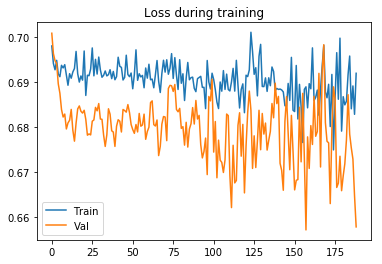

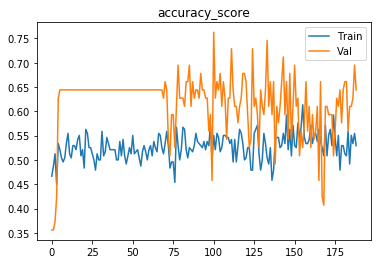

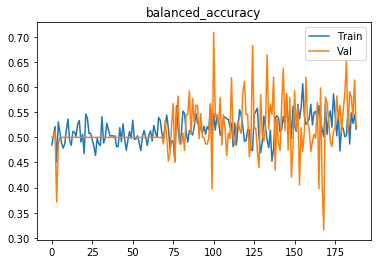

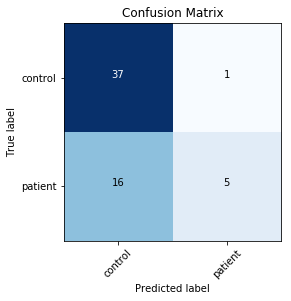

###### Starting inner fold 1
{'model': 'ModelLiu', 'batch_size': 12, 'patience': 16, 'lr': 0.0001}
Trainable model parameters: 116001
torch.Size([1, 72, 57, 75])


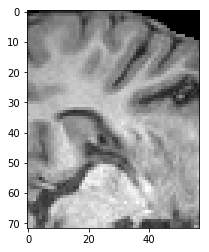

[0,     5] loss: 0.69152
[0,    10] loss: 0.70068
[0,    15] loss: 0.69531
Time elapsed: 0h:0m:21s
train accuracy_score: 47.90 %
train balanced_accuracy: 49.96 %
val accuracy_score: 35.59 %
val balanced_accuracy: 50.00 %
Val loss: 0.702174
[1,     5] loss: 0.68973
[1,    10] loss: 0.69828
[1,    15] loss: 0.69563
Time elapsed: 0h:1m:3s
train accuracy_score: 50.84 %
train balanced_accuracy: 50.91 %
val accuracy_score: 64.41 %
val balanced_accuracy: 50.00 %
Val loss: 0.686318
[2,     5] loss: 0.68436
[2,    10] loss: 0.70297
[2,    15] loss: 0.69385
Time elapsed: 0h:1m:47s
train accuracy_score: 49.58 %
train balanced_accuracy: 47.69 %
val accuracy_score: 64.41 %
val balanced_accuracy: 50.00 %
Val loss: 0.676803
[3,     5] loss: 0.69872
[3,    10] loss: 0.68698
[3,    15] loss: 0.69244
Time elapsed: 0h:2m:30s
train accuracy_score: 53.36 %
train balanced_accuracy: 51.60 %
val accuracy_score: 64.41 %
val balanced_accuracy: 50.00 %
Val loss: 0.684256
[4,     5] loss: 0.69832
[4,    10] loss:

[34,     5] loss: 0.69809
[34,    10] loss: 0.69061
[34,    15] loss: 0.69163
Time elapsed: 0h:25m:0s
train accuracy_score: 52.52 %
train balanced_accuracy: 50.97 %
val accuracy_score: 64.41 %
val balanced_accuracy: 50.00 %
Val loss: 0.684361
[35,     5] loss: 0.68780
[35,    10] loss: 0.69905
[35,    15] loss: 0.69086
Time elapsed: 0h:25m:43s
train accuracy_score: 51.26 %
train balanced_accuracy: 49.69 %
val accuracy_score: 64.41 %
val balanced_accuracy: 50.00 %
Val loss: 0.683230
[36,     5] loss: 0.69102
[36,    10] loss: 0.69158
[36,    15] loss: 0.69485
Time elapsed: 0h:26m:28s
train accuracy_score: 49.58 %
train balanced_accuracy: 47.97 %
val accuracy_score: 66.10 %
val balanced_accuracy: 52.38 %
Val loss: 0.683860
[37,     5] loss: 0.68439
[37,    10] loss: 0.70039
[37,    15] loss: 0.68472
Time elapsed: 0h:27m:12s
train accuracy_score: 54.62 %
train balanced_accuracy: 53.09 %
val accuracy_score: 64.41 %
val balanced_accuracy: 50.00 %
Val loss: 0.678374
[38,     5] loss: 0.68140

val accuracy_score: 61.02 %
val balanced_accuracy: 60.15 %
Val loss: 0.671818
[68,     5] loss: 0.70499
[68,    10] loss: 0.68754
[68,    15] loss: 0.69448
Time elapsed: 0h:50m:17s
train accuracy_score: 50.84 %
train balanced_accuracy: 50.66 %
val accuracy_score: 57.63 %
val balanced_accuracy: 54.32 %
Val loss: 0.686856
[69,     5] loss: 0.69882
[69,    10] loss: 0.69607
[69,    15] loss: 0.67649
Time elapsed: 0h:51m:1s
train accuracy_score: 53.36 %
train balanced_accuracy: 52.06 %
val accuracy_score: 64.41 %
val balanced_accuracy: 53.20 %
Val loss: 0.660997
[70,     5] loss: 0.68728
[70,    10] loss: 0.71145
[70,    15] loss: 0.70027
Time elapsed: 0h:51m:45s
train accuracy_score: 48.74 %
train balanced_accuracy: 48.40 %
val accuracy_score: 44.07 %
val balanced_accuracy: 50.19 %
Val loss: 0.691884
[71,     5] loss: 0.67765
[71,    10] loss: 0.66984
[71,    15] loss: 0.69478
Time elapsed: 0h:52m:27s
train accuracy_score: 55.04 %
train balanced_accuracy: 53.78 %
val accuracy_score: 52.54

Time elapsed: 1h:14m:5s
train accuracy_score: 57.98 %
train balanced_accuracy: 57.59 %
val accuracy_score: 61.02 %
val balanced_accuracy: 59.09 %
Val loss: 0.648864
[102,     5] loss: 0.67662
[102,    10] loss: 0.69048
[102,    15] loss: 0.70824
Time elapsed: 1h:14m:48s
train accuracy_score: 53.36 %
train balanced_accuracy: 52.59 %
val accuracy_score: 62.71 %
val balanced_accuracy: 63.60 %
Val loss: 0.651996
[103,     5] loss: 0.68503
[103,    10] loss: 0.68120
[103,    15] loss: 0.67477
Time elapsed: 1h:15m:32s
train accuracy_score: 58.40 %
train balanced_accuracy: 58.81 %
val accuracy_score: 67.80 %
val balanced_accuracy: 64.35 %
Val loss: 0.652281
[104,     5] loss: 0.67963
[104,    10] loss: 0.69146
[104,    15] loss: 0.67157
Time elapsed: 1h:16m:15s
train accuracy_score: 52.10 %
train balanced_accuracy: 50.78 %
val accuracy_score: 67.80 %
val balanced_accuracy: 55.83 %
Val loss: 0.645021
[105,     5] loss: 0.67391
[105,    10] loss: 0.67288
[105,    15] loss: 0.66302
Time elapsed:

val accuracy_score: 57.63 %
val balanced_accuracy: 55.39 %
Val loss: 0.685932
[135,     5] loss: 0.66171
[135,    10] loss: 0.67774
[135,    15] loss: 0.66962
Time elapsed: 1h:38m:30s
train accuracy_score: 57.14 %
train balanced_accuracy: 56.43 %
val accuracy_score: 61.02 %
val balanced_accuracy: 55.89 %
Val loss: 0.642610
[136,     5] loss: 0.67229
[136,    10] loss: 0.67851
[136,    15] loss: 0.70137
Time elapsed: 1h:39m:13s
train accuracy_score: 53.78 %
train balanced_accuracy: 54.34 %
val accuracy_score: 62.71 %
val balanced_accuracy: 51.88 %
Val loss: 0.645154
[137,     5] loss: 0.67740
[137,    10] loss: 0.70116
[137,    15] loss: 0.67069
Time elapsed: 1h:39m:57s
train accuracy_score: 55.88 %
train balanced_accuracy: 54.58 %
val accuracy_score: 54.24 %
val balanced_accuracy: 46.37 %
Val loss: 0.663936
[138,     5] loss: 0.65812
[138,    10] loss: 0.69239
[138,    15] loss: 0.68866
Time elapsed: 1h:40m:39s
train accuracy_score: 57.14 %
train balanced_accuracy: 56.96 %
val accuracy

[168,     5] loss: 0.64172
[168,    10] loss: 0.67168
[168,    15] loss: 0.70097
Time elapsed: 2h:2m:28s
train accuracy_score: 57.98 %
train balanced_accuracy: 58.76 %
val accuracy_score: 55.93 %
val balanced_accuracy: 58.33 %
Val loss: 0.678887
[169,     5] loss: 0.67260
[169,    10] loss: 0.65392
[169,    15] loss: 0.74537
Time elapsed: 2h:3m:11s
train accuracy_score: 54.20 %
train balanced_accuracy: 52.58 %
val accuracy_score: 71.19 %
val balanced_accuracy: 61.65 %
Val loss: 0.638320
[170,     5] loss: 0.67218
[170,    10] loss: 0.66241
[170,    15] loss: 0.66468
Time elapsed: 2h:3m:55s
train accuracy_score: 57.56 %
train balanced_accuracy: 57.75 %
val accuracy_score: 71.19 %
val balanced_accuracy: 71.24 %
Val loss: 0.662877
[171,     5] loss: 0.64714
[171,    10] loss: 0.65345
[171,    15] loss: 0.67393
Time elapsed: 2h:4m:39s
train accuracy_score: 55.88 %
train balanced_accuracy: 54.44 %
val accuracy_score: 71.19 %
val balanced_accuracy: 62.72 %
Val loss: 0.637605
[172,     5] los

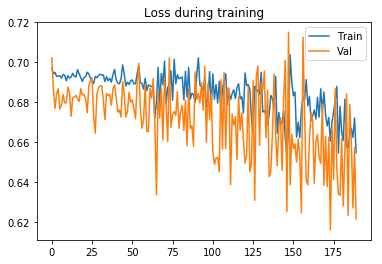

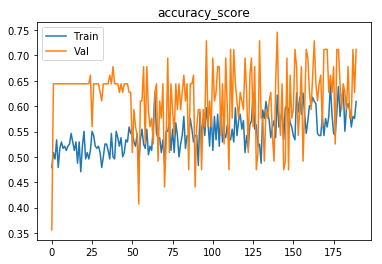

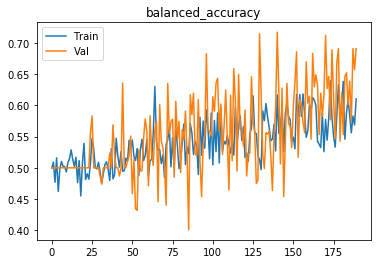

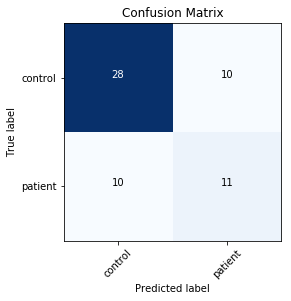

###### Starting inner fold 2
{'model': 'ModelLiu', 'batch_size': 12, 'patience': 12, 'lr': 5e-05}
Trainable model parameters: 116001
torch.Size([1, 72, 57, 75])


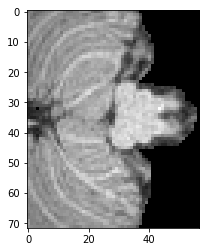

[0,     5] loss: 0.69353
[0,    10] loss: 0.69208
[0,    15] loss: 0.69362
Time elapsed: 0h:0m:22s
train accuracy_score: 44.54 %
train balanced_accuracy: 43.91 %
val accuracy_score: 64.41 %
val balanced_accuracy: 50.00 %
Val loss: 0.689304
[1,     5] loss: 0.69856
[1,    10] loss: 0.69154
[1,    15] loss: 0.69341
Time elapsed: 0h:1m:5s
train accuracy_score: 47.06 %
train balanced_accuracy: 46.05 %
val accuracy_score: 64.41 %
val balanced_accuracy: 50.00 %
Val loss: 0.689162
[2,     5] loss: 0.69245
[2,    10] loss: 0.68985
[2,    15] loss: 0.69222
Time elapsed: 0h:1m:48s
train accuracy_score: 52.10 %
train balanced_accuracy: 50.88 %
val accuracy_score: 64.41 %
val balanced_accuracy: 50.00 %
Val loss: 0.686707
[3,     5] loss: 0.69350
[3,    10] loss: 0.68867
[3,    15] loss: 0.69224
Time elapsed: 0h:2m:31s
train accuracy_score: 54.20 %
train balanced_accuracy: 52.65 %
val accuracy_score: 64.41 %
val balanced_accuracy: 50.00 %
Val loss: 0.683260
[4,     5] loss: 0.68545
[4,    10] loss:

[34,     5] loss: 0.69431
[34,    10] loss: 0.68948
[34,    15] loss: 0.69090
Time elapsed: 0h:25m:1s
train accuracy_score: 54.20 %
train balanced_accuracy: 53.36 %
val accuracy_score: 55.93 %
val balanced_accuracy: 48.75 %
Val loss: 0.689250
[35,     5] loss: 0.68917
[35,    10] loss: 0.69706
[35,    15] loss: 0.69779
Time elapsed: 0h:25m:45s
train accuracy_score: 48.74 %
train balanced_accuracy: 47.84 %
val accuracy_score: 66.10 %
val balanced_accuracy: 55.58 %
Val loss: 0.680286
[36,     5] loss: 0.69399
[36,    10] loss: 0.68469
[36,    15] loss: 0.69186
Time elapsed: 0h:26m:29s
train accuracy_score: 50.84 %
train balanced_accuracy: 49.32 %
val accuracy_score: 66.10 %
val balanced_accuracy: 52.38 %
Val loss: 0.678764
[37,     5] loss: 0.67826
[37,    10] loss: 0.69283
[37,    15] loss: 0.68960
Time elapsed: 0h:27m:13s
train accuracy_score: 54.62 %
train balanced_accuracy: 52.81 %
val accuracy_score: 59.32 %
val balanced_accuracy: 46.05 %
Val loss: 0.670085
[38,     5] loss: 0.68657

val accuracy_score: 54.24 %
val balanced_accuracy: 44.24 %
Val loss: 0.680522
[68,     5] loss: 0.70943
[68,    10] loss: 0.68606
[68,    15] loss: 0.68983
Time elapsed: 0h:49m:39s
train accuracy_score: 51.68 %
train balanced_accuracy: 50.55 %
val accuracy_score: 61.02 %
val balanced_accuracy: 53.76 %
Val loss: 0.678671
[69,     5] loss: 0.68207
[69,    10] loss: 0.71143
[69,    15] loss: 0.69134
Time elapsed: 0h:50m:22s
train accuracy_score: 51.68 %
train balanced_accuracy: 50.66 %
val accuracy_score: 57.63 %
val balanced_accuracy: 52.19 %
Val loss: 0.682801
[70,     5] loss: 0.66501
[70,    10] loss: 0.68049
[70,    15] loss: 0.70051
Time elapsed: 0h:51m:6s
train accuracy_score: 57.14 %
train balanced_accuracy: 56.11 %
val accuracy_score: 57.63 %
val balanced_accuracy: 51.13 %
Val loss: 0.671024
[71,     5] loss: 0.69689
[71,    10] loss: 0.68669
[71,    15] loss: 0.68733
Time elapsed: 0h:51m:49s
train accuracy_score: 48.74 %
train balanced_accuracy: 48.26 %
val accuracy_score: 62.71

Time elapsed: 1h:13m:27s
train accuracy_score: 53.36 %
train balanced_accuracy: 52.73 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.88 %
Val loss: 0.678406
[102,     5] loss: 0.68665
[102,    10] loss: 0.68573
[102,    15] loss: 0.67739
Time elapsed: 1h:14m:10s
train accuracy_score: 54.62 %
train balanced_accuracy: 54.29 %
val accuracy_score: 54.24 %
val balanced_accuracy: 53.82 %
Val loss: 0.694570
[103,     5] loss: 0.68614
[103,    10] loss: 0.68828
[103,    15] loss: 0.69077
Time elapsed: 1h:14m:53s
train accuracy_score: 56.30 %
train balanced_accuracy: 56.23 %
val accuracy_score: 62.71 %
val balanced_accuracy: 55.08 %
Val loss: 0.658444
[104,     5] loss: 0.66491
[104,    10] loss: 0.71470
[104,    15] loss: 0.70316
Time elapsed: 1h:15m:37s
train accuracy_score: 52.94 %
train balanced_accuracy: 51.90 %
val accuracy_score: 50.85 %
val balanced_accuracy: 42.67 %
Val loss: 0.692568
[105,     5] loss: 0.68186
[105,    10] loss: 0.68986
[105,    15] loss: 0.68134
Time elapsed

val accuracy_score: 69.49 %
val balanced_accuracy: 68.86 %
Val loss: 0.650539
[135,     5] loss: 0.66321
[135,    10] loss: 0.71183
[135,    15] loss: 0.69292
Time elapsed: 1h:38m:2s
train accuracy_score: 56.30 %
train balanced_accuracy: 56.05 %
val accuracy_score: 62.71 %
val balanced_accuracy: 60.40 %
Val loss: 0.666464
[136,     5] loss: 0.67426
[136,    10] loss: 0.68054
[136,    15] loss: 0.67770
Time elapsed: 1h:38m:47s
train accuracy_score: 55.04 %
train balanced_accuracy: 54.45 %
val accuracy_score: 71.19 %
val balanced_accuracy: 61.65 %
Val loss: 0.655018
[137,     5] loss: 0.68707
[137,    10] loss: 0.67081
[137,    15] loss: 0.65234
Time elapsed: 1h:39m:29s
train accuracy_score: 56.30 %
train balanced_accuracy: 55.45 %
val accuracy_score: 64.41 %
val balanced_accuracy: 57.46 %
Val loss: 0.651958
[138,     5] loss: 0.67930
[138,    10] loss: 0.69896
[138,    15] loss: 0.71302
Time elapsed: 1h:40m:13s
train accuracy_score: 51.68 %
train balanced_accuracy: 50.83 %
val accuracy_

[168,     5] loss: 0.68277
[168,    10] loss: 0.71613
[168,    15] loss: 0.70574
Time elapsed: 2h:1m:53s
train accuracy_score: 53.78 %
train balanced_accuracy: 53.95 %
val accuracy_score: 55.93 %
val balanced_accuracy: 55.14 %
Val loss: 0.676110
[169,     5] loss: 0.66738
[169,    10] loss: 0.66537
[169,    15] loss: 0.64718
Time elapsed: 2h:2m:36s
train accuracy_score: 63.45 %
train balanced_accuracy: 63.19 %
val accuracy_score: 61.02 %
val balanced_accuracy: 53.76 %
Val loss: 0.674657
[170,     5] loss: 0.63139
[170,    10] loss: 0.69976
[170,    15] loss: 0.71382
Time elapsed: 2h:3m:19s
train accuracy_score: 55.88 %
train balanced_accuracy: 55.01 %
val accuracy_score: 61.02 %
val balanced_accuracy: 58.02 %
Val loss: 0.668728
[171,     5] loss: 0.70639
[171,    10] loss: 0.66177
[171,    15] loss: 0.68962
Time elapsed: 2h:4m:2s
train accuracy_score: 55.04 %
train balanced_accuracy: 55.09 %
val accuracy_score: 62.71 %
val balanced_accuracy: 61.47 %
Val loss: 0.656025
[172,     5] loss

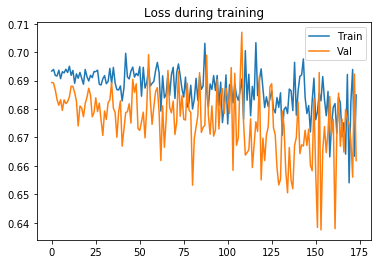

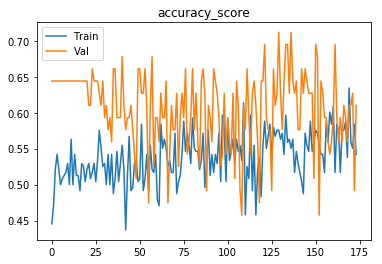

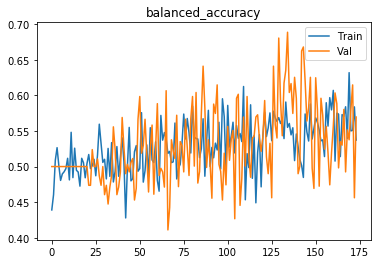

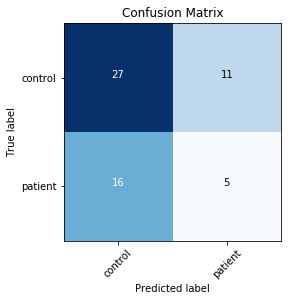

###### Starting inner fold 3
{'model': 'ModelLiu', 'batch_size': 16, 'patience': 16, 'lr': 0.0001}
Trainable model parameters: 116001
torch.Size([1, 72, 57, 75])


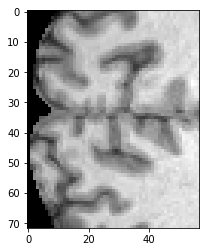

[0,     5] loss: 0.69688
[0,    10] loss: 0.68920
Time elapsed: 0h:0m:23s
train accuracy_score: 50.84 %
train balanced_accuracy: 51.58 %
val accuracy_score: 61.02 %
val balanced_accuracy: 47.37 %
Val loss: 0.686305
[1,     5] loss: 0.69251
[1,    10] loss: 0.68668
Time elapsed: 0h:1m:8s
train accuracy_score: 51.26 %
train balanced_accuracy: 49.97 %
val accuracy_score: 64.41 %
val balanced_accuracy: 50.00 %
Val loss: 0.684059
[2,     5] loss: 0.69888
[2,    10] loss: 0.68933
Time elapsed: 0h:1m:52s
train accuracy_score: 51.68 %
train balanced_accuracy: 49.92 %
val accuracy_score: 64.41 %
val balanced_accuracy: 50.00 %
Val loss: 0.677041
[3,     5] loss: 0.67664
[3,    10] loss: 0.69747
Time elapsed: 0h:2m:37s
train accuracy_score: 53.78 %
train balanced_accuracy: 51.83 %
val accuracy_score: 64.41 %
val balanced_accuracy: 50.00 %
Val loss: 0.681423
[4,     5] loss: 0.68923
[4,    10] loss: 0.69669
Time elapsed: 0h:3m:22s
train accuracy_score: 53.78 %
train balanced_accuracy: 51.86 %
val 

[38,     5] loss: 0.69374
[38,    10] loss: 0.69301
Time elapsed: 0h:28m:35s
train accuracy_score: 51.26 %
train balanced_accuracy: 50.18 %
val accuracy_score: 61.02 %
val balanced_accuracy: 51.63 %
Val loss: 0.680571
[39,     5] loss: 0.69518
[39,    10] loss: 0.67799
Time elapsed: 0h:29m:19s
train accuracy_score: 56.72 %
train balanced_accuracy: 56.38 %
val accuracy_score: 66.10 %
val balanced_accuracy: 56.64 %
Val loss: 0.668149
[40,     5] loss: 0.70267
[40,    10] loss: 0.67609
Time elapsed: 0h:30m:3s
train accuracy_score: 51.26 %
train balanced_accuracy: 51.17 %
val accuracy_score: 59.32 %
val balanced_accuracy: 52.44 %
Val loss: 0.685794
[41,     5] loss: 0.69463
[41,    10] loss: 0.67992
Time elapsed: 0h:30m:47s
train accuracy_score: 58.82 %
train balanced_accuracy: 58.08 %
val accuracy_score: 69.49 %
val balanced_accuracy: 59.27 %
Val loss: 0.643396
[42,     5] loss: 0.68162
[42,    10] loss: 0.71032
Time elapsed: 0h:31m:32s
train accuracy_score: 52.10 %
train balanced_accurac

val accuracy_score: 54.24 %
val balanced_accuracy: 44.24 %
Val loss: 0.678230
[76,     5] loss: 0.68448
[76,    10] loss: 0.68495
Time elapsed: 0h:56m:48s
train accuracy_score: 50.84 %
train balanced_accuracy: 50.31 %
val accuracy_score: 61.02 %
val balanced_accuracy: 52.69 %
Val loss: 0.676887
[77,     5] loss: 0.68559
[77,    10] loss: 0.70357
Time elapsed: 0h:57m:33s
train accuracy_score: 50.00 %
train balanced_accuracy: 48.90 %
val accuracy_score: 55.93 %
val balanced_accuracy: 49.81 %
Val loss: 0.686558
[78,     5] loss: 0.68704
[78,    10] loss: 0.70072
Time elapsed: 0h:58m:18s
train accuracy_score: 51.26 %
train balanced_accuracy: 51.53 %
val accuracy_score: 64.41 %
val balanced_accuracy: 65.98 %
Val loss: 0.682702
[79,     5] loss: 0.66857
[79,    10] loss: 0.68824
Time elapsed: 0h:59m:3s
train accuracy_score: 63.87 %
train balanced_accuracy: 63.24 %
val accuracy_score: 64.41 %
val balanced_accuracy: 51.07 %
Val loss: 0.667886
[80,     5] loss: 0.69208
[80,    10] loss: 0.68005

Time elapsed: 1h:24m:16s
train accuracy_score: 55.46 %
train balanced_accuracy: 54.71 %
val accuracy_score: 59.32 %
val balanced_accuracy: 54.57 %
Val loss: 0.678773
[114,     5] loss: 0.67072
[114,    10] loss: 0.66459
Time elapsed: 1h:25m:1s
train accuracy_score: 57.98 %
train balanced_accuracy: 56.92 %
val accuracy_score: 55.93 %
val balanced_accuracy: 46.62 %
Val loss: 0.677614
[115,     5] loss: 0.70248
[115,    10] loss: 0.67066
Time elapsed: 1h:25m:45s
train accuracy_score: 56.72 %
train balanced_accuracy: 56.59 %
val accuracy_score: 62.71 %
val balanced_accuracy: 66.79 %
Val loss: 0.661793
[116,     5] loss: 0.67965
[116,    10] loss: 0.66568
Time elapsed: 1h:26m:30s
train accuracy_score: 54.62 %
train balanced_accuracy: 54.51 %
val accuracy_score: 57.63 %
val balanced_accuracy: 54.32 %
Val loss: 0.666429
[117,     5] loss: 0.68615
[117,    10] loss: 0.68281
Time elapsed: 1h:27m:14s
train accuracy_score: 57.14 %
train balanced_accuracy: 56.61 %
val accuracy_score: 61.02 %
val b

val accuracy_score: 69.49 %
val balanced_accuracy: 67.79 %
Val loss: 0.653691
[151,     5] loss: 0.67705
[151,    10] loss: 0.69599
Time elapsed: 1h:52m:25s
train accuracy_score: 55.04 %
train balanced_accuracy: 55.02 %
val accuracy_score: 72.88 %
val balanced_accuracy: 74.69 %
Val loss: 0.652411
[152,     5] loss: 0.68561
[152,    10] loss: 0.66158
Time elapsed: 1h:53m:10s
train accuracy_score: 56.72 %
train balanced_accuracy: 55.78 %
val accuracy_score: 64.41 %
val balanced_accuracy: 51.07 %
Val loss: 0.644895
[153,     5] loss: 0.68883
[153,    10] loss: 0.67324
Time elapsed: 1h:53m:56s
train accuracy_score: 58.40 %
train balanced_accuracy: 58.38 %
val accuracy_score: 69.49 %
val balanced_accuracy: 69.92 %
Val loss: 0.665795
[154,     5] loss: 0.68909
[154,    10] loss: 0.68292
Time elapsed: 1h:54m:41s
train accuracy_score: 58.82 %
train balanced_accuracy: 58.33 %
val accuracy_score: 67.80 %
val balanced_accuracy: 61.15 %
Val loss: 0.649490
[155,     5] loss: 0.68536
[155,    10] lo

[188,     5] loss: 0.61973
[188,    10] loss: 0.67592
Time elapsed: 2h:19m:50s
train accuracy_score: 63.03 %
train balanced_accuracy: 62.43 %
val accuracy_score: 69.49 %
val balanced_accuracy: 73.12 %
Val loss: 0.640765
[189,     5] loss: 0.65195
[189,    10] loss: 0.66445
Time elapsed: 2h:20m:34s
train accuracy_score: 60.08 %
train balanced_accuracy: 60.07 %
val accuracy_score: 54.24 %
val balanced_accuracy: 50.63 %
Val loss: 0.663770
[190,     5] loss: 0.63540
[190,    10] loss: 0.68597
Time elapsed: 2h:21m:19s
train accuracy_score: 59.24 %
train balanced_accuracy: 59.26 %
val accuracy_score: 59.32 %
val balanced_accuracy: 62.03 %
Val loss: 0.694684
[191,     5] loss: 0.66395
[191,    10] loss: 0.66483
Time elapsed: 2h:22m:3s
train accuracy_score: 57.14 %
train balanced_accuracy: 56.36 %
val accuracy_score: 67.80 %
val balanced_accuracy: 63.28 %
Val loss: 0.636360
[192,     5] loss: 0.65594
[192,    10] loss: 0.68804
Time elapsed: 2h:22m:48s
train accuracy_score: 55.46 %
train balanc

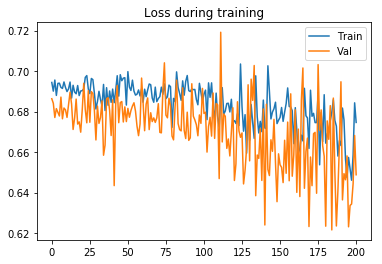

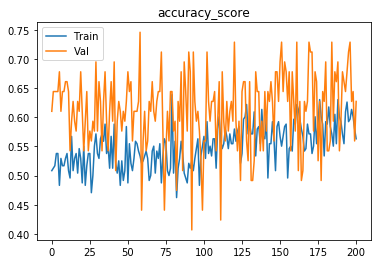

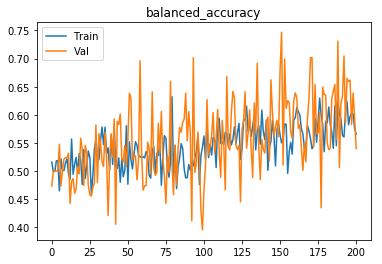

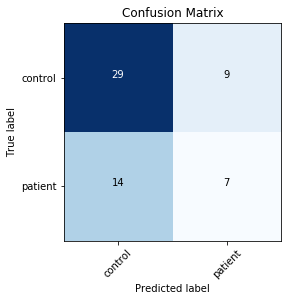

###### Starting inner fold 4
{'model': 'ModelLiu', 'batch_size': 32, 'patience': 16, 'lr': 5e-05}
Trainable model parameters: 116001
torch.Size([1, 72, 57, 75])


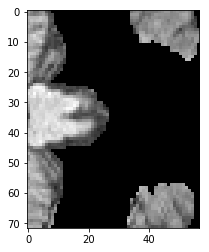

[0,     5] loss: 0.69217
Time elapsed: 0h:0m:23s
train accuracy_score: 49.58 %
train balanced_accuracy: 50.55 %
val accuracy_score: 35.59 %
val balanced_accuracy: 50.00 %
Val loss: 0.696210
[1,     5] loss: 0.69215
Time elapsed: 0h:1m:8s
train accuracy_score: 50.42 %
train balanced_accuracy: 50.40 %
val accuracy_score: 61.02 %
val balanced_accuracy: 47.37 %
Val loss: 0.691256
[2,     5] loss: 0.69152
Time elapsed: 0h:1m:54s
train accuracy_score: 54.20 %
train balanced_accuracy: 53.29 %
val accuracy_score: 64.41 %
val balanced_accuracy: 50.00 %
Val loss: 0.687440
[3,     5] loss: 0.69135
Time elapsed: 0h:2m:39s
train accuracy_score: 49.58 %
train balanced_accuracy: 48.22 %
val accuracy_score: 64.41 %
val balanced_accuracy: 50.00 %
Val loss: 0.684314
[4,     5] loss: 0.69538
Time elapsed: 0h:3m:23s
train accuracy_score: 50.42 %
train balanced_accuracy: 49.06 %
val accuracy_score: 64.41 %
val balanced_accuracy: 50.00 %
Val loss: 0.687733
[5,     5] loss: 0.69346
Time elapsed: 0h:4m:8s
tra

[43,     5] loss: 0.69363
Time elapsed: 0h:32m:36s
train accuracy_score: 50.84 %
train balanced_accuracy: 49.32 %
val accuracy_score: 64.41 %
val balanced_accuracy: 50.00 %
Val loss: 0.676646
[44,     5] loss: 0.69016
Time elapsed: 0h:33m:21s
train accuracy_score: 55.88 %
train balanced_accuracy: 54.44 %
val accuracy_score: 64.41 %
val balanced_accuracy: 50.00 %
Val loss: 0.678713
[45,     5] loss: 0.68884
Time elapsed: 0h:34m:5s
train accuracy_score: 53.36 %
train balanced_accuracy: 51.74 %
val accuracy_score: 64.41 %
val balanced_accuracy: 50.00 %
Val loss: 0.677158
[46,     5] loss: 0.69557
Time elapsed: 0h:34m:51s
train accuracy_score: 50.84 %
train balanced_accuracy: 49.18 %
val accuracy_score: 62.71 %
val balanced_accuracy: 48.68 %
Val loss: 0.677493
[47,     5] loss: 0.68501
Time elapsed: 0h:35m:36s
train accuracy_score: 57.14 %
train balanced_accuracy: 55.58 %
val accuracy_score: 62.71 %
val balanced_accuracy: 48.68 %
Val loss: 0.679185
[48,     5] loss: 0.69036
Time elapsed: 0

[86,     5] loss: 0.69101
Time elapsed: 1h:4m:50s
train accuracy_score: 50.42 %
train balanced_accuracy: 49.94 %
val accuracy_score: 57.63 %
val balanced_accuracy: 51.13 %
Val loss: 0.687859
[87,     5] loss: 0.69333
Time elapsed: 1h:5m:35s
train accuracy_score: 50.42 %
train balanced_accuracy: 50.01 %
val accuracy_score: 49.15 %
val balanced_accuracy: 44.55 %
Val loss: 0.692412
[88,     5] loss: 0.68862
Time elapsed: 1h:6m:19s
train accuracy_score: 56.72 %
train balanced_accuracy: 56.49 %
val accuracy_score: 54.24 %
val balanced_accuracy: 45.30 %
Val loss: 0.686696
[89,     5] loss: 0.68984
Time elapsed: 1h:7m:4s
train accuracy_score: 52.94 %
train balanced_accuracy: 52.61 %
val accuracy_score: 72.88 %
val balanced_accuracy: 69.36 %
Val loss: 0.676463
[90,     5] loss: 0.69118
Time elapsed: 1h:7m:49s
train accuracy_score: 50.42 %
train balanced_accuracy: 49.84 %
val accuracy_score: 61.02 %
val balanced_accuracy: 53.76 %
Val loss: 0.680231
[91,     5] loss: 0.69386
Time elapsed: 1h:8m:

[129,     5] loss: 0.68888
Time elapsed: 1h:37m:4s
train accuracy_score: 52.10 %
train balanced_accuracy: 51.27 %
val accuracy_score: 54.24 %
val balanced_accuracy: 45.30 %
Val loss: 0.676826
[130,     5] loss: 0.69611
Time elapsed: 1h:37m:50s
train accuracy_score: 50.00 %
train balanced_accuracy: 49.26 %
val accuracy_score: 55.93 %
val balanced_accuracy: 49.81 %
Val loss: 0.685456
[131,     5] loss: 0.68638
Time elapsed: 1h:38m:35s
train accuracy_score: 55.04 %
train balanced_accuracy: 54.41 %
val accuracy_score: 67.80 %
val balanced_accuracy: 60.09 %
Val loss: 0.668715
[132,     5] loss: 0.68742
Time elapsed: 1h:39m:20s
train accuracy_score: 54.62 %
train balanced_accuracy: 53.80 %
val accuracy_score: 55.93 %
val balanced_accuracy: 48.75 %
Val loss: 0.682521
[133,     5] loss: 0.69027
Time elapsed: 1h:40m:5s
train accuracy_score: 51.68 %
train balanced_accuracy: 51.19 %
val accuracy_score: 71.19 %
val balanced_accuracy: 66.98 %
Val loss: 0.666978
[134,     5] loss: 0.69345
Time elaps

val accuracy_score: 55.93 %
val balanced_accuracy: 46.62 %
Val loss: 0.679454
[172,     5] loss: 0.69087
Time elapsed: 2h:9m:22s
train accuracy_score: 51.26 %
train balanced_accuracy: 50.43 %
val accuracy_score: 64.41 %
val balanced_accuracy: 54.26 %
Val loss: 0.682401
[173,     5] loss: 0.69889
Time elapsed: 2h:10m:6s
train accuracy_score: 49.16 %
train balanced_accuracy: 48.59 %
val accuracy_score: 66.10 %
val balanced_accuracy: 65.16 %
Val loss: 0.685826
[174,     5] loss: 0.69183
Time elapsed: 2h:10m:51s
train accuracy_score: 48.32 %
train balanced_accuracy: 47.93 %
val accuracy_score: 55.93 %
val balanced_accuracy: 48.75 %
Val loss: 0.679403
[175,     5] loss: 0.69107
Time elapsed: 2h:11m:35s
train accuracy_score: 52.10 %
train balanced_accuracy: 51.49 %
val accuracy_score: 59.32 %
val balanced_accuracy: 49.25 %
Val loss: 0.687230
[176,     5] loss: 0.68904
Time elapsed: 2h:12m:20s
train accuracy_score: 52.10 %
train balanced_accuracy: 51.24 %
val accuracy_score: 62.71 %
val balan

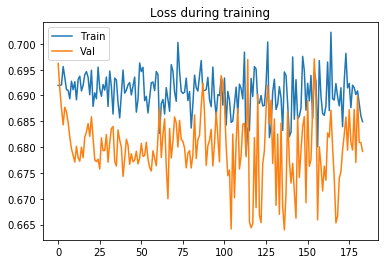

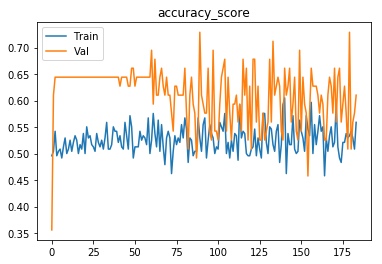

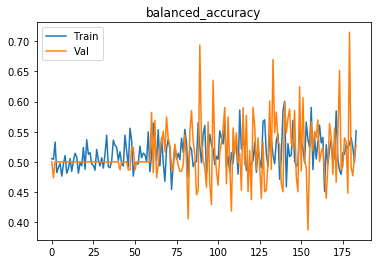

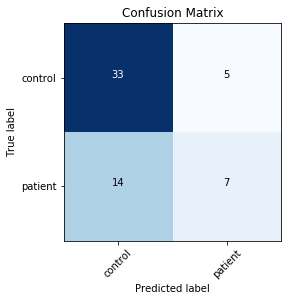

Finished outer fold.
{'final_acc': 0.69110275689223055, 'best_acc': 0.71741854636591484, 'final_iter': 190, 'best_iter': 141, 'params': {'model': 'ModelLiu', 'batch_size': 12, 'patience': 16, 'lr': 0.0001}, 'inner_fold_idx': 1}
###### Starting outer fold 9
238
59
Shuffled the data..
###### Starting inner fold 0
{'model': 'ModelLiu', 'batch_size': 16, 'patience': 16, 'lr': 0.0001}
Trainable model parameters: 116001
torch.Size([1, 72, 57, 75])


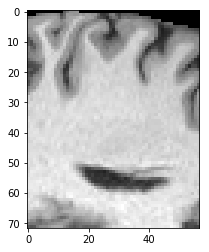

[0,     5] loss: 0.69268
[0,    10] loss: 0.70424
Time elapsed: 0h:0m:23s
train accuracy_score: 49.16 %
train balanced_accuracy: 51.14 %
val accuracy_score: 54.24 %
val balanced_accuracy: 48.48 %
Val loss: 0.690506
[1,     5] loss: 0.69560
[1,    10] loss: 0.70008
Time elapsed: 0h:1m:7s
train accuracy_score: 51.68 %
train balanced_accuracy: 49.95 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.682003
[2,     5] loss: 0.69480
[2,    10] loss: 0.67416
Time elapsed: 0h:1m:52s
train accuracy_score: 55.46 %
train balanced_accuracy: 52.83 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.692691
[3,     5] loss: 0.69267
[3,    10] loss: 0.69362
Time elapsed: 0h:2m:36s
train accuracy_score: 52.10 %
train balanced_accuracy: 49.45 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.684317
[4,     5] loss: 0.69980
[4,    10] loss: 0.68700
Time elapsed: 0h:3m:20s
train accuracy_score: 52.52 %
train balanced_accuracy: 50.30 %
val 

[38,     5] loss: 0.68562
[38,    10] loss: 0.69631
Time elapsed: 0h:28m:35s
train accuracy_score: 53.36 %
train balanced_accuracy: 51.34 %
val accuracy_score: 57.63 %
val balanced_accuracy: 52.33 %
Val loss: 0.685499
[39,     5] loss: 0.69143
[39,    10] loss: 0.69225
Time elapsed: 0h:29m:21s
train accuracy_score: 54.20 %
train balanced_accuracy: 51.93 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.679820
[40,     5] loss: 0.69634
[40,    10] loss: 0.67773
Time elapsed: 0h:30m:8s
train accuracy_score: 51.26 %
train balanced_accuracy: 49.16 %
val accuracy_score: 54.24 %
val balanced_accuracy: 49.71 %
Val loss: 0.692419
[41,     5] loss: 0.69233
[41,    10] loss: 0.68767
Time elapsed: 0h:30m:55s
train accuracy_score: 51.68 %
train balanced_accuracy: 50.20 %
val accuracy_score: 52.54 %
val balanced_accuracy: 48.60 %
Val loss: 0.685800
[42,     5] loss: 0.68368
[42,    10] loss: 0.69051
Time elapsed: 0h:31m:41s
train accuracy_score: 54.20 %
train balanced_accurac

val accuracy_score: 55.93 %
val balanced_accuracy: 52.04 %
Val loss: 0.679150
[76,     5] loss: 0.67541
[76,    10] loss: 0.67870
Time elapsed: 0h:56m:54s
train accuracy_score: 55.46 %
train balanced_accuracy: 53.67 %
val accuracy_score: 50.85 %
val balanced_accuracy: 47.90 %
Val loss: 0.699250
[77,     5] loss: 0.68976
[77,    10] loss: 0.69960
Time elapsed: 0h:57m:38s
train accuracy_score: 48.32 %
train balanced_accuracy: 47.72 %
val accuracy_score: 45.76 %
val balanced_accuracy: 43.36 %
Val loss: 0.701872
[78,     5] loss: 0.67793
[78,    10] loss: 0.69620
Time elapsed: 0h:58m:23s
train accuracy_score: 59.24 %
train balanced_accuracy: 58.48 %
val accuracy_score: 61.02 %
val balanced_accuracy: 57.40 %
Val loss: 0.669175
[79,     5] loss: 0.69449
[79,    10] loss: 0.68805
Time elapsed: 0h:59m:8s
train accuracy_score: 52.10 %
train balanced_accuracy: 51.29 %
val accuracy_score: 61.02 %
val balanced_accuracy: 60.66 %
Val loss: 0.686413
[80,     5] loss: 0.68374
[80,    10] loss: 0.68138

Time elapsed: 1h:24m:22s
train accuracy_score: 57.56 %
train balanced_accuracy: 56.80 %
val accuracy_score: 59.32 %
val balanced_accuracy: 58.33 %
Val loss: 0.677239
[114,     5] loss: 0.69529
[114,    10] loss: 0.68975
Time elapsed: 1h:25m:7s
train accuracy_score: 49.16 %
train balanced_accuracy: 49.21 %
val accuracy_score: 52.54 %
val balanced_accuracy: 47.38 %
Val loss: 0.710147
[115,     5] loss: 0.69933
[115,    10] loss: 0.68862
Time elapsed: 1h:25m:52s
train accuracy_score: 53.78 %
train balanced_accuracy: 52.53 %
val accuracy_score: 55.93 %
val balanced_accuracy: 52.04 %
Val loss: 0.684507
[116,     5] loss: 0.68117
[116,    10] loss: 0.69120
Time elapsed: 1h:26m:37s
train accuracy_score: 54.62 %
train balanced_accuracy: 53.27 %
val accuracy_score: 57.63 %
val balanced_accuracy: 52.74 %
Val loss: 0.679728
[117,     5] loss: 0.66499
[117,    10] loss: 0.67856
Time elapsed: 1h:27m:21s
train accuracy_score: 60.92 %
train balanced_accuracy: 59.18 %
val accuracy_score: 59.32 %
val b

val accuracy_score: 61.02 %
val balanced_accuracy: 59.44 %
Val loss: 0.650359
[151,     5] loss: 0.69689
[151,    10] loss: 0.67254
Time elapsed: 1h:52m:43s
train accuracy_score: 55.88 %
train balanced_accuracy: 56.89 %
val accuracy_score: 59.32 %
val balanced_accuracy: 60.78 %
Val loss: 0.686649
[152,     5] loss: 0.68199
[152,    10] loss: 0.65763
Time elapsed: 1h:53m:27s
train accuracy_score: 57.98 %
train balanced_accuracy: 57.29 %
val accuracy_score: 66.10 %
val balanced_accuracy: 64.39 %
Val loss: 0.658690
[153,     5] loss: 0.68406
[153,    10] loss: 0.67232
Time elapsed: 1h:54m:12s
train accuracy_score: 59.66 %
train balanced_accuracy: 58.43 %
val accuracy_score: 64.41 %
val balanced_accuracy: 61.25 %
Val loss: 0.668767
[154,     5] loss: 0.65552
[154,    10] loss: 0.68057
Time elapsed: 1h:54m:56s
train accuracy_score: 57.14 %
train balanced_accuracy: 56.20 %
val accuracy_score: 59.32 %
val balanced_accuracy: 56.70 %
Val loss: 0.664662
[155,     5] loss: 0.67262
[155,    10] lo

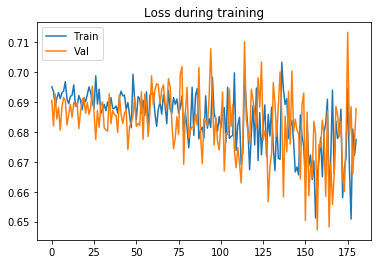

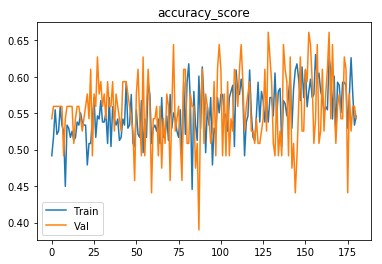

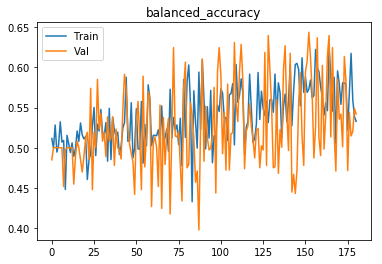

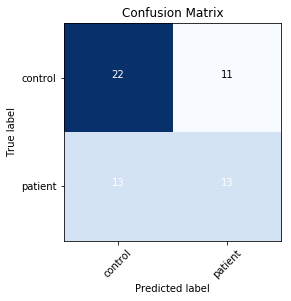

###### Starting inner fold 1
{'model': 'ModelLiu', 'batch_size': 12, 'patience': 12, 'lr': 0.0001}
Trainable model parameters: 116001
torch.Size([1, 72, 57, 75])


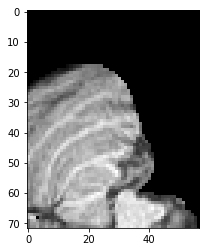

[0,     5] loss: 0.69371
[0,    10] loss: 0.69433
[0,    15] loss: 0.69677
Time elapsed: 0h:0m:22s
train accuracy_score: 51.26 %
train balanced_accuracy: 50.05 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.691449
[1,     5] loss: 0.68997
[1,    10] loss: 0.69544
[1,    15] loss: 0.68545
Time elapsed: 0h:1m:5s
train accuracy_score: 54.62 %
train balanced_accuracy: 52.58 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.687274
[2,     5] loss: 0.68568
[2,    10] loss: 0.68063
[2,    15] loss: 0.69741
Time elapsed: 0h:1m:48s
train accuracy_score: 52.10 %
train balanced_accuracy: 49.26 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.689026
[3,     5] loss: 0.67913
[3,    10] loss: 0.70795
[3,    15] loss: 0.69054
Time elapsed: 0h:2m:32s
train accuracy_score: 53.78 %
train balanced_accuracy: 51.29 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.688166
[4,     5] loss: 0.68752
[4,    10] loss:

[34,     5] loss: 0.68468
[34,    10] loss: 0.69953
[34,    15] loss: 0.69744
Time elapsed: 0h:25m:2s
train accuracy_score: 53.78 %
train balanced_accuracy: 51.14 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.680616
[35,     5] loss: 0.68044
[35,    10] loss: 0.68919
[35,    15] loss: 0.69689
Time elapsed: 0h:25m:45s
train accuracy_score: 54.20 %
train balanced_accuracy: 51.64 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.688692
[36,     5] loss: 0.69761
[36,    10] loss: 0.69032
[36,    15] loss: 0.69510
Time elapsed: 0h:26m:29s
train accuracy_score: 51.68 %
train balanced_accuracy: 49.55 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.41 %
Val loss: 0.689025
[37,     5] loss: 0.69895
[37,    10] loss: 0.68775
[37,    15] loss: 0.67726
Time elapsed: 0h:27m:12s
train accuracy_score: 54.20 %
train balanced_accuracy: 52.18 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.681984
[38,     5] loss: 0.70216

val accuracy_score: 59.32 %
val balanced_accuracy: 54.66 %
Val loss: 0.679582
[68,     5] loss: 0.65679
[68,    10] loss: 0.71128
[68,    15] loss: 0.71869
Time elapsed: 0h:49m:49s
train accuracy_score: 50.84 %
train balanced_accuracy: 48.91 %
val accuracy_score: 62.71 %
val balanced_accuracy: 58.10 %
Val loss: 0.689917
[69,     5] loss: 0.67548
[69,    10] loss: 0.67967
[69,    15] loss: 0.68765
Time elapsed: 0h:50m:33s
train accuracy_score: 52.10 %
train balanced_accuracy: 50.15 %
val accuracy_score: 57.63 %
val balanced_accuracy: 52.74 %
Val loss: 0.690528
[70,     5] loss: 0.68498
[70,    10] loss: 0.70461
[70,    15] loss: 0.68076
Time elapsed: 0h:51m:17s
train accuracy_score: 51.26 %
train balanced_accuracy: 49.45 %
val accuracy_score: 54.24 %
val balanced_accuracy: 48.89 %
Val loss: 0.678478
[71,     5] loss: 0.69007
[71,    10] loss: 0.67667
[71,    15] loss: 0.67979
Time elapsed: 0h:52m:0s
train accuracy_score: 54.20 %
train balanced_accuracy: 51.69 %
val accuracy_score: 55.93

Time elapsed: 1h:13m:49s
train accuracy_score: 55.46 %
train balanced_accuracy: 53.87 %
val accuracy_score: 61.02 %
val balanced_accuracy: 56.18 %
Val loss: 0.669997
[102,     5] loss: 0.67912
[102,    10] loss: 0.69383
[102,    15] loss: 0.67775
Time elapsed: 1h:14m:33s
train accuracy_score: 56.72 %
train balanced_accuracy: 55.80 %
val accuracy_score: 52.54 %
val balanced_accuracy: 52.27 %
Val loss: 0.682940
[103,     5] loss: 0.68848
[103,    10] loss: 0.68290
[103,    15] loss: 0.70077
Time elapsed: 1h:15m:16s
train accuracy_score: 53.36 %
train balanced_accuracy: 53.17 %
val accuracy_score: 59.32 %
val balanced_accuracy: 56.29 %
Val loss: 0.682825
[104,     5] loss: 0.68022
[104,    10] loss: 0.70676
[104,    15] loss: 0.68871
Time elapsed: 1h:16m:0s
train accuracy_score: 51.68 %
train balanced_accuracy: 49.70 %
val accuracy_score: 54.24 %
val balanced_accuracy: 50.93 %
Val loss: 0.691207
[105,     5] loss: 0.68083
[105,    10] loss: 0.68014
[105,    15] loss: 0.69612
Time elapsed:

val accuracy_score: 57.63 %
val balanced_accuracy: 57.23 %
Val loss: 0.669784
[135,     5] loss: 0.64964
[135,    10] loss: 0.74277
[135,    15] loss: 0.67140
Time elapsed: 1h:38m:38s
train accuracy_score: 56.30 %
train balanced_accuracy: 54.91 %
val accuracy_score: 52.54 %
val balanced_accuracy: 48.19 %
Val loss: 0.689054
[136,     5] loss: 0.67613
[136,    10] loss: 0.69023
[136,    15] loss: 0.67722
Time elapsed: 1h:39m:21s
train accuracy_score: 55.04 %
train balanced_accuracy: 55.21 %
val accuracy_score: 59.32 %
val balanced_accuracy: 56.29 %
Val loss: 0.679490
[137,     5] loss: 0.66275
[137,    10] loss: 0.70111
[137,    15] loss: 0.67479
Time elapsed: 1h:40m:5s
train accuracy_score: 55.04 %
train balanced_accuracy: 53.82 %
val accuracy_score: 61.02 %
val balanced_accuracy: 61.07 %
Val loss: 0.672746
[138,     5] loss: 0.67072
[138,    10] loss: 0.66110
[138,    15] loss: 0.67863
Time elapsed: 1h:40m:49s
train accuracy_score: 59.24 %
train balanced_accuracy: 58.93 %
val accuracy_

[168,     5] loss: 0.69477
[168,    10] loss: 0.68058
[168,    15] loss: 0.68748
Time elapsed: 2h:2m:43s
train accuracy_score: 53.78 %
train balanced_accuracy: 52.63 %
val accuracy_score: 57.63 %
val balanced_accuracy: 56.00 %
Val loss: 0.673204
[169,     5] loss: 0.68688
[169,    10] loss: 0.68646
[169,    15] loss: 0.64691
Time elapsed: 2h:3m:26s
train accuracy_score: 56.30 %
train balanced_accuracy: 55.21 %
val accuracy_score: 59.32 %
val balanced_accuracy: 55.07 %
Val loss: 0.674842
[170,     5] loss: 0.65923
[170,    10] loss: 0.65555
[170,    15] loss: 0.65650
Time elapsed: 2h:4m:10s
train accuracy_score: 62.18 %
train balanced_accuracy: 61.21 %
val accuracy_score: 57.63 %
val balanced_accuracy: 55.59 %
Val loss: 0.677290
[171,     5] loss: 0.67910
[171,    10] loss: 0.66977
[171,    15] loss: 0.65938
Time elapsed: 2h:4m:54s
train accuracy_score: 57.14 %
train balanced_accuracy: 56.30 %
val accuracy_score: 61.02 %
val balanced_accuracy: 59.85 %
Val loss: 0.661455
[172,     5] los

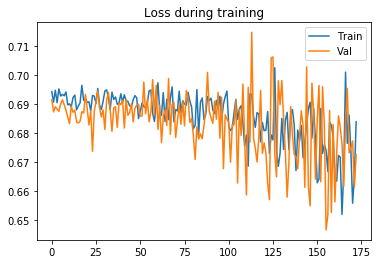

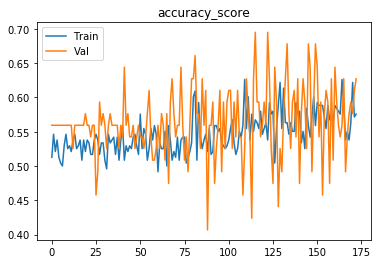

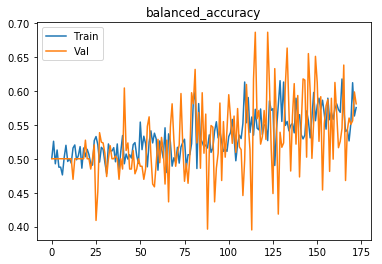

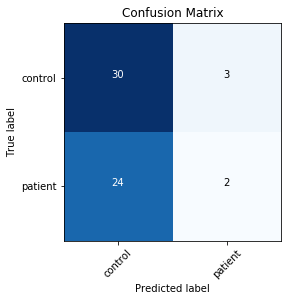

###### Starting inner fold 2
{'model': 'ModelLiu', 'batch_size': 16, 'patience': 16, 'lr': 5e-05}
Trainable model parameters: 116001
torch.Size([1, 72, 57, 75])


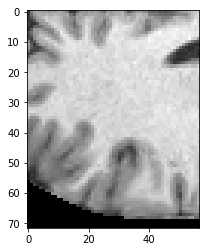

[0,     5] loss: 0.69280
[0,    10] loss: 0.69032
Time elapsed: 0h:0m:23s
train accuracy_score: 52.10 %
train balanced_accuracy: 49.70 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.689852
[1,     5] loss: 0.68846
[1,    10] loss: 0.69084
Time elapsed: 0h:1m:8s
train accuracy_score: 52.52 %
train balanced_accuracy: 49.95 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.690279
[2,     5] loss: 0.69316
[2,    10] loss: 0.69995
Time elapsed: 0h:1m:53s
train accuracy_score: 55.46 %
train balanced_accuracy: 52.78 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.688442
[3,     5] loss: 0.69868
[3,    10] loss: 0.68955
Time elapsed: 0h:2m:37s
train accuracy_score: 50.42 %
train balanced_accuracy: 47.62 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.689843
[4,     5] loss: 0.70131
[4,    10] loss: 0.68269
Time elapsed: 0h:3m:22s
train accuracy_score: 52.52 %
train balanced_accuracy: 49.60 %
val 

[38,     5] loss: 0.69334
[38,    10] loss: 0.69546
Time elapsed: 0h:28m:47s
train accuracy_score: 54.62 %
train balanced_accuracy: 52.23 %
val accuracy_score: 61.02 %
val balanced_accuracy: 55.77 %
Val loss: 0.681847
[39,     5] loss: 0.69791
[39,    10] loss: 0.68734
Time elapsed: 0h:29m:32s
train accuracy_score: 52.52 %
train balanced_accuracy: 50.20 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.82 %
Val loss: 0.690665
[40,     5] loss: 0.69293
[40,    10] loss: 0.68819
Time elapsed: 0h:30m:17s
train accuracy_score: 55.04 %
train balanced_accuracy: 52.53 %
val accuracy_score: 52.54 %
val balanced_accuracy: 47.79 %
Val loss: 0.695837
[41,     5] loss: 0.67867
[41,    10] loss: 0.69576
Time elapsed: 0h:31m:3s
train accuracy_score: 51.68 %
train balanced_accuracy: 48.96 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.82 %
Val loss: 0.683698
[42,     5] loss: 0.68507
[42,    10] loss: 0.69133
Time elapsed: 0h:31m:48s
train accuracy_score: 52.94 %
train balanced_accurac

val accuracy_score: 55.93 %
val balanced_accuracy: 52.86 %
Val loss: 0.683326
[76,     5] loss: 0.69555
[76,    10] loss: 0.68594
Time elapsed: 0h:57m:17s
train accuracy_score: 52.94 %
train balanced_accuracy: 51.34 %
val accuracy_score: 59.32 %
val balanced_accuracy: 55.07 %
Val loss: 0.676579
[77,     5] loss: 0.68735
[77,    10] loss: 0.70553
Time elapsed: 0h:58m:2s
train accuracy_score: 57.98 %
train balanced_accuracy: 56.45 %
val accuracy_score: 62.71 %
val balanced_accuracy: 59.32 %
Val loss: 0.674906
[78,     5] loss: 0.67315
[78,    10] loss: 0.68669
Time elapsed: 0h:58m:48s
train accuracy_score: 55.04 %
train balanced_accuracy: 53.32 %
val accuracy_score: 54.24 %
val balanced_accuracy: 50.52 %
Val loss: 0.683789
[79,     5] loss: 0.67742
[79,    10] loss: 0.66951
Time elapsed: 0h:59m:33s
train accuracy_score: 61.76 %
train balanced_accuracy: 60.37 %
val accuracy_score: 57.63 %
val balanced_accuracy: 55.19 %
Val loss: 0.673102
[80,     5] loss: 0.67776
[80,    10] loss: 0.68837

Time elapsed: 1h:24m:55s
train accuracy_score: 57.14 %
train balanced_accuracy: 56.35 %
val accuracy_score: 42.37 %
val balanced_accuracy: 39.51 %
Val loss: 0.703461
[114,     5] loss: 0.70598
[114,    10] loss: 0.66326
Time elapsed: 1h:25m:40s
train accuracy_score: 57.56 %
train balanced_accuracy: 56.65 %
val accuracy_score: 54.24 %
val balanced_accuracy: 51.34 %
Val loss: 0.663619
[115,     5] loss: 0.66681
[115,    10] loss: 0.69430
Time elapsed: 1h:26m:25s
train accuracy_score: 59.66 %
train balanced_accuracy: 58.73 %
val accuracy_score: 52.54 %
val balanced_accuracy: 49.01 %
Val loss: 0.677733
[116,     5] loss: 0.68607
[116,    10] loss: 0.69054
Time elapsed: 1h:27m:10s
train accuracy_score: 54.62 %
train balanced_accuracy: 52.98 %
val accuracy_score: 50.85 %
val balanced_accuracy: 47.90 %
Val loss: 0.674978
[117,     5] loss: 0.70400
[117,    10] loss: 0.68480
Time elapsed: 1h:27m:55s
train accuracy_score: 52.94 %
train balanced_accuracy: 51.69 %
val accuracy_score: 55.93 %
val 

val accuracy_score: 52.54 %
val balanced_accuracy: 49.83 %
Val loss: 0.675123
[151,     5] loss: 0.66499
[151,    10] loss: 0.69932
Time elapsed: 1h:53m:27s
train accuracy_score: 56.30 %
train balanced_accuracy: 54.56 %
val accuracy_score: 47.46 %
val balanced_accuracy: 44.87 %
Val loss: 0.705884
[152,     5] loss: 0.65922
[152,    10] loss: 0.69400
Time elapsed: 1h:54m:13s
train accuracy_score: 54.20 %
train balanced_accuracy: 52.78 %
val accuracy_score: 59.32 %
val balanced_accuracy: 57.93 %
Val loss: 0.663599
[153,     5] loss: 0.70268
[153,    10] loss: 0.68575
Time elapsed: 1h:54m:57s
train accuracy_score: 53.36 %
train balanced_accuracy: 53.12 %
val accuracy_score: 61.02 %
val balanced_accuracy: 60.66 %
Val loss: 0.675707
[154,     5] loss: 0.68974
[154,    10] loss: 0.68574
Time elapsed: 1h:55m:42s
train accuracy_score: 58.82 %
train balanced_accuracy: 58.38 %
val accuracy_score: 59.32 %
val balanced_accuracy: 57.93 %
Val loss: 0.689946
[155,     5] loss: 0.67502
[155,    10] lo

Finished inner fold.


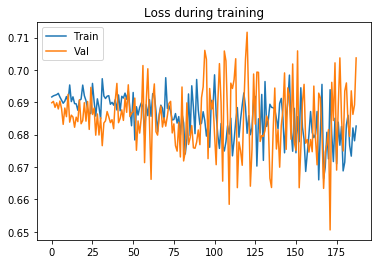

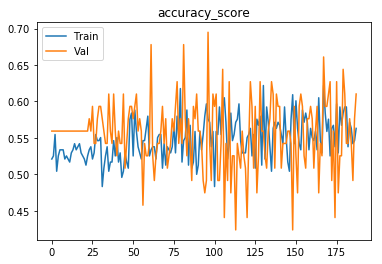

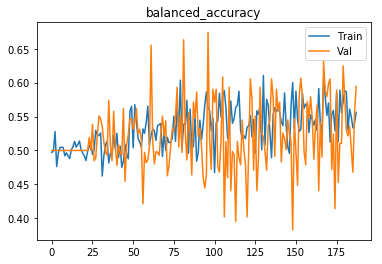

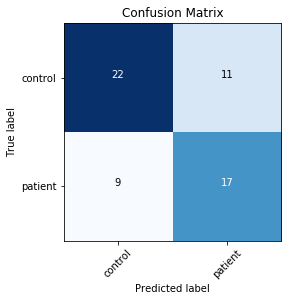

###### Starting inner fold 3
{'model': 'ModelLiu', 'batch_size': 12, 'patience': 12, 'lr': 5e-05}
Trainable model parameters: 116001
torch.Size([1, 72, 57, 75])


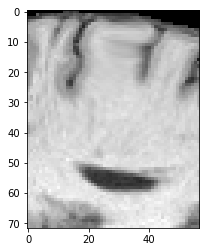

[0,     5] loss: 0.69632
[0,    10] loss: 0.68895
[0,    15] loss: 0.69341
Time elapsed: 0h:0m:22s
train accuracy_score: 47.48 %
train balanced_accuracy: 48.21 %
val accuracy_score: 54.24 %
val balanced_accuracy: 48.48 %
Val loss: 0.691718
[1,     5] loss: 0.69439
[1,    10] loss: 0.68496
[1,    15] loss: 0.69407
Time elapsed: 0h:1m:5s
train accuracy_score: 51.26 %
train balanced_accuracy: 48.96 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.690893
[2,     5] loss: 0.69038
[2,    10] loss: 0.68265
[2,    15] loss: 0.68950
Time elapsed: 0h:1m:48s
train accuracy_score: 56.72 %
train balanced_accuracy: 54.32 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.686667
[3,     5] loss: 0.70026
[3,    10] loss: 0.68573
[3,    15] loss: 0.67859
Time elapsed: 0h:2m:31s
train accuracy_score: 53.78 %
train balanced_accuracy: 51.04 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.690025
[4,     5] loss: 0.69371
[4,    10] loss:

[34,     5] loss: 0.69528
[34,    10] loss: 0.69316
[34,    15] loss: 0.69494
Time elapsed: 0h:25m:5s
train accuracy_score: 50.00 %
train balanced_accuracy: 47.92 %
val accuracy_score: 54.24 %
val balanced_accuracy: 48.48 %
Val loss: 0.690467
[35,     5] loss: 0.69128
[35,    10] loss: 0.69859
[35,    15] loss: 0.69837
Time elapsed: 0h:25m:50s
train accuracy_score: 52.10 %
train balanced_accuracy: 49.80 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.689976
[36,     5] loss: 0.69589
[36,    10] loss: 0.68635
[36,    15] loss: 0.69161
Time elapsed: 0h:26m:34s
train accuracy_score: 53.36 %
train balanced_accuracy: 51.09 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.689758
[37,     5] loss: 0.69023
[37,    10] loss: 0.69216
[37,    15] loss: 0.69180
Time elapsed: 0h:27m:18s
train accuracy_score: 56.30 %
train balanced_accuracy: 53.82 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.689843
[38,     5] loss: 0.68262

val accuracy_score: 47.46 %
val balanced_accuracy: 42.83 %
Val loss: 0.692452
[68,     5] loss: 0.69254
[68,    10] loss: 0.68438
[68,    15] loss: 0.69432
Time elapsed: 0h:49m:49s
train accuracy_score: 52.52 %
train balanced_accuracy: 50.00 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.683408
[69,     5] loss: 0.68984
[69,    10] loss: 0.68927
[69,    15] loss: 0.68178
Time elapsed: 0h:50m:33s
train accuracy_score: 55.04 %
train balanced_accuracy: 52.63 %
val accuracy_score: 57.63 %
val balanced_accuracy: 51.92 %
Val loss: 0.683253
[70,     5] loss: 0.68385
[70,    10] loss: 0.68166
[70,    15] loss: 0.69042
Time elapsed: 0h:51m:17s
train accuracy_score: 54.62 %
train balanced_accuracy: 52.08 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.82 %
Val loss: 0.682776
[71,     5] loss: 0.67864
[71,    10] loss: 0.69004
[71,    15] loss: 0.69039
Time elapsed: 0h:52m:0s
train accuracy_score: 51.26 %
train balanced_accuracy: 49.01 %
val accuracy_score: 59.32

Time elapsed: 1h:13m:46s
train accuracy_score: 54.20 %
train balanced_accuracy: 53.47 %
val accuracy_score: 55.93 %
val balanced_accuracy: 53.26 %
Val loss: 0.692387
[102,     5] loss: 0.69384
[102,    10] loss: 0.70028
[102,    15] loss: 0.68008
Time elapsed: 1h:14m:29s
train accuracy_score: 48.32 %
train balanced_accuracy: 46.58 %
val accuracy_score: 50.85 %
val balanced_accuracy: 46.68 %
Val loss: 0.693956
[103,     5] loss: 0.69492
[103,    10] loss: 0.69432
[103,    15] loss: 0.70302
Time elapsed: 1h:15m:13s
train accuracy_score: 48.74 %
train balanced_accuracy: 47.17 %
val accuracy_score: 61.02 %
val balanced_accuracy: 58.22 %
Val loss: 0.688862
[104,     5] loss: 0.69108
[104,    10] loss: 0.69182
[104,    15] loss: 0.67624
Time elapsed: 1h:15m:57s
train accuracy_score: 53.36 %
train balanced_accuracy: 51.69 %
val accuracy_score: 49.15 %
val balanced_accuracy: 44.35 %
Val loss: 0.685711
[105,     5] loss: 0.68836
[105,    10] loss: 0.69563
[105,    15] loss: 0.68324
Time elapsed

val accuracy_score: 55.93 %
val balanced_accuracy: 52.86 %
Val loss: 0.676759
[135,     5] loss: 0.67298
[135,    10] loss: 0.68396
[135,    15] loss: 0.70022
Time elapsed: 1h:38m:32s
train accuracy_score: 54.20 %
train balanced_accuracy: 52.93 %
val accuracy_score: 57.63 %
val balanced_accuracy: 54.37 %
Val loss: 0.677631
[136,     5] loss: 0.70016
[136,    10] loss: 0.68850
[136,    15] loss: 0.68152
Time elapsed: 1h:39m:16s
train accuracy_score: 50.84 %
train balanced_accuracy: 49.45 %
val accuracy_score: 44.07 %
val balanced_accuracy: 41.43 %
Val loss: 0.697881
[137,     5] loss: 0.67609
[137,    10] loss: 0.70719
[137,    15] loss: 0.70273
Time elapsed: 1h:40m:0s
train accuracy_score: 52.94 %
train balanced_accuracy: 51.69 %
val accuracy_score: 50.85 %
val balanced_accuracy: 47.90 %
Val loss: 0.688950
[138,     5] loss: 0.70596
[138,    10] loss: 0.68310
[138,    15] loss: 0.70577
Time elapsed: 1h:40m:43s
train accuracy_score: 51.68 %
train balanced_accuracy: 50.15 %
val accuracy_

[168,     5] loss: 0.69357
[168,    10] loss: 0.68267
[168,    15] loss: 0.69655
Time elapsed: 2h:2m:22s
train accuracy_score: 55.46 %
train balanced_accuracy: 55.06 %
val accuracy_score: 57.63 %
val balanced_accuracy: 53.96 %
Val loss: 0.687185
[169,     5] loss: 0.68452
[169,    10] loss: 0.68693
[169,    15] loss: 0.66954
Time elapsed: 2h:3m:5s
train accuracy_score: 52.52 %
train balanced_accuracy: 50.35 %
val accuracy_score: 54.24 %
val balanced_accuracy: 48.48 %
Val loss: 0.684412
[170,     5] loss: 0.67324
[170,    10] loss: 0.73328
[170,    15] loss: 0.67223
Time elapsed: 2h:3m:48s
train accuracy_score: 52.52 %
train balanced_accuracy: 50.20 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.82 %
Val loss: 0.691160
[171,     5] loss: 0.68374
[171,    10] loss: 0.69375
[171,    15] loss: 0.67057
Time elapsed: 2h:4m:32s
train accuracy_score: 55.04 %
train balanced_accuracy: 53.22 %
val accuracy_score: 61.02 %
val balanced_accuracy: 56.59 %
Val loss: 0.680463
[172,     5] loss

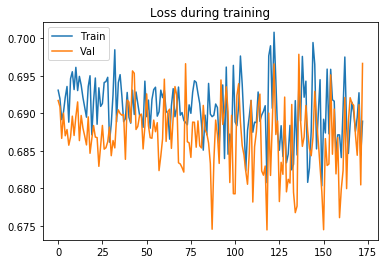

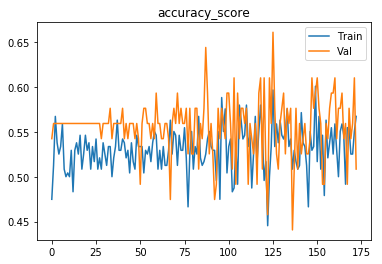

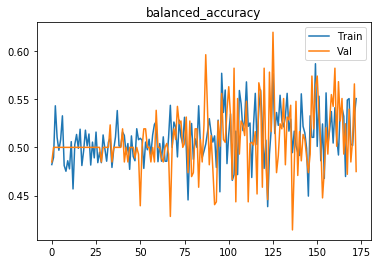

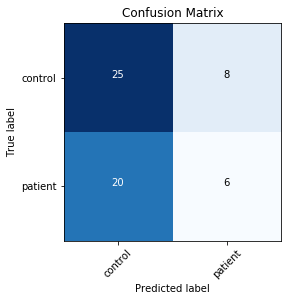

###### Starting inner fold 4
{'model': 'ModelLiu', 'batch_size': 12, 'patience': 12, 'lr': 5e-05}
Trainable model parameters: 116001
torch.Size([1, 72, 57, 75])


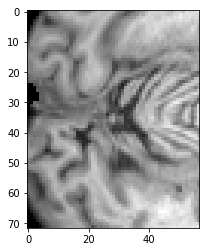

[0,     5] loss: 0.68592
[0,    10] loss: 0.69372
[0,    15] loss: 0.70412
Time elapsed: 0h:0m:21s
train accuracy_score: 52.10 %
train balanced_accuracy: 49.31 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.688937
[1,     5] loss: 0.70056
[1,    10] loss: 0.68439
[1,    15] loss: 0.69534
Time elapsed: 0h:1m:4s
train accuracy_score: 52.94 %
train balanced_accuracy: 50.20 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.690314
[2,     5] loss: 0.69053
[2,    10] loss: 0.69081
[2,    15] loss: 0.70074
Time elapsed: 0h:1m:48s
train accuracy_score: 51.68 %
train balanced_accuracy: 48.81 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.685612
[3,     5] loss: 0.69445
[3,    10] loss: 0.69804
[3,    15] loss: 0.68521
Time elapsed: 0h:2m:32s
train accuracy_score: 53.36 %
train balanced_accuracy: 50.45 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.686142
[4,     5] loss: 0.70507
[4,    10] loss:

[34,     5] loss: 0.69815
[34,    10] loss: 0.68681
[34,    15] loss: 0.68613
Time elapsed: 0h:24m:49s
train accuracy_score: 53.78 %
train balanced_accuracy: 51.29 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.689006
[35,     5] loss: 0.68957
[35,    10] loss: 0.69786
[35,    15] loss: 0.69475
Time elapsed: 0h:25m:32s
train accuracy_score: 50.00 %
train balanced_accuracy: 47.37 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.687752
[36,     5] loss: 0.69386
[36,    10] loss: 0.69020
[36,    15] loss: 0.69298
Time elapsed: 0h:26m:16s
train accuracy_score: 53.36 %
train balanced_accuracy: 50.60 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.687922
[37,     5] loss: 0.69104
[37,    10] loss: 0.69150
[37,    15] loss: 0.68297
Time elapsed: 0h:26m:59s
train accuracy_score: 52.94 %
train balanced_accuracy: 50.05 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.00 %
Val loss: 0.689368
[38,     5] loss: 0.6902

val accuracy_score: 47.46 %
val balanced_accuracy: 42.83 %
Val loss: 0.697305
[68,     5] loss: 0.68769
[68,    10] loss: 0.69117
[68,    15] loss: 0.69774
Time elapsed: 0h:49m:14s
train accuracy_score: 57.14 %
train balanced_accuracy: 54.91 %
val accuracy_score: 61.02 %
val balanced_accuracy: 56.59 %
Val loss: 0.681023
[69,     5] loss: 0.68390
[69,    10] loss: 0.69218
[69,    15] loss: 0.71243
Time elapsed: 0h:49m:57s
train accuracy_score: 54.20 %
train balanced_accuracy: 51.64 %
val accuracy_score: 62.71 %
val balanced_accuracy: 57.69 %
Val loss: 0.670133
[70,     5] loss: 0.69330
[70,    10] loss: 0.68999
[70,    15] loss: 0.68528
Time elapsed: 0h:50m:40s
train accuracy_score: 52.94 %
train balanced_accuracy: 50.74 %
val accuracy_score: 54.24 %
val balanced_accuracy: 50.12 %
Val loss: 0.690333
[71,     5] loss: 0.69330
[71,    10] loss: 0.68084
[71,    15] loss: 0.68593
Time elapsed: 0h:51m:23s
train accuracy_score: 52.94 %
train balanced_accuracy: 50.79 %
val accuracy_score: 62.7

Time elapsed: 1h:12m:56s
train accuracy_score: 57.56 %
train balanced_accuracy: 55.65 %
val accuracy_score: 59.32 %
val balanced_accuracy: 55.89 %
Val loss: 0.683227
[102,     5] loss: 0.69733
[102,    10] loss: 0.68840
[102,    15] loss: 0.68542
Time elapsed: 1h:13m:39s
train accuracy_score: 56.30 %
train balanced_accuracy: 55.46 %
val accuracy_score: 55.93 %
val balanced_accuracy: 55.30 %
Val loss: 0.689232
[103,     5] loss: 0.69559
[103,    10] loss: 0.70226
[103,    15] loss: 0.68681
Time elapsed: 1h:14m:23s
train accuracy_score: 48.74 %
train balanced_accuracy: 47.52 %
val accuracy_score: 52.54 %
val balanced_accuracy: 48.19 %
Val loss: 0.686447
[104,     5] loss: 0.68380
[104,    10] loss: 0.68381
[104,    15] loss: 0.68638
Time elapsed: 1h:15m:6s
train accuracy_score: 56.72 %
train balanced_accuracy: 54.71 %
val accuracy_score: 55.93 %
val balanced_accuracy: 50.82 %
Val loss: 0.682097
[105,     5] loss: 0.69405
[105,    10] loss: 0.69637
[105,    15] loss: 0.69419
Time elapsed:

val accuracy_score: 54.24 %
val balanced_accuracy: 50.12 %
Val loss: 0.683977
[135,     5] loss: 0.68071
[135,    10] loss: 0.69588
[135,    15] loss: 0.68498
Time elapsed: 1h:37m:22s
train accuracy_score: 56.30 %
train balanced_accuracy: 54.32 %
val accuracy_score: 55.93 %
val balanced_accuracy: 52.45 %
Val loss: 0.686946
[136,     5] loss: 0.69630
[136,    10] loss: 0.67689
[136,    15] loss: 0.68044
Time elapsed: 1h:38m:4s
train accuracy_score: 53.78 %
train balanced_accuracy: 52.68 %
val accuracy_score: 45.76 %
val balanced_accuracy: 43.76 %
Val loss: 0.698225
[137,     5] loss: 0.68146
[137,    10] loss: 0.69354
[137,    15] loss: 0.68498
Time elapsed: 1h:38m:47s
train accuracy_score: 59.24 %
train balanced_accuracy: 59.23 %
val accuracy_score: 45.76 %
val balanced_accuracy: 43.76 %
Val loss: 0.700851
[138,     5] loss: 0.68963
[138,    10] loss: 0.68937
[138,    15] loss: 0.68262
Time elapsed: 1h:39m:29s
train accuracy_score: 50.84 %
train balanced_accuracy: 49.60 %
val accuracy_

[168,     5] loss: 0.68239
[168,    10] loss: 0.70867
[168,    15] loss: 0.68720
Time elapsed: 2h:1m:6s
train accuracy_score: 51.26 %
train balanced_accuracy: 49.16 %
val accuracy_score: 57.63 %
val balanced_accuracy: 53.15 %
Val loss: 0.676971
[169,     5] loss: 0.68102
[169,    10] loss: 0.69608
[169,    15] loss: 0.67180
Time elapsed: 2h:1m:49s
train accuracy_score: 53.78 %
train balanced_accuracy: 52.13 %
val accuracy_score: 55.93 %
val balanced_accuracy: 51.63 %
Val loss: 0.682905
[170,     5] loss: 0.67857
[170,    10] loss: 0.67567
[170,    15] loss: 0.67589
Time elapsed: 2h:2m:33s
train accuracy_score: 52.52 %
train balanced_accuracy: 50.64 %
val accuracy_score: 50.85 %
val balanced_accuracy: 45.86 %
Val loss: 0.690736
[171,     5] loss: 0.69091
[171,    10] loss: 0.67665
[171,    15] loss: 0.68601
Time elapsed: 2h:3m:17s
train accuracy_score: 52.94 %
train balanced_accuracy: 51.49 %
val accuracy_score: 54.24 %
val balanced_accuracy: 50.52 %
Val loss: 0.689812
[172,     5] loss

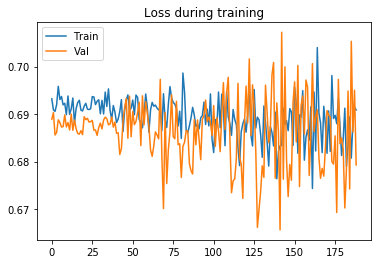

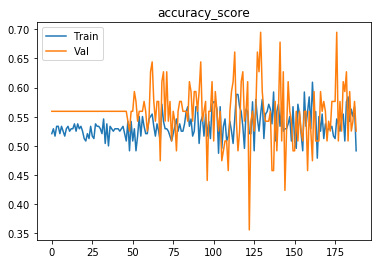

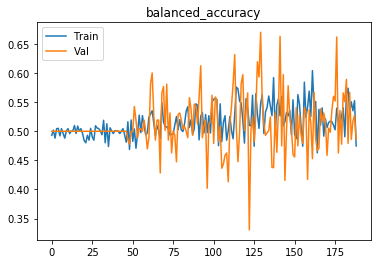

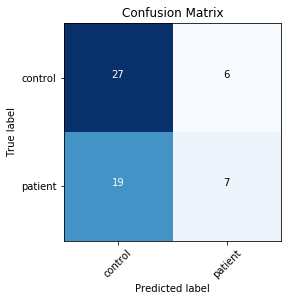

Finished outer fold.
{'final_acc': 0.58100233100233101, 'best_acc': 0.68648018648018649, 'final_iter': 173, 'best_iter': 123, 'params': {'model': 'ModelLiu', 'batch_size': 12, 'patience': 12, 'lr': 0.0001}, 'inner_fold_idx': 1}
################################
################################
All accuracies: [0.515625, 0.53125, 0.5, 0.47280092592592593, 0.50810185185185186, 0.53705882352941181, 0.4611764705882353, 0.58352941176470585, 0.51000000000000001, 0.57176470588235295, 0.51631701631701632, 0.51223776223776218, 0.5, 0.5, 0.5, 0.5, 0.70103686635944706, 0.5161290322580645, 0.53052995391705071, 0.5, 0.59722222222222221, 0.62152777777777779, 0.5, 0.49884259259259256, 0.6001157407407407, 0.6088709677419355, 0.5, 0.5714285714285714, 0.5, 0.5, 0.51494252873563218, 0.51551724137931032, 0.59540229885057472, 0.47988505747126436, 0.44597701149425284, 0.52916666666666667, 0.54464285714285721, 0.52261904761904765, 0.56547619047619058, 0.53273809523809523, 0.52130325814536338, 0.69110275689223

In [23]:
fold_metric, models = run(net=None, data=df,
                  k_folds=-1,
                  callbacks=None,
                  shape=-1,
                  masked=False,
                  metrics=metrics,
                  num_epochs=num_epochs,
                  retain_metric=retain_metric,
                  augmentations=augmentations,
                  b=None
                 )

print(np.mean(fold_metric))
print(np.std(fold_metric))

In [ ]:
5/0

ZeroDivisionError: division by zero

In [25]:
training_res = [{'final_acc': 0.50810185185185186, 'best_acc': 0.7158564814814814, 'final_iter': 185, 'best_iter': 141, 'params': {'model': 'ModelLiu', 'batch_size': 16, 'patience': 12, 'lr': 0.0001}, 'inner_fold_idx': 4}, {'final_acc': 0.58352941176470585, 'best_acc': 0.68647058823529417, 'final_iter': 190, 'best_iter': 178, 'params': {'model': 'ModelLiu', 'batch_size': 32, 'patience': 12, 'lr': 0.0001}, 'inner_fold_idx': 2}, {'final_acc': 0.5, 'best_acc': 0.6631701631701632, 'final_iter': 205, 'best_iter': 187, 'params': {'model': 'ModelLiu', 'batch_size': 32, 'patience': 16, 'lr': 0.0001}, 'inner_fold_idx': 4}, {'final_acc': 0.70103686635944706, 'best_acc': 0.75288018433179726, 'final_iter': 186, 'best_iter': 154, 'params': {'model': 'ModelLiu', 'batch_size': 16, 'patience': 16, 'lr': 0.0001}, 'inner_fold_idx': 1}, {'final_acc': 0.59722222222222221, 'best_acc': 0.64409722222222221, 'final_iter': 189, 'best_iter': 71, 'params': {'model': 'ModelLiu', 'batch_size': 12, 'patience': 12, 'lr': 5e-05}, 'inner_fold_idx': 0}, {'final_acc': 0.6088709677419355, 'best_acc': 0.6624423963133641, 'final_iter': 202, 'best_iter': 155, 'params': {'model': 'ModelLiu', 'batch_size': 16, 'patience': 12, 'lr': 0.0001}, 'inner_fold_idx': 0}, {'final_acc': 0.59540229885057472, 'best_acc': 0.64712643678160919, 'final_iter': 192, 'best_iter': 177, 'params': {'model': 'ModelLiu', 'batch_size': 32, 'patience': 16, 'lr': 0.0001}, 'inner_fold_idx': 2}, {'final_acc': 0.56547619047619058, 'best_acc': 0.72142857142857142, 'final_iter': 177, 'best_iter': 88, 'params': {'model': 'ModelLiu', 'batch_size': 16, 'patience': 16, 'lr': 0.0001}, 'inner_fold_idx': 3}, {'final_acc': 0.69110275689223055, 'best_acc': 0.71741854636591484, 'final_iter': 190, 'best_iter': 141, 'params': {'model': 'ModelLiu', 'batch_size': 12, 'patience': 16, 'lr': 0.0001}, 'inner_fold_idx': 1}, {'final_acc': 0.58100233100233101, 'best_acc': 0.68648018648018649, 'final_iter': 173, 'best_iter': 123, 'params': {'model': 'ModelLiu', 'batch_size': 12, 'patience': 12, 'lr': 0.0001}, 'inner_fold_idx': 1}]

In [31]:
print(len(training_res))
res_df = pd.DataFrame(training_res)

10


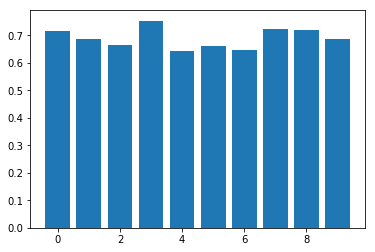

0.689737077681
0.593174489716


In [32]:
plt.bar(np.arange(len(res_df["best_acc"])), res_df["best_acc"])
plt.show()
print(np.mean(res_df["best_acc"]))
print(np.mean(res_df["final_acc"]))

In [33]:
print(np.mean(res_df["final_iter"]))

188.9


In [34]:
print(res_df["final_iter"])

0    185
1    190
2    205
3    186
4    189
5    202
6    192
7    177
8    190
9    173
Name: final_iter, dtype: int64


In [26]:
!ls $output_dir

outer_0_inner_0_cv_fold_0_BEST_ITERATION.h5
outer_0_inner_0_cv_fold_0_training_epoch_177_FINAL.h5
outer_0_inner_1_cv_fold_1_BEST_ITERATION.h5
outer_0_inner_1_cv_fold_1_training_epoch_179_FINAL.h5
outer_0_inner_2_cv_fold_2_BEST_ITERATION.h5
outer_0_inner_2_cv_fold_2_training_epoch_179_FINAL.h5
outer_0_inner_3_cv_fold_3_BEST_ITERATION.h5
outer_0_inner_3_cv_fold_3_training_epoch_174_FINAL.h5
outer_0_inner_4_cv_fold_4_BEST_ITERATION.h5
outer_0_inner_4_cv_fold_4_training_epoch_186_FINAL.h5
outer_1_inner_0_cv_fold_5_BEST_ITERATION.h5
outer_1_inner_0_cv_fold_5_training_epoch_193_FINAL.h5
outer_1_inner_1_cv_fold_6_BEST_ITERATION.h5
outer_1_inner_1_cv_fold_6_training_epoch_191_FINAL.h5
outer_1_inner_2_cv_fold_7_BEST_ITERATION.h5
outer_1_inner_2_cv_fold_7_training_epoch_191_FINAL.h5
outer_1_inner_3_cv_fold_8_BEST_ITERATION.h5
outer_1_inner_3_cv_fold_8_training_epoch_179_FINAL.h5
outer_1_inner_4_cv_fold_9_BEST_ITERATION.h5
outer_1_inner_4_cv_fold_9_training_epoch_180_FINAL.h5
outer_2_inner_0_cv_f

# Start inference

In [27]:
from collections import OrderedDict, Counter
from itertools import product

### Use majority vote of all patches to select prediction

In [28]:
def majority_vote_patches(img, net, gpu):
    # forward each patch per subject
    patch_preds = []
    avg_score = 0
    for i in range(img.shape[2]):
        patch = img[:,:,i].to(torch.device("cuda:" + str(gpu)))
        patch_output = net.forward(patch)
        patch_score = torch.sigmoid(patch_output)
        patch_pred = patch_score >= 0.5
        patch_preds.append(patch_pred.cpu().numpy().item())
        avg_score += patch_score.cpu().numpy().item()
    # take vote of predictions
    pred = Counter(patch_preds).most_common(1)[0][0]
    avg_score /= img.shape[2]
    return pred, avg_score

In [30]:
metrics = []
random_states = np.arange(20, 30) # important to use the same values as during training
maj_vote = True

for outer_fold, r in enumerate(random_states):
    print("Outer fold {}".format(outer_fold))

    all_scores = []
    all_preds = []
    all_labels = []
    
    train_res = training_res[outer_fold]
    model_dir = os.path.join(output_dir,"outer_{}_inner_{}_cv_fold_{}_BEST_ITERATION.h5".format(outer_fold, train_res["inner_fold_idx"], outer_fold * 5 + train_res["inner_fold_idx"]))
    model_name = train_res["params"]["model"]
    net = pick_model(model_name)
    state_dict = torch.load(model_dir, map_location='cpu')
    new_state_dict = OrderedDict()
    for param in state_dict.items():
        new_state_dict.update([(param[0].replace("module.", ""), param[1])])
    
    net.load_state_dict(new_state_dict)
    net = net.cuda(gpu)
    net.eval()
    
    # load data
    # separate new test set each run
    no_test_df = df.sample(frac=0.8, random_state=r) # split according 
    test_df = df[~df["PTID"].isin(no_test_df["PTID"])]

    if zero_one_normalize:
        intensity = IntensityRescale()
        ukb_data_test = UKBGDataset(test_df, transform=transforms.Compose([intensity]), mask=mask, patched=True, all_locs=True)
    else:
        ukb_data_test = UKBGDataset(test_df, transform=None, mask=mask, patched=True, all_locs=True)
        
    test_loader = DataLoader(
            ukb_data_test, batch_size=1, num_workers=0, shuffle=False
    )
    
    with torch.no_grad():
        for sample in test_loader:
            img = sample["image"]
            label = sample["label"]
            
            if maj_vote:
                pred, score = majority_vote_patches(img, net, gpu)
            else:
                img = img.to(torch.device("cuda:" + str(gpu)))
                output = net.forward(img)
                score = torch.sigmoid(output)
                pred = score >= 0.5
                score = score.numpy().item()
                pred = pred.numpy().item()
            
            all_scores.append(score)
            all_preds.append(pred)
            all_labels.append(label.numpy().item())
    
    balanced_acc = balanced_accuracy(all_labels, all_preds)
    roc_score = roc_auc_score(all_labels, all_scores)
    sens = sensitivity(all_labels, all_preds)
    spec = specificity(all_labels, all_preds)
    print("Bal. accuracy {:.3f} %".format(balanced_acc*100))
    print("ROC AUC Score {:.3f} %".format(roc_score*100))
    print("Sensitivity {:.3f} %".format(sens*100))
    print("Specificity {:.3f} %".format(spec*100))
    metrics.append([balanced_acc, roc_score, sens, spec])
# reset network to training mode6
net.train()
print("######## Final results ########")
metrics_df = pd.DataFrame(metrics, columns=["Bal Acc", "ROC AUC", "Sensitivity", "Specificity"])
print(metrics_df)
print("Balanced accuracy mean {:.3f} %".format(np.mean(metrics_df["Bal Acc"])*100))
print("ROC AUC mean {:.3f} %".format(np.mean(metrics_df["ROC AUC"])*100))
print("Sensitivity mean {:.3f} %".format(np.mean(metrics_df["Sensitivity"])*100))
print("Specificity mean {:.3f} %".format(np.mean(metrics_df["Specificity"])*100))

Outer fold 0


/home/fabiane/anaconda2/envs/mort1/lib/python3.6/site-packages/torch/nn/functional.py:1320: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")


Bal. accuracy 52.106 %
ROC AUC Score 71.840 %
Sensitivity 9.091 %
Specificity 95.122 %
Outer fold 1
Bal. accuracy 53.223 %
ROC AUC Score 61.465 %
Sensitivity 62.857 %
Specificity 43.590 %
Outer fold 2
Bal. accuracy 60.789 %
ROC AUC Score 73.289 %
Sensitivity 30.952 %
Specificity 90.625 %
Outer fold 3
Bal. accuracy 49.372 %
ROC AUC Score 66.371 %
Sensitivity 6.061 %
Specificity 92.683 %
Outer fold 4
Bal. accuracy 51.176 %
ROC AUC Score 62.868 %
Sensitivity 32.353 %
Specificity 70.000 %
Outer fold 5
Bal. accuracy 54.242 %
ROC AUC Score 60.985 %
Sensitivity 31.818 %
Specificity 76.667 %
Outer fold 6
Bal. accuracy 53.676 %
ROC AUC Score 65.154 %
Sensitivity 9.677 %
Specificity 97.674 %
Outer fold 7
Bal. accuracy 58.015 %
ROC AUC Score 58.235 %
Sensitivity 73.529 %
Specificity 42.500 %
Outer fold 8
Bal. accuracy 65.147 %
ROC AUC Score 70.000 %
Sensitivity 85.294 %
Specificity 45.000 %
Outer fold 9
Bal. accuracy 54.651 %
ROC AUC Score 62.941 %
Sensitivity 100.000 %
Specificity 9.302 %
######